In [9]:
import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '0'
import sys
import time
import random
import h5py
from PIL import Image, ImageFilter, ImageDraw

from typing import List, Tuple
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib_inline.backend_inline import set_matplotlib_formats
import seaborn as sns
import torch
import torch.nn as nn
from torch.optim import Optimizer
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from torch.utils.data import DataLoader, Dataset, random_split, Subset
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix, classification_report, precision_recall_fscore_support
from sklearn.utils.class_weight import compute_class_weight
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset
import torch.nn.functional as F

set_matplotlib_formats("svg")
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (10, 5)


# VIT
from transformers import ViTForImageClassification, ViTModel, AutoConfig, ViTConfig
from pathlib import Path

# deepface
from deepface import DeepFace
from tqdm import tqdm
import cv2
from concurrent.futures import ThreadPoolExecutor, as_completed

# rf
import xgboost as xgb

# sys.path.append('model/base_models/')
# from train_evaluate_utils import create_dataloaders, train_and_validate, plot_metrics, evaluate_model, calculate_and_plot_metrics

# import optuna

In [6]:
results_df = pd.DataFrame(columns=['Dataset', 'Model Architecture', 'Training Type', 'Classifier Type', 
                                   'Accuracy', 'Precision', 'Recall', 'F1 Score'])

# Needed Variables / Classes

In [139]:
models.efficientnet_b0

# Generate Embeddings

In [113]:
print(f"Results for {DATASET_NAME.capitalize()} using {TRAINING_TYPE} embeddings of {MODEL_ARCH.capitalize()}, and training on a {CLASSIFIER}")
accuracy, precision, recall, f1 = calculate_and_plot_metrics(*results)

NameError: name 'DATASET_NAME' is not defined

In [114]:
def append_results(df, dataset, model_arch, training_type, classifier_type, 
                   accuracy, precision, recall, f1):

    dataset = dataset.capitalize()
    model_arch = (
        "ResNet18" if model_arch == "resnet" 
        else "VisionTransformer" if model_arch =="vit" 
        else "DeepFace" if model_arch =="deepface" else NOne)
    
    training_type = (
        "Full Layer Training" if training_type=="full"
        else "Partial Layer Training" if training_type=="partial" else None)
    classifier_type = (
        "Neural Network" if classifier_type =="NN"
        else "Support Vector Machine" if classifier_type =="SVM"
        else "Random Forest" if classifier_type=="RF" else None)
    
    new_row = {
        'Dataset': dataset,
        'Model Architecture': model_arch, 
        'Training Type': training_type, 
        'Classifier Type': classifier_type, 
        'Accuracy': accuracy, 
        'Precision': precision, 
        'Recall': recall, 
        'F1 Score': f1, 
#         'Training Time': training_time, 
#         'Inference Time': inference_time
    }
    
    df = pd.concat([df, pd.DataFrame([new_row])], ignore_index=True)

    return df

In [115]:
# results_df = append_results(
#     results_df,
#     DATASET_NAME, MODEL_ARCH, TRAINING_TYPE, CLASSIFIER,
#     accuracy, precision, recall, f1_score
# )

In [463]:
args = {
    "dataset_name": "dartmouth", # fer, dartmouth
    "training_type": "full", # full, partial
    "model_arch": "vit", # resnet, vit, efficientnet
    "classifier": "CNN", # NN, SVM, RF, CNN (no valid model_arch/training_type if CNN)
    "augment_data": True, # True, False
}

# dataset = PytorchDataset(
#     range(100),
#     filepaths[args["dataset_name"]]["hdf5_path"], 
#     grayscale=(args["dataset_name"] == "fer"), 
#     augment_training=True)


# random_indices = random.sample(range(6366*2), 5)

# plt.figure(figsize=(15, 3))  
# for i, idx in enumerate(random_indices, 1):
#     img, label = dataset.__getitem__(idx)
#     img = np.array(img).transpose((1, 2, 0))
#     img = np.clip(img, 0, 1)
#     print(label)
    
#     plt.subplot(1, 5, i)  
#     plt.imshow(img)
#     plt.title(f"Index: {idx}")
#     plt.axis('off')

# plt.show()

In [551]:
filepaths = {
    "dartmouth": {
        'hdf5_path': f"data/dartmouth/dartmouth_preprocessed.h5",
        'csv_path': f"data/dartmouth/dartmouth48x48.csv",
    },
    "fer": {
        'hdf5_path': f"data/fer/fer_preprocessed.h5",
        'csv_path': f"data/fer/fer48x48.csv",
    }
}


config = {
    "batch_size": 64,
    "model": {
        "CNN": {
            "learning_rate": 0.001,
            "num_epochs": 75,
            "L2_regularization": 0.0001,
            "early_stopping_rounds": 10,
            "num_classes": 10,
            "input_size": (224, 224),
            "batch_size": 64,
        },
        "resnet": {
            "model_name": "resnet18",
            "unfreeze_layers": ["layer4", "fc"],
            "NN": {
                "learning_rate": 0.0001,
                "num_epochs": 200,
                "L2_regularization": 0.001,
                "early_stopping_rounds": 10
            },
            "SVM": {
                "learning_rate": 0.01,
                "num_epochs": 200,
                "L2_regularization": 0.001,
                "early_stopping_rounds": 10
            },
            "RF": {
                "num_trees": 100,
                "max_depth": 6,
                "num_epochs": 200,
                "early_stopping_rounds": 35,
                "objective": "multi:softprob",
                "num_classes": 7,
                "eval_metric": "mlogloss",
                "use_label_encoder": False
            }
        },
        "vit": {
            "model_name": "google/vit-base-patch16-224-in21k",
            "unfreeze_layers": ["layer.10", "layer.11", "head"],
            "NN": {
                "learning_rate": 0.0001,
                "num_epochs": 200,
                "L2_regularization": 0.0001,
                "early_stopping_rounds": 10
            },
            "SVM": {
                "learning_rate": 0.01,
                "num_epochs": 200,
                "L2_regularization": 0.0001,
                "early_stopping_rounds": 10
            },
            "RF": {
                "num_trees": 100,
                "max_depth": 6,
                "num_epochs": 200,
                "early_stopping_rounds": 35,
                "objective": "multi:softprob",
                "num_classes": 7,
                "eval_metric": "mlogloss",
                "use_label_encoder": False
            }
        },
        "efficientnet": {
            "model_name": "efficientnet_b0",
            "unfreeze_layers": ["features", "classifier"],
            "NN": {
                "learning_rate": 0.0001,
                "num_epochs": 200,
                "L2_regularization": 0.001,
                "early_stopping_rounds": 10
            },
            "SVM": {
                "learning_rate": 0.00005,
                "num_epochs": 200,
                "L2_regularization": 0.001,
                "early_stopping_rounds": 7
            },
            "RF": {
                "num_trees": 100,
                "max_depth": 6,
                "num_epochs": 200,
                "early_stopping_rounds": 35,
                "objective": "multi:softprob",
                "num_classes": 7,
                "eval_metric": "mlogloss",
                "use_label_encoder": False
            }
        }
    },
}
config["device"] = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# config["device"] = torch.device("cpu")

In [549]:
class PytorchDataset(Dataset):
#     def __init__(self, hdf5_filename: str, indices: np.ndarray, grayscale: bool = False, augment_training: bool = False):
    def __init__(self, images: np.ndarray, labels: np.ndarray, grayscale: bool = False, augment_training: bool = False):

        self.images = torch.tensor(images, dtype=torch.float32)
        self.labels = torch.tensor(labels, dtype=torch.long)
        self.grayscale = grayscale
        self.augment_training = augment_training  # Rename for clarity
#         self.is_training = augment_training  # Indicator if this instance is for training
        self.eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
        self.transform = self.build_transforms()
        self.augment_transform = self.build_augment_transforms() if augment_training else None
        
    def __len__(self) -> int:
        return len(self.labels) * 2 if self.augment_training else len(self.labels)
    
    def __getitem__(self, idx: int) -> Tuple[torch.Tensor, torch.Tensor]:
        is_augmented = self.augment_training and idx >= len(self.labels)
        actual_idx = idx % len(self.labels)
        
        image = self.images[actual_idx]
        if is_augmented:
            image = self.augment_transform(image)
        else:
            image = self.transform(image)
        label = self.labels[actual_idx]
        return image, label
    
        
    def build_transforms(self) -> transforms.Compose:
        """Builds the basic transformation pipeline."""
        transform_list = [
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.Grayscale(num_output_channels=3) if self.grayscale else transforms.Lambda(lambda x: x),
            transforms.ToTensor(),
        ]
        return transforms.Compose(transform_list)
    
    def build_augment_transforms(self) -> transforms.Compose:
        """Builds the augmentation transformation pipeline."""
        augment_list = [
            transforms.ToPILImage(),
            transforms.Resize((224, 224)),
            transforms.Grayscale(num_output_channels=3) if self.grayscale else transforms.Lambda(lambda x: x),
            transforms.Lambda(lambda img: self.apply_occlusion(img)),
            transforms.ColorJitter(brightness=(0.3, 0.9)),
            transforms.ToTensor(),
        ]
        return transforms.Compose(augment_list)
    
    def apply_occlusion(self, image: Image.Image) -> Image.Image:
        """Applies occlusion to the image based on detected eyes."""
        cv_image = np.array(image)  # Convert PIL Image to numpy array for OpenCV processing
        cv_image_gray = cv2.cvtColor(cv_image, cv2.COLOR_RGB2GRAY)
        eyes = self.eye_cascade.detectMultiScale(cv_image_gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
        shrink_factor = 0.5

        for (ex, ey, ew, eh) in eyes:
            new_ew, new_eh = int(ew * shrink_factor), int(eh * shrink_factor)
            new_ex, new_ey = ex + (ew - new_ew) // 2, ey + (eh - new_eh) // 2
            cv2.rectangle(cv_image, (new_ex, new_ey), (new_ex + new_ew, new_ey + new_eh), (0, 0, 0), -1)

        return Image.fromarray(cv_image)

In [530]:
# class PytorchDataset(Dataset):
#     def __init__(self, hdf5_filename: str, indices: np.ndarray, grayscale: bool = False, augment_training: bool = False):
#         self.file = h5py.File(hdf5_filename, 'r')
#         self.indices = indices
#         self.grayscale = grayscale
#         self.augment_training = augment_training  # Rename for clarity
#         self.is_training = augment_training  # Indicator if this instance is for training
#         self.eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
#         self.transform = self.build_transforms()
#         self.augment_transform = self.build_augment_transforms()
        
#     def __len__(self) -> int:
#         if self.is_training:
#             # Double the dataset size for training because we'll have both original and augmented images
#             return len(self.indices) * 2
#         else:
#             return len(self.indices)
    
#     def __getitem__(self, idx: int) -> Tuple[torch.Tensor, torch.Tensor]:
#         if self.is_training and idx >= len(self.indices):
#             # Handle augmented images
#             actual_idx = self.indices[idx % len(self.indices)]
#             image = torch.tensor(self.file['images'][actual_idx], dtype=torch.float32)
#             image = self.augment_transform(image)  # Apply augmentation
#         else:
#             # Handle original images
#             actual_idx = self.indices[idx]
#             image = torch.tensor(self.file['images'][actual_idx], dtype=torch.float32)
#             image = self.transform(image)
        
#         label = torch.tensor(self.file['labels'][actual_idx], dtype=torch.long)
#         return image, label
    
        
#     def build_transforms(self) -> transforms.Compose:
#         """Builds the basic transformation pipeline."""
#         transform_list = [
#             transforms.ToPILImage(),
#             transforms.Resize((224, 224)),
#             transforms.Grayscale(num_output_channels=3) if self.grayscale else transforms.Lambda(lambda x: x),
#             transforms.ToTensor(),
#         ]
#         return transforms.Compose(transform_list)
    
#     def build_augment_transforms(self) -> transforms.Compose:
#         """Builds the augmentation transformation pipeline."""
#         augment_list = [
#             transforms.ToPILImage(),
#             transforms.Resize((224, 224)),
#             transforms.Grayscale(num_output_channels=3) if self.grayscale else transforms.Lambda(lambda x: x),
#             transforms.Lambda(lambda img: self.apply_occlusion(img)),
#             transforms.ColorJitter(brightness=(0.3, 0.9)),
#             transforms.ToTensor(),
#         ]
#         return transforms.Compose(augment_list)
    
#     def apply_occlusion(self, image: Image.Image) -> Image.Image:
#         """Applies occlusion to the image based on detected eyes."""
#         cv_image = np.array(image)  # Convert PIL Image to numpy array for OpenCV processing
#         cv_image_gray = cv2.cvtColor(cv_image, cv2.COLOR_RGB2GRAY)
#         eyes = self.eye_cascade.detectMultiScale(cv_image_gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
#         shrink_factor = 0.5

#         for (ex, ey, ew, eh) in eyes:
#             new_ew, new_eh = int(ew * shrink_factor), int(eh * shrink_factor)
#             new_ex, new_ey = ex + (ew - new_ew) // 2, ey + (eh - new_eh) // 2
#             cv2.rectangle(cv_image, (new_ex, new_ey), (new_ex + new_ew, new_ey + new_eh), (0, 0, 0), -1)

#         return Image.fromarray(cv_image)

In [531]:
class FeatureExtractor:
    def __init__(self, model_name, batch_size, training_type, unfreeze_layers, device):
        self.model_name = model_name
        self.batch_size = batch_size
        self.training_type = training_type
        self.unfreeze_layers = unfreeze_layers
        self.device = device
    
    def extract_and_save_embeddings(self, dataset, output_path_embeddings, output_path_labels):
        
            self.model.eval()  
            loader = DataLoader(dataset, batch_size=self.batch_size, shuffle=False, num_workers=4)
            embeddings, labels = [], []
            
            with torch.no_grad():
                for images, label in loader:
                    images = images.to(self.device)
                    output = self.extract_features(images)  # Ensure subclasses implement this method
                    embeddings.append(output.cpu().numpy())
                    labels.append(label.cpu().numpy())

            embeddings = np.concatenate(embeddings, axis=0)
            labels = np.concatenate(labels, axis=0)
            np.save(output_path_embeddings, embeddings)
            np.save(output_path_labels, labels)
            print(f"Embeddings and labels saved to {output_path_embeddings} and {output_path_labels}")
            return embeddings, labels
        

In [532]:
class ResNetFeatureExtractor(FeatureExtractor):
    def __init__(self, model_name, batch_size, training_type, unfreeze_layers, device):
        super().__init__(model_name, batch_size, training_type, unfreeze_layers, device)
        self.model = self.initialize_model()

    def initialize_model(self):

        model = getattr(models, self.model_name)(pretrained=True)
        
        if self.training_type == "full":
            model.fc = nn.Identity()
        elif self.training_type == "partial":
            for param in model.parameters():
                param.requires_grad = False
            for layer_name in self.unfreeze_layers:
                for name, param in model.named_parameters():
                    if name.startswith(layer_name):
                        param.requires_grad = True
            model.fc = nn.Identity()
        return model.to(self.device)
    
    def extract_features(self, images):
        return self.model(images)

In [533]:
class VITFeatureExtractor(FeatureExtractor):
    def __init__(self, model_name, batch_size, training_type, unfreeze_layers, device):
        super().__init__(model_name, batch_size, training_type, unfreeze_layers, device)
        self.model = self.initialize_model()


    def initialize_model(self):
        
        config_vit = ViTConfig.from_pretrained(self.model_name)
        model = ViTModel.from_pretrained(self.model_name, config=config_vit)
        
        if self.training_type == "full":
            model.head = nn.Identity()
        elif self.training_type == "partial":
            for param in model.parameters():
                param.requires_grad = False
            for layer_name in self.unfreeze_layers:
                for name, param in model.named_parameters():
                    if name.startswith(layer_name):
                        param.requires_grad = True
            model.head = nn.Identity()
        return model.to(self.device)
    
    def extract_features(self, images):
        outputs = self.model(pixel_values=images)
        return outputs.last_hidden_state[:, 0, :]  # [CLS] token representation

In [534]:
class EfficientNetFeatureExtractor(FeatureExtractor):
    def __init__(self, model_name, batch_size, training_type, unfreeze_layers, device):
        super().__init__(model_name, batch_size, training_type, unfreeze_layers, device)
        self.model = self.initialize_model()

    def initialize_model(self):
        # Load the EfficientNet model
        model = getattr(models, self.model_name)(pretrained=True)

        # Modify the model for feature extraction
        if self.training_type == "full":
            # Replace the classifier layer with an Identity layer
            model.classifier[1] = nn.Identity()
        elif self.training_type == "partial":
            # Freeze all the parameters for feature extraction
            for param in model.parameters():
                param.requires_grad = False
            
            # Unfreeze the specified layers
            for layer_name in self.unfreeze_layers:
                layer = dict([*model.named_children()])[layer_name]
                for param in layer.parameters():
                    param.requires_grad = True

            # Also replace the classifier layer with an Identity layer for embedding extraction
            model.classifier[1] = nn.Identity()

        return model.to(self.device)
    
    def extract_features(self, images):
        # Forward pass to extract features
        return self.model(images)

In [535]:
class BaseClassifier:
    def __init__(self, config, model_architecture, classifier):
        self.config = config
        self.emotion_labels = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
        if not model_architecture:
            self.model_config = config["model"][classifier]
        else:
            self.model_config = config["model"][model_architecture][classifier]
        self.model = None

    def create_dataloaders(self, embeddings, labels):
        raise NotImplementedError("This method should be implemented by subclasses.")

    def train_and_validate(self, train_loader, val_loader, num_epochs):
        raise NotImplementedError("This method should be implemented by subclasses.")

    def evaluate_model(self, test_loader):
        raise NotImplementedError("This method should be implemented by subclasses.")



In [536]:
class TorchModel(BaseClassifier):
    def __init__(self, config, model_architecture, classifier):
        super().__init__(config, model_architecture, classifier)
        
        self.model = None
        self.criterion = None
        self.optimizer = None
        self.device = config['device']
        self.scheduler = None
        
    def setup(self, model, criterion, optimizer):
        self.model = model.to(self.device)
        self.criterion = criterion
        self.optimizer = optimizer
        self.scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            self.optimizer, mode='min', factor=0.1, patience=5, verbose=True
        )
        
    def create_dataloaders(self, data, train_size=0.7, random_state=42):
        
        train_dataset = TensorDataset(torch.tensor(data["embeddings_train"], dtype=torch.float), torch.tensor(data["labels_train"], dtype=torch.long))
        val_dataset = TensorDataset(torch.tensor(data["embeddings_val"], dtype=torch.float), torch.tensor(data["labels_val"], dtype=torch.long))
        test_dataset = TensorDataset(torch.tensor(data["embeddings_test"], dtype=torch.float), torch.tensor(data["labels_test"], dtype=torch.long))
        
        train_loader = DataLoader(train_dataset, batch_size=self.config["batch_size"], shuffle=True, num_workers=4)
        val_loader = DataLoader(val_dataset, batch_size=self.config["batch_size"], shuffle=False, num_workers=4)
        test_loader = DataLoader(test_dataset, batch_size=self.config["batch_size"], shuffle=False, num_workers=4)
        
        return train_loader, val_loader, test_loader
        
    
    def train_and_validate(self, train_loader, val_loader, num_epochs):
        train_losses, train_accuracies, val_losses, val_accuracies = [], [], [], []
        
        early_stopping_counter = 0
        best_val_loss = float('inf')
        for epoch in range(num_epochs):
            epoch_start_time = time.time()

            # Training Phase
            train_loss, train_accuracy = self.run_epoch(train_loader, is_training=True)
            train_losses.append(train_loss)
            train_accuracies.append(train_accuracy)

            # Validation Phase
            val_loss, val_accuracy = self.run_epoch(val_loader, is_training=False)
            val_losses.append(val_loss)
            val_accuracies.append(val_accuracy)
            
            self.scheduler.step(val_loss)
            
            epoch_end_time = time.time()
            epoch_duration = epoch_end_time - epoch_start_time
            
            print(f"Epoch: {epoch+1}/{num_epochs}")
            print(f"Training - Loss: {train_loss:.4f}, Accuracy: {train_accuracy:.4f}")
            print(f"Validation - Loss: {val_loss:.4f}, Accuracy: {val_accuracy:.4f}")
            print(f"Time taken: {epoch_duration:.2f} seconds")
            print("-" * 50)
            
            if val_loss < best_val_loss:
                best_val_loss = val_loss
                early_stopping_counter = 0
                
            else:
                early_stopping_counter += 1
                print(f"Epoch {epoch+1}: No improvement in validation loss for {early_stopping_counter} epochs.")

            if early_stopping_counter >= self.model_config["early_stopping_rounds"]:
                print(f"Stopping early after {epoch+1} epochs due to no improvement in validation loss.")
                break

        
        self.plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies)
        return np.array(val_accuracies).max()

    def run_epoch(self, loader, is_training):
        if is_training:
            self.model.train()
        else:
            self.model.eval()

        total_loss, total_correct, total_samples = 0, 0, 0
        for images, labels in loader:
            images, labels = images.to(self.device), labels.to(self.device)

            if is_training:
                self.optimizer.zero_grad()

            output = self.model(images)
            loss = self.criterion(output, labels)

            if is_training:
                loss.backward()
                self.optimizer.step()

            total_loss += loss.item() * images.size(0)
            _, predicted = torch.max(output, 1)
            total_correct += (predicted == labels).sum().item()
            total_samples += labels.size(0)

        avg_loss = total_loss / total_samples
        avg_accuracy = total_correct / total_samples

        return avg_loss, avg_accuracy
    
    def evaluate_model(self, test_loader, class_names):
        self.model.eval()
        all_predictions, all_labels = [], []

        with torch.no_grad():
            for images, labels in test_loader:
                images, labels = images.to(self.device), labels.to(self.device)
                outputs = self.model(images)
                _, predicted = torch.max(outputs, 1)

                all_labels.extend(labels.cpu().numpy())
                all_predictions.extend(predicted.cpu().numpy())

        # Now all_predictions and all_labels can be used with calculate_and_plot_metrics
        metrics = self.calculate_and_plot_metrics(all_labels, all_predictions, class_names)
        return metrics
#         return all_labels, all_predictions
    

    def plot_metrics(self, train_losses, val_losses, train_accuracies, val_accuracies):
        plt.figure(figsize=(12, 5))

        # Training and Validation Loss
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, label='Training Loss')
        plt.plot(val_losses, label='Validation Loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        # Training and Validation Accuracy
        plt.subplot(1, 2, 2)
        plt.plot(train_accuracies, label='Training Accuracy')
        plt.plot(val_accuracies, label='Validation Accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.show()

    def calculate_and_plot_metrics(self, all_labels, all_predictions, class_names):
        accuracy = np.sum(np.array(all_labels) == np.array(all_predictions)) / len(all_labels)
        print(f"Test Accuracy: {accuracy * 100:.2f}%")

        cm = confusion_matrix(all_labels, all_predictions)
        cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        report = classification_report(all_labels, all_predictions, target_names=class_names)
        print(report)

        precision, recall, f1_score, _ = precision_recall_fscore_support(all_labels, all_predictions, average='weighted')
        print(f"Precision: {precision:.2f}, Recall: {recall:.2f}, F1 Score: {f1_score:.2f}")

        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax1)
        ax1.set_title('Confusion Matrix')
        ax1.set_xlabel('Predicted')
        ax1.set_ylabel('True')

        sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax2)
        ax2.set_title('Normalized Confusion Matrix')
        ax2.set_xlabel('Predicted')
        ax2.set_ylabel('True')

        plt.tight_layout()
        plt.show()

        return accuracy, precision, recall, f1_score

In [537]:
class NN(TorchModel):
    def __init__(self, config, model_architecture, classifier, input_size, num_classes=7, dropout_rate=0.5):
        super().__init__(config, model_architecture, classifier)
        self.model = EmotionNN(input_size, num_classes, dropout_rate)
        self.setup_model(model_architecture)

    def setup_model(self, model_architecture):
        criterion = nn.CrossEntropyLoss(weight=self.model_config.get('class_weights', None))
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.model_config['learning_rate'], weight_decay=self.model_config.get('L2_regularization', 0))

        self.setup(self.model, criterion, optimizer)

class EmotionNN(nn.Module):
    def __init__(self, input_size, num_classes=7, dropout_rate=0.5):
        super(EmotionNN, self).__init__()
        self.fc1 = nn.Linear(input_size, 256)
        self.dropout1 = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(256, 128)
        self.dropout2 = nn.Dropout(dropout_rate)
        self.fc3 = nn.Linear(128, num_classes)
        
        
        
#         self.fc3 = nn.Linear(128, 64)
#         self.dropout3 = nn.Dropout(dropout_rate)
#         self.fc4 = nn.Linear(128, num_classes)
        

        # Initialize layers' weights
        torch.nn.init.xavier_uniform_(self.fc1.weight)
        torch.nn.init.xavier_uniform_(self.fc2.weight)
        torch.nn.init.xavier_uniform_(self.fc3.weight)
        
#         torch.nn.init.xavier_uniform_(self.fc4.weight)

    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = self.dropout1(x)
        x = F.relu(self.fc2(x))
        x = self.dropout2(x)
        x = self.fc3(x)

#         x = self.dropout3(x)
#         x = F.relu(self.fc3(x))
#         x = self.fc4(x)
        return x

In [538]:
class SVMModel(TorchModel):
    def __init__(self, config, model_architecture, classifier, input_size, num_classes=7):
        super().__init__(config, model_architecture, classifier)
        self.model = EmotionSVM(input_size, num_classes)
        self.setup_model(model_architecture)

    def setup_model(self, model_architecture):
        criterion = nn.MultiMarginLoss()  
        optimizer = torch.optim.SGD(self.model.parameters(), lr=self.model_config['learning_rate'], weight_decay=self.model_config.get('L2_regularization', 0))
        self.setup(self.model, criterion, optimizer)

class EmotionSVM(nn.Module):
    def __init__(self, input_size, num_classes=7):
        super(EmotionSVM, self).__init__()
        self.fc = nn.Linear(input_size, num_classes)
    
    def forward(self, x):
        return self.fc(x)

In [539]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=7):  # Fixed input size of 3, 224, 224
        super(SimpleCNN, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)

        # After 3 pooling layers, the size is 224 / 2 / 2 / 2 = 28
        # So the output from the conv layers is 128 channels at 28x28 spatial size
        self.fc1 = nn.Linear(128 * 28 * 28, 512)
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        x = x.view(-1, 128 * 28 * 28)  # Flatten the output for the fully connected layer
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

class CNNEncoder(TorchModel):
    def __init__(self, config, model_architecture, classifier, input_size, num_classes=7):
        super().__init__(config, model_architecture, classifier)
        self.model = SimpleCNN(num_classes=num_classes)
        self.setup_model()
        
    def setup_model(self):
        criterion = nn.CrossEntropyLoss()
        optimizer = torch.optim.Adam(self.model.parameters(), lr=0.001)
        self.setup(self.model, criterion, optimizer)
    
    def create_dataloaders(self, datasets, train_size=0.7, random_state=42):
        train_dataset, val_dataset, test_dataset = datasets["train"],datasets["val"], datasets["test"]
        train_loader = DataLoader(train_dataset, batch_size=self.model_config["batch_size"], shuffle=True, num_workers=4)
        val_loader = DataLoader(val_dataset, batch_size=self.model_config["batch_size"], shuffle=False, num_workers=4)
        test_loader = DataLoader(test_dataset, batch_size=self.model_config["batch_size"], shuffle=False, num_workers=4)
        return train_loader, val_loader, test_loader
        
        
        


In [540]:
class RandomForestModel(BaseClassifier):
    def __init__(self, config, model_architecture, classifier, num_classes=7):
        super().__init__(config, model_architecture, classifier)
        self.config = config
        self.num_classes = num_classes
        self.model = None  # Placeholder for the trained model
        
    def create_dataloaders(self, data, train_size=0.7, random_state=42):
        
        X_train, y_train = data["embeddings_train"], data["labels_train"]
        X_val, y_val = data["embeddings_val"], data["labels_val"]
        X_test, y_test = data["embeddings_test"], data["labels_test"]
        
        train_loader = (X_train, y_train)
        val_loader = (X_val, y_val)
        test_loader = (X_test, y_test)
        return train_loader, val_loader, test_loader

    def train_and_validate(self, train_loader, val_loader, num_epochs):
        X_train, y_train = train_loader
        X_val, y_val = val_loader
        
        dtrain = xgb.DMatrix(X_train, label=y_train)
        dval = xgb.DMatrix(X_val, label=y_val)
        params = {
            'objective': 'multi:softmax',
            'num_class': self.num_classes,
            'tree_method': 'gpu_hist',  # Example parameter, adjust based on your setup
        }
        evals = [(dtrain, 'train'), (dval, 'eval')]
        self.model = xgb.train(params, dtrain, num_boost_round=num_epochs, evals=evals, early_stopping_rounds=self.model_config['early_stopping_rounds'])

    def plot_confusion_matrix(self, y_true, y_pred, class_names):
        """Plots the confusion matrix."""
        cm = confusion_matrix(y_true, y_pred)
        cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax1)
        ax1.set_title('Confusion Matrix')
        ax1.set_xlabel('Predicted')
        ax1.set_ylabel('True')

        sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', xticklabels=class_names, yticklabels=class_names, ax=ax2)
        ax2.set_title('Normalized Confusion Matrix')
        ax2.set_xlabel('Predicted')
        ax2.set_ylabel('True')

        plt.tight_layout()
        plt.show()

    def plot_feature_importances(self):
        """Plots feature importances of the model."""
        importances = self.model.get_score(importance_type='weight')
        sorted_importances = sorted(importances.items(), key=lambda x: x[1], reverse=True)
        keys = [item[0] for item in sorted_importances][:20]
        values = [item[1] for item in sorted_importances][:20]
        
        fig, ax = plt.subplots(figsize=(8, 6))
        sns.barplot(x=values, y=keys)
        plt.title('Feature Importances')
        plt.show()

    def evaluate_model(self, test_loader, class_names):
        """Evaluates the model on the test set and plots evaluation metrics."""
#         from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
        X_test, y_test = test_loader
        dtest = xgb.DMatrix(X_test)
        y_pred = self.model.predict(dtest)
        accuracy = accuracy_score(y_test, y_pred)
        
        print(f"Test Accuracy: {accuracy:.4f}")
        print(classification_report(y_test, y_pred, target_names=class_names))
        
        self.plot_confusion_matrix(y_test, y_pred, class_names)
        self.plot_feature_importances()
        
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred, average='macro')
        recall = recall_score(y_test, y_pred, average='macro')
        f1 = f1_score(y_test, y_pred, average='macro')
        return accuracy, precision, recall, f1

In [541]:
def generate_paths(args, segment):
    augmentation_suffix = 'augmented' if args["augment_data"] and segment == 'train' else 'original'
    output_path_embeddings = f"data/{args['dataset_name']}/{args['dataset_name']}_{args['model_arch']}_{args['training_type']}_{segment}_{augmentation_suffix}_embeddings.npy"
    output_path_labels = f"data/{args['dataset_name']}/{args['dataset_name']}_{args['model_arch']}_{args['training_type']}_{segment}_{augmentation_suffix}_labels.npy"
    return output_path_embeddings, output_path_labels


def get_feature_extractor(model_arch, model_name, batch_size, training_type, unfreeze_layers, device):
    if model_arch == "resnet":
        feature_extractor = ResNetFeatureExtractor(model_name, batch_size, training_type, unfreeze_layers, device)
    elif model_arch == "vit":
        feature_extractor = VITFeatureExtractor(model_name, batch_size, training_type, unfreeze_layers, device)
    elif model_arch == "efficientnet":
        feature_extractor = EfficientNetFeatureExtractor(model_name, batch_size, training_type, unfreeze_layers, device)
    return feature_extractor

def get_model(args, config, labels=None):
    model_arch = args["model_arch"]
    classifier = args["classifier"]
    input_size = 512 if model_arch == "resnet" else 768 if model_arch == "vit" else 1280 if model_arch == "efficientnet" else None
    num_classes = 7  
    
    if classifier == "NN":
        model = NN(config, model_arch, classifier, input_size, num_classes=num_classes)
        weights = compute_class_weight(class_weight='balanced', classes=np.unique(labels), y=labels)
        weights_tensor = torch.tensor(weights, dtype=torch.float).to(config['device'])
        loss_function = nn.CrossEntropyLoss(weight=weights_tensor)
        model.setup(model.model, loss_function, model.optimizer)
    elif classifier == "SVM":
        model = SVMModel(config, model_arch, classifier, input_size, num_classes=num_classes)
    elif classifier == "CNN":
        model_arch = None
        model = CNNEncoder(config, model_arch, classifier, config["model"][classifier]["input_size"])
    else:  
        model = RandomForestModel(config, model_arch, classifier, num_classes=num_classes)
        
    return model

def split_dataset(hdf5_filename, dataset_name, augment_data, 
                  train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):
    with h5py.File(hdf5_filename, 'r') as file:
        images = file['images'][:]
        labels = file['labels'][:]
        
    total_images = len(labels)
    indices = np.arange(total_images)
    np.random.shuffle(indices)
    
    train_end = int(train_ratio * total_images)
    val_end = train_end + int(val_ratio * total_images)
    
    train_images, train_labels = images[indices[:train_end]], labels[indices[:train_end]]
    val_images, val_labels = images[indices[train_end:val_end]], labels[indices[train_end:val_end]]
    test_images, test_labels = images[indices[val_end:]], labels[indices[val_end:]]
    
    datasets = {
        "train": PytorchDataset(train_images, train_labels, grayscale=(dataset_name=="fer"), 
                                augment_training=(augment_data)),
        "val": PytorchDataset(val_images, val_labels, grayscale=(dataset_name=="fer"), 
                              augment_training=False),
        "test": PytorchDataset(test_images, test_labels, grayscale=(dataset_name=="fer"), 
                               augment_training=False)
    }
    
    return datasets
    

In [542]:
def run(args, config):
    
    model_arch = args["model_arch"]
    classifier = args["classifier"]
    training_type = args["training_type"]
    dataset_name = args["dataset_name"]

    print(f"Loading dataset from {filepaths[args['dataset_name']]['hdf5_path']}...")    
    dataset_path = filepaths[args["dataset_name"]]["hdf5_path"]
    datasets = split_dataset(dataset_path, dataset_name, args["augment_data"])
    
    if classifier in ["CNN", "RNG"]:
        final_str = f"Here are results for {classifier} on the {dataset_name} dataset"
        num_epochs = config['model']['CNN']['num_epochs']
        model = get_model(args, config, labels=None)
        train_loader, val_loader, test_loader = model.create_dataloaders(datasets)
    else:
        final_str = f"Here are results for {model_arch} embeddings using {training_type} layer training with a {classifier} on the {dataset_name} dataset"
        num_epochs = config['model'][args['model_arch']][args['classifier']]['num_epochs']
        feature_extractor = get_feature_extractor(
            args["model_arch"], config["model"][args["model_arch"]]["model_name"], config["batch_size"], args["training_type"], config["model"][args["model_arch"]]["unfreeze_layers"], config["device"]
        )
        embeddings_data = {}
        
        for split in ["train", "val", "test"]:
            output_embeddings, output_labels = generate_paths(args, split)
            try:
                embeddings = np.load(output_embeddings)
                labels = np.load(output_labels)
                print(f"Embeddings for {split} found. Loaded previously extracted embeddings.")
            except FileNotFoundError:
                print(f"Embeddings for {split} not found. Extracting embeddings...")
                embeddings, labels = feature_extractor.extract_and_save_embeddings(datasets[split], output_embeddings, output_labels)
            
            embeddings_data[f"embeddings_{split}"] = embeddings
            embeddings_data[f"labels_{split}"] = labels
            
        model = get_model(args, config, labels=embeddings_data["labels_train"])
        train_loader, val_loader, test_loader = model.create_dataloaders(embeddings_data)    
    
    print("Starting training and validation...")
    best_val_acc = model.train_and_validate(train_loader, val_loader, num_epochs)
    print("Evaluating model on test set...")
    print(final_str)
    metrics = model.evaluate_model(test_loader, model.emotion_labels)
    return metrics

In [543]:
# metrics = run(args, config)

In [544]:
def append_results(df, dataset, model_arch, training_type, classifier, augment_data,
                   accuracy, precision, recall, f1):
    
    new_row = {
        'Dataset': dataset,
        'Model Architecture': model_arch, 
        'Training Type': training_type, 
        'Classifier Type': classifier, 
        'Augment Data': augment_data,
        'Accuracy': accuracy, 
        'Precision': precision, 
        'Recall': recall, 
        'F1 Score': f1, 
#         'Training Time': training_time, 
#         'Inference Time': inference_time
    }
    
    df = pd.concat([df, pd.DataFrame([new_row])], ignore_index=True)

    return df

Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.5444, Accuracy: 0.3359
Validation - Loss: 0.4836, Accuracy: 0.4122
Time taken: 3.88 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.4885, Accuracy: 0.3866
Validation - Loss: 0.4649, Accuracy: 0.4239
Time taken: 4.18 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.4706, Accuracy: 0.4039
Validation - Loss: 0.4597, Accuracy: 0.4200
Time taken: 4.36 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 0.4601, A

Epoch: 39/200
Training - Loss: 0.4065, Accuracy: 0.4613
Validation - Loss: 0.4129, Accuracy: 0.4650
Time taken: 4.06 seconds
--------------------------------------------------
Epoch 39: No improvement in validation loss for 3 epochs.
Epoch: 40/200
Training - Loss: 0.4064, Accuracy: 0.4599
Validation - Loss: 0.4128, Accuracy: 0.4646
Time taken: 4.10 seconds
--------------------------------------------------
Epoch 40: No improvement in validation loss for 4 epochs.
Epoch: 41/200
Training - Loss: 0.4064, Accuracy: 0.4607
Validation - Loss: 0.4127, Accuracy: 0.4648
Time taken: 3.76 seconds
--------------------------------------------------
Epoch: 42/200
Training - Loss: 0.4064, Accuracy: 0.4607
Validation - Loss: 0.4130, Accuracy: 0.4644
Time taken: 3.76 seconds
--------------------------------------------------
Epoch 42: No improvement in validation loss for 1 epochs.
Epoch: 43/200
Training - Loss: 0.4063, Accuracy: 0.4606
Validation - Loss: 0.4131, Accuracy: 0.4642
Time taken: 4.35 secon

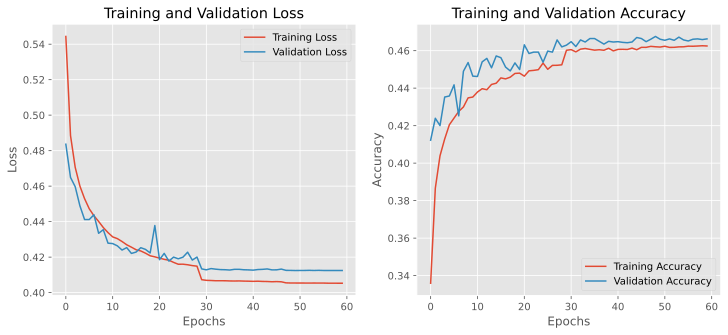

Evaluating model on test set...
Here are results for resnet embeddings using full layer training with a SVM on the fer dataset
Test Accuracy: 46.21%
              precision    recall  f1-score   support

       Angry       0.35      0.23      0.28       771
     Disgust       0.00      0.00      0.00        78
        Fear       0.36      0.25      0.29       795
       Happy       0.57      0.71      0.63      1334
         Sad       0.38      0.45      0.41       904
    Surprise       0.61      0.55      0.58       619
     Neutral       0.41      0.47      0.44       883

    accuracy                           0.46      5384
   macro avg       0.38      0.38      0.38      5384
weighted avg       0.44      0.46      0.45      5384

Precision: 0.44, Recall: 0.46, F1 Score: 0.45


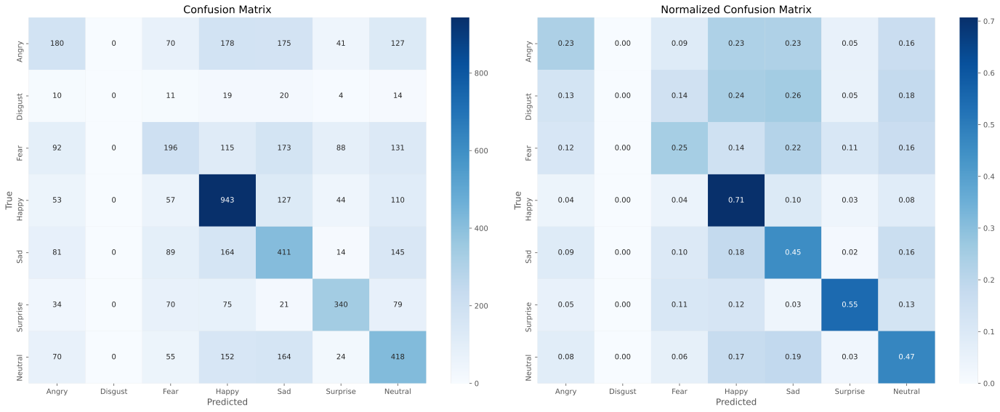

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.46211,0.444964,0.46211,0.447514


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.5411, Accuracy: 0.3417
Validation - Loss: 0.4919, Accuracy: 0.4068
Time taken: 2.64 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.4751, Accuracy: 0.4012
Validation - Loss: 0.4672, Accuracy: 0.4213
Time taken: 3.21 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.4565, Accuracy: 0.4195
Validation - Loss: 0.4508, Accuracy: 0.4338
Time taken: 2.77 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 0.4451, 

Epoch: 39/200
Training - Loss: 0.3886, Accuracy: 0.4817
Validation - Loss: 0.3957, Accuracy: 0.4810
Time taken: 2.93 seconds
--------------------------------------------------
Epoch 00040: reducing learning rate of group 0 to 1.0000e-05.
Epoch: 40/200
Training - Loss: 0.3886, Accuracy: 0.4819
Validation - Loss: 0.3957, Accuracy: 0.4806
Time taken: 3.26 seconds
--------------------------------------------------
Epoch: 41/200
Training - Loss: 0.3885, Accuracy: 0.4812
Validation - Loss: 0.3957, Accuracy: 0.4808
Time taken: 3.11 seconds
--------------------------------------------------
Epoch: 42/200
Training - Loss: 0.3885, Accuracy: 0.4814
Validation - Loss: 0.3957, Accuracy: 0.4808
Time taken: 3.04 seconds
--------------------------------------------------
Epoch: 43/200
Training - Loss: 0.3885, Accuracy: 0.4815
Validation - Loss: 0.3957, Accuracy: 0.4810
Time taken: 2.97 seconds
--------------------------------------------------
Epoch: 44/200
Training - Loss: 0.3885, Accuracy: 0.4815
Va

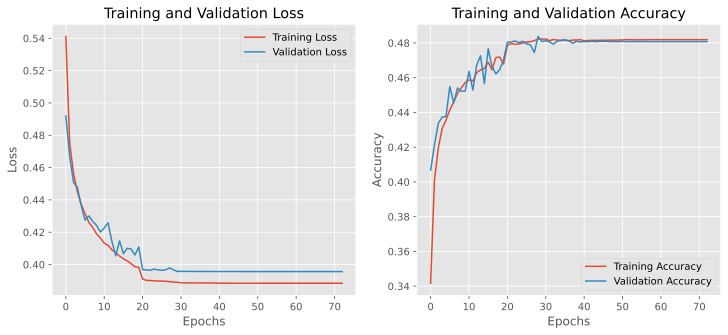

Evaluating model on test set...
Here are results for resnet embeddings using full layer training with a SVM on the fer dataset
Test Accuracy: 47.86%
              precision    recall  f1-score   support

       Angry       0.40      0.25      0.31       771
     Disgust       0.00      0.00      0.00        78
        Fear       0.39      0.25      0.31       795
       Happy       0.58      0.71      0.64      1334
         Sad       0.39      0.49      0.43       904
    Surprise       0.61      0.56      0.58       619
     Neutral       0.43      0.52      0.47       883

    accuracy                           0.48      5384
   macro avg       0.40      0.40      0.39      5384
weighted avg       0.46      0.48      0.46      5384

Precision: 0.46, Recall: 0.48, F1 Score: 0.46


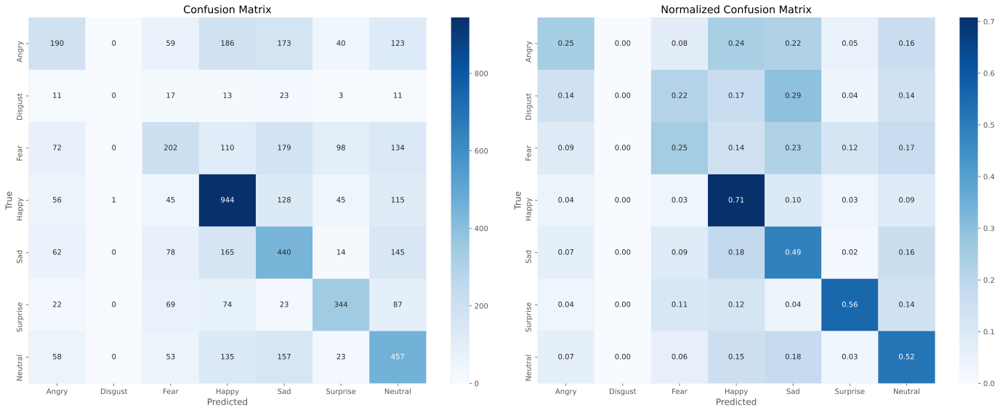

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.46211,0.444964,0.46211,0.447514
1,fer,resnet,full,SVM,False,0.47864,0.464013,0.47864,0.463323


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9686, Accuracy: 0.1849
Validation - Loss: 1.8080, Accuracy: 0.2972
Time taken: 4.59 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.8535, Accuracy: 0.2337
Validation - Loss: 1.7509, Accuracy: 0.3208
Time taken: 4.51 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8116, Accuracy: 0.2622
Validation - Loss: 1.7081, Accuracy: 0.3623
Time taken: 4.72 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.7791, Ac

Epoch: 42/200
Training - Loss: 1.3440, Accuracy: 0.4443
Validation - Loss: 1.4047, Accuracy: 0.4836
Time taken: 4.07 seconds
--------------------------------------------------
Epoch 42: No improvement in validation loss for 4 epochs.
Epoch: 43/200
Training - Loss: 1.3500, Accuracy: 0.4453
Validation - Loss: 1.3979, Accuracy: 0.4813
Time taken: 4.43 seconds
--------------------------------------------------
Epoch 43: No improvement in validation loss for 5 epochs.
Epoch 00044: reducing learning rate of group 0 to 1.0000e-05.
Epoch: 44/200
Training - Loss: 1.3396, Accuracy: 0.4459
Validation - Loss: 1.3772, Accuracy: 0.4724
Time taken: 4.65 seconds
--------------------------------------------------
Epoch 44: No improvement in validation loss for 6 epochs.
Epoch: 45/200
Training - Loss: 1.3092, Accuracy: 0.4578
Validation - Loss: 1.3811, Accuracy: 0.4858
Time taken: 4.31 seconds
--------------------------------------------------
Epoch 45: No improvement in validation loss for 7 epochs.
Ep

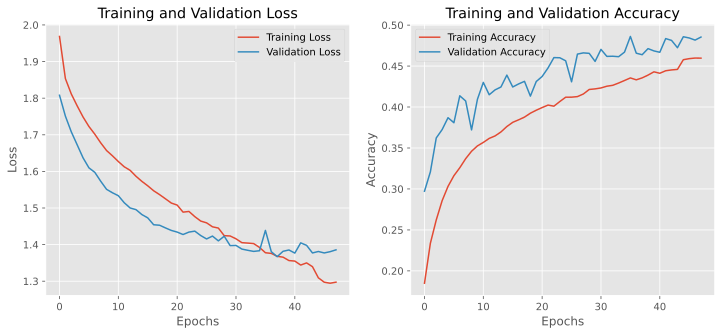

Evaluating model on test set...
Here are results for resnet embeddings using full layer training with a NN on the fer dataset
Test Accuracy: 48.09%
              precision    recall  f1-score   support

       Angry       0.40      0.37      0.38       771
     Disgust       0.23      0.55      0.32        78
        Fear       0.41      0.24      0.30       795
       Happy       0.67      0.62      0.65      1334
         Sad       0.38      0.42      0.40       904
    Surprise       0.55      0.70      0.61       619
     Neutral       0.43      0.49      0.46       883

    accuracy                           0.48      5384
   macro avg       0.44      0.48      0.45      5384
weighted avg       0.48      0.48      0.48      5384

Precision: 0.48, Recall: 0.48, F1 Score: 0.48


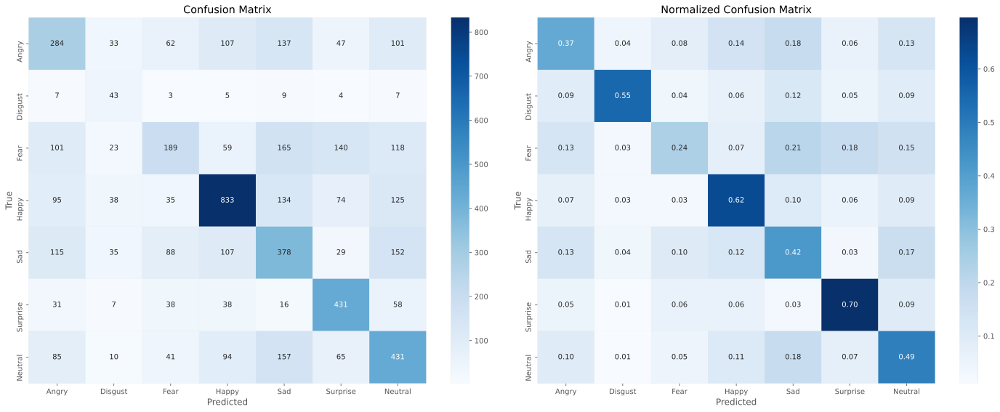

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.0714, Accuracy: 0.1828
Validation - Loss: 1.8579, Accuracy: 0.2601
Time taken: 3.17 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.8755, Accuracy: 0.2232
Validation - Loss: 1.7872, Accuracy: 0.3240
Time taken: 3.23 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8189, Accuracy: 0.2591
Validation - Loss: 1.7346, Accuracy: 0.3452
Time taken: 3.06 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.7832, A

Epoch: 45/200
Training - Loss: 1.2860, Accuracy: 0.4725
Validation - Loss: 1.2271, Accuracy: 0.5137
Time taken: 3.16 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 1.2847, Accuracy: 0.4708
Validation - Loss: 1.2354, Accuracy: 0.5098
Time taken: 3.02 seconds
--------------------------------------------------
Epoch 46: No improvement in validation loss for 1 epochs.
Epoch: 47/200
Training - Loss: 1.2735, Accuracy: 0.4738
Validation - Loss: 1.2279, Accuracy: 0.5118
Time taken: 3.43 seconds
--------------------------------------------------
Epoch 47: No improvement in validation loss for 2 epochs.
Epoch: 48/200
Training - Loss: 1.2621, Accuracy: 0.4760
Validation - Loss: 1.2181, Accuracy: 0.5203
Time taken: 2.93 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 1.2603, Accuracy: 0.4789
Validation - Loss: 1.2188, Accuracy: 0.5239
Time taken: 2.80 seconds
--------------------------------------------------
Epoc

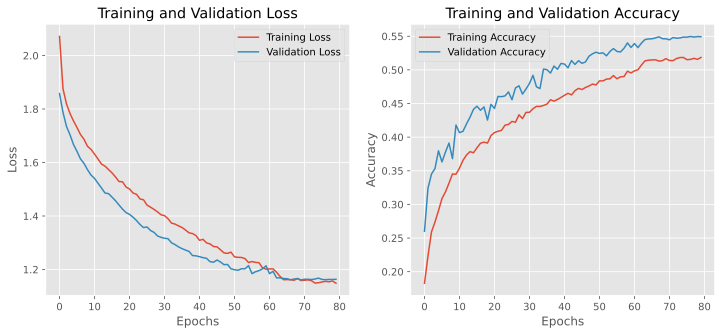

Evaluating model on test set...
Here are results for resnet embeddings using full layer training with a NN on the fer dataset
Test Accuracy: 54.81%
              precision    recall  f1-score   support

       Angry       0.46      0.45      0.45       771
     Disgust       0.63      0.77      0.69        78
        Fear       0.48      0.29      0.37       795
       Happy       0.71      0.69      0.70      1334
         Sad       0.45      0.45      0.45       904
    Surprise       0.61      0.75      0.67       619
     Neutral       0.48      0.59      0.53       883

    accuracy                           0.55      5384
   macro avg       0.55      0.57      0.55      5384
weighted avg       0.55      0.55      0.54      5384

Precision: 0.55, Recall: 0.55, F1 Score: 0.54


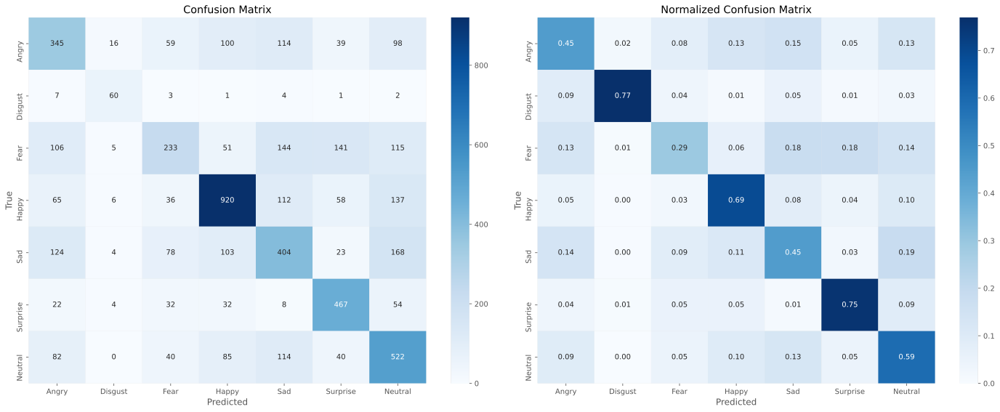

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.82589	eval-mlogloss:1.83424
[1]	train-mlogloss:1.73903	eval-mlogloss:1.76033
[2]	train-mlogloss:1.67032	eval-mlogloss:1.70761
[3]	train-mlogloss:1.61385	eval-mlogloss:1.66788
[4]	train-mlogloss:1.56545	eval-mlogloss:1.63468
[5]	train-mlogloss:1.52327	eval-mlogloss:1.60669
[6]	train-mlogloss:1.48559	eval-mlogloss:1.58242
[7]	train-mlogloss:1.45177	eval-mlogloss:1.56207
[8]	train-mlogloss:1.42075	eval-mlogloss:1.54536
[9]	train-mlogloss:1.39180	eval-mlogloss:1.53056
[10]	train-mlogloss:1.36501	eval-mlogloss:1.51771
[11]	train-mlogloss:1.340

[155]	train-mlogloss:0.31062	eval-mlogloss:1.31703
[156]	train-mlogloss:0.30776	eval-mlogloss:1.31672
[157]	train-mlogloss:0.30472	eval-mlogloss:1.31660
[158]	train-mlogloss:0.30264	eval-mlogloss:1.31692
[159]	train-mlogloss:0.30024	eval-mlogloss:1.31660
[160]	train-mlogloss:0.29753	eval-mlogloss:1.31694
[161]	train-mlogloss:0.29494	eval-mlogloss:1.31693
[162]	train-mlogloss:0.29230	eval-mlogloss:1.31754
[163]	train-mlogloss:0.28934	eval-mlogloss:1.31745
[164]	train-mlogloss:0.28707	eval-mlogloss:1.31753
[165]	train-mlogloss:0.28488	eval-mlogloss:1.31786
[166]	train-mlogloss:0.28272	eval-mlogloss:1.31802
[167]	train-mlogloss:0.28027	eval-mlogloss:1.31822
[168]	train-mlogloss:0.27766	eval-mlogloss:1.31856
[169]	train-mlogloss:0.27514	eval-mlogloss:1.31898
[170]	train-mlogloss:0.27247	eval-mlogloss:1.31864
[171]	train-mlogloss:0.27001	eval-mlogloss:1.31905
[172]	train-mlogloss:0.26753	eval-mlogloss:1.31910
[173]	train-mlogloss:0.26493	eval-mlogloss:1.31934
[174]	train-mlogloss:0.26225	ev

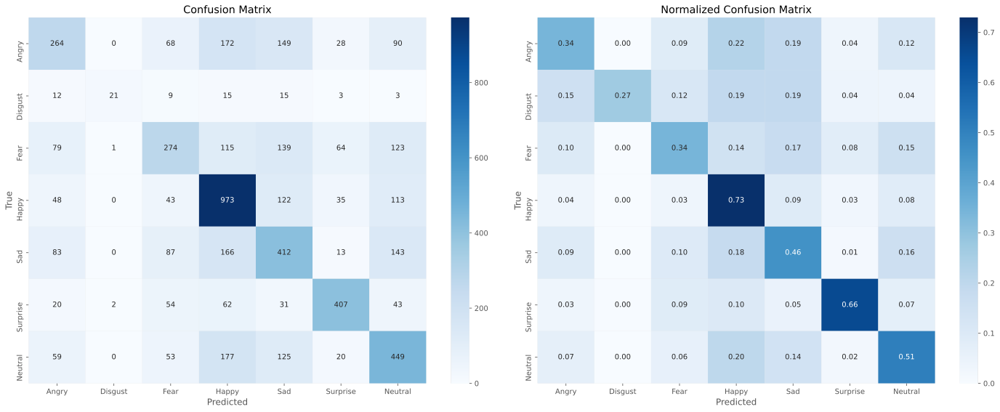

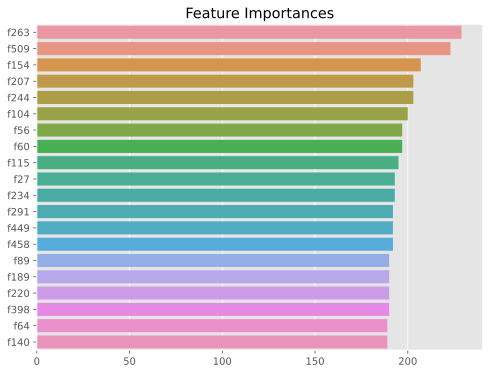

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.78128	eval-mlogloss:1.79666
[1]	train-mlogloss:1.66591	eval-mlogloss:1.69358
[2]	train-mlogloss:1.57335	eval-mlogloss:1.61242
[3]	train-mlogloss:1.49820	eval-mlogloss:1.54515
[4]	train-mlogloss:1.43232	eval-mlogloss:1.48818
[5]	train-mlogloss:1.37568	eval-mlogloss:1.43894
[6]	train-mlogloss:1.32427	eval-mlogloss:1.39602
[7]	train-mlogloss:1.27679	eval-mlogloss:1.35709
[8]	train-mlogloss:1.23559	eval-mlogloss:1.32132
[9]	train-mlogloss:1.19777	eval-mlogloss:1.29087
[10]	train-mlogloss:1.16130	eval-mlogloss:1.26186
[11]	train-mlogloss:1.12

[155]	train-mlogloss:0.08674	eval-mlogloss:0.44673
[156]	train-mlogloss:0.08526	eval-mlogloss:0.44516
[157]	train-mlogloss:0.08383	eval-mlogloss:0.44421
[158]	train-mlogloss:0.08232	eval-mlogloss:0.44289
[159]	train-mlogloss:0.08142	eval-mlogloss:0.44228
[160]	train-mlogloss:0.08019	eval-mlogloss:0.44152
[161]	train-mlogloss:0.07897	eval-mlogloss:0.44091
[162]	train-mlogloss:0.07790	eval-mlogloss:0.44039
[163]	train-mlogloss:0.07666	eval-mlogloss:0.43943
[164]	train-mlogloss:0.07541	eval-mlogloss:0.43856
[165]	train-mlogloss:0.07439	eval-mlogloss:0.43809
[166]	train-mlogloss:0.07323	eval-mlogloss:0.43744
[167]	train-mlogloss:0.07227	eval-mlogloss:0.43709
[168]	train-mlogloss:0.07113	eval-mlogloss:0.43656
[169]	train-mlogloss:0.07015	eval-mlogloss:0.43622
[170]	train-mlogloss:0.06904	eval-mlogloss:0.43585
[171]	train-mlogloss:0.06812	eval-mlogloss:0.43540
[172]	train-mlogloss:0.06718	eval-mlogloss:0.43482
[173]	train-mlogloss:0.06611	eval-mlogloss:0.43393
[174]	train-mlogloss:0.06508	ev

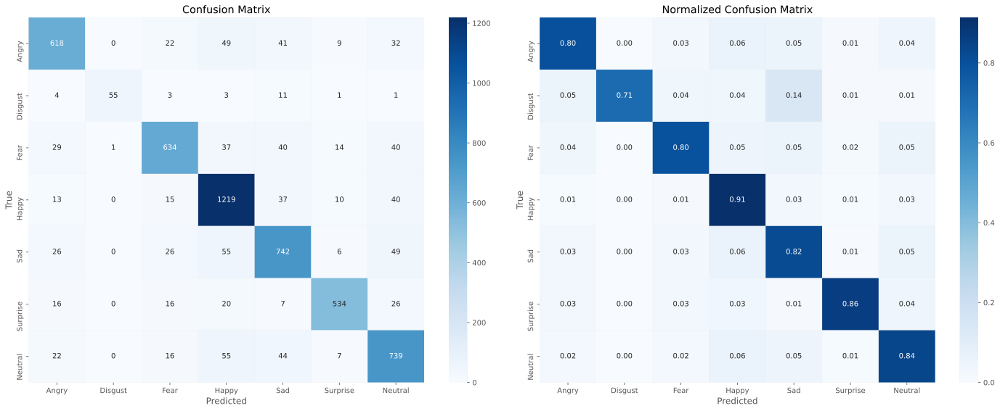

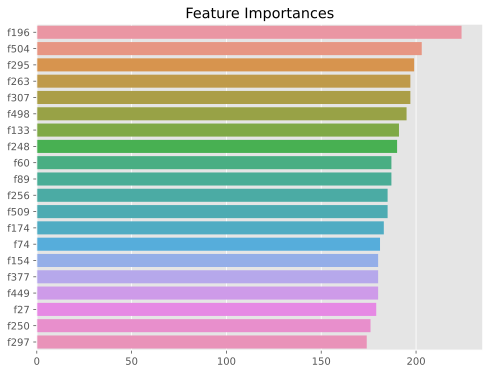

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_vit_full_train_augmented_embeddings.npy and data/fer/fer_vit_full_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_vit_full_val_original_embeddings.npy and data/fer/fer_vit_full_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_vit_full_test_original_embeddings.npy and data/fer/fer_vit_full_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.5612, Accuracy: 0.3519
Validation - Loss: 0.4657, Accuracy: 0.4503
Time taken: 3.87 seconds
--------------------------------------------------
Epoch: 2/200
Training - 

Epoch: 44/200
Training - Loss: 0.3230, Accuracy: 0.5498
Validation - Loss: 0.3111, Accuracy: 0.5579
Time taken: 3.93 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.3225, Accuracy: 0.5504
Validation - Loss: 0.3107, Accuracy: 0.5575
Time taken: 3.60 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.3220, Accuracy: 0.5508
Validation - Loss: 0.3101, Accuracy: 0.5601
Time taken: 3.98 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.3216, Accuracy: 0.5517
Validation - Loss: 0.3098, Accuracy: 0.5588
Time taken: 3.88 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.3211, Accuracy: 0.5518
Validation - Loss: 0.3093, Accuracy: 0.5581
Time taken: 3.65 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.3206, Accuracy: 0.5521
Validation - Loss: 0.3090, Accuracy: 0.5595
Time taken: 3.86 sec

Epoch: 89/200
Training - Loss: 0.3084, Accuracy: 0.5629
Validation - Loss: 0.3008, Accuracy: 0.5703
Time taken: 3.89 seconds
--------------------------------------------------
Epoch: 90/200
Training - Loss: 0.3082, Accuracy: 0.5630
Validation - Loss: 0.3010, Accuracy: 0.5720
Time taken: 4.30 seconds
--------------------------------------------------
Epoch 90: No improvement in validation loss for 1 epochs.
Epoch: 91/200
Training - Loss: 0.3080, Accuracy: 0.5635
Validation - Loss: 0.3009, Accuracy: 0.5694
Time taken: 4.57 seconds
--------------------------------------------------
Epoch 91: No improvement in validation loss for 2 epochs.
Epoch: 92/200
Training - Loss: 0.3078, Accuracy: 0.5628
Validation - Loss: 0.3008, Accuracy: 0.5696
Time taken: 4.91 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.3076, Accuracy: 0.5633
Validation - Loss: 0.3007, Accuracy: 0.5690
Time taken: 4.77 seconds
--------------------------------------------------
Epoc

Epoch: 131/200
Training - Loss: 0.3015, Accuracy: 0.5689
Validation - Loss: 0.2973, Accuracy: 0.5716
Time taken: 4.35 seconds
--------------------------------------------------
Epoch: 132/200
Training - Loss: 0.3015, Accuracy: 0.5692
Validation - Loss: 0.2975, Accuracy: 0.5703
Time taken: 4.58 seconds
--------------------------------------------------
Epoch 132: No improvement in validation loss for 1 epochs.
Epoch: 133/200
Training - Loss: 0.3013, Accuracy: 0.5691
Validation - Loss: 0.2971, Accuracy: 0.5724
Time taken: 4.76 seconds
--------------------------------------------------
Epoch: 134/200
Training - Loss: 0.3012, Accuracy: 0.5698
Validation - Loss: 0.2975, Accuracy: 0.5703
Time taken: 4.53 seconds
--------------------------------------------------
Epoch 134: No improvement in validation loss for 1 epochs.
Epoch: 135/200
Training - Loss: 0.3011, Accuracy: 0.5699
Validation - Loss: 0.2972, Accuracy: 0.5720
Time taken: 3.60 seconds
------------------------------------------------

Epoch: 172/200
Training - Loss: 0.2972, Accuracy: 0.5726
Validation - Loss: 0.2956, Accuracy: 0.5705
Time taken: 3.38 seconds
--------------------------------------------------
Epoch: 173/200
Training - Loss: 0.2972, Accuracy: 0.5726
Validation - Loss: 0.2956, Accuracy: 0.5711
Time taken: 3.90 seconds
--------------------------------------------------
Epoch: 174/200
Training - Loss: 0.2972, Accuracy: 0.5728
Validation - Loss: 0.2956, Accuracy: 0.5709
Time taken: 3.82 seconds
--------------------------------------------------
Epoch 174: No improvement in validation loss for 1 epochs.
Epoch: 175/200
Training - Loss: 0.2972, Accuracy: 0.5730
Validation - Loss: 0.2956, Accuracy: 0.5718
Time taken: 4.12 seconds
--------------------------------------------------
Epoch: 176/200
Training - Loss: 0.2971, Accuracy: 0.5725
Validation - Loss: 0.2956, Accuracy: 0.5714
Time taken: 3.95 seconds
--------------------------------------------------
Epoch 176: No improvement in validation loss for 1 epoch

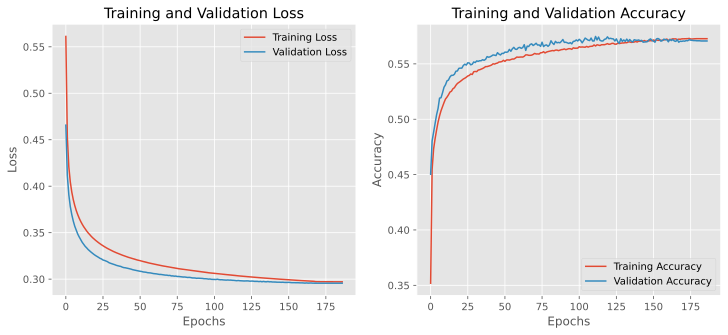

Evaluating model on test set...
Here are results for vit embeddings using full layer training with a SVM on the fer dataset
Test Accuracy: 58.34%
              precision    recall  f1-score   support

       Angry       0.45      0.41      0.43       726
     Disgust       0.80      0.05      0.10        78
        Fear       0.46      0.31      0.37       769
       Happy       0.76      0.84      0.80      1346
         Sad       0.43      0.50      0.47       894
    Surprise       0.71      0.68      0.70       607
     Neutral       0.55      0.62      0.58       964

    accuracy                           0.58      5384
   macro avg       0.60      0.49      0.49      5384
weighted avg       0.58      0.58      0.57      5384

Precision: 0.58, Recall: 0.58, F1 Score: 0.57


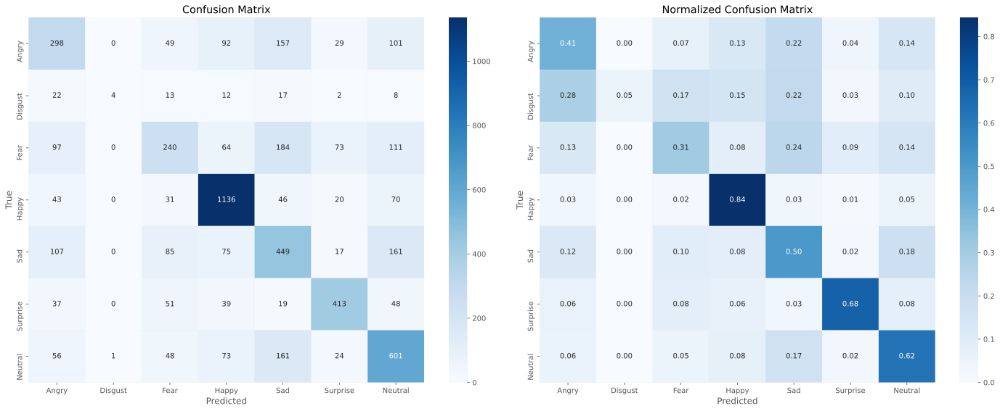

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_vit_full_train_original_embeddings.npy and data/fer/fer_vit_full_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.5830, Accuracy: 0.3412
Validation - Loss: 0.5061, Accuracy: 0.4319
Time taken: 2.47 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.4619, Accuracy: 0.4635
Validation - Loss: 0.4409, Accuracy: 0.4791
Time taken: 2.27 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.4197, Accuracy: 0.4874
Validation - Loss: 0.4130, Accuracy: 

Epoch: 45/200
Training - Loss: 0.3021, Accuracy: 0.5711
Validation - Loss: 0.3065, Accuracy: 0.5612
Time taken: 3.26 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.3015, Accuracy: 0.5709
Validation - Loss: 0.3060, Accuracy: 0.5629
Time taken: 2.65 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.3008, Accuracy: 0.5716
Validation - Loss: 0.3055, Accuracy: 0.5627
Time taken: 2.62 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.3002, Accuracy: 0.5717
Validation - Loss: 0.3050, Accuracy: 0.5623
Time taken: 2.68 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.2996, Accuracy: 0.5732
Validation - Loss: 0.3043, Accuracy: 0.5649
Time taken: 2.93 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.2992, Accuracy: 0.5732
Validation - Loss: 0.3038, Accuracy: 0.5633
Time taken: 2.62 sec

Epoch: 92/200
Training - Loss: 0.2835, Accuracy: 0.5882
Validation - Loss: 0.2894, Accuracy: 0.5763
Time taken: 2.48 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.2832, Accuracy: 0.5885
Validation - Loss: 0.2891, Accuracy: 0.5772
Time taken: 2.93 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.2830, Accuracy: 0.5883
Validation - Loss: 0.2889, Accuracy: 0.5777
Time taken: 2.63 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.2827, Accuracy: 0.5893
Validation - Loss: 0.2888, Accuracy: 0.5779
Time taken: 2.51 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.2825, Accuracy: 0.5888
Validation - Loss: 0.2886, Accuracy: 0.5792
Time taken: 2.68 seconds
--------------------------------------------------
Epoch: 97/200
Training - Loss: 0.2822, Accuracy: 0.5889
Validation - Loss: 0.2884, Accuracy: 0.5779
Time taken: 3.46 sec

Epoch: 138/200
Training - Loss: 0.2741, Accuracy: 0.5958
Validation - Loss: 0.2807, Accuracy: 0.5878
Time taken: 2.27 seconds
--------------------------------------------------
Epoch: 139/200
Training - Loss: 0.2740, Accuracy: 0.5971
Validation - Loss: 0.2806, Accuracy: 0.5870
Time taken: 2.24 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.2739, Accuracy: 0.5969
Validation - Loss: 0.2804, Accuracy: 0.5883
Time taken: 2.87 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.2737, Accuracy: 0.5971
Validation - Loss: 0.2801, Accuracy: 0.5902
Time taken: 2.45 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.2735, Accuracy: 0.5970
Validation - Loss: 0.2802, Accuracy: 0.5870
Time taken: 2.32 seconds
--------------------------------------------------
Epoch 142: No improvement in validation loss for 1 epochs.
Epoch: 143/200
Training - Loss: 0.2734, Accuracy: 0.5974

Epoch: 182/200
Training - Loss: 0.2682, Accuracy: 0.6014
Validation - Loss: 0.2751, Accuracy: 0.5939
Time taken: 3.55 seconds
--------------------------------------------------
Epoch: 183/200
Training - Loss: 0.2681, Accuracy: 0.6017
Validation - Loss: 0.2751, Accuracy: 0.5941
Time taken: 2.51 seconds
--------------------------------------------------
Epoch 183: No improvement in validation loss for 1 epochs.
Epoch: 184/200
Training - Loss: 0.2680, Accuracy: 0.6022
Validation - Loss: 0.2749, Accuracy: 0.5948
Time taken: 3.00 seconds
--------------------------------------------------
Epoch: 185/200
Training - Loss: 0.2678, Accuracy: 0.6028
Validation - Loss: 0.2749, Accuracy: 0.5935
Time taken: 2.83 seconds
--------------------------------------------------
Epoch: 186/200
Training - Loss: 0.2677, Accuracy: 0.6023
Validation - Loss: 0.2746, Accuracy: 0.5939
Time taken: 2.37 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.2676, Accuracy: 0.6034

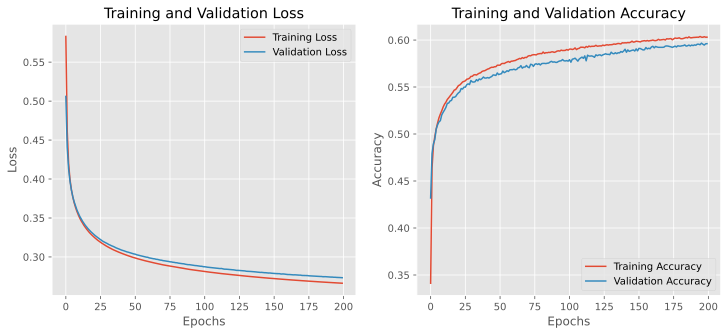

Evaluating model on test set...
Here are results for vit embeddings using full layer training with a SVM on the fer dataset
Test Accuracy: 59.75%
              precision    recall  f1-score   support

       Angry       0.48      0.44      0.46       726
     Disgust       0.83      0.06      0.12        78
        Fear       0.49      0.32      0.39       769
       Happy       0.77      0.86      0.81      1346
         Sad       0.45      0.53      0.49       894
    Surprise       0.71      0.70      0.70       607
     Neutral       0.55      0.61      0.58       964

    accuracy                           0.60      5384
   macro avg       0.61      0.50      0.51      5384
weighted avg       0.59      0.60      0.59      5384

Precision: 0.59, Recall: 0.60, F1 Score: 0.59


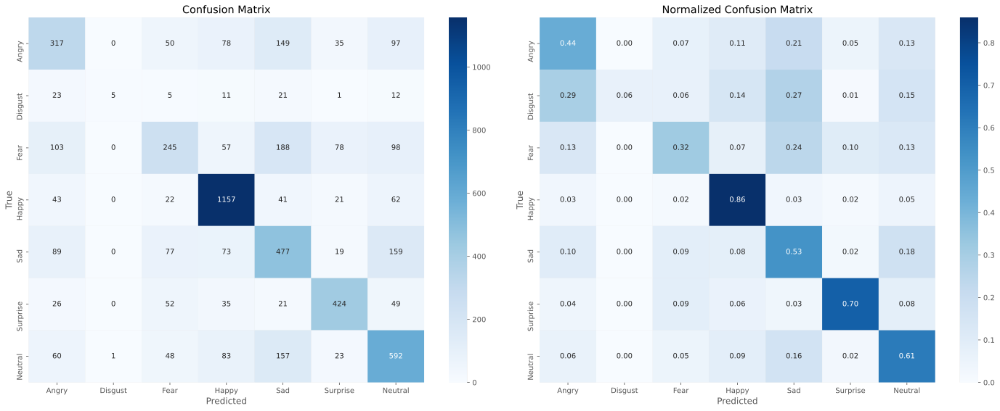

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.8188, Accuracy: 0.3170
Validation - Loss: 1.5756, Accuracy: 0.4709
Time taken: 4.49 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.6307, Accuracy: 0.4188
Validation - Loss: 1.4466, Accuracy: 0.5046
Time taken: 4.72 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.5420, Accuracy: 0.4466
Validation - Loss: 1.3713, Accuracy: 0.5213
Time taken: 4.45 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.4876, Accur

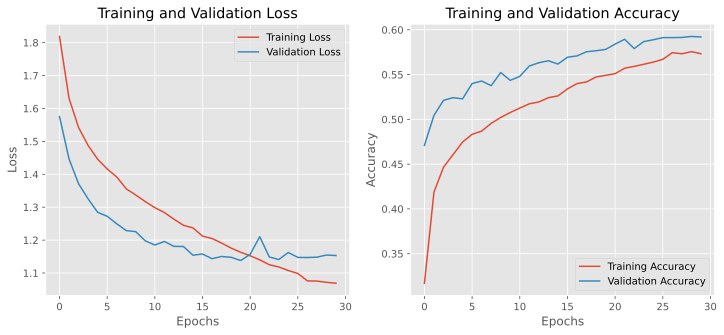

Evaluating model on test set...
Here are results for vit embeddings using full layer training with a NN on the fer dataset
Test Accuracy: 59.21%
              precision    recall  f1-score   support

       Angry       0.45      0.47      0.46       726
     Disgust       0.26      0.60      0.36        78
        Fear       0.48      0.31      0.38       769
       Happy       0.83      0.80      0.82      1346
         Sad       0.46      0.45      0.46       894
    Surprise       0.64      0.80      0.71       607
     Neutral       0.58      0.61      0.60       964

    accuracy                           0.59      5384
   macro avg       0.53      0.58      0.54      5384
weighted avg       0.59      0.59      0.59      5384

Precision: 0.59, Recall: 0.59, F1 Score: 0.59


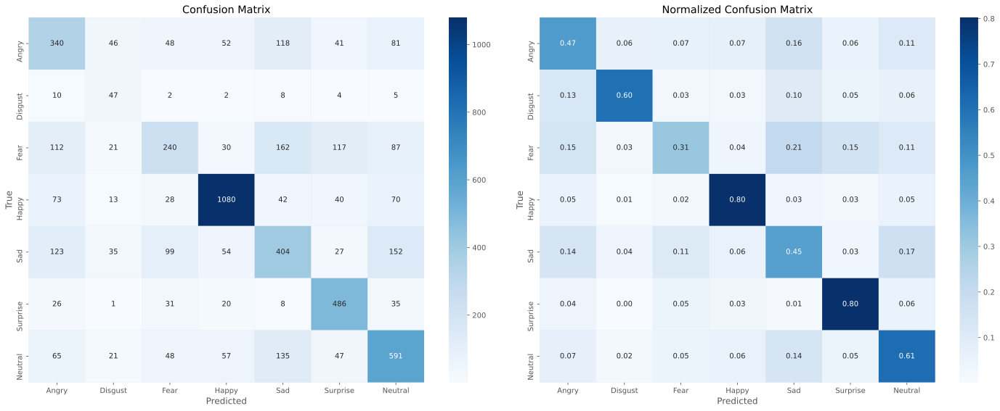

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.8406, Accuracy: 0.3084
Validation - Loss: 1.6511, Accuracy: 0.4758
Time taken: 2.73 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.6469, Accuracy: 0.4180
Validation - Loss: 1.4917, Accuracy: 0.4904
Time taken: 3.01 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.5494, Accuracy: 0.4505
Validation - Loss: 1.4087, Accuracy: 0.5036
Time taken: 2.93 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.4902, Accu

Epoch: 45/200
Training - Loss: 0.9303, Accuracy: 0.6255
Validation - Loss: 0.8662, Accuracy: 0.6686
Time taken: 3.25 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.9362, Accuracy: 0.6289
Validation - Loss: 0.8657, Accuracy: 0.6756
Time taken: 2.82 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.9254, Accuracy: 0.6327
Validation - Loss: 0.8657, Accuracy: 0.6799
Time taken: 2.74 seconds
--------------------------------------------------
Epoch 47: No improvement in validation loss for 1 epochs.
Epoch: 48/200
Training - Loss: 0.9234, Accuracy: 0.6369
Validation - Loss: 0.8646, Accuracy: 0.6805
Time taken: 2.88 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.9090, Accuracy: 0.6389
Validation - Loss: 0.8514, Accuracy: 0.6829
Time taken: 3.21 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.9100, Accuracy: 0.6373
Valida

Epoch: 87/200
Training - Loss: 0.7377, Accuracy: 0.7051
Validation - Loss: 0.7448, Accuracy: 0.7435
Time taken: 3.10 seconds
--------------------------------------------------
Epoch: 88/200
Training - Loss: 0.7324, Accuracy: 0.7027
Validation - Loss: 0.7523, Accuracy: 0.7451
Time taken: 3.20 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 1 epochs.
Epoch: 89/200
Training - Loss: 0.7320, Accuracy: 0.7044
Validation - Loss: 0.7494, Accuracy: 0.7431
Time taken: 2.92 seconds
--------------------------------------------------
Epoch 89: No improvement in validation loss for 2 epochs.
Epoch: 90/200
Training - Loss: 0.7224, Accuracy: 0.7085
Validation - Loss: 0.7368, Accuracy: 0.7438
Time taken: 2.95 seconds
--------------------------------------------------
Epoch: 91/200
Training - Loss: 0.7241, Accuracy: 0.7090
Validation - Loss: 0.7366, Accuracy: 0.7444
Time taken: 2.73 seconds
--------------------------------------------------
Epoc

Epoch: 128/200
Training - Loss: 0.5953, Accuracy: 0.7603
Validation - Loss: 0.6655, Accuracy: 0.7912
Time taken: 2.88 seconds
--------------------------------------------------
Epoch 128: No improvement in validation loss for 1 epochs.
Epoch: 129/200
Training - Loss: 0.5905, Accuracy: 0.7626
Validation - Loss: 0.6495, Accuracy: 0.8020
Time taken: 3.14 seconds
--------------------------------------------------
Epoch: 130/200
Training - Loss: 0.5881, Accuracy: 0.7641
Validation - Loss: 0.6539, Accuracy: 0.7947
Time taken: 2.84 seconds
--------------------------------------------------
Epoch 130: No improvement in validation loss for 1 epochs.
Epoch: 131/200
Training - Loss: 0.5839, Accuracy: 0.7633
Validation - Loss: 0.6568, Accuracy: 0.7955
Time taken: 2.96 seconds
--------------------------------------------------
Epoch 131: No improvement in validation loss for 2 epochs.
Epoch: 132/200
Training - Loss: 0.5773, Accuracy: 0.7673
Validation - Loss: 0.6450, Accuracy: 0.7990
Time taken: 4.

Epoch: 166/200
Training - Loss: 0.4836, Accuracy: 0.8064
Validation - Loss: 0.6072, Accuracy: 0.8362
Time taken: 2.88 seconds
--------------------------------------------------
Epoch 166: No improvement in validation loss for 3 epochs.
Epoch: 167/200
Training - Loss: 0.4774, Accuracy: 0.8107
Validation - Loss: 0.6043, Accuracy: 0.8367
Time taken: 2.69 seconds
--------------------------------------------------
Epoch 167: No improvement in validation loss for 4 epochs.
Epoch: 168/200
Training - Loss: 0.4785, Accuracy: 0.8055
Validation - Loss: 0.6121, Accuracy: 0.8358
Time taken: 2.68 seconds
--------------------------------------------------
Epoch 168: No improvement in validation loss for 5 epochs.
Epoch 00169: reducing learning rate of group 0 to 1.0000e-05.
Epoch: 169/200
Training - Loss: 0.4765, Accuracy: 0.8064
Validation - Loss: 0.6087, Accuracy: 0.8352
Time taken: 2.94 seconds
--------------------------------------------------
Epoch 169: No improvement in validation loss for 6 ep

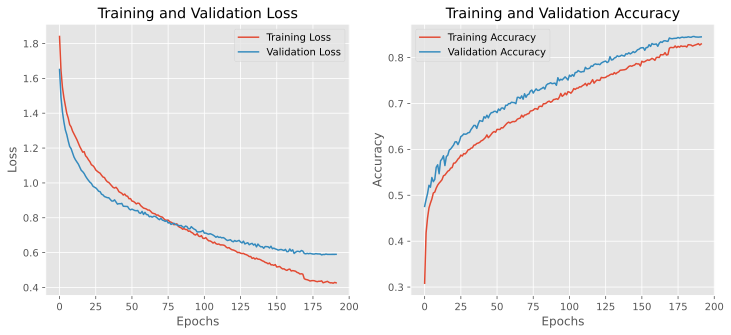

Evaluating model on test set...
Here are results for vit embeddings using full layer training with a NN on the fer dataset
Test Accuracy: 83.04%
              precision    recall  f1-score   support

       Angry       0.77      0.80      0.79       726
     Disgust       0.90      0.90      0.90        78
        Fear       0.78      0.75      0.76       769
       Happy       0.92      0.91      0.91      1346
         Sad       0.75      0.75      0.75       894
    Surprise       0.89      0.93      0.91       607
     Neutral       0.82      0.82      0.82       964

    accuracy                           0.83      5384
   macro avg       0.83      0.84      0.83      5384
weighted avg       0.83      0.83      0.83      5384

Precision: 0.83, Recall: 0.83, F1 Score: 0.83


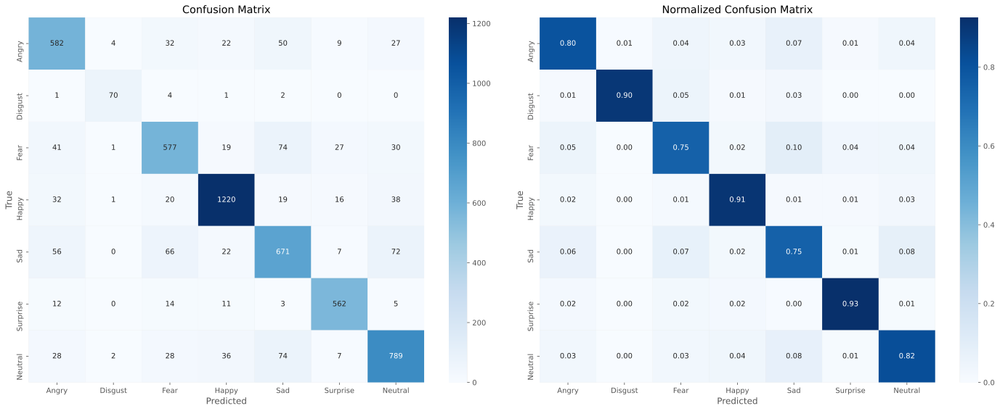

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.75570	eval-mlogloss:1.74548
[1]	train-mlogloss:1.63533	eval-mlogloss:1.62914
[2]	train-mlogloss:1.54467	eval-mlogloss:1.54979
[3]	train-mlogloss:1.47244	eval-mlogloss:1.49105
[4]	train-mlogloss:1.41349	eval-mlogloss:1.44580
[5]	train-mlogloss:1.36288	eval-mlogloss:1.40832
[6]	train-mlogloss:1.31807	eval-mlogloss:1.37638
[7]	train-mlogloss:1.27922	eval-mlogloss:1.35235
[8]	train-mlogloss:1.24348	eval-mlogloss:1.33188
[9]	train-mlogloss:1.21174	eval-mlogloss:1.31316
[10]	train-mlogloss:1.18212	eval-mlogloss:1.29729
[11]	train-mlogloss:1.15506	

[155]	train-mlogloss:0.20943	eval-mlogloss:1.08753
[156]	train-mlogloss:0.20744	eval-mlogloss:1.08716
[157]	train-mlogloss:0.20512	eval-mlogloss:1.08732
[158]	train-mlogloss:0.20329	eval-mlogloss:1.08736
[159]	train-mlogloss:0.20109	eval-mlogloss:1.08768
[160]	train-mlogloss:0.19855	eval-mlogloss:1.08763
[161]	train-mlogloss:0.19640	eval-mlogloss:1.08728
[162]	train-mlogloss:0.19446	eval-mlogloss:1.08714
[163]	train-mlogloss:0.19274	eval-mlogloss:1.08768
[164]	train-mlogloss:0.19079	eval-mlogloss:1.08733
[165]	train-mlogloss:0.18855	eval-mlogloss:1.08701
[166]	train-mlogloss:0.18667	eval-mlogloss:1.08720
[167]	train-mlogloss:0.18467	eval-mlogloss:1.08721
[168]	train-mlogloss:0.18259	eval-mlogloss:1.08762
[169]	train-mlogloss:0.18088	eval-mlogloss:1.08781
[170]	train-mlogloss:0.17916	eval-mlogloss:1.08785
Evaluating model on test set...
Here are results for vit embeddings using full layer training with a RF on the fer dataset
Test Accuracy: 0.6118
              precision    recall  f1-s

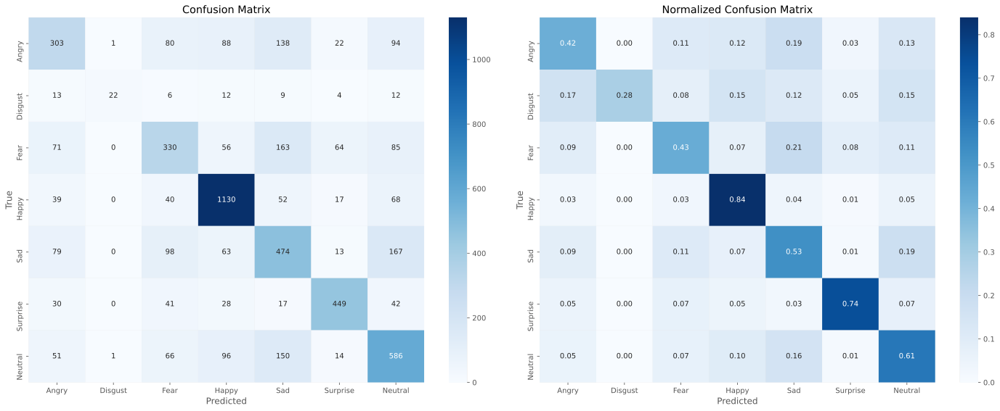

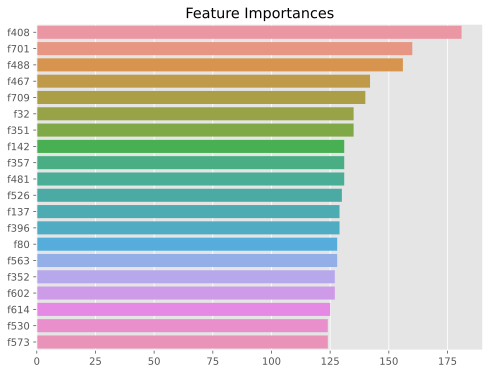

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.68975	eval-mlogloss:1.70490
[1]	train-mlogloss:1.53612	eval-mlogloss:1.56060
[2]	train-mlogloss:1.41845	eval-mlogloss:1.45297
[3]	train-mlogloss:1.32642	eval-mlogloss:1.37007
[4]	train-mlogloss:1.25125	eval-mlogloss:1.30154
[5]	train-mlogloss:1.18678	eval-mlogloss:1.24472
[6]	train-mlogloss:1.12888	eval-mlogloss:1.19321
[7]	train-mlogloss:1.07902	eval-mlogloss:1.14834
[8]	train-mlogloss:1.03246	eval-mlogloss:1.10706
[9]	train-mlogloss:0.99115	eval-mlogloss:1.07258
[10]	train-mlogloss:0.95521	eval-mlogloss:1.04261
[11]	train-mlogloss:0.92038

[155]	train-mlogloss:0.05078	eval-mlogloss:0.34455
[156]	train-mlogloss:0.04985	eval-mlogloss:0.34375
[157]	train-mlogloss:0.04904	eval-mlogloss:0.34330
[158]	train-mlogloss:0.04830	eval-mlogloss:0.34284
[159]	train-mlogloss:0.04780	eval-mlogloss:0.34252
[160]	train-mlogloss:0.04695	eval-mlogloss:0.34217
[161]	train-mlogloss:0.04625	eval-mlogloss:0.34179
[162]	train-mlogloss:0.04533	eval-mlogloss:0.34118
[163]	train-mlogloss:0.04461	eval-mlogloss:0.34097
[164]	train-mlogloss:0.04384	eval-mlogloss:0.34038
[165]	train-mlogloss:0.04323	eval-mlogloss:0.33984
[166]	train-mlogloss:0.04259	eval-mlogloss:0.33972
[167]	train-mlogloss:0.04200	eval-mlogloss:0.33915
[168]	train-mlogloss:0.04142	eval-mlogloss:0.33891
[169]	train-mlogloss:0.04080	eval-mlogloss:0.33892
[170]	train-mlogloss:0.04022	eval-mlogloss:0.33848
[171]	train-mlogloss:0.03950	eval-mlogloss:0.33843
[172]	train-mlogloss:0.03891	eval-mlogloss:0.33810
[173]	train-mlogloss:0.03829	eval-mlogloss:0.33758
[174]	train-mlogloss:0.03783	ev

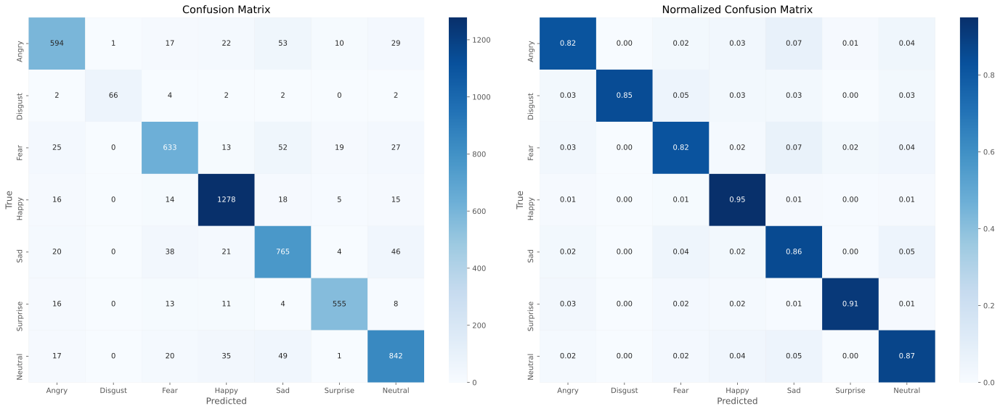

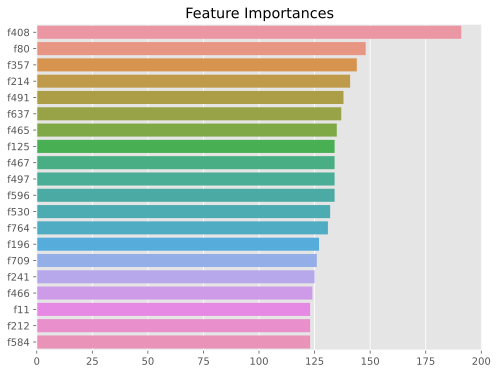

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_efficientnet_full_train_augmented_embeddings.npy and data/fer/fer_efficientnet_full_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_efficientnet_full_val_original_embeddings.npy and data/fer/fer_efficientnet_full_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_efficientnet_full_test_original_embeddings.npy and data/fer/fer_efficientnet_full_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7850, Accuracy: 0.1578
Validation - Loss: 0.7295, Accuracy: 0.1824
Time taken: 3.66 seconds
------------

Epoch: 43/200
Training - Loss: 0.5706, Accuracy: 0.3090
Validation - Loss: 0.5458, Accuracy: 0.3296
Time taken: 4.01 seconds
--------------------------------------------------
Epoch: 44/200
Training - Loss: 0.5697, Accuracy: 0.3107
Validation - Loss: 0.5448, Accuracy: 0.3307
Time taken: 4.03 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.5688, Accuracy: 0.3118
Validation - Loss: 0.5438, Accuracy: 0.3325
Time taken: 3.73 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.5679, Accuracy: 0.3127
Validation - Loss: 0.5428, Accuracy: 0.3333
Time taken: 3.74 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.5671, Accuracy: 0.3141
Validation - Loss: 0.5419, Accuracy: 0.3351
Time taken: 3.75 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.5662, Accuracy: 0.3156
Validation - Loss: 0.5410, Accuracy: 0.3359
Time taken: 3.45 sec

Epoch: 90/200
Training - Loss: 0.5396, Accuracy: 0.3473
Validation - Loss: 0.5133, Accuracy: 0.3745
Time taken: 3.58 seconds
--------------------------------------------------
Epoch: 91/200
Training - Loss: 0.5391, Accuracy: 0.3476
Validation - Loss: 0.5128, Accuracy: 0.3751
Time taken: 3.84 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.5387, Accuracy: 0.3481
Validation - Loss: 0.5124, Accuracy: 0.3758
Time taken: 3.69 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.5382, Accuracy: 0.3485
Validation - Loss: 0.5119, Accuracy: 0.3766
Time taken: 3.99 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.5377, Accuracy: 0.3487
Validation - Loss: 0.5114, Accuracy: 0.3767
Time taken: 3.68 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.5373, Accuracy: 0.3492
Validation - Loss: 0.5109, Accuracy: 0.3771
Time taken: 3.62 sec

Epoch: 137/200
Training - Loss: 0.5214, Accuracy: 0.3667
Validation - Loss: 0.4952, Accuracy: 0.3873
Time taken: 4.69 seconds
--------------------------------------------------
Epoch: 138/200
Training - Loss: 0.5211, Accuracy: 0.3665
Validation - Loss: 0.4949, Accuracy: 0.3879
Time taken: 3.85 seconds
--------------------------------------------------
Epoch: 139/200
Training - Loss: 0.5208, Accuracy: 0.3671
Validation - Loss: 0.4946, Accuracy: 0.3879
Time taken: 4.08 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.5205, Accuracy: 0.3672
Validation - Loss: 0.4943, Accuracy: 0.3883
Time taken: 3.73 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.5202, Accuracy: 0.3676
Validation - Loss: 0.4940, Accuracy: 0.3881
Time taken: 3.74 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.5198, Accuracy: 0.3679
Validation - Loss: 0.4937, Accuracy: 0.3884
Time taken: 3.

Epoch: 184/200
Training - Loss: 0.5088, Accuracy: 0.3768
Validation - Loss: 0.4829, Accuracy: 0.3992
Time taken: 3.87 seconds
--------------------------------------------------
Epoch: 185/200
Training - Loss: 0.5086, Accuracy: 0.3768
Validation - Loss: 0.4827, Accuracy: 0.3996
Time taken: 4.00 seconds
--------------------------------------------------
Epoch: 186/200
Training - Loss: 0.5084, Accuracy: 0.3768
Validation - Loss: 0.4824, Accuracy: 0.3998
Time taken: 3.57 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.5081, Accuracy: 0.3772
Validation - Loss: 0.4822, Accuracy: 0.4000
Time taken: 4.99 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.5079, Accuracy: 0.3773
Validation - Loss: 0.4820, Accuracy: 0.4003
Time taken: 3.92 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.5077, Accuracy: 0.3773
Validation - Loss: 0.4818, Accuracy: 0.4009
Time taken: 4.

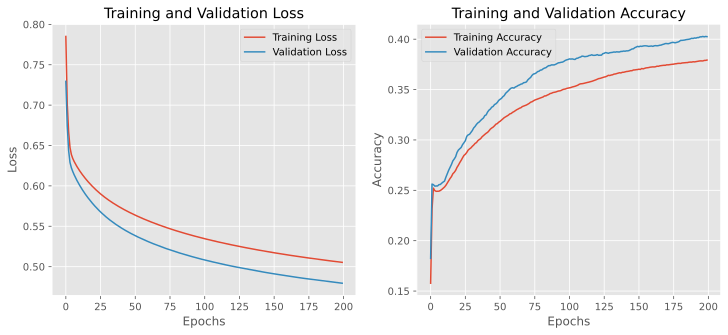

Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a SVM on the fer dataset
Test Accuracy: 41.01%
              precision    recall  f1-score   support

       Angry       0.43      0.09      0.15       719
     Disgust       0.00      0.00      0.00        93
        Fear       0.31      0.20      0.24       763
       Happy       0.44      0.76      0.56      1383
         Sad       0.34      0.33      0.34       953
    Surprise       0.54      0.49      0.51       590
     Neutral       0.36      0.38      0.37       883

    accuracy                           0.41      5384
   macro avg       0.35      0.32      0.31      5384
weighted avg       0.39      0.41      0.37      5384

Precision: 0.39, Recall: 0.41, F1 Score: 0.37


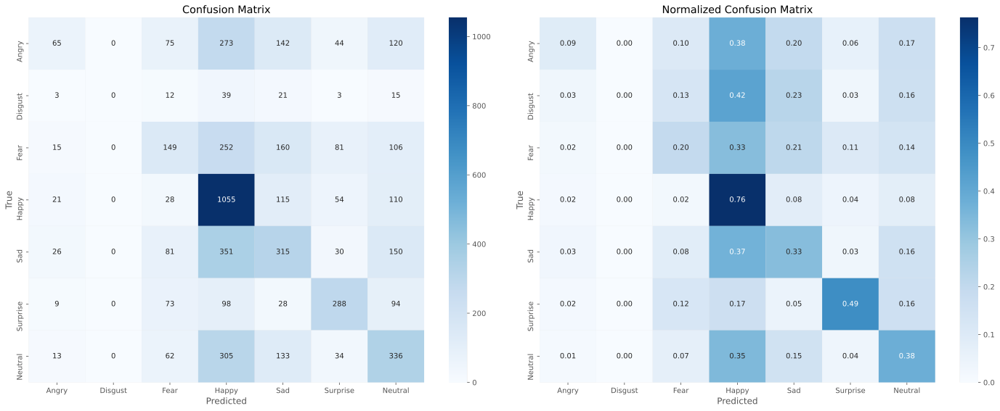

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_efficientnet_full_train_original_embeddings.npy and data/fer/fer_efficientnet_full_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7740, Accuracy: 0.2359
Validation - Loss: 0.7359, Accuracy: 0.2543
Time taken: 2.45 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.7162, Accuracy: 0.2543
Validation - Loss: 0.6926, Accuracy: 0.2582
Time taken: 3.40 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.6857, Accuracy: 0.2559
Validation

Epoch: 45/200
Training - Loss: 0.5655, Accuracy: 0.3014
Validation - Loss: 0.5613, Accuracy: 0.3037
Time taken: 2.34 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.5644, Accuracy: 0.3020
Validation - Loss: 0.5602, Accuracy: 0.3047
Time taken: 2.76 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.5633, Accuracy: 0.3029
Validation - Loss: 0.5591, Accuracy: 0.3061
Time taken: 2.42 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.5622, Accuracy: 0.3049
Validation - Loss: 0.5580, Accuracy: 0.3089
Time taken: 2.67 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.5611, Accuracy: 0.3059
Validation - Loss: 0.5570, Accuracy: 0.3099
Time taken: 2.40 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.5600, Accuracy: 0.3081
Validation - Loss: 0.5560, Accuracy: 0.3104
Time taken: 2.49 sec

Epoch: 92/200
Training - Loss: 0.5292, Accuracy: 0.3467
Validation - Loss: 0.5267, Accuracy: 0.3491
Time taken: 2.38 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.5287, Accuracy: 0.3473
Validation - Loss: 0.5262, Accuracy: 0.3498
Time taken: 2.36 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.5282, Accuracy: 0.3478
Validation - Loss: 0.5257, Accuracy: 0.3507
Time taken: 2.48 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.5277, Accuracy: 0.3486
Validation - Loss: 0.5252, Accuracy: 0.3522
Time taken: 2.40 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.5271, Accuracy: 0.3493
Validation - Loss: 0.5247, Accuracy: 0.3535
Time taken: 2.80 seconds
--------------------------------------------------
Epoch: 97/200
Training - Loss: 0.5266, Accuracy: 0.3496
Validation - Loss: 0.5242, Accuracy: 0.3548
Time taken: 2.45 sec

Epoch: 139/200
Training - Loss: 0.5094, Accuracy: 0.3732
Validation - Loss: 0.5078, Accuracy: 0.3756
Time taken: 2.79 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.5090, Accuracy: 0.3734
Validation - Loss: 0.5075, Accuracy: 0.3760
Time taken: 2.34 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.5087, Accuracy: 0.3742
Validation - Loss: 0.5072, Accuracy: 0.3766
Time taken: 2.45 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.5083, Accuracy: 0.3744
Validation - Loss: 0.5069, Accuracy: 0.3769
Time taken: 2.42 seconds
--------------------------------------------------
Epoch: 143/200
Training - Loss: 0.5080, Accuracy: 0.3745
Validation - Loss: 0.5066, Accuracy: 0.3777
Time taken: 3.35 seconds
--------------------------------------------------
Epoch: 144/200
Training - Loss: 0.5077, Accuracy: 0.3746
Validation - Loss: 0.5062, Accuracy: 0.3780
Time taken: 2.

Epoch: 186/200
Training - Loss: 0.4956, Accuracy: 0.3893
Validation - Loss: 0.4948, Accuracy: 0.3922
Time taken: 2.31 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.4953, Accuracy: 0.3892
Validation - Loss: 0.4946, Accuracy: 0.3925
Time taken: 2.54 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.4951, Accuracy: 0.3895
Validation - Loss: 0.4944, Accuracy: 0.3925
Time taken: 2.36 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.4948, Accuracy: 0.3898
Validation - Loss: 0.4941, Accuracy: 0.3927
Time taken: 2.70 seconds
--------------------------------------------------
Epoch: 190/200
Training - Loss: 0.4946, Accuracy: 0.3896
Validation - Loss: 0.4939, Accuracy: 0.3929
Time taken: 2.96 seconds
--------------------------------------------------
Epoch: 191/200
Training - Loss: 0.4943, Accuracy: 0.3896
Validation - Loss: 0.4937, Accuracy: 0.3931
Time taken: 2.

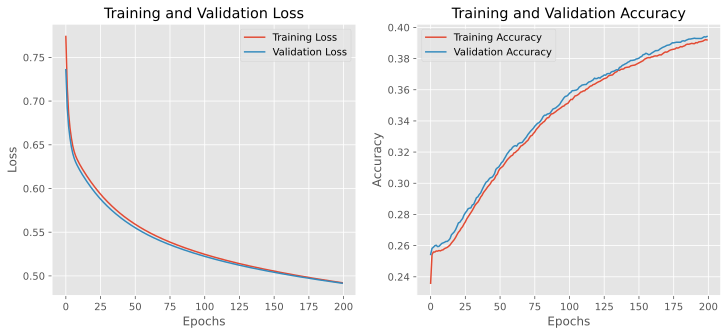

Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a SVM on the fer dataset
Test Accuracy: 39.43%
              precision    recall  f1-score   support

       Angry       0.35      0.02      0.04       719
     Disgust       0.00      0.00      0.00        93
        Fear       0.32      0.12      0.18       763
       Happy       0.40      0.78      0.53      1383
         Sad       0.33      0.37      0.35       953
    Surprise       0.56      0.47      0.51       590
     Neutral       0.39      0.34      0.36       883

    accuracy                           0.39      5384
   macro avg       0.34      0.30      0.28      5384
weighted avg       0.38      0.39      0.34      5384

Precision: 0.38, Recall: 0.39, F1 Score: 0.34


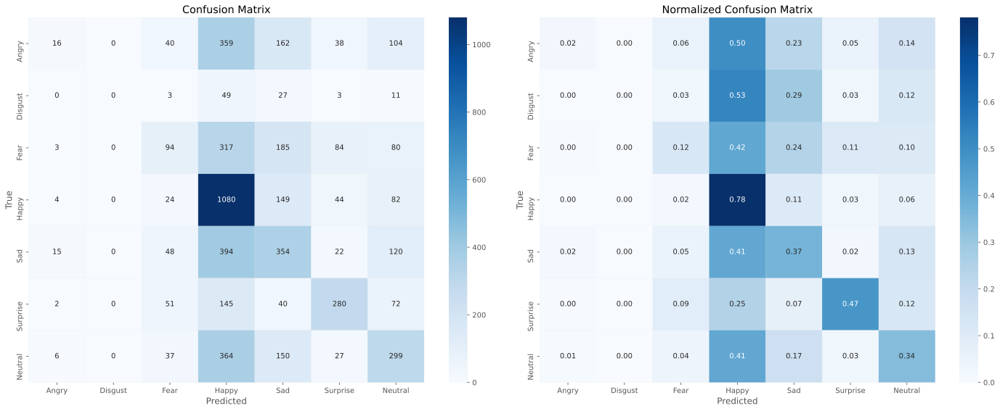

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.8974, Accuracy: 0.2157
Validation - Loss: 1.7475, Accuracy: 0.3004
Time taken: 4.58 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.7909, Accuracy: 0.2733
Validation - Loss: 1.6515, Accuracy: 0.3743
Time taken: 4.35 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.7264, Accuracy: 0.3087
Validation - Loss: 1.6013, Accuracy: 0.3769
Time taken: 4.63 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.68

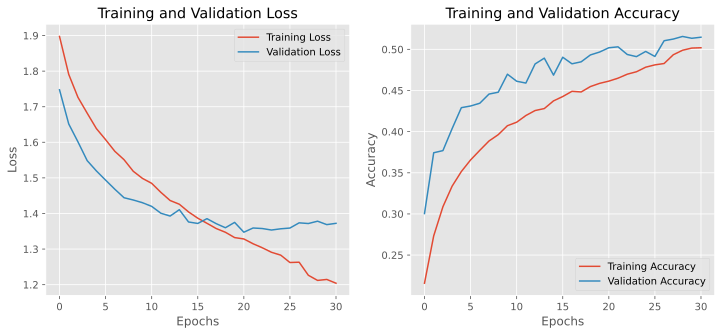

Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a NN on the fer dataset
Test Accuracy: 51.60%
              precision    recall  f1-score   support

       Angry       0.38      0.42      0.40       719
     Disgust       0.33      0.61      0.43        93
        Fear       0.39      0.27      0.32       763
       Happy       0.74      0.69      0.71      1383
         Sad       0.40      0.35      0.38       953
    Surprise       0.60      0.73      0.66       590
     Neutral       0.47      0.57      0.51       883

    accuracy                           0.52      5384
   macro avg       0.47      0.52      0.49      5384
weighted avg       0.52      0.52      0.51      5384

Precision: 0.52, Recall: 0.52, F1 Score: 0.51


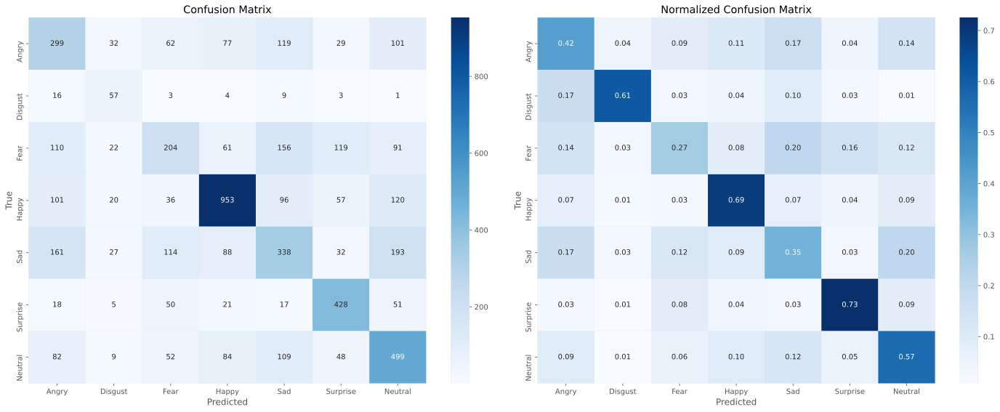

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9077, Accuracy: 0.2082
Validation - Loss: 1.7755, Accuracy: 0.3173
Time taken: 2.79 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.7886, Accuracy: 0.2675
Validation - Loss: 1.6949, Accuracy: 0.3792
Time taken: 3.14 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.7275, Accuracy: 0.3129
Validation - Loss: 1.6323, Accuracy: 0.3544
Time taken: 2.80 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.6

Epoch: 44/200
Training - Loss: 1.0458, Accuracy: 0.5695
Validation - Loss: 1.0664, Accuracy: 0.6052
Time taken: 3.31 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 1.0280, Accuracy: 0.5808
Validation - Loss: 1.0680, Accuracy: 0.5961
Time taken: 3.63 seconds
--------------------------------------------------
Epoch 45: No improvement in validation loss for 1 epochs.
Epoch: 46/200
Training - Loss: 1.0237, Accuracy: 0.5792
Validation - Loss: 1.0837, Accuracy: 0.6036
Time taken: 3.60 seconds
--------------------------------------------------
Epoch 46: No improvement in validation loss for 2 epochs.
Epoch: 47/200
Training - Loss: 1.0152, Accuracy: 0.5818
Validation - Loss: 1.0516, Accuracy: 0.6106
Time taken: 3.87 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 1.0186, Accuracy: 0.5806
Validation - Loss: 1.0617, Accuracy: 0.6028
Time taken: 3.50 seconds
--------------------------------------------------
Epoc

Epoch: 85/200
Training - Loss: 0.7829, Accuracy: 0.6808
Validation - Loss: 0.8754, Accuracy: 0.7098
Time taken: 2.92 seconds
--------------------------------------------------
Epoch: 86/200
Training - Loss: 0.7800, Accuracy: 0.6814
Validation - Loss: 0.8642, Accuracy: 0.7121
Time taken: 3.00 seconds
--------------------------------------------------
Epoch: 87/200
Training - Loss: 0.7724, Accuracy: 0.6876
Validation - Loss: 0.8982, Accuracy: 0.6972
Time taken: 2.87 seconds
--------------------------------------------------
Epoch 87: No improvement in validation loss for 1 epochs.
Epoch: 88/200
Training - Loss: 0.7745, Accuracy: 0.6845
Validation - Loss: 0.8665, Accuracy: 0.7178
Time taken: 2.94 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 2 epochs.
Epoch: 89/200
Training - Loss: 0.7706, Accuracy: 0.6896
Validation - Loss: 0.8700, Accuracy: 0.7219
Time taken: 2.87 seconds
--------------------------------------------------
Epoc

Epoch: 124/200
Training - Loss: 0.6091, Accuracy: 0.7559
Validation - Loss: 0.7274, Accuracy: 0.7890
Time taken: 2.91 seconds
--------------------------------------------------
Epoch: 125/200
Training - Loss: 0.6123, Accuracy: 0.7568
Validation - Loss: 0.7341, Accuracy: 0.7841
Time taken: 3.35 seconds
--------------------------------------------------
Epoch 125: No improvement in validation loss for 1 epochs.
Epoch: 126/200
Training - Loss: 0.6003, Accuracy: 0.7574
Validation - Loss: 0.7179, Accuracy: 0.7897
Time taken: 3.51 seconds
--------------------------------------------------
Epoch: 127/200
Training - Loss: 0.6020, Accuracy: 0.7578
Validation - Loss: 0.7318, Accuracy: 0.7897
Time taken: 3.45 seconds
--------------------------------------------------
Epoch 127: No improvement in validation loss for 1 epochs.
Epoch: 128/200
Training - Loss: 0.5939, Accuracy: 0.7654
Validation - Loss: 0.7138, Accuracy: 0.7884
Time taken: 3.45 seconds
------------------------------------------------

Epoch: 162/200
Training - Loss: 0.4827, Accuracy: 0.8129
Validation - Loss: 0.6578, Accuracy: 0.8194
Time taken: 2.93 seconds
--------------------------------------------------
Epoch: 163/200
Training - Loss: 0.4717, Accuracy: 0.8192
Validation - Loss: 0.6586, Accuracy: 0.8191
Time taken: 2.64 seconds
--------------------------------------------------
Epoch 163: No improvement in validation loss for 1 epochs.
Epoch: 164/200
Training - Loss: 0.4829, Accuracy: 0.8112
Validation - Loss: 0.6589, Accuracy: 0.8198
Time taken: 2.68 seconds
--------------------------------------------------
Epoch 164: No improvement in validation loss for 2 epochs.
Epoch: 165/200
Training - Loss: 0.4817, Accuracy: 0.8131
Validation - Loss: 0.6587, Accuracy: 0.8196
Time taken: 2.91 seconds
--------------------------------------------------
Epoch 165: No improvement in validation loss for 3 epochs.
Epoch: 166/200
Training - Loss: 0.4774, Accuracy: 0.8125
Validation - Loss: 0.6586, Accuracy: 0.8202
Time taken: 2.

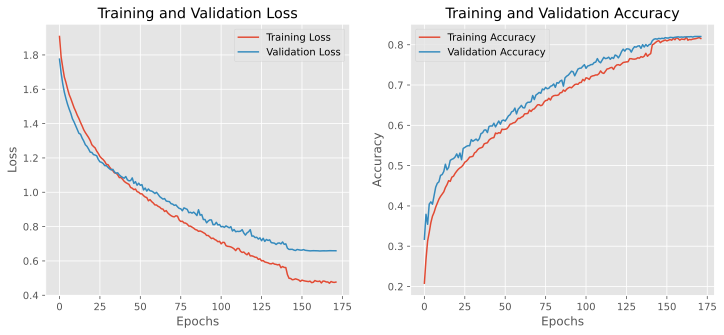

Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a NN on the fer dataset
Test Accuracy: 81.74%
              precision    recall  f1-score   support

       Angry       0.79      0.77      0.78       719
     Disgust       0.89      0.85      0.87        93
        Fear       0.79      0.75      0.77       763
       Happy       0.91      0.88      0.89      1383
         Sad       0.74      0.76      0.75       953
    Surprise       0.87      0.92      0.89       590
     Neutral       0.76      0.80      0.78       883

    accuracy                           0.82      5384
   macro avg       0.82      0.82      0.82      5384
weighted avg       0.82      0.82      0.82      5384

Precision: 0.82, Recall: 0.82, F1 Score: 0.82


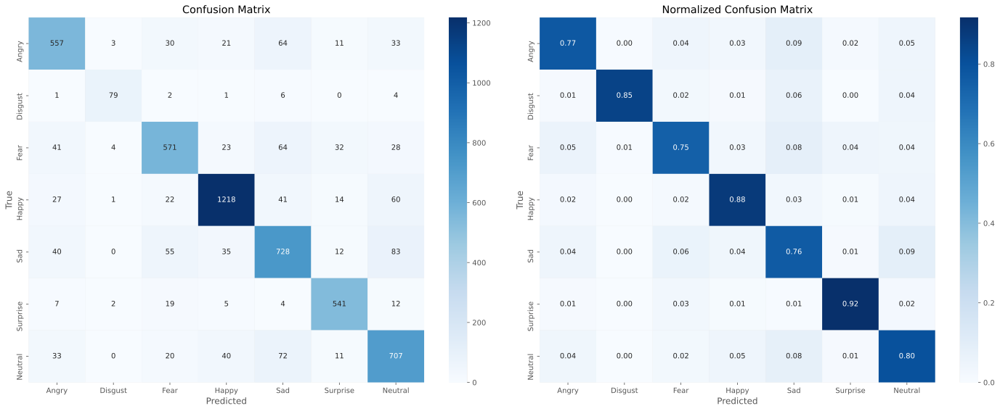

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.81776	eval-mlogloss:1.82849
[1]	train-mlogloss:1.72414	eval-mlogloss:1.74926
[2]	train-mlogloss:1.65036	eval-mlogloss:1.68876
[3]	train-mlogloss:1.59020	eval-mlogloss:1.64067
[4]	train-mlogloss:1.53864	eval-mlogloss:1.60458
[5]	train-mlogloss:1.49366	eval-mlogloss:1.57322
[6]	train-mlogloss:1.45410	eval-mlogloss:1.54929
[7]	train-mlogloss:1.41784	eval-mlogloss:1.52960
[8]	train-mlogloss:1.38598	eval-mlogloss:1.51263
[9]	train-mlogloss:1.35562	eval-mlogloss:1.49811
[10]	train-mlogloss:1.32681	eval-mlogloss:1.48634
[11]	train-mlogloss

[155]	train-mlogloss:0.25069	eval-mlogloss:1.30630
[156]	train-mlogloss:0.24818	eval-mlogloss:1.30633
[157]	train-mlogloss:0.24532	eval-mlogloss:1.30620
[158]	train-mlogloss:0.24299	eval-mlogloss:1.30625
[159]	train-mlogloss:0.24088	eval-mlogloss:1.30614
[160]	train-mlogloss:0.23837	eval-mlogloss:1.30671
[161]	train-mlogloss:0.23639	eval-mlogloss:1.30603
[162]	train-mlogloss:0.23379	eval-mlogloss:1.30584
[163]	train-mlogloss:0.23157	eval-mlogloss:1.30599
[164]	train-mlogloss:0.22952	eval-mlogloss:1.30629
[165]	train-mlogloss:0.22731	eval-mlogloss:1.30664
[166]	train-mlogloss:0.22522	eval-mlogloss:1.30673
[167]	train-mlogloss:0.22325	eval-mlogloss:1.30696
[168]	train-mlogloss:0.22125	eval-mlogloss:1.30667
[169]	train-mlogloss:0.21868	eval-mlogloss:1.30638
Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a RF on the fer dataset
Test Accuracy: 0.5319
              precision    recall  f1-score   support

       Angry       0.43   

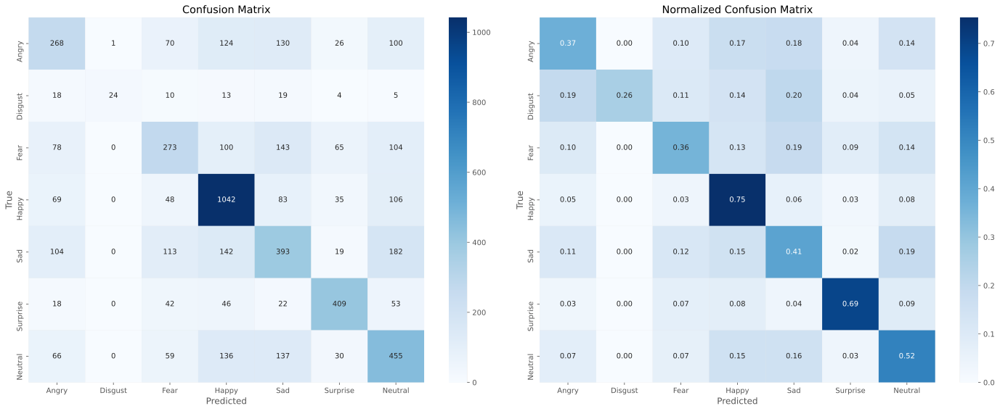

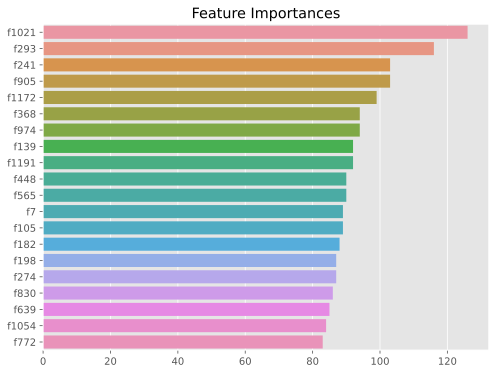

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.76610	eval-mlogloss:1.78286
[1]	train-mlogloss:1.63991	eval-mlogloss:1.66853
[2]	train-mlogloss:1.54015	eval-mlogloss:1.57806
[3]	train-mlogloss:1.45944	eval-mlogloss:1.50844
[4]	train-mlogloss:1.38992	eval-mlogloss:1.44939
[5]	train-mlogloss:1.32836	eval-mlogloss:1.39711
[6]	train-mlogloss:1.27443	eval-mlogloss:1.35210
[7]	train-mlogloss:1.22625	eval-mlogloss:1.31295
[8]	train-mlogloss:1.18244	eval-mlogloss:1.27742
[9]	train-mlogloss:1.14084	eval-mlogloss:1.24293
[10]	train-mlogloss:1.10282	eval-mlogloss:1.21137
[11]	train-mloglos

[155]	train-mlogloss:0.05912	eval-mlogloss:0.42007
[156]	train-mlogloss:0.05803	eval-mlogloss:0.41945
[157]	train-mlogloss:0.05704	eval-mlogloss:0.41889
[158]	train-mlogloss:0.05616	eval-mlogloss:0.41842
[159]	train-mlogloss:0.05518	eval-mlogloss:0.41791
[160]	train-mlogloss:0.05441	eval-mlogloss:0.41705
[161]	train-mlogloss:0.05358	eval-mlogloss:0.41657
[162]	train-mlogloss:0.05264	eval-mlogloss:0.41582
[163]	train-mlogloss:0.05182	eval-mlogloss:0.41536
[164]	train-mlogloss:0.05089	eval-mlogloss:0.41505
[165]	train-mlogloss:0.05013	eval-mlogloss:0.41460
[166]	train-mlogloss:0.04934	eval-mlogloss:0.41397
[167]	train-mlogloss:0.04854	eval-mlogloss:0.41339
[168]	train-mlogloss:0.04772	eval-mlogloss:0.41294
[169]	train-mlogloss:0.04685	eval-mlogloss:0.41262
[170]	train-mlogloss:0.04623	eval-mlogloss:0.41225
[171]	train-mlogloss:0.04548	eval-mlogloss:0.41169
[172]	train-mlogloss:0.04471	eval-mlogloss:0.41116
[173]	train-mlogloss:0.04401	eval-mlogloss:0.41124
[174]	train-mlogloss:0.04338	ev

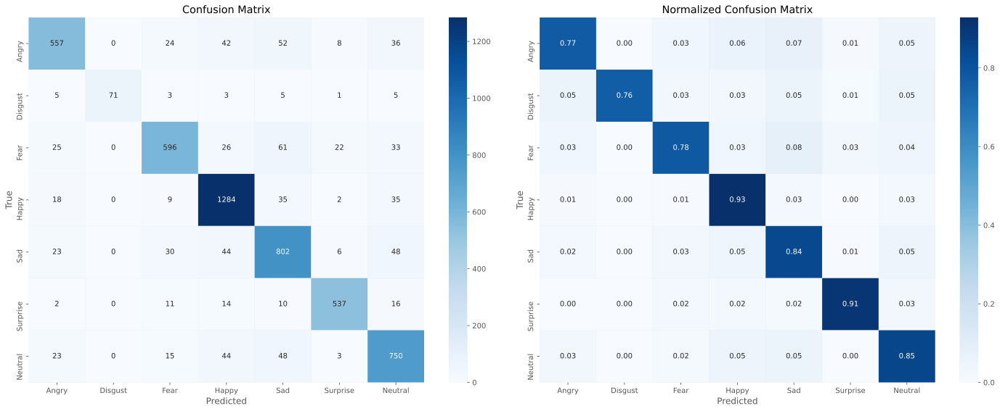

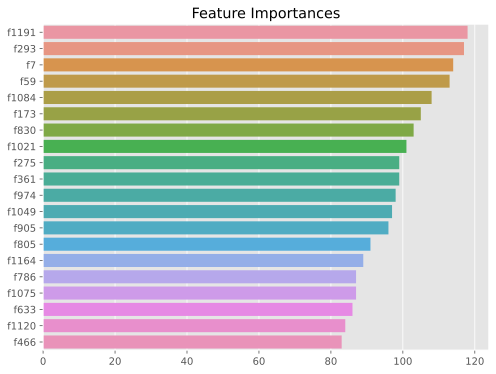

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_resnet_partial_train_augmented_embeddings.npy and data/fer/fer_resnet_partial_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_resnet_partial_val_original_embeddings.npy and data/fer/fer_resnet_partial_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_resnet_partial_test_original_embeddings.npy and data/fer/fer_resnet_partial_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.5416, Accuracy: 0.3404
Validation - Loss: 0.4703, Accuracy: 0.4094
Time taken: 3.64 seconds
---------------------------------

Epoch: 37/200
Training - Loss: 0.4074, Accuracy: 0.4616
Validation - Loss: 0.3976, Accuracy: 0.4733
Time taken: 3.74 seconds
--------------------------------------------------
Epoch 37: No improvement in validation loss for 2 epochs.
Epoch: 38/200
Training - Loss: 0.4074, Accuracy: 0.4612
Validation - Loss: 0.3962, Accuracy: 0.4693
Time taken: 3.64 seconds
--------------------------------------------------
Epoch 38: No improvement in validation loss for 3 epochs.
Epoch: 39/200
Training - Loss: 0.4073, Accuracy: 0.4609
Validation - Loss: 0.3965, Accuracy: 0.4719
Time taken: 3.77 seconds
--------------------------------------------------
Epoch 39: No improvement in validation loss for 4 epochs.
Epoch: 40/200
Training - Loss: 0.4072, Accuracy: 0.4610
Validation - Loss: 0.3964, Accuracy: 0.4668
Time taken: 3.65 seconds
--------------------------------------------------
Epoch 40: No improvement in validation loss for 5 epochs.
Epoch 00041: reducing learning rate of group 0 to 1.0000e-04.
Ep

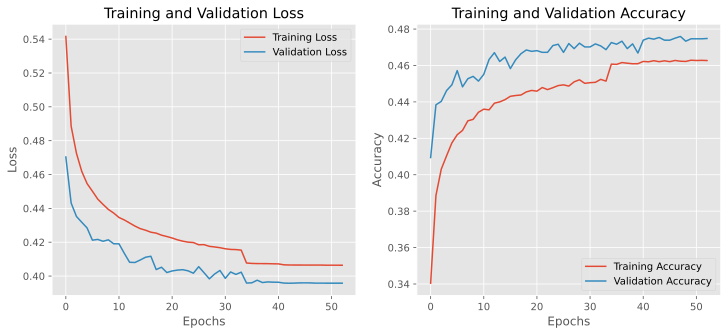

Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a SVM on the fer dataset
Test Accuracy: 46.49%
              precision    recall  f1-score   support

       Angry       0.36      0.28      0.31       722
     Disgust       0.00      0.00      0.00        79
        Fear       0.36      0.22      0.28       804
       Happy       0.57      0.70      0.63      1299
         Sad       0.37      0.43      0.40       951
    Surprise       0.62      0.60      0.61       593
     Neutral       0.43      0.48      0.46       936

    accuracy                           0.46      5384
   macro avg       0.39      0.39      0.38      5384
weighted avg       0.45      0.46      0.45      5384

Precision: 0.45, Recall: 0.46, F1 Score: 0.45


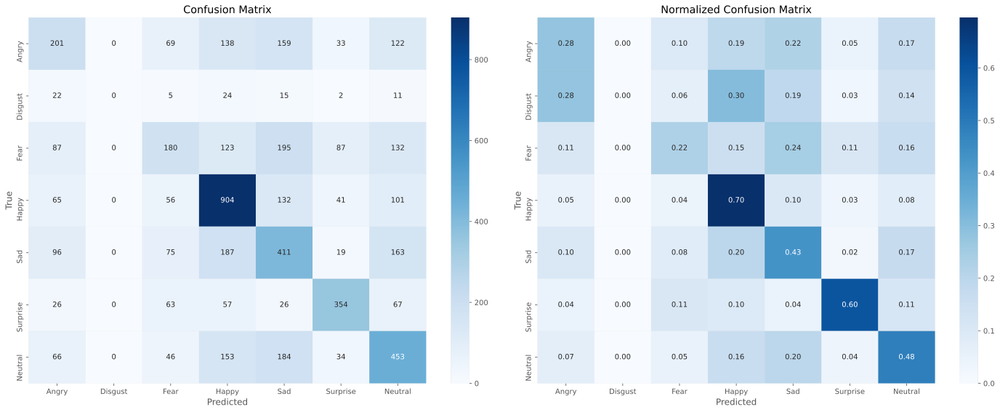

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_resnet_partial_train_original_embeddings.npy and data/fer/fer_resnet_partial_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.5454, Accuracy: 0.3354
Validation - Loss: 0.5037, Accuracy: 0.3591
Time taken: 2.46 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.4796, Accuracy: 0.4026
Validation - Loss: 0.4561, Accuracy: 0.4145
Time taken: 2.66 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.4595, Accuracy: 0.4183
Validation - Loss: 

Epoch: 38/200
Training - Loss: 0.3836, Accuracy: 0.4854
Validation - Loss: 0.3750, Accuracy: 0.4910
Time taken: 2.56 seconds
--------------------------------------------------
Epoch: 39/200
Training - Loss: 0.3832, Accuracy: 0.4828
Validation - Loss: 0.3879, Accuracy: 0.4696
Time taken: 2.79 seconds
--------------------------------------------------
Epoch 39: No improvement in validation loss for 1 epochs.
Epoch: 40/200
Training - Loss: 0.3826, Accuracy: 0.4837
Validation - Loss: 0.3778, Accuracy: 0.4823
Time taken: 2.50 seconds
--------------------------------------------------
Epoch 40: No improvement in validation loss for 2 epochs.
Epoch: 41/200
Training - Loss: 0.3820, Accuracy: 0.4822
Validation - Loss: 0.3766, Accuracy: 0.4821
Time taken: 3.29 seconds
--------------------------------------------------
Epoch 41: No improvement in validation loss for 3 epochs.
Epoch: 42/200
Training - Loss: 0.3820, Accuracy: 0.4866
Validation - Loss: 0.3818, Accuracy: 0.4802
Time taken: 2.97 secon

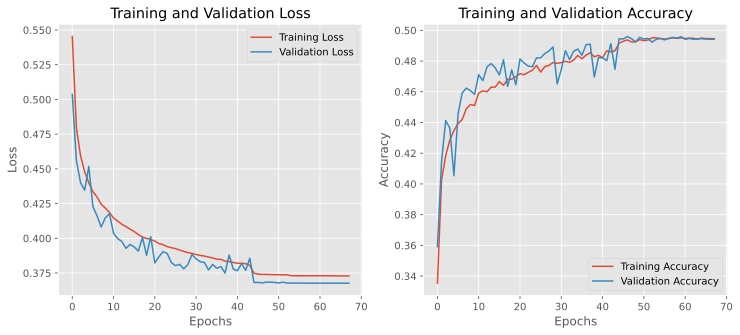

Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a SVM on the fer dataset
Test Accuracy: 49.11%
              precision    recall  f1-score   support

       Angry       0.39      0.30      0.34       722
     Disgust       1.00      0.01      0.02        79
        Fear       0.40      0.25      0.31       804
       Happy       0.59      0.72      0.65      1299
         Sad       0.39      0.46      0.42       951
    Surprise       0.64      0.62      0.63       593
     Neutral       0.46      0.51      0.49       936

    accuracy                           0.49      5384
   macro avg       0.55      0.41      0.41      5384
weighted avg       0.49      0.49      0.48      5384

Precision: 0.49, Recall: 0.49, F1 Score: 0.48


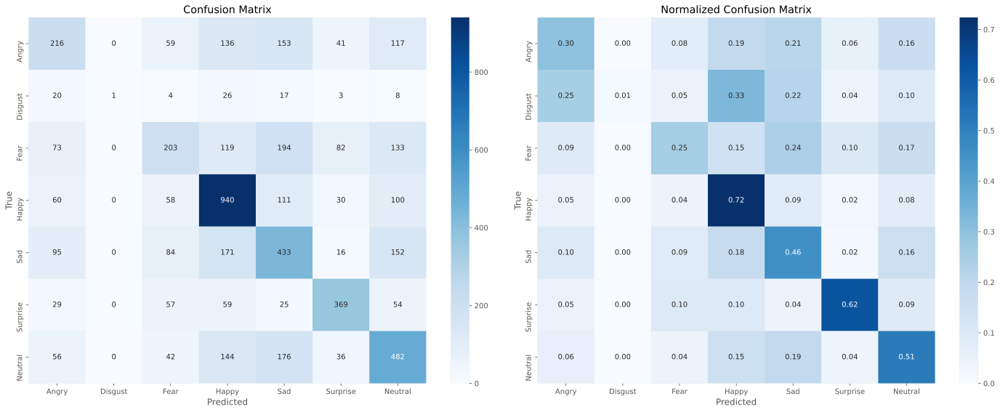

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9938, Accuracy: 0.1838
Validation - Loss: 1.8137, Accuracy: 0.3074
Time taken: 5.45 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.8606, Accuracy: 0.2375
Validation - Loss: 1.7468, Accuracy: 0.3437
Time taken: 4.41 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8150, Accuracy: 0.2646
Validation - Loss: 1.6987, Accuracy: 0.3844
Time taken: 4.48 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.7816,

Epoch: 42/200
Training - Loss: 1.3696, Accuracy: 0.4398
Validation - Loss: 1.4007, Accuracy: 0.4847
Time taken: 3.93 seconds
--------------------------------------------------
Epoch 42: No improvement in validation loss for 2 epochs.
Epoch: 43/200
Training - Loss: 1.3635, Accuracy: 0.4425
Validation - Loss: 1.3775, Accuracy: 0.4806
Time taken: 4.31 seconds
--------------------------------------------------
Epoch 43: No improvement in validation loss for 3 epochs.
Epoch: 44/200
Training - Loss: 1.3675, Accuracy: 0.4412
Validation - Loss: 1.3609, Accuracy: 0.4785
Time taken: 4.02 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 1.3551, Accuracy: 0.4453
Validation - Loss: 1.3676, Accuracy: 0.4726
Time taken: 4.27 seconds
--------------------------------------------------
Epoch 45: No improvement in validation loss for 1 epochs.
Epoch: 46/200
Training - Loss: 1.3488, Accuracy: 0.4451
Validation - Loss: 1.3612, Accuracy: 0.4784
Time taken: 4.26 secon

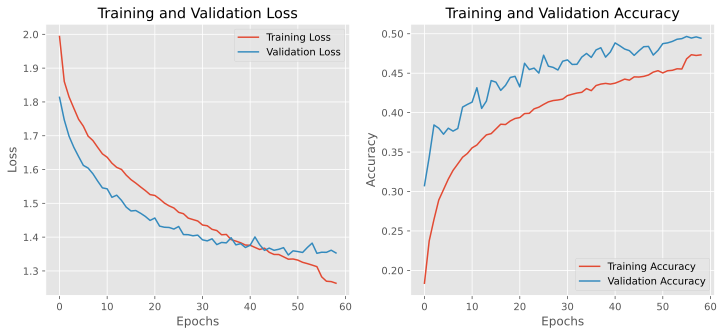

Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a NN on the fer dataset
Test Accuracy: 48.33%
              precision    recall  f1-score   support

       Angry       0.36      0.43      0.39       722
     Disgust       0.34      0.62      0.44        79
        Fear       0.40      0.22      0.29       804
       Happy       0.68      0.61      0.64      1299
         Sad       0.40      0.38      0.39       951
    Surprise       0.57      0.74      0.64       593
     Neutral       0.44      0.50      0.47       936

    accuracy                           0.48      5384
   macro avg       0.45      0.50      0.47      5384
weighted avg       0.49      0.48      0.48      5384

Precision: 0.49, Recall: 0.48, F1 Score: 0.48


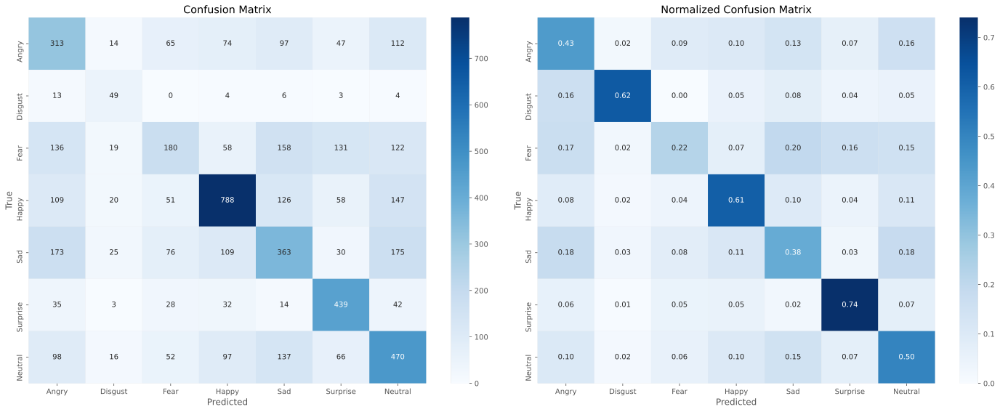

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.0511, Accuracy: 0.1731
Validation - Loss: 1.8563, Accuracy: 0.2731
Time taken: 3.12 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.8739, Accuracy: 0.2268
Validation - Loss: 1.7871, Accuracy: 0.3125
Time taken: 2.64 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8224, Accuracy: 0.2576
Validation - Loss: 1.7394, Accuracy: 0.3242
Time taken: 2.61 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.7807

Epoch: 44/200
Training - Loss: 1.3030, Accuracy: 0.4669
Validation - Loss: 1.2692, Accuracy: 0.5060
Time taken: 2.81 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 1.2927, Accuracy: 0.4706
Validation - Loss: 1.2708, Accuracy: 0.4928
Time taken: 2.65 seconds
--------------------------------------------------
Epoch 45: No improvement in validation loss for 1 epochs.
Epoch: 46/200
Training - Loss: 1.2911, Accuracy: 0.4672
Validation - Loss: 1.2712, Accuracy: 0.5042
Time taken: 2.64 seconds
--------------------------------------------------
Epoch 46: No improvement in validation loss for 2 epochs.
Epoch: 47/200
Training - Loss: 1.2850, Accuracy: 0.4711
Validation - Loss: 1.2558, Accuracy: 0.5157
Time taken: 3.26 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 1.2696, Accuracy: 0.4780
Validation - Loss: 1.2531, Accuracy: 0.5092
Time taken: 2.90 seconds
--------------------------------------------------
Epoc

Epoch: 85/200
Training - Loss: 1.1209, Accuracy: 0.5294
Validation - Loss: 1.1583, Accuracy: 0.5705
Time taken: 2.64 seconds
--------------------------------------------------
Epoch: 86/200
Training - Loss: 1.1189, Accuracy: 0.5288
Validation - Loss: 1.1569, Accuracy: 0.5742
Time taken: 3.01 seconds
--------------------------------------------------
Epoch: 87/200
Training - Loss: 1.1170, Accuracy: 0.5310
Validation - Loss: 1.1605, Accuracy: 0.5761
Time taken: 3.42 seconds
--------------------------------------------------
Epoch 87: No improvement in validation loss for 1 epochs.
Epoch: 88/200
Training - Loss: 1.1169, Accuracy: 0.5295
Validation - Loss: 1.1569, Accuracy: 0.5746
Time taken: 2.72 seconds
--------------------------------------------------
Epoch: 89/200
Training - Loss: 1.1134, Accuracy: 0.5337
Validation - Loss: 1.1649, Accuracy: 0.5763
Time taken: 2.74 seconds
--------------------------------------------------
Epoch 89: No improvement in validation loss for 1 epochs.
Epoc

Epoch: 124/200
Training - Loss: 1.0026, Accuracy: 0.5793
Validation - Loss: 1.0923, Accuracy: 0.6143
Time taken: 2.68 seconds
--------------------------------------------------
Epoch: 125/200
Training - Loss: 0.9991, Accuracy: 0.5785
Validation - Loss: 1.0934, Accuracy: 0.6147
Time taken: 2.66 seconds
--------------------------------------------------
Epoch 125: No improvement in validation loss for 1 epochs.
Epoch: 126/200
Training - Loss: 0.9930, Accuracy: 0.5816
Validation - Loss: 1.0948, Accuracy: 0.6127
Time taken: 2.88 seconds
--------------------------------------------------
Epoch 126: No improvement in validation loss for 2 epochs.
Epoch: 127/200
Training - Loss: 0.9986, Accuracy: 0.5783
Validation - Loss: 1.0970, Accuracy: 0.6160
Time taken: 2.84 seconds
--------------------------------------------------
Epoch 127: No improvement in validation loss for 3 epochs.
Epoch: 128/200
Training - Loss: 0.9987, Accuracy: 0.5788
Validation - Loss: 1.0975, Accuracy: 0.6145
Time taken: 3.

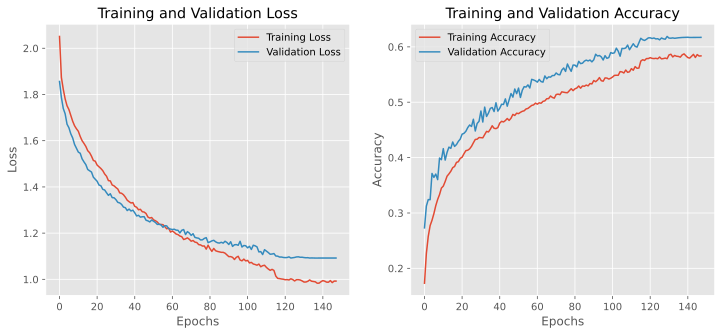

Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a NN on the fer dataset
Test Accuracy: 61.14%
              precision    recall  f1-score   support

       Angry       0.52      0.54      0.53       722
     Disgust       0.86      0.84      0.85        79
        Fear       0.56      0.42      0.48       804
       Happy       0.74      0.71      0.72      1299
         Sad       0.52      0.50      0.51       951
    Surprise       0.71      0.84      0.77       593
     Neutral       0.55      0.64      0.60       936

    accuracy                           0.61      5384
   macro avg       0.64      0.64      0.64      5384
weighted avg       0.61      0.61      0.61      5384

Precision: 0.61, Recall: 0.61, F1 Score: 0.61


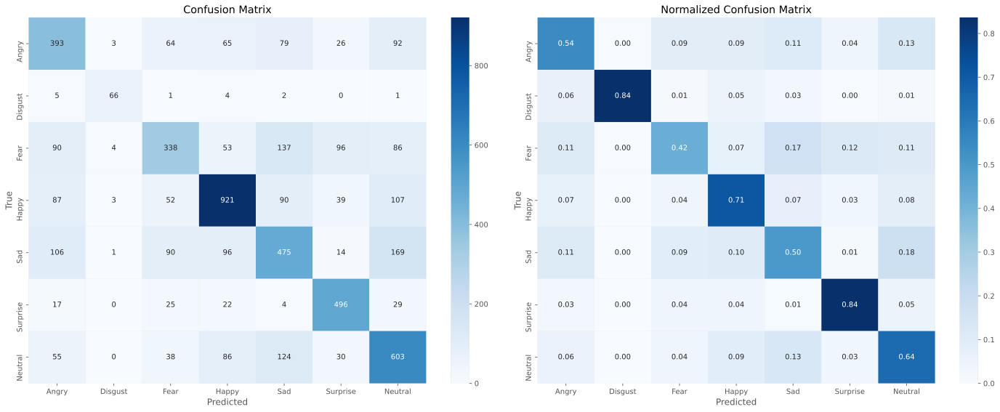

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.82804	eval-mlogloss:1.83506
[1]	train-mlogloss:1.74160	eval-mlogloss:1.75803
[2]	train-mlogloss:1.67211	eval-mlogloss:1.70182
[3]	train-mlogloss:1.61591	eval-mlogloss:1.65816
[4]	train-mlogloss:1.56860	eval-mlogloss:1.62257
[5]	train-mlogloss:1.52644	eval-mlogloss:1.59336
[6]	train-mlogloss:1.49014	eval-mlogloss:1.57062
[7]	train-mlogloss:1.45642	eval-mlogloss:1.55117
[8]	train-mlogloss:1.42546	eval-mlogloss:1.53326
[9]	train-mlogloss:1.39723	eval-mlogloss:1.51872
[10]	train-mlogloss:1.37076	eval-mlogloss:1.50591
[11]	train-mlogloss:1.

[155]	train-mlogloss:0.30954	eval-mlogloss:1.29821
[156]	train-mlogloss:0.30649	eval-mlogloss:1.29799
[157]	train-mlogloss:0.30344	eval-mlogloss:1.29785
[158]	train-mlogloss:0.30067	eval-mlogloss:1.29768
[159]	train-mlogloss:0.29832	eval-mlogloss:1.29725
[160]	train-mlogloss:0.29547	eval-mlogloss:1.29695
[161]	train-mlogloss:0.29215	eval-mlogloss:1.29697
[162]	train-mlogloss:0.28925	eval-mlogloss:1.29666
[163]	train-mlogloss:0.28684	eval-mlogloss:1.29625
[164]	train-mlogloss:0.28437	eval-mlogloss:1.29625
[165]	train-mlogloss:0.28191	eval-mlogloss:1.29579
[166]	train-mlogloss:0.27964	eval-mlogloss:1.29539
[167]	train-mlogloss:0.27761	eval-mlogloss:1.29522
[168]	train-mlogloss:0.27475	eval-mlogloss:1.29488
[169]	train-mlogloss:0.27202	eval-mlogloss:1.29517
[170]	train-mlogloss:0.26959	eval-mlogloss:1.29511
[171]	train-mlogloss:0.26700	eval-mlogloss:1.29525
[172]	train-mlogloss:0.26472	eval-mlogloss:1.29523
[173]	train-mlogloss:0.26194	eval-mlogloss:1.29532
[174]	train-mlogloss:0.25969	ev

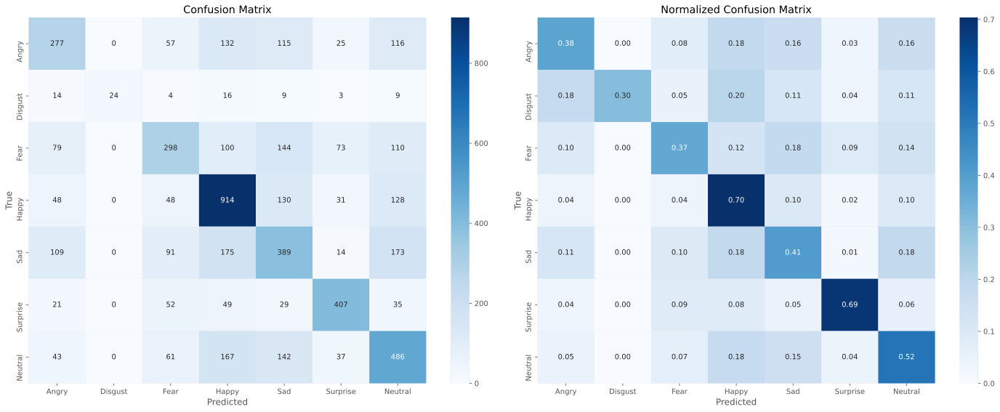

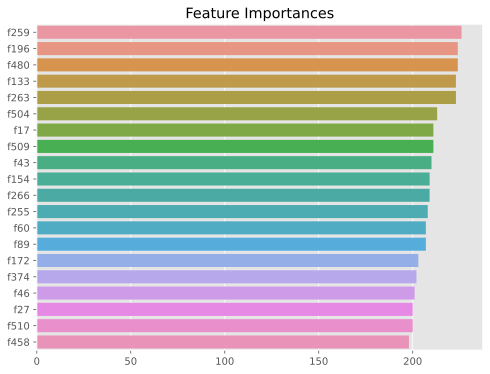

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.78056	eval-mlogloss:1.79489
[1]	train-mlogloss:1.66597	eval-mlogloss:1.69116
[2]	train-mlogloss:1.57439	eval-mlogloss:1.60909
[3]	train-mlogloss:1.49671	eval-mlogloss:1.53909
[4]	train-mlogloss:1.43100	eval-mlogloss:1.48260
[5]	train-mlogloss:1.37386	eval-mlogloss:1.43246
[6]	train-mlogloss:1.32354	eval-mlogloss:1.38845
[7]	train-mlogloss:1.27803	eval-mlogloss:1.35007
[8]	train-mlogloss:1.23752	eval-mlogloss:1.31553
[9]	train-mlogloss:1.19896	eval-mlogloss:1.28457
[10]	train-mlogloss:1.16104	eval-mlogloss:1.25330
[11]	train-mlogloss:1

[155]	train-mlogloss:0.08702	eval-mlogloss:0.46904
[156]	train-mlogloss:0.08593	eval-mlogloss:0.46838
[157]	train-mlogloss:0.08455	eval-mlogloss:0.46738
[158]	train-mlogloss:0.08306	eval-mlogloss:0.46636
[159]	train-mlogloss:0.08194	eval-mlogloss:0.46590
[160]	train-mlogloss:0.08083	eval-mlogloss:0.46558
[161]	train-mlogloss:0.07959	eval-mlogloss:0.46498
[162]	train-mlogloss:0.07830	eval-mlogloss:0.46418
[163]	train-mlogloss:0.07706	eval-mlogloss:0.46402
[164]	train-mlogloss:0.07572	eval-mlogloss:0.46321
[165]	train-mlogloss:0.07444	eval-mlogloss:0.46244
[166]	train-mlogloss:0.07338	eval-mlogloss:0.46191
[167]	train-mlogloss:0.07234	eval-mlogloss:0.46143
[168]	train-mlogloss:0.07144	eval-mlogloss:0.46103
[169]	train-mlogloss:0.07028	eval-mlogloss:0.46030
[170]	train-mlogloss:0.06920	eval-mlogloss:0.45959
[171]	train-mlogloss:0.06817	eval-mlogloss:0.45902
[172]	train-mlogloss:0.06715	eval-mlogloss:0.45863
[173]	train-mlogloss:0.06608	eval-mlogloss:0.45772
[174]	train-mlogloss:0.06503	ev

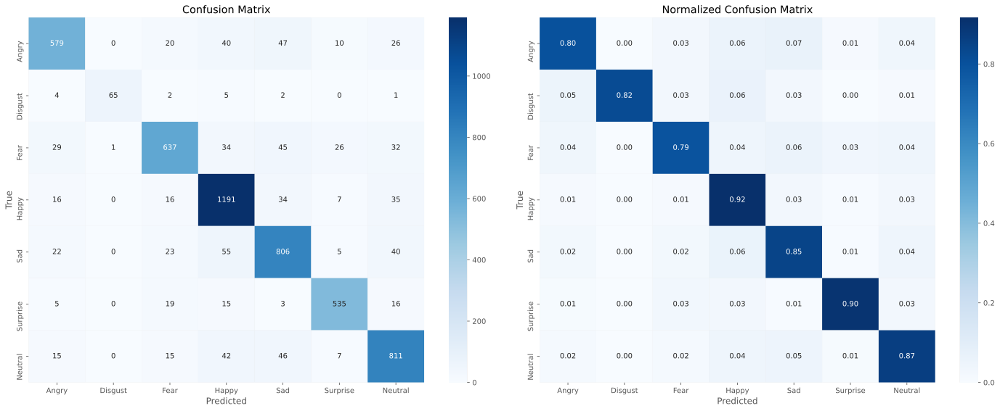

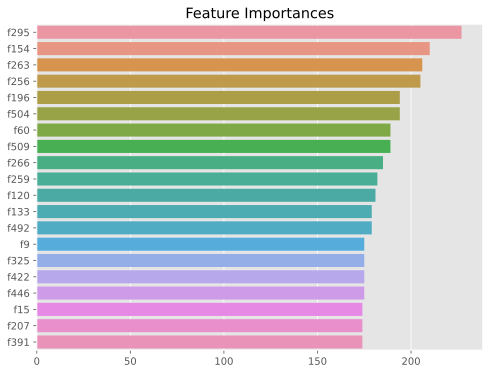

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_vit_partial_train_augmented_embeddings.npy and data/fer/fer_vit_partial_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_vit_partial_val_original_embeddings.npy and data/fer/fer_vit_partial_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_vit_partial_test_original_embeddings.npy and data/fer/fer_vit_partial_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.5648, Accuracy: 0.3500
Validation - Loss: 0.4611, Accuracy: 0.4501
Time taken: 3.64 seconds
--------------------------------------------------
Epo

Epoch: 43/200
Training - Loss: 0.3240, Accuracy: 0.5461
Validation - Loss: 0.3074, Accuracy: 0.5677
Time taken: 3.48 seconds
--------------------------------------------------
Epoch: 44/200
Training - Loss: 0.3235, Accuracy: 0.5461
Validation - Loss: 0.3076, Accuracy: 0.5699
Time taken: 3.63 seconds
--------------------------------------------------
Epoch 44: No improvement in validation loss for 1 epochs.
Epoch: 45/200
Training - Loss: 0.3230, Accuracy: 0.5464
Validation - Loss: 0.3070, Accuracy: 0.5699
Time taken: 3.65 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.3225, Accuracy: 0.5474
Validation - Loss: 0.3065, Accuracy: 0.5692
Time taken: 3.77 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.3220, Accuracy: 0.5481
Validation - Loss: 0.3062, Accuracy: 0.5707
Time taken: 3.48 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.3216, Accuracy: 0.5489
Valida

Epoch: 87/200
Training - Loss: 0.3095, Accuracy: 0.5596
Validation - Loss: 0.2982, Accuracy: 0.5803
Time taken: 3.91 seconds
--------------------------------------------------
Epoch: 88/200
Training - Loss: 0.3093, Accuracy: 0.5603
Validation - Loss: 0.2981, Accuracy: 0.5813
Time taken: 3.89 seconds
--------------------------------------------------
Epoch: 89/200
Training - Loss: 0.3091, Accuracy: 0.5607
Validation - Loss: 0.2977, Accuracy: 0.5807
Time taken: 4.03 seconds
--------------------------------------------------
Epoch: 90/200
Training - Loss: 0.3089, Accuracy: 0.5603
Validation - Loss: 0.2979, Accuracy: 0.5816
Time taken: 3.58 seconds
--------------------------------------------------
Epoch 90: No improvement in validation loss for 1 epochs.
Epoch: 91/200
Training - Loss: 0.3086, Accuracy: 0.5604
Validation - Loss: 0.2977, Accuracy: 0.5811
Time taken: 3.70 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.3085, Accuracy: 0.5609
Valida

Epoch: 128/200
Training - Loss: 0.3027, Accuracy: 0.5656
Validation - Loss: 0.2942, Accuracy: 0.5844
Time taken: 3.49 seconds
--------------------------------------------------
Epoch: 129/200
Training - Loss: 0.3026, Accuracy: 0.5659
Validation - Loss: 0.2945, Accuracy: 0.5852
Time taken: 4.67 seconds
--------------------------------------------------
Epoch 129: No improvement in validation loss for 1 epochs.
Epoch: 130/200
Training - Loss: 0.3024, Accuracy: 0.5657
Validation - Loss: 0.2945, Accuracy: 0.5829
Time taken: 3.70 seconds
--------------------------------------------------
Epoch 130: No improvement in validation loss for 2 epochs.
Epoch: 131/200
Training - Loss: 0.3023, Accuracy: 0.5662
Validation - Loss: 0.2943, Accuracy: 0.5835
Time taken: 3.31 seconds
--------------------------------------------------
Epoch 131: No improvement in validation loss for 3 epochs.
Epoch: 132/200
Training - Loss: 0.3022, Accuracy: 0.5662
Validation - Loss: 0.2941, Accuracy: 0.5850
Time taken: 3.

Epoch: 168/200
Training - Loss: 0.2981, Accuracy: 0.5691
Validation - Loss: 0.2923, Accuracy: 0.5870
Time taken: 3.66 seconds
--------------------------------------------------
Epoch 168: No improvement in validation loss for 7 epochs.
Epoch: 169/200
Training - Loss: 0.2981, Accuracy: 0.5694
Validation - Loss: 0.2923, Accuracy: 0.5859
Time taken: 3.39 seconds
--------------------------------------------------
Epoch 169: No improvement in validation loss for 8 epochs.
Epoch: 170/200
Training - Loss: 0.2981, Accuracy: 0.5692
Validation - Loss: 0.2923, Accuracy: 0.5865
Time taken: 3.58 seconds
--------------------------------------------------
Epoch 170: No improvement in validation loss for 9 epochs.
Epoch: 171/200
Training - Loss: 0.2981, Accuracy: 0.5693
Validation - Loss: 0.2923, Accuracy: 0.5859
Time taken: 4.16 seconds
--------------------------------------------------
Epoch 171: No improvement in validation loss for 10 epochs.
Stopping early after 171 epochs due to no improvement i

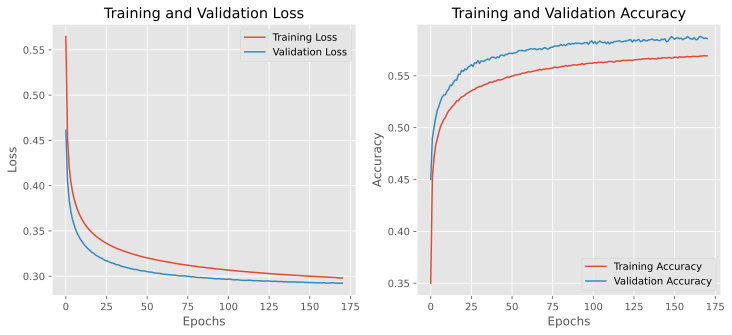

Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a SVM on the fer dataset
Test Accuracy: 58.38%
              precision    recall  f1-score   support

       Angry       0.46      0.41      0.43       754
     Disgust       0.00      0.00      0.00        81
        Fear       0.43      0.30      0.36       724
       Happy       0.78      0.82      0.80      1406
         Sad       0.47      0.53      0.50       880
    Surprise       0.68      0.67      0.68       629
     Neutral       0.51      0.63      0.56       910

    accuracy                           0.58      5384
   macro avg       0.48      0.48      0.48      5384
weighted avg       0.57      0.58      0.57      5384

Precision: 0.57, Recall: 0.58, F1 Score: 0.57


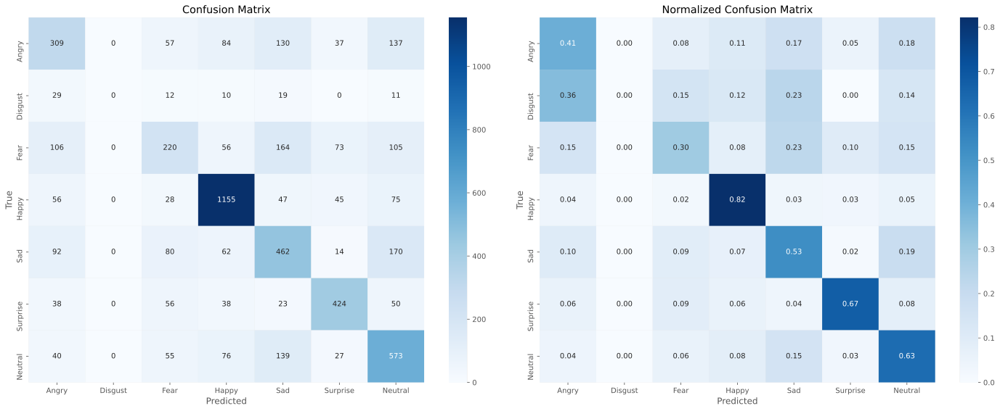

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_vit_partial_train_original_embeddings.npy and data/fer/fer_vit_partial_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.5818, Accuracy: 0.3370
Validation - Loss: 0.5023, Accuracy: 0.4245
Time taken: 2.55 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.4596, Accuracy: 0.4652
Validation - Loss: 0.4353, Accuracy: 0.4810
Time taken: 2.60 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.4174, Accuracy: 0.4894
Validation - Loss: 0.4069, A

Epoch: 45/200
Training - Loss: 0.3004, Accuracy: 0.5701
Validation - Loss: 0.3032, Accuracy: 0.5731
Time taken: 2.52 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.2998, Accuracy: 0.5699
Validation - Loss: 0.3027, Accuracy: 0.5737
Time taken: 2.43 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.2992, Accuracy: 0.5715
Validation - Loss: 0.3019, Accuracy: 0.5740
Time taken: 2.55 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.2986, Accuracy: 0.5723
Validation - Loss: 0.3013, Accuracy: 0.5746
Time taken: 2.42 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.2981, Accuracy: 0.5720
Validation - Loss: 0.3012, Accuracy: 0.5742
Time taken: 2.65 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.2975, Accuracy: 0.5729
Validation - Loss: 0.3006, Accuracy: 0.5755
Time taken: 3.19 sec

Epoch: 91/200
Training - Loss: 0.2823, Accuracy: 0.5881
Validation - Loss: 0.2862, Accuracy: 0.5887
Time taken: 2.52 seconds
--------------------------------------------------
Epoch 91: No improvement in validation loss for 1 epochs.
Epoch: 92/200
Training - Loss: 0.2820, Accuracy: 0.5880
Validation - Loss: 0.2859, Accuracy: 0.5894
Time taken: 2.37 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.2818, Accuracy: 0.5878
Validation - Loss: 0.2857, Accuracy: 0.5906
Time taken: 2.78 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.2815, Accuracy: 0.5887
Validation - Loss: 0.2853, Accuracy: 0.5894
Time taken: 2.43 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.2812, Accuracy: 0.5883
Validation - Loss: 0.2851, Accuracy: 0.5909
Time taken: 2.37 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.2810, Accuracy: 0.5888
Valida

Epoch: 136/200
Training - Loss: 0.2730, Accuracy: 0.5956
Validation - Loss: 0.2777, Accuracy: 0.5984
Time taken: 2.22 seconds
--------------------------------------------------
Epoch: 137/200
Training - Loss: 0.2728, Accuracy: 0.5963
Validation - Loss: 0.2779, Accuracy: 0.5991
Time taken: 2.39 seconds
--------------------------------------------------
Epoch 137: No improvement in validation loss for 1 epochs.
Epoch: 138/200
Training - Loss: 0.2727, Accuracy: 0.5957
Validation - Loss: 0.2775, Accuracy: 0.5999
Time taken: 2.55 seconds
--------------------------------------------------
Epoch: 139/200
Training - Loss: 0.2725, Accuracy: 0.5959
Validation - Loss: 0.2773, Accuracy: 0.5984
Time taken: 2.82 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.2723, Accuracy: 0.5962
Validation - Loss: 0.2771, Accuracy: 0.5987
Time taken: 2.44 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.2722, Accuracy: 0.5975

Epoch: 178/200
Training - Loss: 0.2671, Accuracy: 0.6020
Validation - Loss: 0.2729, Accuracy: 0.6019
Time taken: 2.35 seconds
--------------------------------------------------
Epoch 178: No improvement in validation loss for 1 epochs.
Epoch: 179/200
Training - Loss: 0.2670, Accuracy: 0.6010
Validation - Loss: 0.2726, Accuracy: 0.6010
Time taken: 2.21 seconds
--------------------------------------------------
Epoch: 180/200
Training - Loss: 0.2669, Accuracy: 0.6016
Validation - Loss: 0.2728, Accuracy: 0.5997
Time taken: 2.40 seconds
--------------------------------------------------
Epoch 180: No improvement in validation loss for 1 epochs.
Epoch: 181/200
Training - Loss: 0.2668, Accuracy: 0.6015
Validation - Loss: 0.2725, Accuracy: 0.6006
Time taken: 2.24 seconds
--------------------------------------------------
Epoch: 182/200
Training - Loss: 0.2667, Accuracy: 0.6016
Validation - Loss: 0.2724, Accuracy: 0.6002
Time taken: 2.39 seconds
------------------------------------------------

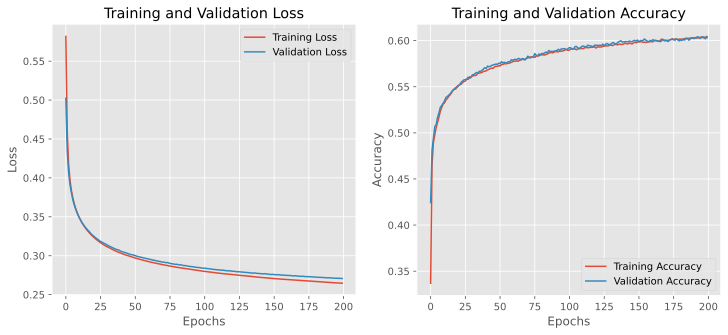

Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a SVM on the fer dataset
Test Accuracy: 60.75%
              precision    recall  f1-score   support

       Angry       0.48      0.45      0.47       754
     Disgust       0.71      0.06      0.11        81
        Fear       0.48      0.31      0.38       724
       Happy       0.79      0.84      0.81      1406
         Sad       0.50      0.56      0.53       880
    Surprise       0.68      0.70      0.69       629
     Neutral       0.54      0.65      0.59       910

    accuracy                           0.61      5384
   macro avg       0.60      0.51      0.51      5384
weighted avg       0.60      0.61      0.60      5384

Precision: 0.60, Recall: 0.61, F1 Score: 0.60


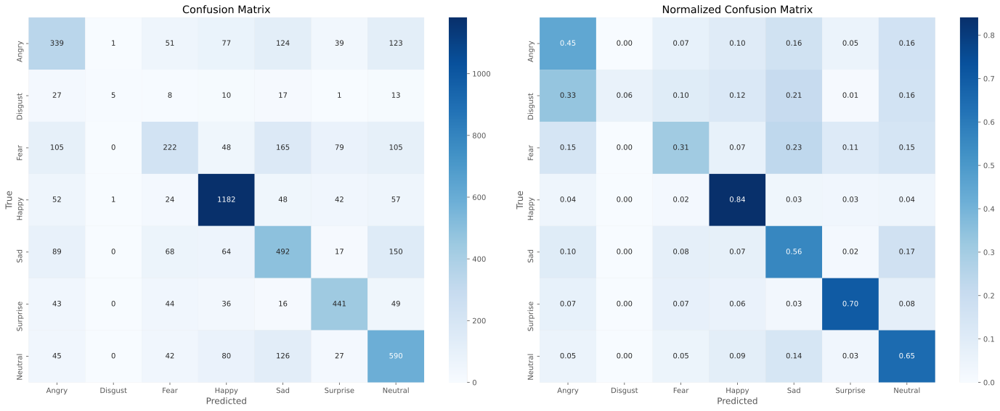

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.8266, Accuracy: 0.3073
Validation - Loss: 1.5665, Accuracy: 0.4923
Time taken: 4.14 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.6351, Accuracy: 0.4148
Validation - Loss: 1.4367, Accuracy: 0.5202
Time taken: 4.24 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.5477, Accuracy: 0.4459
Validation - Loss: 1.3706, Accuracy: 0.5320
Time taken: 4.55 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.4906, Ac

Epoch: 40/200
Training - Loss: 0.9883, Accuracy: 0.6007
Validation - Loss: 1.1230, Accuracy: 0.6121
Time taken: 4.03 seconds
--------------------------------------------------
Epoch 40: No improvement in validation loss for 9 epochs.
Epoch: 41/200
Training - Loss: 0.9830, Accuracy: 0.6031
Validation - Loss: 1.1157, Accuracy: 0.6143
Time taken: 4.14 seconds
--------------------------------------------------
Epoch 41: No improvement in validation loss for 10 epochs.
Stopping early after 41 epochs due to no improvement in validation loss.


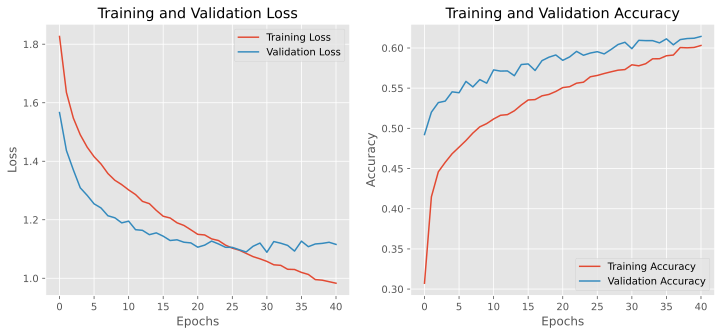

Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a NN on the fer dataset
Test Accuracy: 61.40%
              precision    recall  f1-score   support

       Angry       0.47      0.50      0.49       754
     Disgust       0.43      0.63      0.51        81
        Fear       0.49      0.34      0.40       724
       Happy       0.85      0.79      0.82      1406
         Sad       0.51      0.51      0.51       880
    Surprise       0.67      0.79      0.72       629
     Neutral       0.56      0.63      0.59       910

    accuracy                           0.61      5384
   macro avg       0.57      0.60      0.58      5384
weighted avg       0.62      0.61      0.61      5384

Precision: 0.62, Recall: 0.61, F1 Score: 0.61


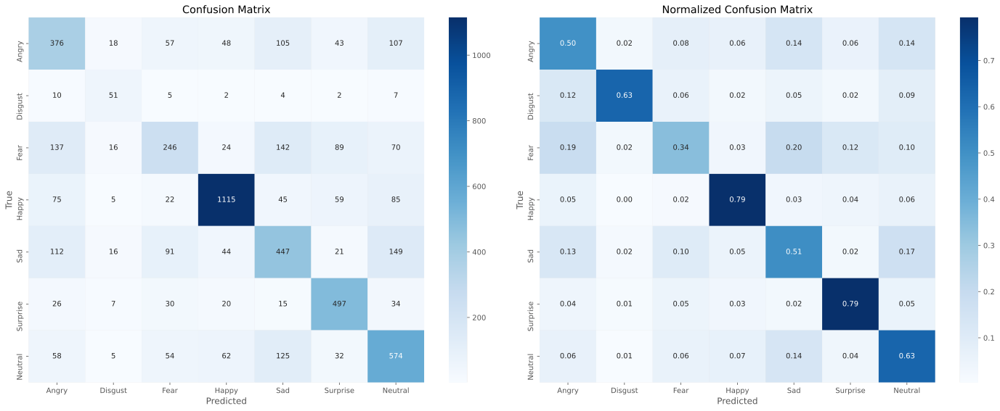

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.8303, Accuracy: 0.3248
Validation - Loss: 1.6163, Accuracy: 0.4789
Time taken: 2.70 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.6362, Accuracy: 0.4210
Validation - Loss: 1.4769, Accuracy: 0.5103
Time taken: 2.76 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.5455, Accuracy: 0.4532
Validation - Loss: 1.4032, Accuracy: 0.5196
Time taken: 2.66 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1.4894, A

Epoch: 45/200
Training - Loss: 0.9315, Accuracy: 0.6292
Validation - Loss: 0.8813, Accuracy: 0.6638
Time taken: 3.64 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.9384, Accuracy: 0.6289
Validation - Loss: 0.8824, Accuracy: 0.6656
Time taken: 2.86 seconds
--------------------------------------------------
Epoch 46: No improvement in validation loss for 1 epochs.
Epoch: 47/200
Training - Loss: 0.9253, Accuracy: 0.6339
Validation - Loss: 0.8789, Accuracy: 0.6678
Time taken: 2.67 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.9157, Accuracy: 0.6336
Validation - Loss: 0.8746, Accuracy: 0.6656
Time taken: 2.92 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.9117, Accuracy: 0.6394
Validation - Loss: 0.8695, Accuracy: 0.6697
Time taken: 3.31 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.9042, Accuracy: 0.6430
Valida

Epoch: 86/200
Training - Loss: 0.7386, Accuracy: 0.7037
Validation - Loss: 0.7591, Accuracy: 0.7291
Time taken: 3.27 seconds
--------------------------------------------------
Epoch: 87/200
Training - Loss: 0.7366, Accuracy: 0.7034
Validation - Loss: 0.7433, Accuracy: 0.7312
Time taken: 2.87 seconds
--------------------------------------------------
Epoch: 88/200
Training - Loss: 0.7343, Accuracy: 0.7087
Validation - Loss: 0.7444, Accuracy: 0.7277
Time taken: 2.84 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 1 epochs.
Epoch: 89/200
Training - Loss: 0.7307, Accuracy: 0.7109
Validation - Loss: 0.7428, Accuracy: 0.7345
Time taken: 3.12 seconds
--------------------------------------------------
Epoch: 90/200
Training - Loss: 0.7207, Accuracy: 0.7150
Validation - Loss: 0.7522, Accuracy: 0.7377
Time taken: 2.95 seconds
--------------------------------------------------
Epoch 90: No improvement in validation loss for 1 epochs.
Epoc

Epoch: 126/200
Training - Loss: 0.5997, Accuracy: 0.7625
Validation - Loss: 0.6792, Accuracy: 0.7765
Time taken: 3.65 seconds
--------------------------------------------------
Epoch: 127/200
Training - Loss: 0.5873, Accuracy: 0.7648
Validation - Loss: 0.6783, Accuracy: 0.7780
Time taken: 2.93 seconds
--------------------------------------------------
Epoch: 128/200
Training - Loss: 0.5951, Accuracy: 0.7612
Validation - Loss: 0.6776, Accuracy: 0.7774
Time taken: 3.79 seconds
--------------------------------------------------
Epoch: 129/200
Training - Loss: 0.5931, Accuracy: 0.7654
Validation - Loss: 0.6791, Accuracy: 0.7804
Time taken: 3.50 seconds
--------------------------------------------------
Epoch 129: No improvement in validation loss for 1 epochs.
Epoch: 130/200
Training - Loss: 0.5898, Accuracy: 0.7637
Validation - Loss: 0.6782, Accuracy: 0.7787
Time taken: 3.10 seconds
--------------------------------------------------
Epoch 130: No improvement in validation loss for 2 epoch

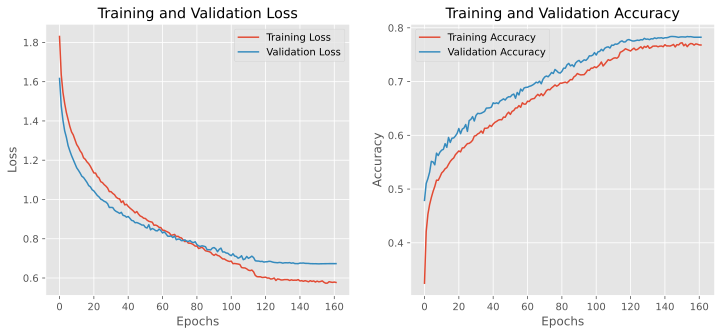

Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a NN on the fer dataset
Test Accuracy: 78.23%
              precision    recall  f1-score   support

       Angry       0.72      0.73      0.72       754
     Disgust       0.91      0.85      0.88        81
        Fear       0.73      0.66      0.69       724
       Happy       0.91      0.87      0.89      1406
         Sad       0.68      0.70      0.69       880
    Surprise       0.84      0.91      0.87       629
     Neutral       0.73      0.78      0.76       910

    accuracy                           0.78      5384
   macro avg       0.79      0.78      0.79      5384
weighted avg       0.78      0.78      0.78      5384

Precision: 0.78, Recall: 0.78, F1 Score: 0.78


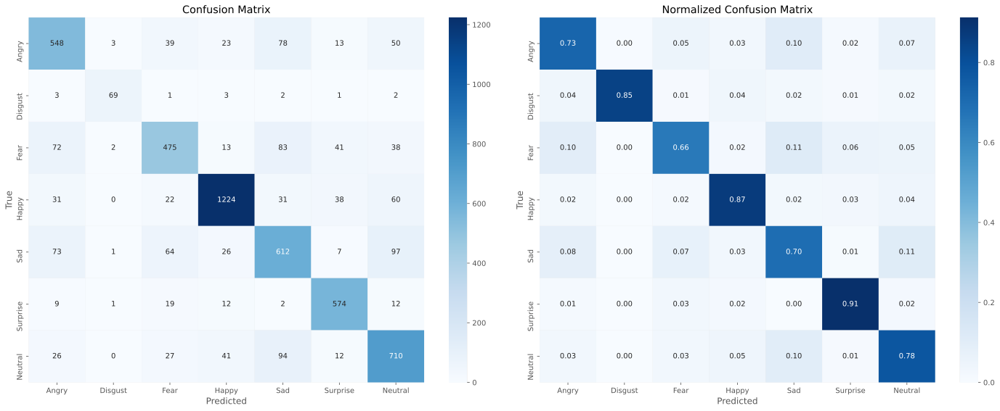

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.75667	eval-mlogloss:1.74917
[1]	train-mlogloss:1.63787	eval-mlogloss:1.63657
[2]	train-mlogloss:1.54796	eval-mlogloss:1.55667
[3]	train-mlogloss:1.47503	eval-mlogloss:1.49452
[4]	train-mlogloss:1.41612	eval-mlogloss:1.45040
[5]	train-mlogloss:1.36525	eval-mlogloss:1.41137
[6]	train-mlogloss:1.32025	eval-mlogloss:1.37943
[7]	train-mlogloss:1.28112	eval-mlogloss:1.35359
[8]	train-mlogloss:1.24586	eval-mlogloss:1.33219
[9]	train-mlogloss:1.21402	eval-mlogloss:1.31475
[10]	train-mlogloss:1.18631	eval-mlogloss:1.29954
[11]	train-mlogloss:1.158

[155]	train-mlogloss:0.20870	eval-mlogloss:1.08989
[156]	train-mlogloss:0.20631	eval-mlogloss:1.09007
[157]	train-mlogloss:0.20427	eval-mlogloss:1.08936
[158]	train-mlogloss:0.20200	eval-mlogloss:1.08955
[159]	train-mlogloss:0.20014	eval-mlogloss:1.08926
Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a RF on the fer dataset
Test Accuracy: 0.6163
              precision    recall  f1-score   support

       Angry       0.50      0.42      0.46       754
     Disgust       1.00      0.31      0.47        81
        Fear       0.50      0.43      0.46       724
       Happy       0.78      0.82      0.80      1406
         Sad       0.49      0.54      0.52       880
    Surprise       0.77      0.73      0.75       629
     Neutral       0.54      0.63      0.58       910

    accuracy                           0.62      5384
   macro avg       0.65      0.55      0.58      5384
weighted avg       0.62      0.62      0.61      5384



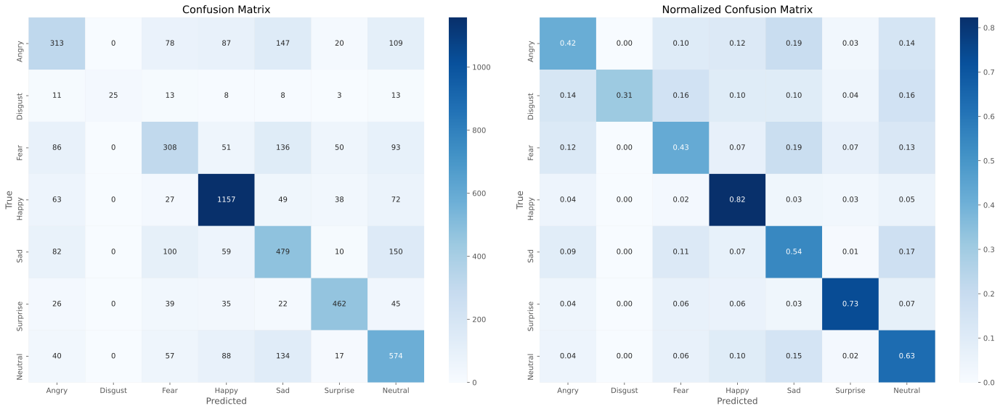

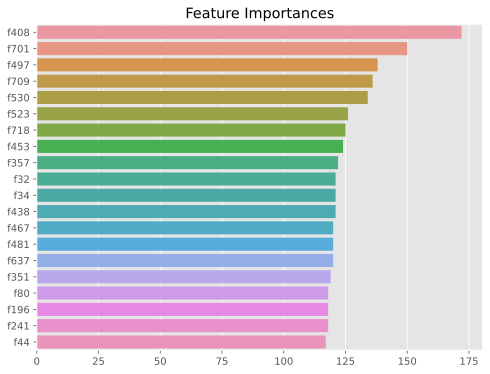

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.68724	eval-mlogloss:1.70113
[1]	train-mlogloss:1.53106	eval-mlogloss:1.55754
[2]	train-mlogloss:1.41367	eval-mlogloss:1.44997
[3]	train-mlogloss:1.31932	eval-mlogloss:1.36568
[4]	train-mlogloss:1.24215	eval-mlogloss:1.29639
[5]	train-mlogloss:1.17764	eval-mlogloss:1.23997
[6]	train-mlogloss:1.12101	eval-mlogloss:1.19167
[7]	train-mlogloss:1.07061	eval-mlogloss:1.14871
[8]	train-mlogloss:1.02848	eval-mlogloss:1.11248
[9]	train-mlogloss:0.98697	eval-mlogloss:1.07800
[10]	train-mlogloss:0.94942	eval-mlogloss:1.04632
[11]	train-mlogloss:0.91

[155]	train-mlogloss:0.05195	eval-mlogloss:0.36034
[156]	train-mlogloss:0.05094	eval-mlogloss:0.35970
[157]	train-mlogloss:0.05005	eval-mlogloss:0.35920
[158]	train-mlogloss:0.04912	eval-mlogloss:0.35865
[159]	train-mlogloss:0.04831	eval-mlogloss:0.35832
[160]	train-mlogloss:0.04750	eval-mlogloss:0.35740
[161]	train-mlogloss:0.04678	eval-mlogloss:0.35691
[162]	train-mlogloss:0.04613	eval-mlogloss:0.35698
[163]	train-mlogloss:0.04539	eval-mlogloss:0.35682
[164]	train-mlogloss:0.04478	eval-mlogloss:0.35622
[165]	train-mlogloss:0.04415	eval-mlogloss:0.35594
[166]	train-mlogloss:0.04343	eval-mlogloss:0.35566
[167]	train-mlogloss:0.04274	eval-mlogloss:0.35516
[168]	train-mlogloss:0.04216	eval-mlogloss:0.35450
[169]	train-mlogloss:0.04146	eval-mlogloss:0.35418
[170]	train-mlogloss:0.04078	eval-mlogloss:0.35400
[171]	train-mlogloss:0.04015	eval-mlogloss:0.35347
[172]	train-mlogloss:0.03949	eval-mlogloss:0.35347
[173]	train-mlogloss:0.03895	eval-mlogloss:0.35325
[174]	train-mlogloss:0.03832	ev

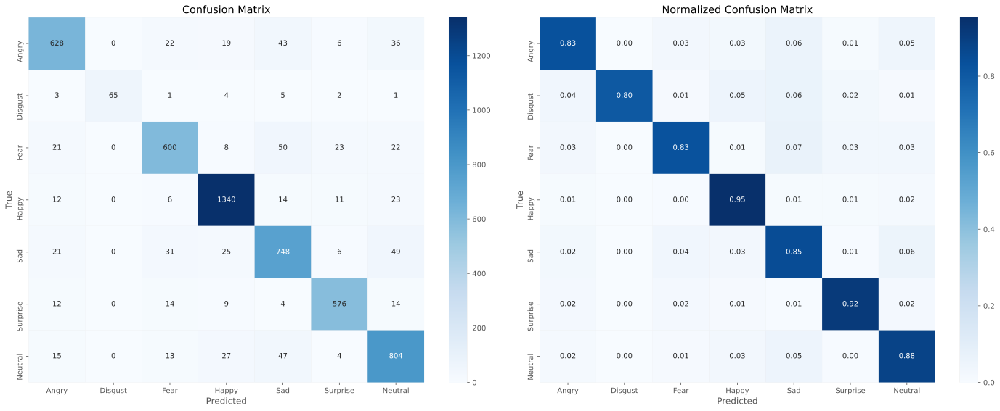

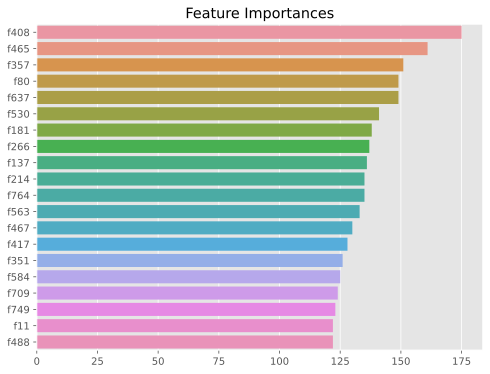

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_efficientnet_partial_train_augmented_embeddings.npy and data/fer/fer_efficientnet_partial_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_efficientnet_partial_val_original_embeddings.npy and data/fer/fer_efficientnet_partial_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_efficientnet_partial_test_original_embeddings.npy and data/fer/fer_efficientnet_partial_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7690, Accuracy: 0.2466
Validation - Loss: 0.7195, Accuracy: 0.2519
Time taken: 3.35

Epoch: 43/200
Training - Loss: 0.5722, Accuracy: 0.3050
Validation - Loss: 0.5554, Accuracy: 0.3186
Time taken: 3.25 seconds
--------------------------------------------------
Epoch: 44/200
Training - Loss: 0.5713, Accuracy: 0.3064
Validation - Loss: 0.5543, Accuracy: 0.3206
Time taken: 3.33 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.5704, Accuracy: 0.3083
Validation - Loss: 0.5533, Accuracy: 0.3225
Time taken: 3.38 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.5695, Accuracy: 0.3087
Validation - Loss: 0.5523, Accuracy: 0.3253
Time taken: 3.33 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.5686, Accuracy: 0.3101
Validation - Loss: 0.5512, Accuracy: 0.3268
Time taken: 3.29 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.5677, Accuracy: 0.3114
Validation - Loss: 0.5503, Accuracy: 0.3283
Time taken: 3.27 sec

Epoch: 90/200
Training - Loss: 0.5409, Accuracy: 0.3478
Validation - Loss: 0.5205, Accuracy: 0.3749
Time taken: 3.67 seconds
--------------------------------------------------
Epoch: 91/200
Training - Loss: 0.5404, Accuracy: 0.3480
Validation - Loss: 0.5199, Accuracy: 0.3751
Time taken: 3.53 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.5399, Accuracy: 0.3487
Validation - Loss: 0.5194, Accuracy: 0.3760
Time taken: 3.29 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.5395, Accuracy: 0.3494
Validation - Loss: 0.5189, Accuracy: 0.3762
Time taken: 3.58 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.5390, Accuracy: 0.3497
Validation - Loss: 0.5184, Accuracy: 0.3769
Time taken: 3.31 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.5385, Accuracy: 0.3501
Validation - Loss: 0.5179, Accuracy: 0.3775
Time taken: 3.22 sec

Epoch: 137/200
Training - Loss: 0.5225, Accuracy: 0.3644
Validation - Loss: 0.5005, Accuracy: 0.3955
Time taken: 3.52 seconds
--------------------------------------------------
Epoch: 138/200
Training - Loss: 0.5222, Accuracy: 0.3646
Validation - Loss: 0.5002, Accuracy: 0.3959
Time taken: 3.83 seconds
--------------------------------------------------
Epoch: 139/200
Training - Loss: 0.5219, Accuracy: 0.3650
Validation - Loss: 0.4999, Accuracy: 0.3959
Time taken: 4.79 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.5216, Accuracy: 0.3650
Validation - Loss: 0.4995, Accuracy: 0.3970
Time taken: 4.50 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.5213, Accuracy: 0.3655
Validation - Loss: 0.4992, Accuracy: 0.3972
Time taken: 3.65 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.5210, Accuracy: 0.3660
Validation - Loss: 0.4989, Accuracy: 0.3972
Time taken: 3.

Epoch: 184/200
Training - Loss: 0.5100, Accuracy: 0.3759
Validation - Loss: 0.4872, Accuracy: 0.4061
Time taken: 3.61 seconds
--------------------------------------------------
Epoch: 185/200
Training - Loss: 0.5098, Accuracy: 0.3761
Validation - Loss: 0.4870, Accuracy: 0.4067
Time taken: 3.57 seconds
--------------------------------------------------
Epoch: 186/200
Training - Loss: 0.5095, Accuracy: 0.3765
Validation - Loss: 0.4867, Accuracy: 0.4067
Time taken: 4.09 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.5093, Accuracy: 0.3766
Validation - Loss: 0.4865, Accuracy: 0.4070
Time taken: 3.86 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.5091, Accuracy: 0.3767
Validation - Loss: 0.4863, Accuracy: 0.4063
Time taken: 3.81 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.5089, Accuracy: 0.3770
Validation - Loss: 0.4860, Accuracy: 0.4070
Time taken: 3.

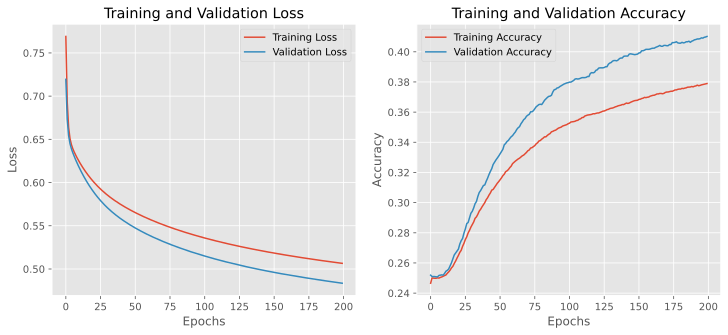

Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a SVM on the fer dataset
Test Accuracy: 41.14%
              precision    recall  f1-score   support

       Angry       0.28      0.08      0.13       723
     Disgust       0.00      0.00      0.00        89
        Fear       0.36      0.16      0.23       789
       Happy       0.44      0.74      0.55      1366
         Sad       0.35      0.37      0.36       895
    Surprise       0.54      0.51      0.53       587
     Neutral       0.39      0.41      0.40       935

    accuracy                           0.41      5384
   macro avg       0.34      0.33      0.31      5384
weighted avg       0.38      0.41      0.38      5384

Precision: 0.38, Recall: 0.41, F1 Score: 0.38


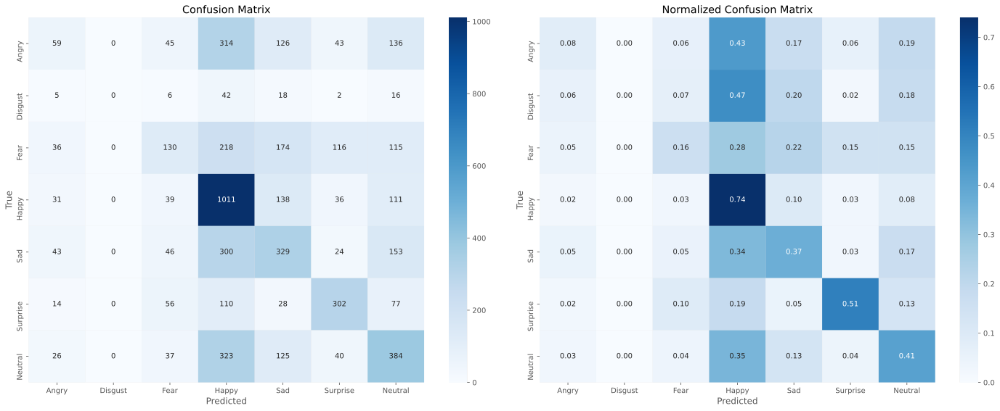

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/fer/fer_efficientnet_partial_train_original_embeddings.npy and data/fer/fer_efficientnet_partial_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.8206, Accuracy: 0.1341
Validation - Loss: 0.7841, Accuracy: 0.1845
Time taken: 2.33 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.7540, Accuracy: 0.2168
Validation - Loss: 0.7284, Accuracy: 0.2400
Time taken: 3.11 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.7111, Accuracy: 0.2437
V

Epoch: 45/200
Training - Loss: 0.5671, Accuracy: 0.2989
Validation - Loss: 0.5713, Accuracy: 0.3006
Time taken: 2.39 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.5659, Accuracy: 0.2996
Validation - Loss: 0.5700, Accuracy: 0.3022
Time taken: 2.41 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.5646, Accuracy: 0.3015
Validation - Loss: 0.5688, Accuracy: 0.3041
Time taken: 2.55 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.5634, Accuracy: 0.3036
Validation - Loss: 0.5676, Accuracy: 0.3056
Time taken: 2.78 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.5622, Accuracy: 0.3045
Validation - Loss: 0.5664, Accuracy: 0.3073
Time taken: 2.66 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.5610, Accuracy: 0.3060
Validation - Loss: 0.5652, Accuracy: 0.3080
Time taken: 2.85 sec

Epoch: 92/200
Training - Loss: 0.5278, Accuracy: 0.3542
Validation - Loss: 0.5321, Accuracy: 0.3524
Time taken: 2.17 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.5272, Accuracy: 0.3552
Validation - Loss: 0.5315, Accuracy: 0.3531
Time taken: 2.30 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.5267, Accuracy: 0.3554
Validation - Loss: 0.5310, Accuracy: 0.3539
Time taken: 2.69 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.5261, Accuracy: 0.3568
Validation - Loss: 0.5304, Accuracy: 0.3552
Time taken: 2.48 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.5256, Accuracy: 0.3571
Validation - Loss: 0.5299, Accuracy: 0.3546
Time taken: 2.61 seconds
--------------------------------------------------
Epoch: 97/200
Training - Loss: 0.5251, Accuracy: 0.3578
Validation - Loss: 0.5293, Accuracy: 0.3559
Time taken: 2.19 sec

Epoch: 139/200
Training - Loss: 0.5070, Accuracy: 0.3796
Validation - Loss: 0.5112, Accuracy: 0.3806
Time taken: 2.41 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.5067, Accuracy: 0.3800
Validation - Loss: 0.5109, Accuracy: 0.3814
Time taken: 2.21 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.5063, Accuracy: 0.3805
Validation - Loss: 0.5105, Accuracy: 0.3821
Time taken: 2.27 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.5060, Accuracy: 0.3813
Validation - Loss: 0.5102, Accuracy: 0.3825
Time taken: 2.29 seconds
--------------------------------------------------
Epoch: 143/200
Training - Loss: 0.5057, Accuracy: 0.3819
Validation - Loss: 0.5098, Accuracy: 0.3825
Time taken: 2.61 seconds
--------------------------------------------------
Epoch: 144/200
Training - Loss: 0.5053, Accuracy: 0.3822
Validation - Loss: 0.5095, Accuracy: 0.3831
Time taken: 2.

Epoch: 186/200
Training - Loss: 0.4930, Accuracy: 0.3936
Validation - Loss: 0.4970, Accuracy: 0.3959
Time taken: 2.34 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.4928, Accuracy: 0.3940
Validation - Loss: 0.4968, Accuracy: 0.3959
Time taken: 2.42 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.4925, Accuracy: 0.3939
Validation - Loss: 0.4965, Accuracy: 0.3961
Time taken: 2.76 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.4923, Accuracy: 0.3937
Validation - Loss: 0.4962, Accuracy: 0.3962
Time taken: 2.57 seconds
--------------------------------------------------
Epoch: 190/200
Training - Loss: 0.4920, Accuracy: 0.3943
Validation - Loss: 0.4960, Accuracy: 0.3966
Time taken: 2.38 seconds
--------------------------------------------------
Epoch: 191/200
Training - Loss: 0.4918, Accuracy: 0.3944
Validation - Loss: 0.4957, Accuracy: 0.3964
Time taken: 2.

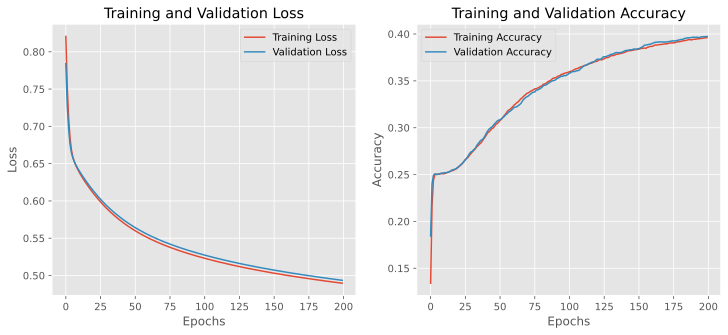

Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a SVM on the fer dataset
Test Accuracy: 40.47%
              precision    recall  f1-score   support

       Angry       0.34      0.02      0.03       723
     Disgust       0.00      0.00      0.00        89
        Fear       0.40      0.13      0.20       789
       Happy       0.40      0.77      0.53      1366
         Sad       0.35      0.39      0.37       895
    Surprise       0.56      0.51      0.54       587
     Neutral       0.40      0.38      0.39       935

    accuracy                           0.40      5384
   macro avg       0.35      0.32      0.29      5384
weighted avg       0.39      0.40      0.35      5384

Precision: 0.39, Recall: 0.40, F1 Score: 0.35


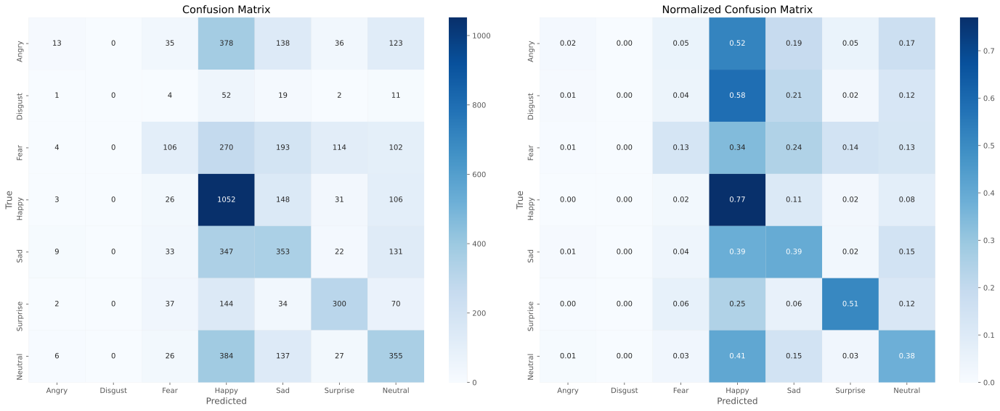

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9089, Accuracy: 0.2085
Validation - Loss: 1.7471, Accuracy: 0.3284
Time taken: 4.36 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.8021, Accuracy: 0.2784
Validation - Loss: 1.6527, Accuracy: 0.3392
Time taken: 4.59 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.7387, Accuracy: 0.3074
Validation - Loss: 1.5878, Accuracy: 0.3961
Time taken: 4.35 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 1

Epoch: 39/200
Training - Loss: 1.1436, Accuracy: 0.5248
Validation - Loss: 1.3134, Accuracy: 0.5337
Time taken: 4.07 seconds
--------------------------------------------------
Epoch 39: No improvement in validation loss for 10 epochs.
Stopping early after 39 epochs due to no improvement in validation loss.


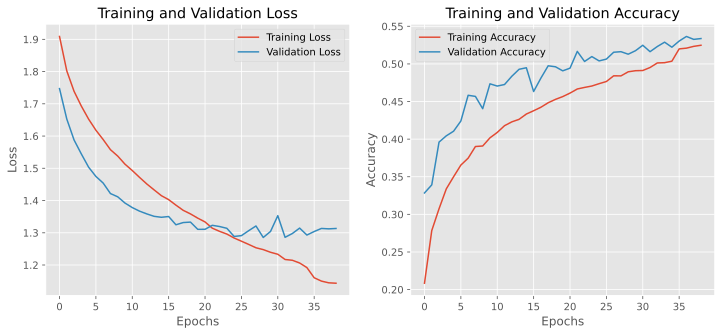

Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a NN on the fer dataset
Test Accuracy: 52.15%
              precision    recall  f1-score   support

       Angry       0.38      0.39      0.39       723
     Disgust       0.40      0.55      0.46        89
        Fear       0.42      0.33      0.37       789
       Happy       0.72      0.66      0.69      1366
         Sad       0.43      0.42      0.42       895
    Surprise       0.61      0.73      0.66       587
     Neutral       0.48      0.55      0.51       935

    accuracy                           0.52      5384
   macro avg       0.49      0.52      0.50      5384
weighted avg       0.52      0.52      0.52      5384

Precision: 0.52, Recall: 0.52, F1 Score: 0.52


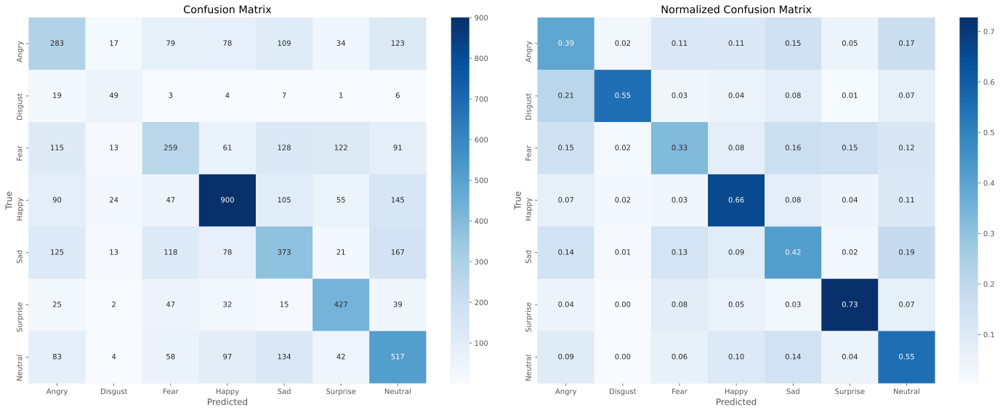

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9155, Accuracy: 0.2185
Validation - Loss: 1.7684, Accuracy: 0.3188
Time taken: 2.73 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.7991, Accuracy: 0.2754
Validation - Loss: 1.6865, Accuracy: 0.3611
Time taken: 2.83 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.7264, Accuracy: 0.3083
Validation - Loss: 1.6217, Accuracy: 0.4037
Time taken: 2.75 seconds
--------------------------------------------------
Epoch: 4/200
Training - Loss: 

Epoch: 44/200
Training - Loss: 1.0383, Accuracy: 0.5742
Validation - Loss: 1.0330, Accuracy: 0.6095
Time taken: 2.80 seconds
--------------------------------------------------
Epoch 44: No improvement in validation loss for 1 epochs.
Epoch: 45/200
Training - Loss: 1.0311, Accuracy: 0.5795
Validation - Loss: 1.0172, Accuracy: 0.6153
Time taken: 2.91 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 1.0134, Accuracy: 0.5854
Validation - Loss: 1.0165, Accuracy: 0.6188
Time taken: 2.79 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 1.0204, Accuracy: 0.5878
Validation - Loss: 1.0136, Accuracy: 0.6223
Time taken: 3.08 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 1.0091, Accuracy: 0.5894
Validation - Loss: 1.0149, Accuracy: 0.6225
Time taken: 2.83 seconds
--------------------------------------------------
Epoch 48: No improvement in validation loss for 1 epochs.
Epoc

Epoch: 85/200
Training - Loss: 0.7802, Accuracy: 0.6849
Validation - Loss: 0.8208, Accuracy: 0.7130
Time taken: 3.90 seconds
--------------------------------------------------
Epoch: 86/200
Training - Loss: 0.7691, Accuracy: 0.6907
Validation - Loss: 0.8232, Accuracy: 0.7176
Time taken: 2.80 seconds
--------------------------------------------------
Epoch 86: No improvement in validation loss for 1 epochs.
Epoch: 87/200
Training - Loss: 0.7682, Accuracy: 0.6918
Validation - Loss: 0.8189, Accuracy: 0.7252
Time taken: 2.85 seconds
--------------------------------------------------
Epoch: 88/200
Training - Loss: 0.7657, Accuracy: 0.6950
Validation - Loss: 0.8159, Accuracy: 0.7199
Time taken: 2.76 seconds
--------------------------------------------------
Epoch: 89/200
Training - Loss: 0.7652, Accuracy: 0.6881
Validation - Loss: 0.8104, Accuracy: 0.7316
Time taken: 2.70 seconds
--------------------------------------------------
Epoch: 90/200
Training - Loss: 0.7509, Accuracy: 0.6982
Valida

Epoch: 125/200
Training - Loss: 0.5819, Accuracy: 0.7690
Validation - Loss: 0.6996, Accuracy: 0.7849
Time taken: 2.80 seconds
--------------------------------------------------
Epoch: 126/200
Training - Loss: 0.5826, Accuracy: 0.7692
Validation - Loss: 0.6942, Accuracy: 0.7819
Time taken: 2.88 seconds
--------------------------------------------------
Epoch: 127/200
Training - Loss: 0.5791, Accuracy: 0.7731
Validation - Loss: 0.6988, Accuracy: 0.7864
Time taken: 2.83 seconds
--------------------------------------------------
Epoch 127: No improvement in validation loss for 1 epochs.
Epoch: 128/200
Training - Loss: 0.5752, Accuracy: 0.7756
Validation - Loss: 0.6953, Accuracy: 0.7871
Time taken: 2.84 seconds
--------------------------------------------------
Epoch 128: No improvement in validation loss for 2 epochs.
Epoch: 129/200
Training - Loss: 0.5820, Accuracy: 0.7686
Validation - Loss: 0.6962, Accuracy: 0.7854
Time taken: 2.76 seconds
------------------------------------------------

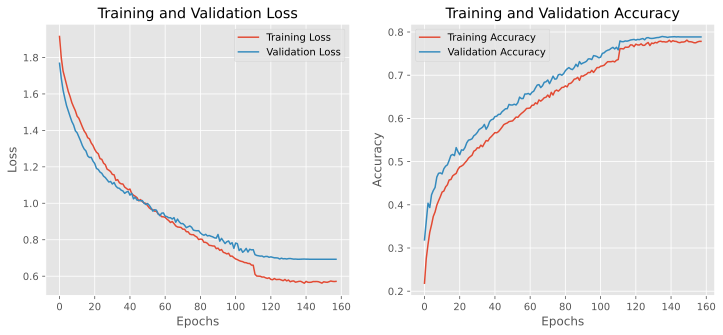

Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a NN on the fer dataset
Test Accuracy: 77.92%
              precision    recall  f1-score   support

       Angry       0.75      0.76      0.76       723
     Disgust       0.92      0.89      0.90        89
        Fear       0.76      0.69      0.72       789
       Happy       0.86      0.84      0.85      1366
         Sad       0.69      0.70      0.70       895
    Surprise       0.86      0.89      0.88       587
     Neutral       0.72      0.78      0.75       935

    accuracy                           0.78      5384
   macro avg       0.80      0.79      0.79      5384
weighted avg       0.78      0.78      0.78      5384

Precision: 0.78, Recall: 0.78, F1 Score: 0.78


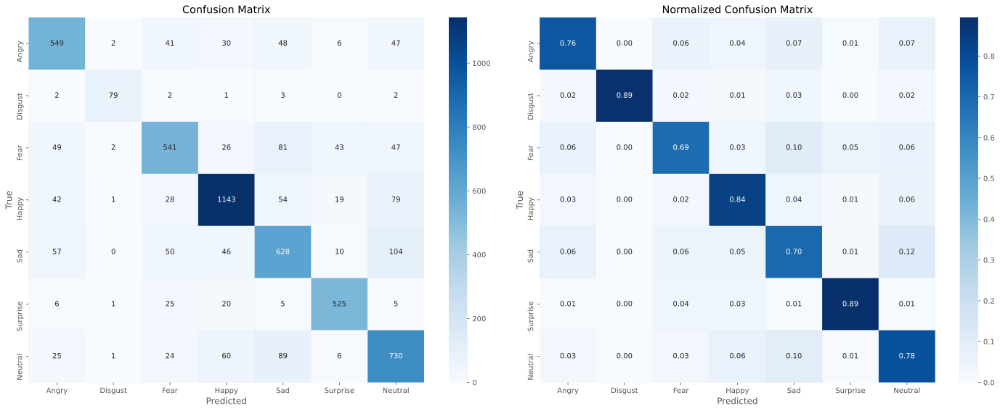

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.81668	eval-mlogloss:1.82734
[1]	train-mlogloss:1.72514	eval-mlogloss:1.74994
[2]	train-mlogloss:1.65287	eval-mlogloss:1.68676
[3]	train-mlogloss:1.59210	eval-mlogloss:1.63798
[4]	train-mlogloss:1.54075	eval-mlogloss:1.60132
[5]	train-mlogloss:1.49571	eval-mlogloss:1.57286
[6]	train-mlogloss:1.45428	eval-mlogloss:1.54817
[7]	train-mlogloss:1.41876	eval-mlogloss:1.52887
[8]	train-mlogloss:1.38577	eval-mlogloss:1.51217
[9]	train-mlogloss:1.35465	eval-mlogloss:1.49653
[10]	train-mlogloss:1.32547	eval-mlogloss:1.48336
[11]	train-mlogl

[155]	train-mlogloss:0.25821	eval-mlogloss:1.28058
[156]	train-mlogloss:0.25536	eval-mlogloss:1.28066
[157]	train-mlogloss:0.25340	eval-mlogloss:1.28075
[158]	train-mlogloss:0.25114	eval-mlogloss:1.28154
[159]	train-mlogloss:0.24838	eval-mlogloss:1.28120
[160]	train-mlogloss:0.24580	eval-mlogloss:1.28205
[161]	train-mlogloss:0.24297	eval-mlogloss:1.28171
[162]	train-mlogloss:0.24050	eval-mlogloss:1.28151
[163]	train-mlogloss:0.23801	eval-mlogloss:1.28115
[164]	train-mlogloss:0.23598	eval-mlogloss:1.28123
[165]	train-mlogloss:0.23368	eval-mlogloss:1.28104
[166]	train-mlogloss:0.23129	eval-mlogloss:1.28205
[167]	train-mlogloss:0.22891	eval-mlogloss:1.28207
[168]	train-mlogloss:0.22677	eval-mlogloss:1.28168
[169]	train-mlogloss:0.22467	eval-mlogloss:1.28175
[170]	train-mlogloss:0.22226	eval-mlogloss:1.28141
[171]	train-mlogloss:0.21993	eval-mlogloss:1.28072
[172]	train-mlogloss:0.21798	eval-mlogloss:1.28115
[173]	train-mlogloss:0.21583	eval-mlogloss:1.28124
[174]	train-mlogloss:0.21385	ev

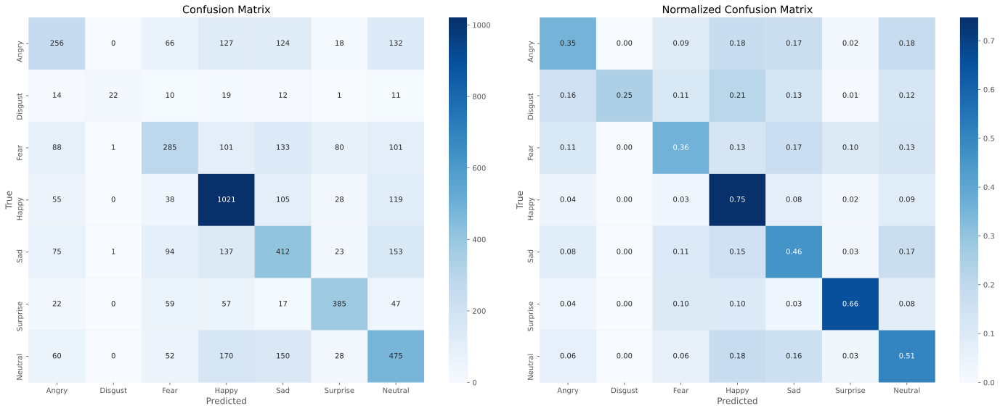

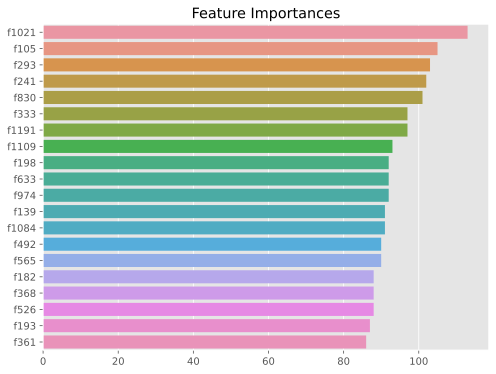

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'fer', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/fer/fer_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.76734	eval-mlogloss:1.77942
[1]	train-mlogloss:1.64092	eval-mlogloss:1.66666
[2]	train-mlogloss:1.54122	eval-mlogloss:1.57804
[3]	train-mlogloss:1.45852	eval-mlogloss:1.50520
[4]	train-mlogloss:1.38904	eval-mlogloss:1.44425
[5]	train-mlogloss:1.32746	eval-mlogloss:1.39290
[6]	train-mlogloss:1.27437	eval-mlogloss:1.34901
[7]	train-mlogloss:1.22485	eval-mlogloss:1.30815
[8]	train-mlogloss:1.18284	eval-mlogloss:1.27428
[9]	train-mlogloss:1.14228	eval-mlogloss:1.24086
[10]	train-mlogloss:1.10453	eval-mlogloss:1.20935
[11]	train-mlog

[155]	train-mlogloss:0.05620	eval-mlogloss:0.43231
[156]	train-mlogloss:0.05545	eval-mlogloss:0.43154
[157]	train-mlogloss:0.05446	eval-mlogloss:0.43111
[158]	train-mlogloss:0.05342	eval-mlogloss:0.43045
[159]	train-mlogloss:0.05252	eval-mlogloss:0.42955
[160]	train-mlogloss:0.05151	eval-mlogloss:0.42908
[161]	train-mlogloss:0.05059	eval-mlogloss:0.42888
[162]	train-mlogloss:0.04993	eval-mlogloss:0.42881
[163]	train-mlogloss:0.04923	eval-mlogloss:0.42837
[164]	train-mlogloss:0.04835	eval-mlogloss:0.42758
[165]	train-mlogloss:0.04756	eval-mlogloss:0.42721
[166]	train-mlogloss:0.04664	eval-mlogloss:0.42661
[167]	train-mlogloss:0.04578	eval-mlogloss:0.42600
[168]	train-mlogloss:0.04505	eval-mlogloss:0.42560
[169]	train-mlogloss:0.04428	eval-mlogloss:0.42499
[170]	train-mlogloss:0.04353	eval-mlogloss:0.42460
[171]	train-mlogloss:0.04291	eval-mlogloss:0.42422
[172]	train-mlogloss:0.04221	eval-mlogloss:0.42372
[173]	train-mlogloss:0.04152	eval-mlogloss:0.42384
[174]	train-mlogloss:0.04098	ev

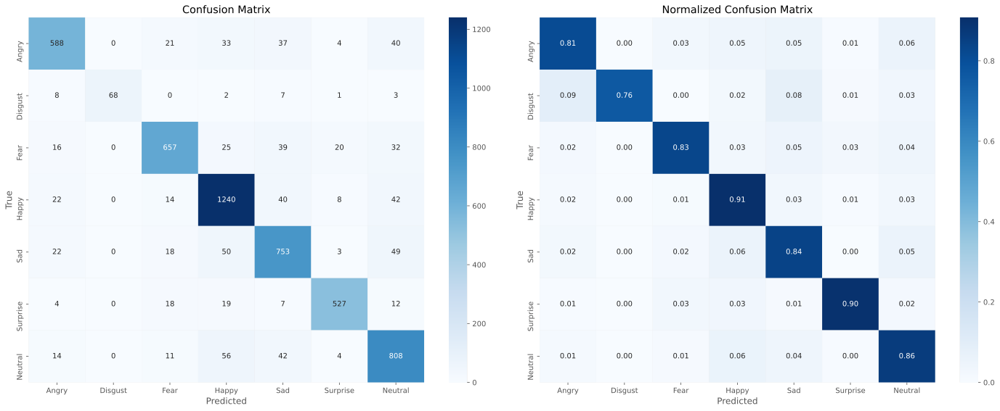

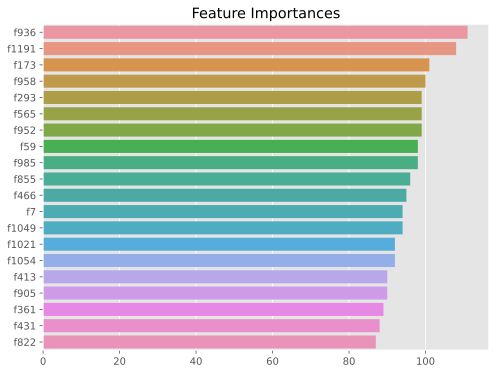

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_resnet_full_train_augmented_embeddings.npy and data/dartmouth/dartmouth_resnet_full_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_resnet_full_val_original_embeddings.npy and data/dartmouth/dartmouth_resnet_full_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_resnet_full_test_original_embeddings.npy and data/dartmouth/dartmouth_resnet_full_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7105, Accuracy: 0.2590
Validation - Loss: 0.6650, Accura

Epoch: 38/200
Training - Loss: 0.3488, Accuracy: 0.5439
Validation - Loss: 0.3851, Accuracy: 0.5178
Time taken: 1.55 seconds
--------------------------------------------------
Epoch 38: No improvement in validation loss for 1 epochs.
Epoch: 39/200
Training - Loss: 0.3467, Accuracy: 0.5456
Validation - Loss: 0.3719, Accuracy: 0.5283
Time taken: 1.69 seconds
--------------------------------------------------
Epoch 39: No improvement in validation loss for 2 epochs.
Epoch: 40/200
Training - Loss: 0.3452, Accuracy: 0.5469
Validation - Loss: 0.3684, Accuracy: 0.5325
Time taken: 1.55 seconds
--------------------------------------------------
Epoch: 41/200
Training - Loss: 0.3439, Accuracy: 0.5476
Validation - Loss: 0.3765, Accuracy: 0.5168
Time taken: 1.57 seconds
--------------------------------------------------
Epoch 41: No improvement in validation loss for 1 epochs.
Epoch: 42/200
Training - Loss: 0.3439, Accuracy: 0.5468
Validation - Loss: 0.3753, Accuracy: 0.5304
Time taken: 1.98 secon

Epoch: 76/200
Training - Loss: 0.3132, Accuracy: 0.5747
Validation - Loss: 0.3400, Accuracy: 0.5461
Time taken: 1.46 seconds
--------------------------------------------------
Epoch 76: No improvement in validation loss for 5 epochs.
Epoch 00077: reducing learning rate of group 0 to 1.0000e-04.
Epoch: 77/200
Training - Loss: 0.3130, Accuracy: 0.5752
Validation - Loss: 0.3404, Accuracy: 0.5472
Time taken: 1.57 seconds
--------------------------------------------------
Epoch 77: No improvement in validation loss for 6 epochs.
Epoch: 78/200
Training - Loss: 0.3126, Accuracy: 0.5750
Validation - Loss: 0.3399, Accuracy: 0.5482
Time taken: 1.50 seconds
--------------------------------------------------
Epoch 78: No improvement in validation loss for 7 epochs.
Epoch: 79/200
Training - Loss: 0.3125, Accuracy: 0.5752
Validation - Loss: 0.3398, Accuracy: 0.5461
Time taken: 1.88 seconds
--------------------------------------------------
Epoch 79: No improvement in validation loss for 8 epochs.
Ep

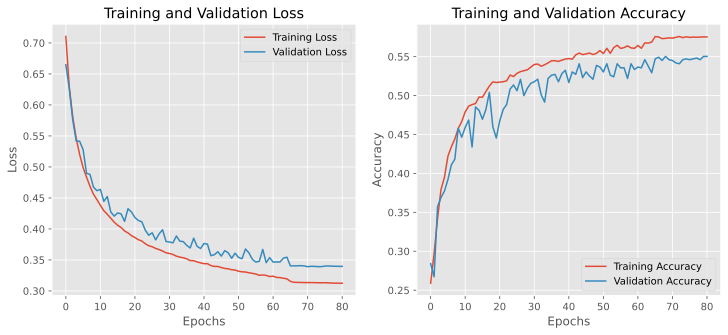

Evaluating model on test set...
Here are results for resnet embeddings using full layer training with a SVM on the dartmouth dataset
Test Accuracy: 53.77%
              precision    recall  f1-score   support

       Angry       0.60      0.54      0.57       135
     Disgust       0.39      0.39      0.39       120
        Fear       0.42      0.31      0.36       113
       Happy       0.60      0.82      0.69       234
         Sad       0.46      0.34      0.39       128
    Surprise       0.71      0.57      0.63       118
     Neutral       0.47      0.53      0.50       108

    accuracy                           0.54       956
   macro avg       0.52      0.50      0.50       956
weighted avg       0.53      0.54      0.53       956

Precision: 0.53, Recall: 0.54, F1 Score: 0.53


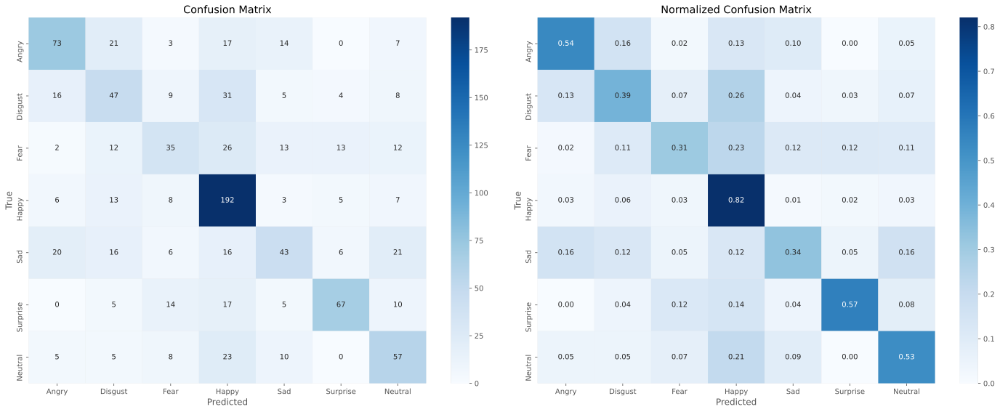

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_resnet_full_train_original_embeddings.npy and data/dartmouth/dartmouth_resnet_full_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7589, Accuracy: 0.2390
Validation - Loss: 0.7011, Accuracy: 0.2673
Time taken: 1.72 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.6689, Accuracy: 0.2803
Validation - Loss: 0.6353, Accuracy: 0.2851
Time taken: 1.74 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.6197, Acc

Epoch: 41/200
Training - Loss: 0.3363, Accuracy: 0.5655
Validation - Loss: 0.3431, Accuracy: 0.5577
Time taken: 1.45 seconds
--------------------------------------------------
Epoch: 42/200
Training - Loss: 0.3344, Accuracy: 0.5604
Validation - Loss: 0.3389, Accuracy: 0.5577
Time taken: 1.26 seconds
--------------------------------------------------
Epoch: 43/200
Training - Loss: 0.3324, Accuracy: 0.5610
Validation - Loss: 0.3413, Accuracy: 0.5639
Time taken: 1.40 seconds
--------------------------------------------------
Epoch 43: No improvement in validation loss for 1 epochs.
Epoch: 44/200
Training - Loss: 0.3299, Accuracy: 0.5669
Validation - Loss: 0.3341, Accuracy: 0.5765
Time taken: 1.99 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.3289, Accuracy: 0.5675
Validation - Loss: 0.3316, Accuracy: 0.5723
Time taken: 1.36 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.3279, Accuracy: 0.5711
Valida

Epoch: 80/200
Training - Loss: 0.2914, Accuracy: 0.6017
Validation - Loss: 0.3089, Accuracy: 0.5912
Time taken: 1.37 seconds
--------------------------------------------------
Epoch 80: No improvement in validation loss for 1 epochs.
Epoch: 81/200
Training - Loss: 0.2908, Accuracy: 0.5967
Validation - Loss: 0.3023, Accuracy: 0.5954
Time taken: 1.39 seconds
--------------------------------------------------
Epoch 81: No improvement in validation loss for 2 epochs.
Epoch: 82/200
Training - Loss: 0.2892, Accuracy: 0.6023
Validation - Loss: 0.2998, Accuracy: 0.5954
Time taken: 1.55 seconds
--------------------------------------------------
Epoch: 83/200
Training - Loss: 0.2895, Accuracy: 0.6046
Validation - Loss: 0.3067, Accuracy: 0.5943
Time taken: 1.52 seconds
--------------------------------------------------
Epoch 83: No improvement in validation loss for 1 epochs.
Epoch: 84/200
Training - Loss: 0.2889, Accuracy: 0.6026
Validation - Loss: 0.3028, Accuracy: 0.5901
Time taken: 1.29 secon

Epoch: 119/200
Training - Loss: 0.2689, Accuracy: 0.6228
Validation - Loss: 0.2812, Accuracy: 0.6122
Time taken: 1.83 seconds
--------------------------------------------------
Epoch: 120/200
Training - Loss: 0.2689, Accuracy: 0.6221
Validation - Loss: 0.2812, Accuracy: 0.6174
Time taken: 1.37 seconds
--------------------------------------------------
Epoch: 121/200
Training - Loss: 0.2688, Accuracy: 0.6221
Validation - Loss: 0.2812, Accuracy: 0.6184
Time taken: 2.02 seconds
--------------------------------------------------
Epoch: 122/200
Training - Loss: 0.2688, Accuracy: 0.6237
Validation - Loss: 0.2815, Accuracy: 0.6122
Time taken: 2.14 seconds
--------------------------------------------------
Epoch 122: No improvement in validation loss for 1 epochs.
Epoch: 123/200
Training - Loss: 0.2688, Accuracy: 0.6237
Validation - Loss: 0.2812, Accuracy: 0.6143
Time taken: 1.76 seconds
--------------------------------------------------
Epoch: 124/200
Training - Loss: 0.2687, Accuracy: 0.6216

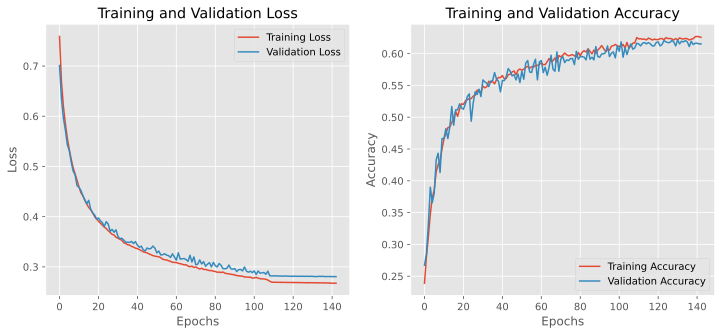

Evaluating model on test set...
Here are results for resnet embeddings using full layer training with a SVM on the dartmouth dataset
Test Accuracy: 60.46%
              precision    recall  f1-score   support

       Angry       0.63      0.62      0.62       135
     Disgust       0.54      0.47      0.50       120
        Fear       0.53      0.42      0.47       113
       Happy       0.67      0.84      0.74       234
         Sad       0.55      0.43      0.48       128
    Surprise       0.70      0.62      0.65       118
     Neutral       0.51      0.60      0.55       108

    accuracy                           0.60       956
   macro avg       0.59      0.57      0.58       956
weighted avg       0.60      0.60      0.60       956

Precision: 0.60, Recall: 0.60, F1 Score: 0.60


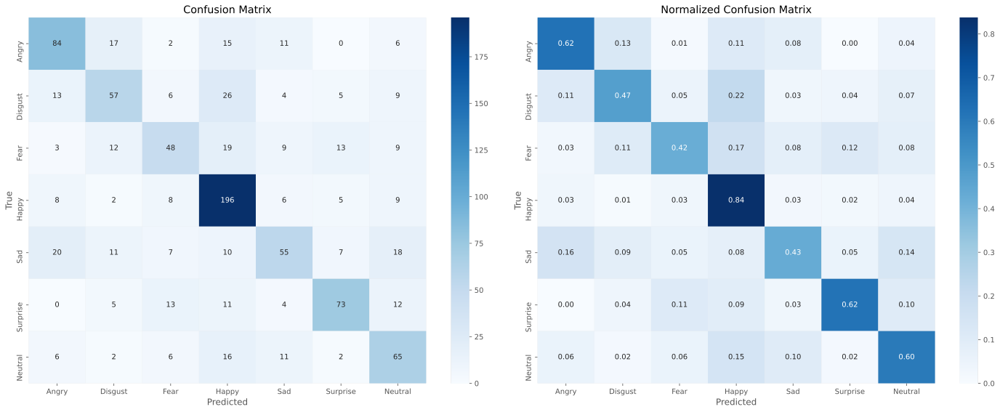

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.1779, Accuracy: 0.1498
Validation - Loss: 1.9242, Accuracy: 0.1719
Time taken: 1.75 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9728, Accuracy: 0.1575
Validation - Loss: 1.9120, Accuracy: 0.2369
Time taken: 1.62 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.9448, Accuracy: 0.1773
Validation - Loss: 1.8939, Accuracy: 0.2411
Time taken: 1.74 seconds
--------------------------------------------------
Epoch: 4/200
Training 

Epoch: 44/200
Training - Loss: 1.2774, Accuracy: 0.5337
Validation - Loss: 1.1965, Accuracy: 0.5545
Time taken: 1.74 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 1.2684, Accuracy: 0.5347
Validation - Loss: 1.2086, Accuracy: 0.5545
Time taken: 1.72 seconds
--------------------------------------------------
Epoch 45: No improvement in validation loss for 1 epochs.
Epoch: 46/200
Training - Loss: 1.2637, Accuracy: 0.5411
Validation - Loss: 1.1836, Accuracy: 0.5608
Time taken: 1.85 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 1.2530, Accuracy: 0.5358
Validation - Loss: 1.1833, Accuracy: 0.5597
Time taken: 1.73 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 1.2516, Accuracy: 0.5344
Validation - Loss: 1.1769, Accuracy: 0.5650
Time taken: 1.77 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 1.2377, Accuracy: 0.5521
Valida

Epoch: 85/200
Training - Loss: 1.0006, Accuracy: 0.6349
Validation - Loss: 1.0532, Accuracy: 0.6164
Time taken: 2.58 seconds
--------------------------------------------------
Epoch: 86/200
Training - Loss: 0.9988, Accuracy: 0.6455
Validation - Loss: 1.0446, Accuracy: 0.6279
Time taken: 2.54 seconds
--------------------------------------------------
Epoch: 87/200
Training - Loss: 0.9871, Accuracy: 0.6396
Validation - Loss: 1.0587, Accuracy: 0.6352
Time taken: 2.61 seconds
--------------------------------------------------
Epoch 87: No improvement in validation loss for 1 epochs.
Epoch: 88/200
Training - Loss: 0.9752, Accuracy: 0.6479
Validation - Loss: 1.0506, Accuracy: 0.6195
Time taken: 2.17 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 2 epochs.
Epoch: 89/200
Training - Loss: 0.9780, Accuracy: 0.6482
Validation - Loss: 1.0582, Accuracy: 0.6415
Time taken: 2.36 seconds
--------------------------------------------------
Epoc

Epoch: 125/200
Training - Loss: 0.8109, Accuracy: 0.7064
Validation - Loss: 0.9916, Accuracy: 0.6447
Time taken: 2.11 seconds
--------------------------------------------------
Epoch 125: No improvement in validation loss for 4 epochs.
Epoch: 126/200
Training - Loss: 0.7963, Accuracy: 0.7153
Validation - Loss: 0.9887, Accuracy: 0.6384
Time taken: 2.37 seconds
--------------------------------------------------
Epoch 126: No improvement in validation loss for 5 epochs.
Epoch: 127/200
Training - Loss: 0.7971, Accuracy: 0.7106
Validation - Loss: 0.9719, Accuracy: 0.6562
Time taken: 2.33 seconds
--------------------------------------------------
Epoch: 128/200
Training - Loss: 0.8026, Accuracy: 0.7118
Validation - Loss: 0.9781, Accuracy: 0.6541
Time taken: 1.74 seconds
--------------------------------------------------
Epoch 128: No improvement in validation loss for 1 epochs.
Epoch: 129/200
Training - Loss: 0.7988, Accuracy: 0.7118
Validation - Loss: 0.9799, Accuracy: 0.6468
Time taken: 2.

Epoch: 162/200
Training - Loss: 0.6710, Accuracy: 0.7636
Validation - Loss: 0.9411, Accuracy: 0.6698
Time taken: 1.79 seconds
--------------------------------------------------
Epoch 162: No improvement in validation loss for 7 epochs.
Epoch: 163/200
Training - Loss: 0.6671, Accuracy: 0.7666
Validation - Loss: 0.9406, Accuracy: 0.6709
Time taken: 1.59 seconds
--------------------------------------------------
Epoch 163: No improvement in validation loss for 8 epochs.
Epoch: 164/200
Training - Loss: 0.6686, Accuracy: 0.7650
Validation - Loss: 0.9407, Accuracy: 0.6698
Time taken: 1.84 seconds
--------------------------------------------------
Epoch 164: No improvement in validation loss for 9 epochs.
Epoch: 165/200
Training - Loss: 0.6693, Accuracy: 0.7626
Validation - Loss: 0.9409, Accuracy: 0.6688
Time taken: 2.14 seconds
--------------------------------------------------
Epoch 165: No improvement in validation loss for 10 epochs.
Stopping early after 165 epochs due to no improvement i

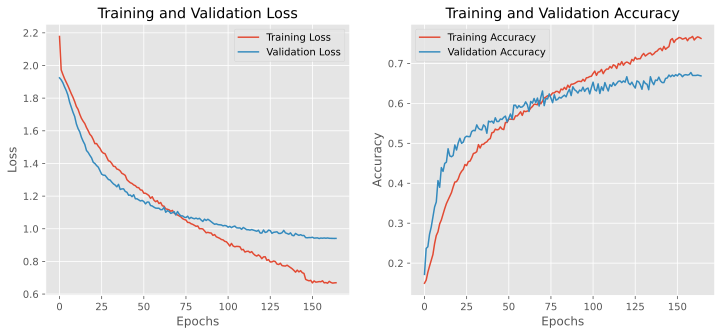

Evaluating model on test set...
Here are results for resnet embeddings using full layer training with a NN on the dartmouth dataset
Test Accuracy: 62.76%
              precision    recall  f1-score   support

       Angry       0.64      0.70      0.67       135
     Disgust       0.53      0.55      0.54       120
        Fear       0.51      0.49      0.50       113
       Happy       0.78      0.79      0.79       234
         Sad       0.53      0.44      0.48       128
    Surprise       0.72      0.69      0.70       118
     Neutral       0.51      0.57      0.54       108

    accuracy                           0.63       956
   macro avg       0.60      0.60      0.60       956
weighted avg       0.63      0.63      0.63       956

Precision: 0.63, Recall: 0.63, F1 Score: 0.63


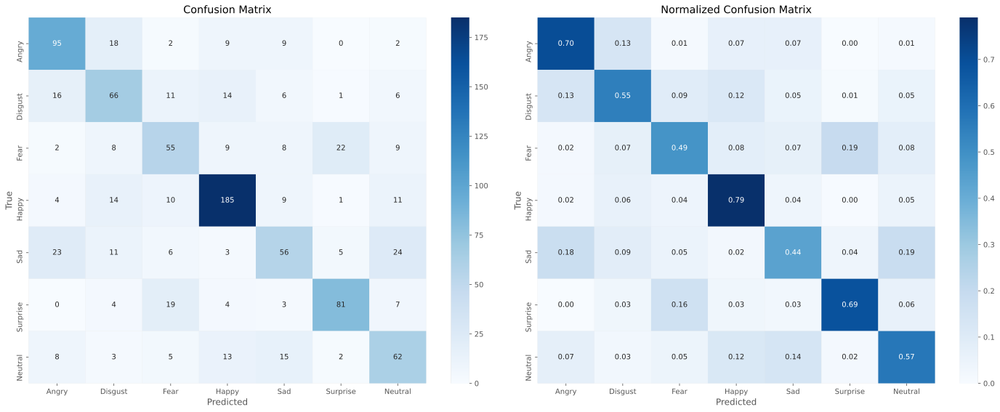

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.2145, Accuracy: 0.1490
Validation - Loss: 1.9243, Accuracy: 0.1855
Time taken: 1.41 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 2.0145, Accuracy: 0.1602
Validation - Loss: 1.9029, Accuracy: 0.2537
Time taken: 1.33 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.9468, Accuracy: 0.1840
Validation - Loss: 1.8811, Accuracy: 0.2579
Time taken: 1.66 seconds
--------------------------------------------------
Epoch: 4/200
Training

Epoch: 45/200
Training - Loss: 1.3346, Accuracy: 0.5063
Validation - Loss: 1.1778, Accuracy: 0.5943
Time taken: 1.61 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 1.3109, Accuracy: 0.5240
Validation - Loss: 1.1642, Accuracy: 0.5933
Time taken: 1.38 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 1.3178, Accuracy: 0.5126
Validation - Loss: 1.1511, Accuracy: 0.6048
Time taken: 1.41 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 1.3067, Accuracy: 0.5168
Validation - Loss: 1.1527, Accuracy: 0.6027
Time taken: 1.32 seconds
--------------------------------------------------
Epoch 48: No improvement in validation loss for 1 epochs.
Epoch: 49/200
Training - Loss: 1.2865, Accuracy: 0.5281
Validation - Loss: 1.1387, Accuracy: 0.6101
Time taken: 1.43 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 1.2910, Accuracy: 0.5303
Valida

Epoch: 89/200
Training - Loss: 1.0132, Accuracy: 0.6398
Validation - Loss: 0.8742, Accuracy: 0.7075
Time taken: 1.71 seconds
--------------------------------------------------
Epoch: 90/200
Training - Loss: 0.9887, Accuracy: 0.6481
Validation - Loss: 0.8746, Accuracy: 0.7075
Time taken: 1.49 seconds
--------------------------------------------------
Epoch 90: No improvement in validation loss for 1 epochs.
Epoch: 91/200
Training - Loss: 1.0016, Accuracy: 0.6414
Validation - Loss: 0.8769, Accuracy: 0.7086
Time taken: 1.51 seconds
--------------------------------------------------
Epoch 91: No improvement in validation loss for 2 epochs.
Epoch: 92/200
Training - Loss: 1.0105, Accuracy: 0.6333
Validation - Loss: 0.8648, Accuracy: 0.7191
Time taken: 1.36 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.9736, Accuracy: 0.6508
Validation - Loss: 0.8602, Accuracy: 0.7170
Time taken: 1.35 seconds
--------------------------------------------------
Epoc

Epoch: 131/200
Training - Loss: 0.7939, Accuracy: 0.7190
Validation - Loss: 0.6919, Accuracy: 0.7767
Time taken: 1.91 seconds
--------------------------------------------------
Epoch: 132/200
Training - Loss: 0.7885, Accuracy: 0.7118
Validation - Loss: 0.6895, Accuracy: 0.7841
Time taken: 1.86 seconds
--------------------------------------------------
Epoch: 133/200
Training - Loss: 0.7813, Accuracy: 0.7208
Validation - Loss: 0.6826, Accuracy: 0.7788
Time taken: 1.64 seconds
--------------------------------------------------
Epoch: 134/200
Training - Loss: 0.7862, Accuracy: 0.7233
Validation - Loss: 0.6844, Accuracy: 0.7851
Time taken: 1.44 seconds
--------------------------------------------------
Epoch 134: No improvement in validation loss for 1 epochs.
Epoch: 135/200
Training - Loss: 0.8092, Accuracy: 0.7134
Validation - Loss: 0.6873, Accuracy: 0.7904
Time taken: 1.52 seconds
--------------------------------------------------
Epoch 135: No improvement in validation loss for 2 epoch

Epoch: 172/200
Training - Loss: 0.6470, Accuracy: 0.7747
Validation - Loss: 0.5760, Accuracy: 0.8155
Time taken: 1.77 seconds
--------------------------------------------------
Epoch 172: No improvement in validation loss for 2 epochs.
Epoch: 173/200
Training - Loss: 0.6433, Accuracy: 0.7702
Validation - Loss: 0.5694, Accuracy: 0.8281
Time taken: 1.57 seconds
--------------------------------------------------
Epoch 173: No improvement in validation loss for 3 epochs.
Epoch: 174/200
Training - Loss: 0.6355, Accuracy: 0.7816
Validation - Loss: 0.5736, Accuracy: 0.8239
Time taken: 1.50 seconds
--------------------------------------------------
Epoch 174: No improvement in validation loss for 4 epochs.
Epoch: 175/200
Training - Loss: 0.6355, Accuracy: 0.7810
Validation - Loss: 0.5615, Accuracy: 0.8291
Time taken: 1.44 seconds
--------------------------------------------------
Epoch: 176/200
Training - Loss: 0.6298, Accuracy: 0.7805
Validation - Loss: 0.5589, Accuracy: 0.8312
Time taken: 1.

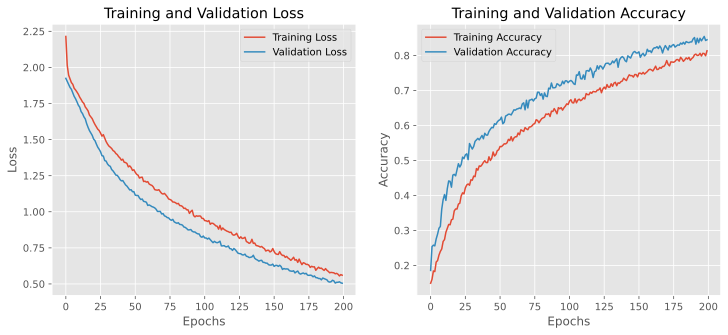

Evaluating model on test set...
Here are results for resnet embeddings using full layer training with a NN on the dartmouth dataset
Test Accuracy: 83.68%
              precision    recall  f1-score   support

       Angry       0.84      0.87      0.85       135
     Disgust       0.79      0.90      0.84       120
        Fear       0.75      0.74      0.75       113
       Happy       0.93      0.86      0.89       234
         Sad       0.81      0.78      0.80       128
    Surprise       0.86      0.83      0.84       118
     Neutral       0.81      0.85      0.83       108

    accuracy                           0.84       956
   macro avg       0.83      0.83      0.83       956
weighted avg       0.84      0.84      0.84       956

Precision: 0.84, Recall: 0.84, F1 Score: 0.84


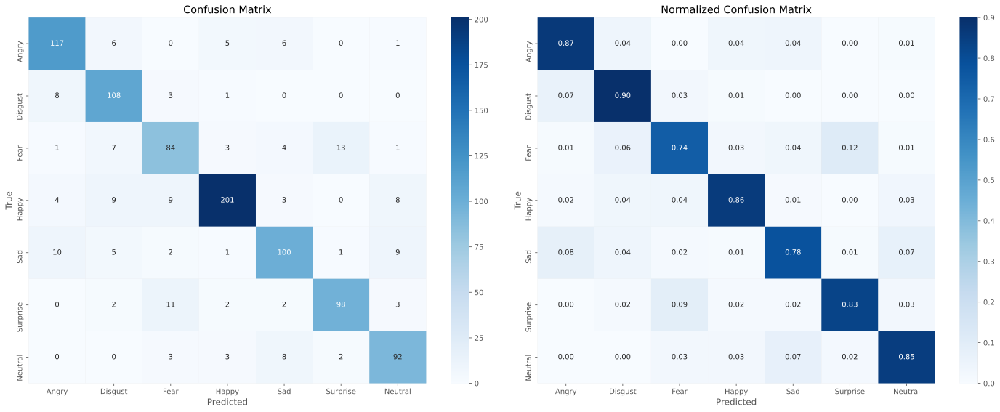

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.72825	eval-mlogloss:1.82458
[1]	train-mlogloss:1.56136	eval-mlogloss:1.75416
[2]	train-mlogloss:1.42587	eval-mlogloss:1.69357
[3]	train-mlogloss:1.31713	eval-mlogloss:1.65059
[4]	train-mlogloss:1.21597	eval-mlogloss:1.61507
[5]	train-mlogloss:1.13352	eval-mlogloss:1.58514
[6]	train-mlogloss:1.05855	eval-mlogloss:1.55855
[7]	train-mlogloss:0.98803	eval-mlogloss:1.53001
[8]	train-mlogloss:0.92481	eval-mlogloss:1.51059
[9]	train-mlogloss:0.87587	eval-mlogloss:1.48825
[10]	train-mlogloss:0.81902	eval-mlogloss:1.46728
[11]	tr

[154]	train-mlogloss:0.00742	eval-mlogloss:1.13595
[155]	train-mlogloss:0.00731	eval-mlogloss:1.13667
[156]	train-mlogloss:0.00723	eval-mlogloss:1.13771
[157]	train-mlogloss:0.00713	eval-mlogloss:1.13731
[158]	train-mlogloss:0.00704	eval-mlogloss:1.13811
[159]	train-mlogloss:0.00694	eval-mlogloss:1.13793
[160]	train-mlogloss:0.00685	eval-mlogloss:1.13716
[161]	train-mlogloss:0.00676	eval-mlogloss:1.13676
[162]	train-mlogloss:0.00668	eval-mlogloss:1.13734
[163]	train-mlogloss:0.00660	eval-mlogloss:1.13753
[164]	train-mlogloss:0.00652	eval-mlogloss:1.13749
[165]	train-mlogloss:0.00643	eval-mlogloss:1.13771
[166]	train-mlogloss:0.00635	eval-mlogloss:1.13701
[167]	train-mlogloss:0.00627	eval-mlogloss:1.13640
[168]	train-mlogloss:0.00619	eval-mlogloss:1.13647
[169]	train-mlogloss:0.00612	eval-mlogloss:1.13706
[170]	train-mlogloss:0.00605	eval-mlogloss:1.13613
[171]	train-mlogloss:0.00598	eval-mlogloss:1.13646
[172]	train-mlogloss:0.00591	eval-mlogloss:1.13664
[173]	train-mlogloss:0.00584	ev

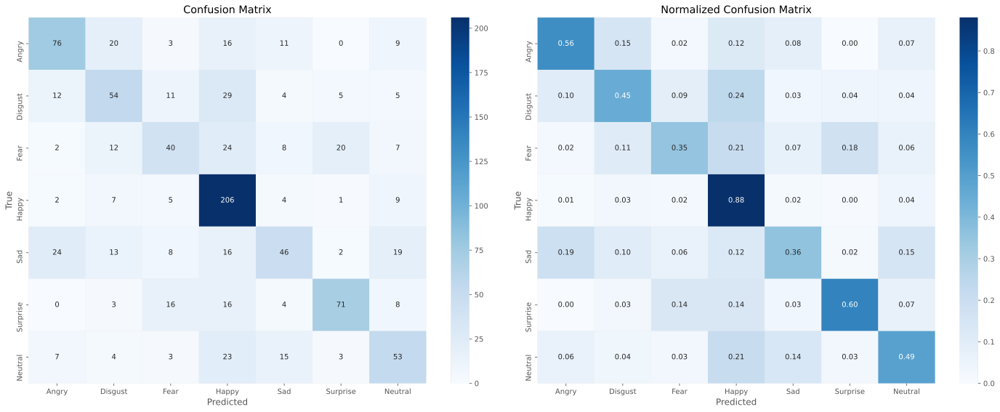

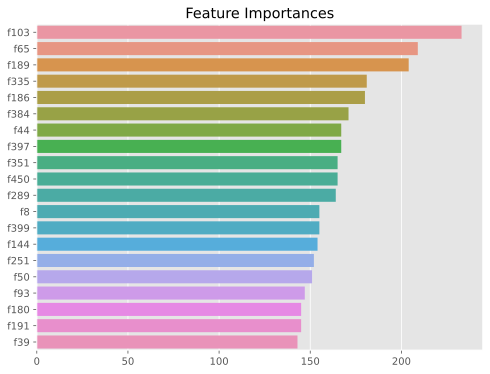

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'resnet', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.62944	eval-mlogloss:1.68509
[1]	train-mlogloss:1.42049	eval-mlogloss:1.51408
[2]	train-mlogloss:1.24505	eval-mlogloss:1.36858
[3]	train-mlogloss:1.09814	eval-mlogloss:1.25076
[4]	train-mlogloss:0.98236	eval-mlogloss:1.15715
[5]	train-mlogloss:0.88712	eval-mlogloss:1.07743
[6]	train-mlogloss:0.80635	eval-mlogloss:1.01436
[7]	train-mlogloss:0.72274	eval-mlogloss:0.94687
[8]	train-mlogloss:0.65501	eval-mlogloss:0.89456
[9]	train-mlogloss:0.59144	eval-mlogloss:0.84434
[10]	train-mlogloss:0.54069	eval-mlogloss:0.80618
[11]	t

[154]	train-mlogloss:0.00502	eval-mlogloss:0.34790
[155]	train-mlogloss:0.00499	eval-mlogloss:0.34811
[156]	train-mlogloss:0.00495	eval-mlogloss:0.34776
[157]	train-mlogloss:0.00493	eval-mlogloss:0.34779
[158]	train-mlogloss:0.00490	eval-mlogloss:0.34785
[159]	train-mlogloss:0.00487	eval-mlogloss:0.34792
[160]	train-mlogloss:0.00484	eval-mlogloss:0.34780
[161]	train-mlogloss:0.00481	eval-mlogloss:0.34772
[162]	train-mlogloss:0.00478	eval-mlogloss:0.34804
[163]	train-mlogloss:0.00476	eval-mlogloss:0.34789
[164]	train-mlogloss:0.00473	eval-mlogloss:0.34777
[165]	train-mlogloss:0.00470	eval-mlogloss:0.34812
[166]	train-mlogloss:0.00468	eval-mlogloss:0.34795
[167]	train-mlogloss:0.00465	eval-mlogloss:0.34790
[168]	train-mlogloss:0.00463	eval-mlogloss:0.34727
[169]	train-mlogloss:0.00461	eval-mlogloss:0.34747
[170]	train-mlogloss:0.00458	eval-mlogloss:0.34731
[171]	train-mlogloss:0.00456	eval-mlogloss:0.34695
[172]	train-mlogloss:0.00453	eval-mlogloss:0.34758
[173]	train-mlogloss:0.00451	ev

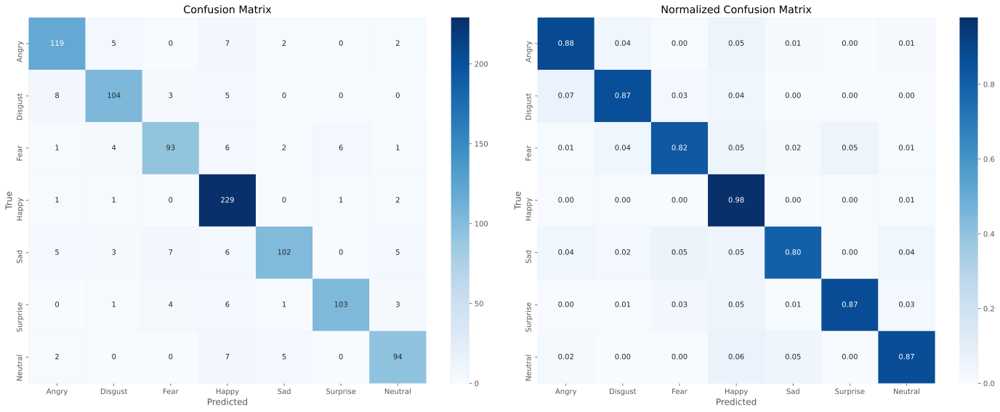

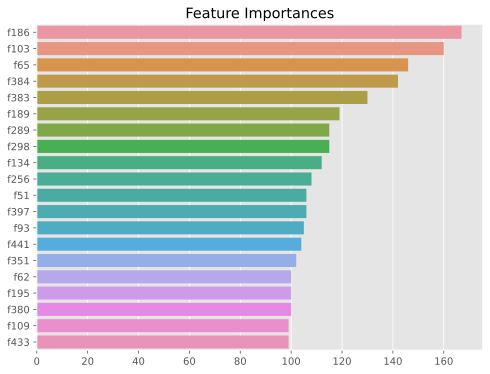

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7599, Accuracy: 0.2444
Validation - Loss: 0.7444, Accuracy: 0.2369
Time taken: 1.60 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.7155, Accuracy: 0.2509
Validation - Loss: 0.7189, Accuracy: 0.2369
Time taken: 1.94 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.6914, Accuracy: 0.2531
Validation - Loss: 0.6966, Accuracy: 0.2379
Time taken: 1.77 seconds
--------------------------------------------------
Epoch: 4/200
Training - 

Epoch: 46/200
Training - Loss: 0.3912, Accuracy: 0.5415
Validation - Loss: 0.3935, Accuracy: 0.5294
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.3889, Accuracy: 0.5445
Validation - Loss: 0.3912, Accuracy: 0.5367
Time taken: 1.57 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.3868, Accuracy: 0.5457
Validation - Loss: 0.3895, Accuracy: 0.5335
Time taken: 1.59 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.3848, Accuracy: 0.5460
Validation - Loss: 0.3872, Accuracy: 0.5367
Time taken: 2.24 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.3828, Accuracy: 0.5515
Validation - Loss: 0.3857, Accuracy: 0.5356
Time taken: 2.22 seconds
--------------------------------------------------
Epoch: 51/200
Training - Loss: 0.3808, Accuracy: 0.5508
Validation - Loss: 0.3837, Accuracy: 0.5419
Time taken: 1.96 sec

Epoch: 93/200
Training - Loss: 0.3259, Accuracy: 0.6008
Validation - Loss: 0.3326, Accuracy: 0.5839
Time taken: 1.79 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.3250, Accuracy: 0.6004
Validation - Loss: 0.3320, Accuracy: 0.5975
Time taken: 1.43 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.3241, Accuracy: 0.5994
Validation - Loss: 0.3310, Accuracy: 0.5881
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.3233, Accuracy: 0.6010
Validation - Loss: 0.3304, Accuracy: 0.5975
Time taken: 1.47 seconds
--------------------------------------------------
Epoch: 97/200
Training - Loss: 0.3224, Accuracy: 0.6024
Validation - Loss: 0.3298, Accuracy: 0.6017
Time taken: 1.56 seconds
--------------------------------------------------
Epoch: 98/200
Training - Loss: 0.3216, Accuracy: 0.6014
Validation - Loss: 0.3291, Accuracy: 0.5985
Time taken: 1.47 sec

Epoch: 139/200
Training - Loss: 0.2940, Accuracy: 0.6287
Validation - Loss: 0.3041, Accuracy: 0.6205
Time taken: 1.80 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.2934, Accuracy: 0.6293
Validation - Loss: 0.3034, Accuracy: 0.6184
Time taken: 1.57 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.2929, Accuracy: 0.6300
Validation - Loss: 0.3031, Accuracy: 0.6174
Time taken: 1.48 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.2924, Accuracy: 0.6304
Validation - Loss: 0.3028, Accuracy: 0.6226
Time taken: 1.48 seconds
--------------------------------------------------
Epoch: 143/200
Training - Loss: 0.2918, Accuracy: 0.6295
Validation - Loss: 0.3024, Accuracy: 0.6226
Time taken: 1.50 seconds
--------------------------------------------------
Epoch: 144/200
Training - Loss: 0.2913, Accuracy: 0.6300
Validation - Loss: 0.3015, Accuracy: 0.6195
Time taken: 1.

Epoch: 185/200
Training - Loss: 0.2733, Accuracy: 0.6474
Validation - Loss: 0.2870, Accuracy: 0.6331
Time taken: 1.55 seconds
--------------------------------------------------
Epoch: 186/200
Training - Loss: 0.2729, Accuracy: 0.6469
Validation - Loss: 0.2865, Accuracy: 0.6352
Time taken: 1.61 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.2725, Accuracy: 0.6473
Validation - Loss: 0.2864, Accuracy: 0.6363
Time taken: 1.66 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.2722, Accuracy: 0.6468
Validation - Loss: 0.2860, Accuracy: 0.6352
Time taken: 1.92 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.2718, Accuracy: 0.6467
Validation - Loss: 0.2857, Accuracy: 0.6342
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 190/200
Training - Loss: 0.2715, Accuracy: 0.6485
Validation - Loss: 0.2859, Accuracy: 0.6310
Time taken: 1.

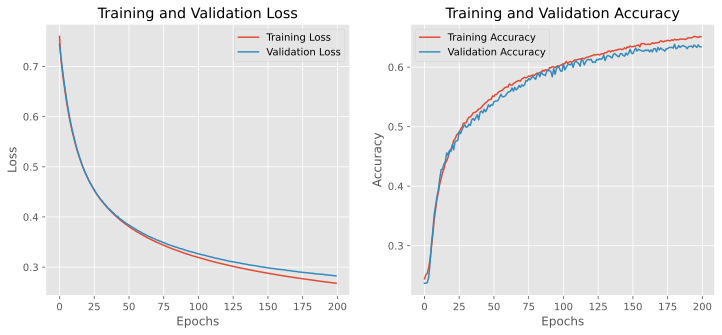

Evaluating model on test set...
Here are results for vit embeddings using full layer training with a SVM on the dartmouth dataset
Test Accuracy: 64.02%
              precision    recall  f1-score   support

       Angry       0.57      0.61      0.59       117
     Disgust       0.55      0.50      0.52       107
        Fear       0.53      0.41      0.46       123
       Happy       0.78      0.91      0.84       253
         Sad       0.54      0.53      0.53       123
    Surprise       0.85      0.62      0.72       116
     Neutral       0.50      0.61      0.55       117

    accuracy                           0.64       956
   macro avg       0.62      0.60      0.60       956
weighted avg       0.64      0.64      0.64       956

Precision: 0.64, Recall: 0.64, F1 Score: 0.64


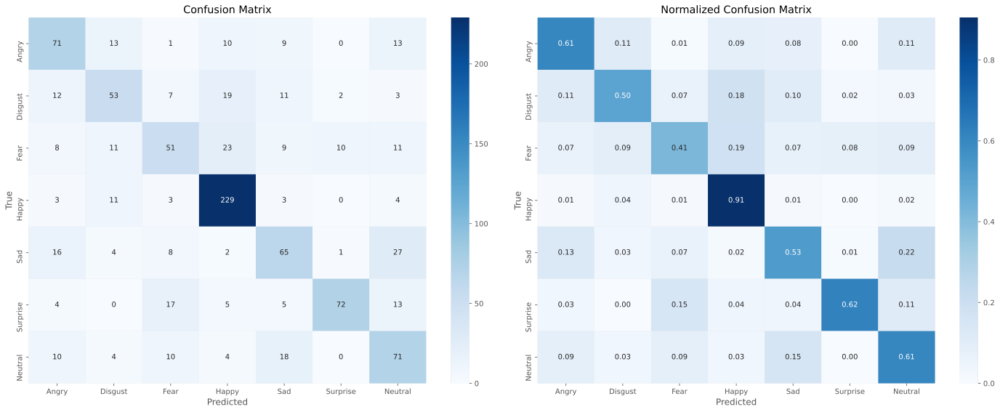

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_vit_full_train_original_embeddings.npy and data/dartmouth/dartmouth_vit_full_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7762, Accuracy: 0.2365
Validation - Loss: 0.7526, Accuracy: 0.2369
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.7262, Accuracy: 0.2529
Validation - Loss: 0.7332, Accuracy: 0.2369
Time taken: 1.36 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.7078, Accuracy: 0.

Epoch: 45/200
Training - Loss: 0.4044, Accuracy: 0.5411
Validation - Loss: 0.4217, Accuracy: 0.5189
Time taken: 1.70 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.4020, Accuracy: 0.5406
Validation - Loss: 0.4190, Accuracy: 0.5210
Time taken: 1.45 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.3997, Accuracy: 0.5438
Validation - Loss: 0.4165, Accuracy: 0.5220
Time taken: 2.06 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.3973, Accuracy: 0.5406
Validation - Loss: 0.4143, Accuracy: 0.5304
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.3949, Accuracy: 0.5438
Validation - Loss: 0.4121, Accuracy: 0.5314
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.3928, Accuracy: 0.5453
Validation - Loss: 0.4095, Accuracy: 0.5283
Time taken: 2.08 sec

Epoch: 92/200
Training - Loss: 0.3302, Accuracy: 0.5985
Validation - Loss: 0.3460, Accuracy: 0.5828
Time taken: 1.48 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.3293, Accuracy: 0.6001
Validation - Loss: 0.3450, Accuracy: 0.5849
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.3281, Accuracy: 0.6028
Validation - Loss: 0.3440, Accuracy: 0.5839
Time taken: 1.53 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.3272, Accuracy: 0.6003
Validation - Loss: 0.3429, Accuracy: 0.5860
Time taken: 1.37 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.3262, Accuracy: 0.6012
Validation - Loss: 0.3419, Accuracy: 0.5860
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 97/200
Training - Loss: 0.3251, Accuracy: 0.6026
Validation - Loss: 0.3411, Accuracy: 0.5860
Time taken: 1.34 sec

Epoch: 139/200
Training - Loss: 0.2922, Accuracy: 0.6322
Validation - Loss: 0.3077, Accuracy: 0.6153
Time taken: 1.55 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.2917, Accuracy: 0.6338
Validation - Loss: 0.3071, Accuracy: 0.6205
Time taken: 1.54 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.2909, Accuracy: 0.6315
Validation - Loss: 0.3063, Accuracy: 0.6216
Time taken: 1.50 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.2904, Accuracy: 0.6331
Validation - Loss: 0.3059, Accuracy: 0.6237
Time taken: 1.48 seconds
--------------------------------------------------
Epoch: 143/200
Training - Loss: 0.2899, Accuracy: 0.6333
Validation - Loss: 0.3053, Accuracy: 0.6247
Time taken: 1.38 seconds
--------------------------------------------------
Epoch: 144/200
Training - Loss: 0.2891, Accuracy: 0.6340
Validation - Loss: 0.3047, Accuracy: 0.6279
Time taken: 1.

Epoch: 186/200
Training - Loss: 0.2679, Accuracy: 0.6499
Validation - Loss: 0.2835, Accuracy: 0.6436
Time taken: 1.80 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.2675, Accuracy: 0.6537
Validation - Loss: 0.2830, Accuracy: 0.6405
Time taken: 1.42 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.2670, Accuracy: 0.6542
Validation - Loss: 0.2827, Accuracy: 0.6436
Time taken: 1.71 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.2667, Accuracy: 0.6553
Validation - Loss: 0.2822, Accuracy: 0.6447
Time taken: 1.86 seconds
--------------------------------------------------
Epoch: 190/200
Training - Loss: 0.2662, Accuracy: 0.6531
Validation - Loss: 0.2818, Accuracy: 0.6457
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 191/200
Training - Loss: 0.2658, Accuracy: 0.6537
Validation - Loss: 0.2815, Accuracy: 0.6447
Time taken: 2.

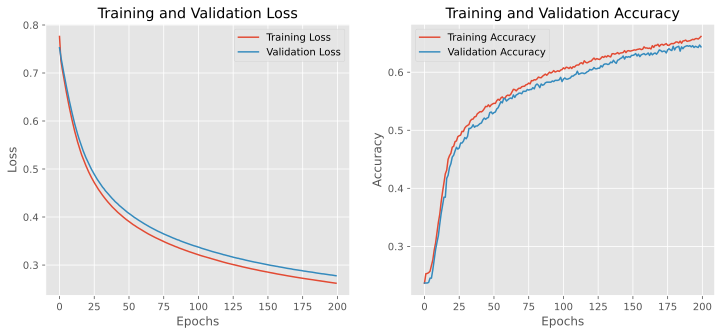

Evaluating model on test set...
Here are results for vit embeddings using full layer training with a SVM on the dartmouth dataset
Test Accuracy: 64.85%
              precision    recall  f1-score   support

       Angry       0.54      0.61      0.57       117
     Disgust       0.56      0.43      0.49       107
        Fear       0.54      0.50      0.52       123
       Happy       0.76      0.92      0.83       253
         Sad       0.58      0.46      0.51       123
    Surprise       0.86      0.66      0.75       116
     Neutral       0.55      0.65      0.60       117

    accuracy                           0.65       956
   macro avg       0.63      0.60      0.61       956
weighted avg       0.65      0.65      0.64       956

Precision: 0.65, Recall: 0.65, F1 Score: 0.64


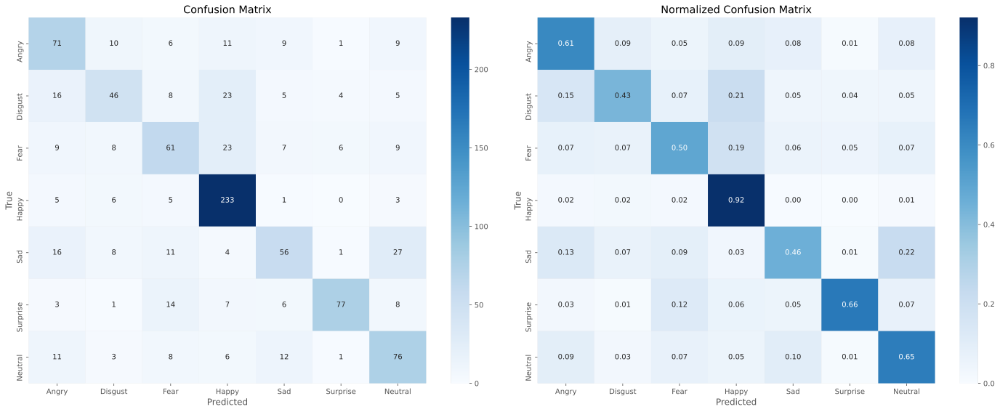

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9500, Accuracy: 0.1866
Validation - Loss: 1.8941, Accuracy: 0.3197
Time taken: 1.72 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.8990, Accuracy: 0.2331
Validation - Loss: 1.8374, Accuracy: 0.3784
Time taken: 1.96 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8481, Accuracy: 0.2714
Validation - Loss: 1.7590, Accuracy: 0.4256
Time taken: 1.66 seconds
--------------------------------------------------
Epoch: 4/200
Training - L

Epoch: 45/200
Training - Loss: 0.9042, Accuracy: 0.6865
Validation - Loss: 0.8904, Accuracy: 0.7065
Time taken: 2.10 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.8919, Accuracy: 0.6887
Validation - Loss: 0.8900, Accuracy: 0.7034
Time taken: 2.11 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.8893, Accuracy: 0.6961
Validation - Loss: 0.8874, Accuracy: 0.6950
Time taken: 2.02 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.8708, Accuracy: 0.6997
Validation - Loss: 0.8886, Accuracy: 0.6939
Time taken: 1.75 seconds
--------------------------------------------------
Epoch 48: No improvement in validation loss for 1 epochs.
Epoch: 49/200
Training - Loss: 0.8605, Accuracy: 0.7051
Validation - Loss: 0.8844, Accuracy: 0.6992
Time taken: 1.77 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.8521, Accuracy: 0.7095
Valida

Epoch: 86/200
Training - Loss: 0.5906, Accuracy: 0.8012
Validation - Loss: 0.7880, Accuracy: 0.7421
Time taken: 1.84 seconds
--------------------------------------------------
Epoch 86: No improvement in validation loss for 1 epochs.
Epoch: 87/200
Training - Loss: 0.5852, Accuracy: 0.8075
Validation - Loss: 0.7832, Accuracy: 0.7526
Time taken: 2.17 seconds
--------------------------------------------------
Epoch 87: No improvement in validation loss for 2 epochs.
Epoch: 88/200
Training - Loss: 0.5770, Accuracy: 0.8094
Validation - Loss: 0.7790, Accuracy: 0.7495
Time taken: 2.55 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 3 epochs.
Epoch: 89/200
Training - Loss: 0.5643, Accuracy: 0.8174
Validation - Loss: 0.7794, Accuracy: 0.7537
Time taken: 2.54 seconds
--------------------------------------------------
Epoch 89: No improvement in validation loss for 4 epochs.
Epoch: 90/200
Training - Loss: 0.5657, Accuracy: 0.8136
Validati

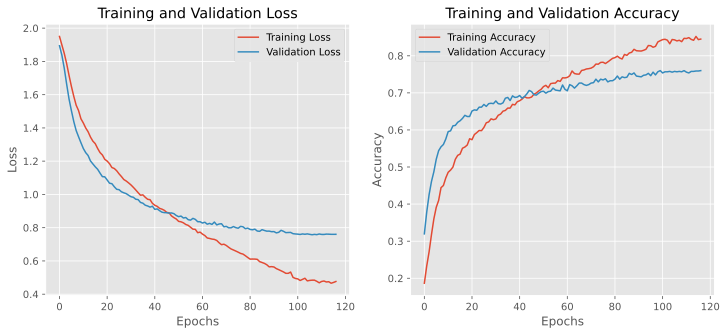

Evaluating model on test set...
Here are results for vit embeddings using full layer training with a NN on the dartmouth dataset
Test Accuracy: 75.10%
              precision    recall  f1-score   support

       Angry       0.66      0.66      0.66       117
     Disgust       0.64      0.71      0.68       107
        Fear       0.65      0.65      0.65       123
       Happy       0.89      0.89      0.89       253
         Sad       0.70      0.63      0.66       123
    Surprise       0.86      0.79      0.83       116
     Neutral       0.71      0.77      0.74       117

    accuracy                           0.75       956
   macro avg       0.73      0.73      0.73       956
weighted avg       0.75      0.75      0.75       956

Precision: 0.75, Recall: 0.75, F1 Score: 0.75


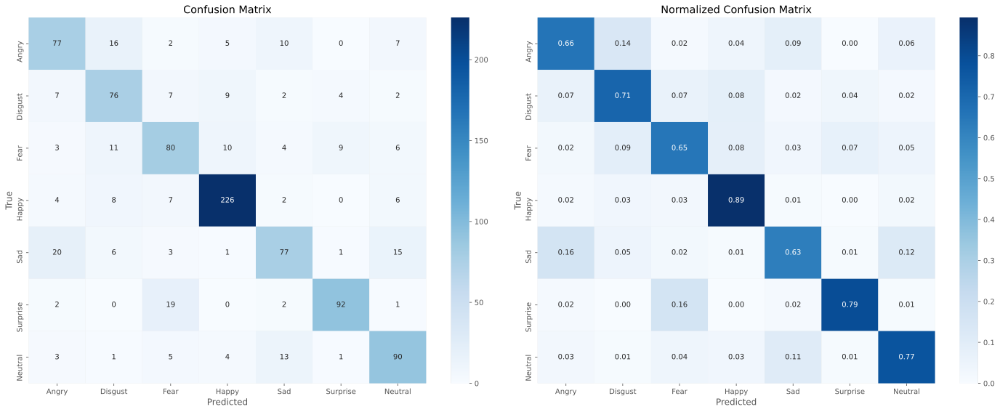

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9550, Accuracy: 0.1627
Validation - Loss: 1.9067, Accuracy: 0.2914
Time taken: 1.60 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9079, Accuracy: 0.2116
Validation - Loss: 1.8686, Accuracy: 0.3375
Time taken: 1.57 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8732, Accuracy: 0.2466
Validation - Loss: 1.8198, Accuracy: 0.3763
Time taken: 1.57 seconds
--------------------------------------------------
Epoch: 4/200
Training - 

Epoch: 46/200
Training - Loss: 0.9278, Accuracy: 0.6816
Validation - Loss: 0.8256, Accuracy: 0.7400
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.9217, Accuracy: 0.6903
Validation - Loss: 0.8081, Accuracy: 0.7379
Time taken: 1.71 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.9203, Accuracy: 0.6899
Validation - Loss: 0.8095, Accuracy: 0.7453
Time taken: 1.55 seconds
--------------------------------------------------
Epoch 48: No improvement in validation loss for 1 epochs.
Epoch: 49/200
Training - Loss: 0.9018, Accuracy: 0.6914
Validation - Loss: 0.8029, Accuracy: 0.7442
Time taken: 1.56 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.8954, Accuracy: 0.6966
Validation - Loss: 0.7918, Accuracy: 0.7547
Time taken: 2.16 seconds
--------------------------------------------------
Epoch: 51/200
Training - Loss: 0.8954, Accuracy: 0.6973
Valida

Epoch: 90/200
Training - Loss: 0.6280, Accuracy: 0.7855
Validation - Loss: 0.5378, Accuracy: 0.8260
Time taken: 1.87 seconds
--------------------------------------------------
Epoch: 91/200
Training - Loss: 0.6181, Accuracy: 0.7974
Validation - Loss: 0.5378, Accuracy: 0.8354
Time taken: 1.95 seconds
--------------------------------------------------
Epoch 91: No improvement in validation loss for 1 epochs.
Epoch: 92/200
Training - Loss: 0.6073, Accuracy: 0.7976
Validation - Loss: 0.5356, Accuracy: 0.8270
Time taken: 1.62 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.6189, Accuracy: 0.7917
Validation - Loss: 0.5379, Accuracy: 0.8396
Time taken: 1.59 seconds
--------------------------------------------------
Epoch 93: No improvement in validation loss for 1 epochs.
Epoch: 94/200
Training - Loss: 0.5983, Accuracy: 0.8124
Validation - Loss: 0.5210, Accuracy: 0.8344
Time taken: 1.54 seconds
--------------------------------------------------
Epoc

Epoch: 133/200
Training - Loss: 0.4370, Accuracy: 0.8577
Validation - Loss: 0.3752, Accuracy: 0.8889
Time taken: 1.72 seconds
--------------------------------------------------
Epoch 133: No improvement in validation loss for 1 epochs.
Epoch: 134/200
Training - Loss: 0.4317, Accuracy: 0.8654
Validation - Loss: 0.3613, Accuracy: 0.8910
Time taken: 1.97 seconds
--------------------------------------------------
Epoch: 135/200
Training - Loss: 0.4305, Accuracy: 0.8618
Validation - Loss: 0.3575, Accuracy: 0.8941
Time taken: 2.09 seconds
--------------------------------------------------
Epoch: 136/200
Training - Loss: 0.4204, Accuracy: 0.8678
Validation - Loss: 0.3642, Accuracy: 0.8983
Time taken: 1.62 seconds
--------------------------------------------------
Epoch 136: No improvement in validation loss for 1 epochs.
Epoch: 137/200
Training - Loss: 0.4113, Accuracy: 0.8683
Validation - Loss: 0.3464, Accuracy: 0.9046
Time taken: 1.65 seconds
------------------------------------------------

Epoch: 175/200
Training - Loss: 0.2973, Accuracy: 0.9062
Validation - Loss: 0.2660, Accuracy: 0.9266
Time taken: 1.65 seconds
--------------------------------------------------
Epoch: 176/200
Training - Loss: 0.2941, Accuracy: 0.9129
Validation - Loss: 0.2660, Accuracy: 0.9256
Time taken: 1.80 seconds
--------------------------------------------------
Epoch: 177/200
Training - Loss: 0.2812, Accuracy: 0.9152
Validation - Loss: 0.2584, Accuracy: 0.9214
Time taken: 1.82 seconds
--------------------------------------------------
Epoch: 178/200
Training - Loss: 0.2849, Accuracy: 0.9132
Validation - Loss: 0.2561, Accuracy: 0.9361
Time taken: 1.57 seconds
--------------------------------------------------
Epoch: 179/200
Training - Loss: 0.2831, Accuracy: 0.9100
Validation - Loss: 0.2515, Accuracy: 0.9319
Time taken: 2.12 seconds
--------------------------------------------------
Epoch: 180/200
Training - Loss: 0.2908, Accuracy: 0.9114
Validation - Loss: 0.2524, Accuracy: 0.9298
Time taken: 1.

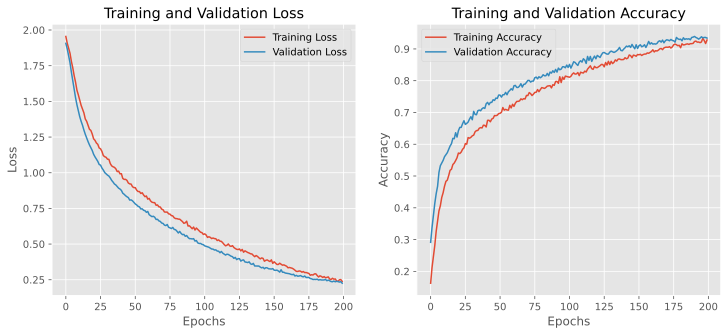

Evaluating model on test set...
Here are results for vit embeddings using full layer training with a NN on the dartmouth dataset
Test Accuracy: 92.89%
              precision    recall  f1-score   support

       Angry       0.89      0.83      0.86       117
     Disgust       0.91      0.92      0.91       107
        Fear       0.90      0.92      0.91       123
       Happy       0.96      0.96      0.96       253
         Sad       0.97      0.92      0.95       123
    Surprise       0.96      0.97      0.96       116
     Neutral       0.88      0.96      0.91       117

    accuracy                           0.93       956
   macro avg       0.92      0.92      0.92       956
weighted avg       0.93      0.93      0.93       956

Precision: 0.93, Recall: 0.93, F1 Score: 0.93


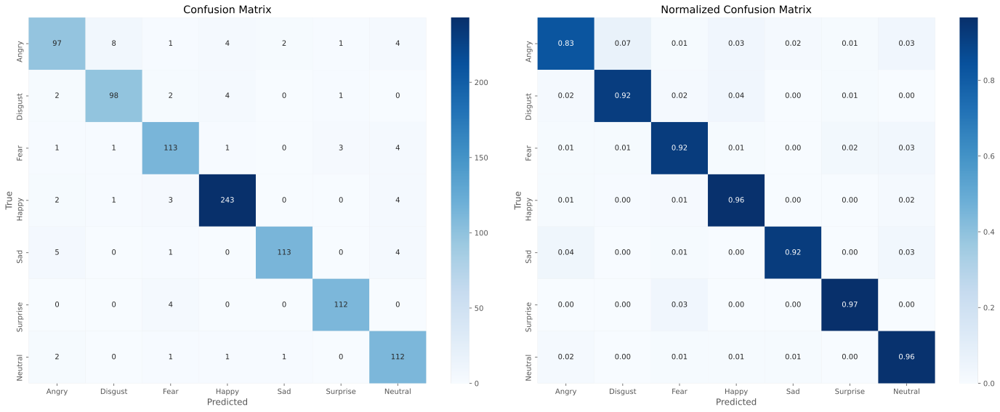

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.70592	eval-mlogloss:1.81732
[1]	train-mlogloss:1.53835	eval-mlogloss:1.74081
[2]	train-mlogloss:1.39970	eval-mlogloss:1.68289
[3]	train-mlogloss:1.28709	eval-mlogloss:1.63267
[4]	train-mlogloss:1.18672	eval-mlogloss:1.59036
[5]	train-mlogloss:1.09944	eval-mlogloss:1.55878
[6]	train-mlogloss:1.02309	eval-mlogloss:1.52878
[7]	train-mlogloss:0.95478	eval-mlogloss:1.50342
[8]	train-mlogloss:0.89210	eval-mlogloss:1.47757
[9]	train-mlogloss:0.83482	eval-mlogloss:1.45204
[10]	train-mlogloss:0.78258	eval-mlogloss:1.43822
[11]	train

[154]	train-mlogloss:0.00592	eval-mlogloss:1.19652
Evaluating model on test set...
Here are results for vit embeddings using full layer training with a RF on the dartmouth dataset
Test Accuracy: 0.5858
              precision    recall  f1-score   support

       Angry       0.49      0.54      0.51       117
     Disgust       0.51      0.39      0.44       107
        Fear       0.40      0.32      0.35       123
       Happy       0.73      0.92      0.82       253
         Sad       0.47      0.41      0.44       123
    Surprise       0.70      0.55      0.62       116
     Neutral       0.53      0.57      0.55       117

    accuracy                           0.59       956
   macro avg       0.55      0.53      0.53       956
weighted avg       0.57      0.59      0.57       956



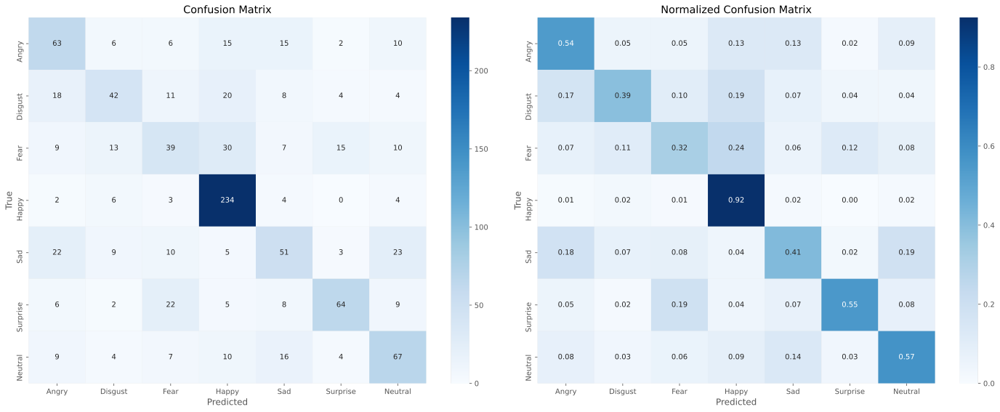

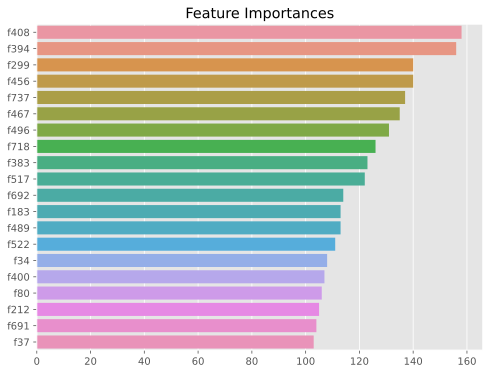

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'vit', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.59896	eval-mlogloss:1.64564
[1]	train-mlogloss:1.35845	eval-mlogloss:1.45416
[2]	train-mlogloss:1.17058	eval-mlogloss:1.29878
[3]	train-mlogloss:1.02239	eval-mlogloss:1.17328
[4]	train-mlogloss:0.90247	eval-mlogloss:1.07667
[5]	train-mlogloss:0.80203	eval-mlogloss:0.98992
[6]	train-mlogloss:0.71516	eval-mlogloss:0.92113
[7]	train-mlogloss:0.63801	eval-mlogloss:0.85370
[8]	train-mlogloss:0.57949	eval-mlogloss:0.80634
[9]	train-mlogloss:0.51879	eval-mlogloss:0.75659
[10]	train-mlogloss:0.46949	eval-mlogloss:0.71595
[11]	trai

[154]	train-mlogloss:0.00389	eval-mlogloss:0.31040
[155]	train-mlogloss:0.00387	eval-mlogloss:0.31024
[156]	train-mlogloss:0.00384	eval-mlogloss:0.31019
[157]	train-mlogloss:0.00382	eval-mlogloss:0.31005
[158]	train-mlogloss:0.00379	eval-mlogloss:0.30994
[159]	train-mlogloss:0.00377	eval-mlogloss:0.30975
[160]	train-mlogloss:0.00374	eval-mlogloss:0.30954
[161]	train-mlogloss:0.00372	eval-mlogloss:0.30957
[162]	train-mlogloss:0.00370	eval-mlogloss:0.30989
[163]	train-mlogloss:0.00368	eval-mlogloss:0.30978
[164]	train-mlogloss:0.00365	eval-mlogloss:0.30948
[165]	train-mlogloss:0.00363	eval-mlogloss:0.30935
[166]	train-mlogloss:0.00361	eval-mlogloss:0.30884
[167]	train-mlogloss:0.00359	eval-mlogloss:0.30861
[168]	train-mlogloss:0.00357	eval-mlogloss:0.30855
[169]	train-mlogloss:0.00355	eval-mlogloss:0.30857
[170]	train-mlogloss:0.00353	eval-mlogloss:0.30840
[171]	train-mlogloss:0.00351	eval-mlogloss:0.30847
[172]	train-mlogloss:0.00349	eval-mlogloss:0.30837
[173]	train-mlogloss:0.00347	ev

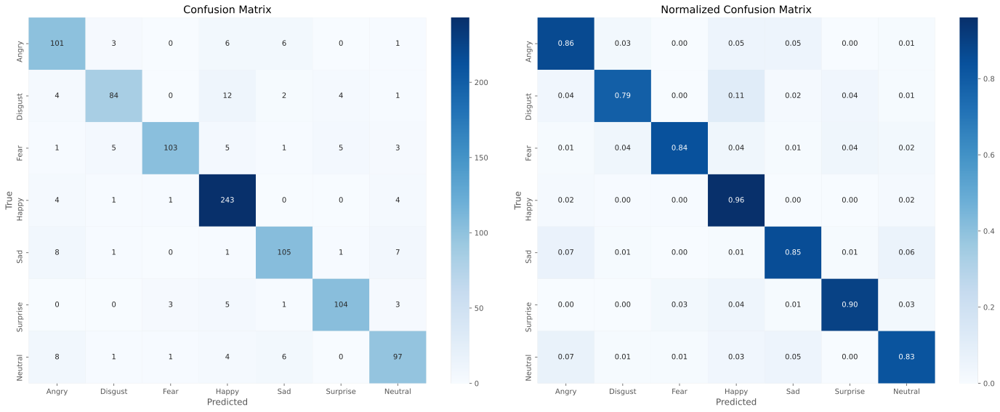

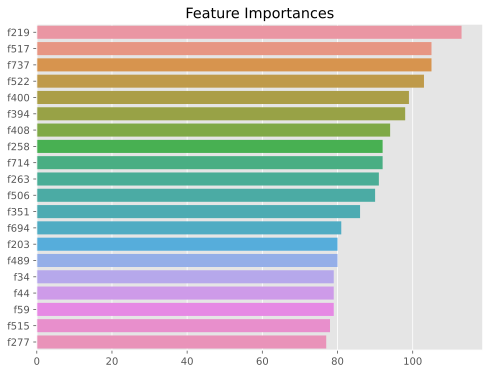

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.8381, Accuracy: 0.1523
Validation - Loss: 0.8194, Accuracy: 0.1834
Time taken: 1.63 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.8274, Accuracy: 0.1762
Validation - Loss: 0.8071, Accuracy: 0.2212
Time taken: 1.74 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.8167, Accuracy: 0.2134
Validation - Loss: 0.7952, Accuracy: 0.2516
Time taken: 2.01 seconds
--------------------------------------------------
Epoch: 4/200
Tr

Epoch: 45/200
Training - Loss: 0.7378, Accuracy: 0.2484
Validation - Loss: 0.7297, Accuracy: 0.2610
Time taken: 1.96 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.7374, Accuracy: 0.2484
Validation - Loss: 0.7293, Accuracy: 0.2610
Time taken: 2.21 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.7369, Accuracy: 0.2484
Validation - Loss: 0.7288, Accuracy: 0.2610
Time taken: 1.78 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.7364, Accuracy: 0.2484
Validation - Loss: 0.7283, Accuracy: 0.2610
Time taken: 1.52 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.7360, Accuracy: 0.2484
Validation - Loss: 0.7279, Accuracy: 0.2610
Time taken: 1.66 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.7355, Accuracy: 0.2484
Validation - Loss: 0.7274, Accuracy: 0.2610
Time taken: 1.80 sec

Epoch: 92/200
Training - Loss: 0.7179, Accuracy: 0.2484
Validation - Loss: 0.7083, Accuracy: 0.2610
Time taken: 2.27 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.7175, Accuracy: 0.2484
Validation - Loss: 0.7078, Accuracy: 0.2610
Time taken: 1.94 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.7171, Accuracy: 0.2484
Validation - Loss: 0.7074, Accuracy: 0.2610
Time taken: 2.29 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.7168, Accuracy: 0.2485
Validation - Loss: 0.7069, Accuracy: 0.2610
Time taken: 1.68 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.7164, Accuracy: 0.2485
Validation - Loss: 0.7065, Accuracy: 0.2610
Time taken: 1.90 seconds
--------------------------------------------------
Epoch: 97/200
Training - Loss: 0.7160, Accuracy: 0.2485
Validation - Loss: 0.7061, Accuracy: 0.2610
Time taken: 1.70 sec

Epoch: 139/200
Training - Loss: 0.7000, Accuracy: 0.2507
Validation - Loss: 0.6877, Accuracy: 0.2631
Time taken: 1.58 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.6996, Accuracy: 0.2507
Validation - Loss: 0.6873, Accuracy: 0.2631
Time taken: 2.22 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.6992, Accuracy: 0.2507
Validation - Loss: 0.6868, Accuracy: 0.2631
Time taken: 1.94 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.6988, Accuracy: 0.2507
Validation - Loss: 0.6864, Accuracy: 0.2631
Time taken: 1.63 seconds
--------------------------------------------------
Epoch: 143/200
Training - Loss: 0.6985, Accuracy: 0.2507
Validation - Loss: 0.6860, Accuracy: 0.2631
Time taken: 1.90 seconds
--------------------------------------------------
Epoch: 144/200
Training - Loss: 0.6981, Accuracy: 0.2507
Validation - Loss: 0.6855, Accuracy: 0.2631
Time taken: 1.

Epoch: 186/200
Training - Loss: 0.6831, Accuracy: 0.2534
Validation - Loss: 0.6682, Accuracy: 0.2673
Time taken: 1.86 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.6827, Accuracy: 0.2536
Validation - Loss: 0.6677, Accuracy: 0.2673
Time taken: 2.16 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.6824, Accuracy: 0.2536
Validation - Loss: 0.6673, Accuracy: 0.2673
Time taken: 1.86 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.6821, Accuracy: 0.2537
Validation - Loss: 0.6669, Accuracy: 0.2673
Time taken: 1.82 seconds
--------------------------------------------------
Epoch: 190/200
Training - Loss: 0.6817, Accuracy: 0.2539
Validation - Loss: 0.6665, Accuracy: 0.2673
Time taken: 2.43 seconds
--------------------------------------------------
Epoch: 191/200
Training - Loss: 0.6814, Accuracy: 0.2542
Validation - Loss: 0.6661, Accuracy: 0.2673
Time taken: 2.

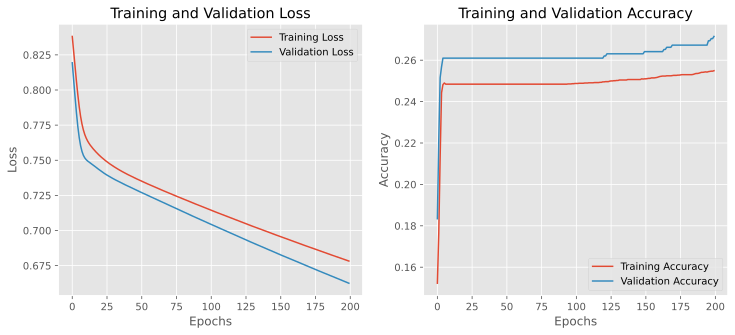

Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a SVM on the dartmouth dataset
Test Accuracy: 25.73%
              precision    recall  f1-score   support

       Angry       1.00      0.01      0.02       125
     Disgust       0.00      0.00      0.00       112
        Fear       1.00      0.01      0.02       113
       Happy       0.25      1.00      0.40       241
         Sad       0.00      0.00      0.00       118
    Surprise       1.00      0.03      0.05       120
     Neutral       0.00      0.00      0.00       127

    accuracy                           0.26       956
   macro avg       0.46      0.15      0.07       956
weighted avg       0.44      0.26      0.11       956

Precision: 0.44, Recall: 0.26, F1 Score: 0.11


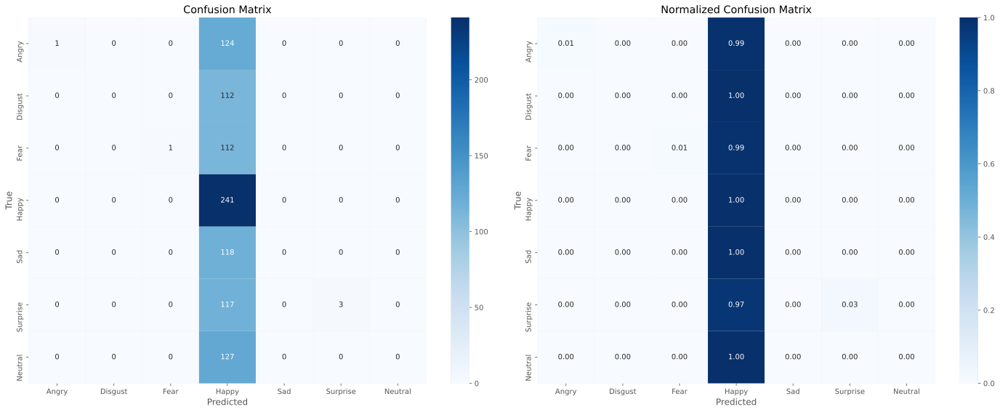

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_efficientnet_full_train_original_embeddings.npy and data/dartmouth/dartmouth_efficientnet_full_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.8853, Accuracy: 0.1158
Validation - Loss: 0.8776, Accuracy: 0.1164
Time taken: 1.47 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.8775, Accuracy: 0.1162
Validation - Loss: 0.8699, Accuracy: 0.1174
Time taken: 1.67 seconds
--------------------------------------------------
Epoch: 3/200
Training -

Epoch: 45/200
Training - Loss: 0.7447, Accuracy: 0.2592
Validation - Loss: 0.7433, Accuracy: 0.2610
Time taken: 1.57 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.7443, Accuracy: 0.2592
Validation - Loss: 0.7429, Accuracy: 0.2610
Time taken: 1.52 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.7438, Accuracy: 0.2592
Validation - Loss: 0.7424, Accuracy: 0.2610
Time taken: 1.47 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.7433, Accuracy: 0.2592
Validation - Loss: 0.7420, Accuracy: 0.2610
Time taken: 1.91 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.7428, Accuracy: 0.2592
Validation - Loss: 0.7415, Accuracy: 0.2610
Time taken: 1.69 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.7423, Accuracy: 0.2592
Validation - Loss: 0.7411, Accuracy: 0.2610
Time taken: 1.83 sec

Epoch: 92/200
Training - Loss: 0.7250, Accuracy: 0.2592
Validation - Loss: 0.7251, Accuracy: 0.2610
Time taken: 1.95 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.7246, Accuracy: 0.2592
Validation - Loss: 0.7248, Accuracy: 0.2610
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.7242, Accuracy: 0.2592
Validation - Loss: 0.7244, Accuracy: 0.2610
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.7238, Accuracy: 0.2592
Validation - Loss: 0.7241, Accuracy: 0.2610
Time taken: 1.75 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.7235, Accuracy: 0.2592
Validation - Loss: 0.7237, Accuracy: 0.2610
Time taken: 1.65 seconds
--------------------------------------------------
Epoch: 97/200
Training - Loss: 0.7231, Accuracy: 0.2592
Validation - Loss: 0.7234, Accuracy: 0.2610
Time taken: 1.89 sec

Epoch: 139/200
Training - Loss: 0.7080, Accuracy: 0.2592
Validation - Loss: 0.7091, Accuracy: 0.2610
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.7077, Accuracy: 0.2592
Validation - Loss: 0.7088, Accuracy: 0.2610
Time taken: 1.70 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.7073, Accuracy: 0.2592
Validation - Loss: 0.7085, Accuracy: 0.2610
Time taken: 1.77 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.7070, Accuracy: 0.2592
Validation - Loss: 0.7081, Accuracy: 0.2610
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 143/200
Training - Loss: 0.7066, Accuracy: 0.2592
Validation - Loss: 0.7078, Accuracy: 0.2610
Time taken: 1.66 seconds
--------------------------------------------------
Epoch: 144/200
Training - Loss: 0.7063, Accuracy: 0.2592
Validation - Loss: 0.7075, Accuracy: 0.2610
Time taken: 1.

Epoch: 186/200
Training - Loss: 0.6921, Accuracy: 0.2599
Validation - Loss: 0.6938, Accuracy: 0.2610
Time taken: 1.62 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.6918, Accuracy: 0.2599
Validation - Loss: 0.6935, Accuracy: 0.2610
Time taken: 1.42 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.6915, Accuracy: 0.2599
Validation - Loss: 0.6932, Accuracy: 0.2610
Time taken: 1.80 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.6911, Accuracy: 0.2599
Validation - Loss: 0.6928, Accuracy: 0.2610
Time taken: 1.50 seconds
--------------------------------------------------
Epoch: 190/200
Training - Loss: 0.6908, Accuracy: 0.2599
Validation - Loss: 0.6925, Accuracy: 0.2610
Time taken: 1.54 seconds
--------------------------------------------------
Epoch: 191/200
Training - Loss: 0.6905, Accuracy: 0.2599
Validation - Loss: 0.6922, Accuracy: 0.2610
Time taken: 1.

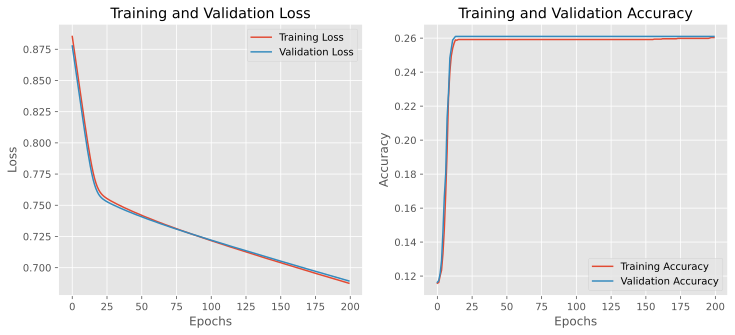

Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a SVM on the dartmouth dataset
Test Accuracy: 25.21%
              precision    recall  f1-score   support

       Angry       0.00      0.00      0.00       125
     Disgust       0.00      0.00      0.00       112
        Fear       0.00      0.00      0.00       113
       Happy       0.25      1.00      0.40       241
         Sad       0.00      0.00      0.00       118
    Surprise       0.00      0.00      0.00       120
     Neutral       0.00      0.00      0.00       127

    accuracy                           0.25       956
   macro avg       0.04      0.14      0.06       956
weighted avg       0.06      0.25      0.10       956

Precision: 0.06, Recall: 0.25, F1 Score: 0.10


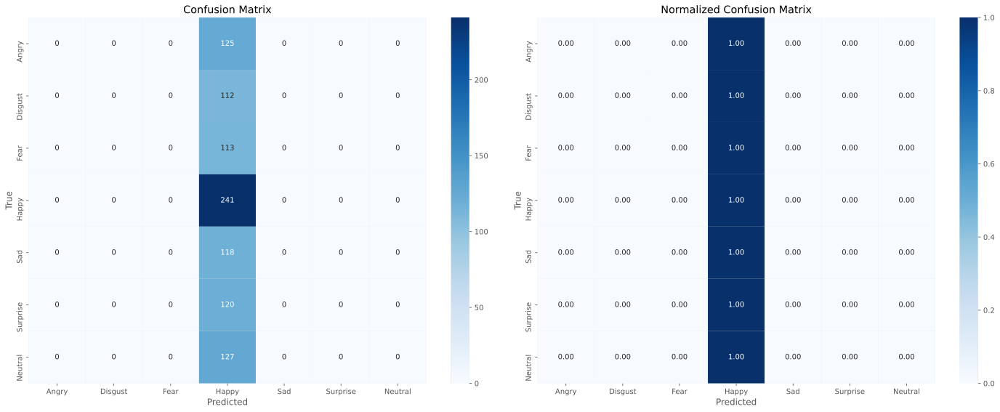

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9796, Accuracy: 0.1629
Validation - Loss: 1.8903, Accuracy: 0.2558
Time taken: 2.23 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9072, Accuracy: 0.2101
Validation - Loss: 1.8198, Accuracy: 0.3669
Time taken: 2.24 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8575, Accuracy: 0.2445
Validation - Loss: 1.7453, Accuracy: 0.3878
Time taken: 1.84 seconds
--------------------------------------------------
Epoch: 4/200
Tra

Epoch: 44/200
Training - Loss: 0.9560, Accuracy: 0.6679
Validation - Loss: 0.8753, Accuracy: 0.6918
Time taken: 2.05 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.9494, Accuracy: 0.6672
Validation - Loss: 0.8573, Accuracy: 0.7096
Time taken: 1.95 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.9517, Accuracy: 0.6638
Validation - Loss: 0.8658, Accuracy: 0.7055
Time taken: 2.31 seconds
--------------------------------------------------
Epoch 46: No improvement in validation loss for 1 epochs.
Epoch: 47/200
Training - Loss: 0.9446, Accuracy: 0.6707
Validation - Loss: 0.8542, Accuracy: 0.6992
Time taken: 2.05 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.9329, Accuracy: 0.6731
Validation - Loss: 0.8597, Accuracy: 0.7065
Time taken: 1.70 seconds
--------------------------------------------------
Epoch 48: No improvement in validation loss for 1 epochs.
Epoc

Epoch: 83/200
Training - Loss: 0.6635, Accuracy: 0.7715
Validation - Loss: 0.7734, Accuracy: 0.7400
Time taken: 2.23 seconds
--------------------------------------------------
Epoch 83: No improvement in validation loss for 5 epochs.
Epoch: 84/200
Training - Loss: 0.6738, Accuracy: 0.7722
Validation - Loss: 0.7701, Accuracy: 0.7369
Time taken: 2.38 seconds
--------------------------------------------------
Epoch: 85/200
Training - Loss: 0.6605, Accuracy: 0.7778
Validation - Loss: 0.7720, Accuracy: 0.7358
Time taken: 2.00 seconds
--------------------------------------------------
Epoch 85: No improvement in validation loss for 1 epochs.
Epoch: 86/200
Training - Loss: 0.6639, Accuracy: 0.7754
Validation - Loss: 0.7713, Accuracy: 0.7400
Time taken: 1.86 seconds
--------------------------------------------------
Epoch 86: No improvement in validation loss for 2 epochs.
Epoch: 87/200
Training - Loss: 0.6633, Accuracy: 0.7757
Validation - Loss: 0.7746, Accuracy: 0.7390
Time taken: 1.85 secon

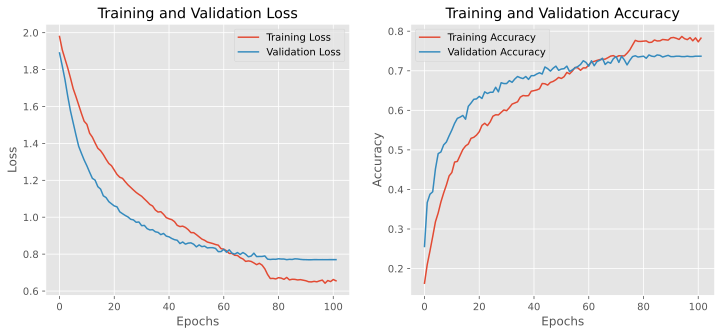

Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a NN on the dartmouth dataset
Test Accuracy: 69.77%
              precision    recall  f1-score   support

       Angry       0.65      0.67      0.66       125
     Disgust       0.62      0.58      0.60       112
        Fear       0.49      0.42      0.45       113
       Happy       0.83      0.85      0.84       241
         Sad       0.68      0.62      0.65       118
    Surprise       0.81      0.80      0.80       120
     Neutral       0.63      0.76      0.69       127

    accuracy                           0.70       956
   macro avg       0.67      0.67      0.67       956
weighted avg       0.69      0.70      0.69       956

Precision: 0.69, Recall: 0.70, F1 Score: 0.69


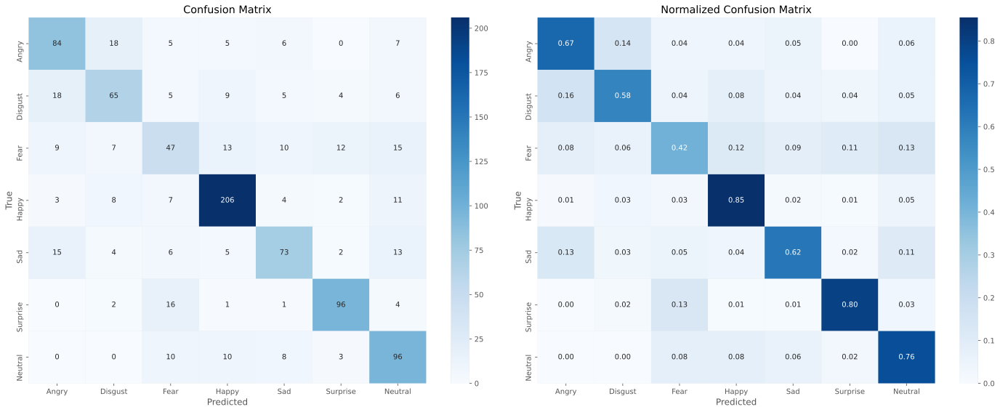

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.0325, Accuracy: 0.1517
Validation - Loss: 1.9094, Accuracy: 0.2505
Time taken: 1.50 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9413, Accuracy: 0.1746
Validation - Loss: 1.8732, Accuracy: 0.3344
Time taken: 1.53 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.9018, Accuracy: 0.1977
Validation - Loss: 1.8362, Accuracy: 0.3721
Time taken: 1.75 seconds
--------------------------------------------------
Epoch: 4/200
Tr

Epoch: 45/200
Training - Loss: 0.9441, Accuracy: 0.6807
Validation - Loss: 0.8030, Accuracy: 0.7474
Time taken: 1.69 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.9492, Accuracy: 0.6773
Validation - Loss: 0.8200, Accuracy: 0.7453
Time taken: 1.56 seconds
--------------------------------------------------
Epoch 46: No improvement in validation loss for 1 epochs.
Epoch: 47/200
Training - Loss: 0.9351, Accuracy: 0.6773
Validation - Loss: 0.7901, Accuracy: 0.7306
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.9141, Accuracy: 0.6847
Validation - Loss: 0.7817, Accuracy: 0.7421
Time taken: 1.54 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.9043, Accuracy: 0.6831
Validation - Loss: 0.7682, Accuracy: 0.7589
Time taken: 1.65 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.8893, Accuracy: 0.6921
Valida

Epoch: 89/200
Training - Loss: 0.5843, Accuracy: 0.8119
Validation - Loss: 0.5128, Accuracy: 0.8585
Time taken: 2.07 seconds
--------------------------------------------------
Epoch: 90/200
Training - Loss: 0.5917, Accuracy: 0.8070
Validation - Loss: 0.5167, Accuracy: 0.8522
Time taken: 1.51 seconds
--------------------------------------------------
Epoch 90: No improvement in validation loss for 1 epochs.
Epoch: 91/200
Training - Loss: 0.5716, Accuracy: 0.8104
Validation - Loss: 0.5126, Accuracy: 0.8543
Time taken: 2.09 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.5683, Accuracy: 0.8099
Validation - Loss: 0.5057, Accuracy: 0.8574
Time taken: 2.13 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.5728, Accuracy: 0.8097
Validation - Loss: 0.5163, Accuracy: 0.8522
Time taken: 2.20 seconds
--------------------------------------------------
Epoch 93: No improvement in validation loss for 1 epochs.
Epoc

Epoch: 129/200
Training - Loss: 0.3804, Accuracy: 0.8795
Validation - Loss: 0.3968, Accuracy: 0.8847
Time taken: 1.90 seconds
--------------------------------------------------
Epoch 129: No improvement in validation loss for 2 epochs.
Epoch: 130/200
Training - Loss: 0.3900, Accuracy: 0.8734
Validation - Loss: 0.3856, Accuracy: 0.8868
Time taken: 1.95 seconds
--------------------------------------------------
Epoch: 131/200
Training - Loss: 0.3856, Accuracy: 0.8795
Validation - Loss: 0.3889, Accuracy: 0.8962
Time taken: 2.09 seconds
--------------------------------------------------
Epoch 131: No improvement in validation loss for 1 epochs.
Epoch: 132/200
Training - Loss: 0.3842, Accuracy: 0.8770
Validation - Loss: 0.3806, Accuracy: 0.8962
Time taken: 1.63 seconds
--------------------------------------------------
Epoch: 133/200
Training - Loss: 0.3798, Accuracy: 0.8781
Validation - Loss: 0.3769, Accuracy: 0.9025
Time taken: 1.38 seconds
------------------------------------------------

Epoch: 168/200
Training - Loss: 0.2588, Accuracy: 0.9208
Validation - Loss: 0.3190, Accuracy: 0.9245
Time taken: 1.92 seconds
--------------------------------------------------
Epoch: 169/200
Training - Loss: 0.2460, Accuracy: 0.9302
Validation - Loss: 0.3202, Accuracy: 0.9245
Time taken: 1.82 seconds
--------------------------------------------------
Epoch 169: No improvement in validation loss for 1 epochs.
Epoch: 170/200
Training - Loss: 0.2496, Accuracy: 0.9307
Validation - Loss: 0.3208, Accuracy: 0.9224
Time taken: 2.10 seconds
--------------------------------------------------
Epoch 170: No improvement in validation loss for 2 epochs.
Epoch: 171/200
Training - Loss: 0.2425, Accuracy: 0.9309
Validation - Loss: 0.3216, Accuracy: 0.9224
Time taken: 2.24 seconds
--------------------------------------------------
Epoch 171: No improvement in validation loss for 3 epochs.
Epoch: 172/200
Training - Loss: 0.2437, Accuracy: 0.9286
Validation - Loss: 0.3214, Accuracy: 0.9172
Time taken: 1.

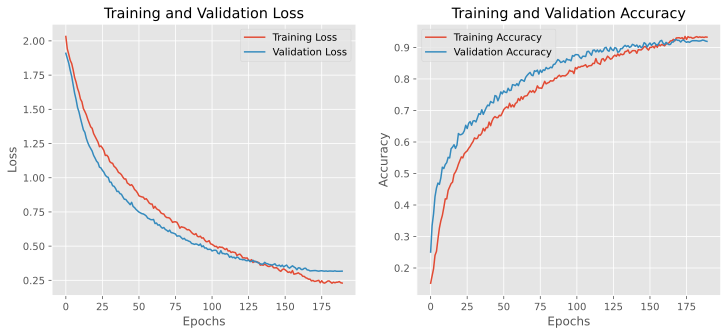

Evaluating model on test set...
Here are results for efficientnet embeddings using full layer training with a NN on the dartmouth dataset
Test Accuracy: 89.96%
              precision    recall  f1-score   support

       Angry       0.88      0.85      0.86       125
     Disgust       0.87      0.88      0.88       112
        Fear       0.82      0.87      0.84       113
       Happy       0.95      0.96      0.96       241
         Sad       0.88      0.82      0.85       118
    Surprise       0.93      0.95      0.94       120
     Neutral       0.91      0.91      0.91       127

    accuracy                           0.90       956
   macro avg       0.89      0.89      0.89       956
weighted avg       0.90      0.90      0.90       956

Precision: 0.90, Recall: 0.90, F1 Score: 0.90


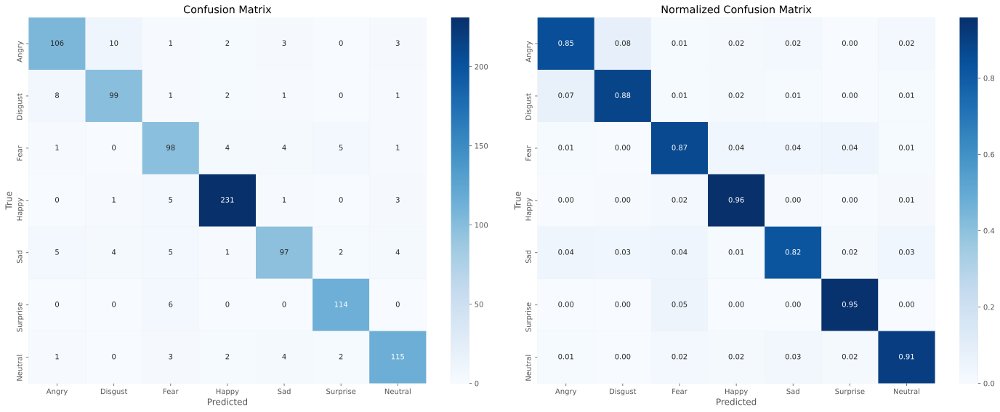

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.70116	eval-mlogloss:1.81491
[1]	train-mlogloss:1.52368	eval-mlogloss:1.72626
[2]	train-mlogloss:1.38682	eval-mlogloss:1.65981
[3]	train-mlogloss:1.27163	eval-mlogloss:1.60358
[4]	train-mlogloss:1.17103	eval-mlogloss:1.55364
[5]	train-mlogloss:1.08093	eval-mlogloss:1.52034
[6]	train-mlogloss:1.00454	eval-mlogloss:1.48392
[7]	train-mlogloss:0.94079	eval-mlogloss:1.45331
[8]	train-mlogloss:0.87828	eval-mlogloss:1.42576
[9]	train-mlogloss:0.82036	eval-mlogloss:1.40724
[10]	train-mlogloss:0.77092	eval-mlogloss:1.38586
[

[154]	train-mlogloss:0.00626	eval-mlogloss:1.04586
[155]	train-mlogloss:0.00617	eval-mlogloss:1.04624
[156]	train-mlogloss:0.00610	eval-mlogloss:1.04588
[157]	train-mlogloss:0.00603	eval-mlogloss:1.04515
[158]	train-mlogloss:0.00596	eval-mlogloss:1.04559
[159]	train-mlogloss:0.00589	eval-mlogloss:1.04493
[160]	train-mlogloss:0.00581	eval-mlogloss:1.04388
[161]	train-mlogloss:0.00575	eval-mlogloss:1.04370
[162]	train-mlogloss:0.00568	eval-mlogloss:1.04354
[163]	train-mlogloss:0.00562	eval-mlogloss:1.04270
[164]	train-mlogloss:0.00556	eval-mlogloss:1.04368
[165]	train-mlogloss:0.00550	eval-mlogloss:1.04396
[166]	train-mlogloss:0.00544	eval-mlogloss:1.04382
[167]	train-mlogloss:0.00538	eval-mlogloss:1.04343
[168]	train-mlogloss:0.00533	eval-mlogloss:1.04351
[169]	train-mlogloss:0.00527	eval-mlogloss:1.04414
[170]	train-mlogloss:0.00521	eval-mlogloss:1.04451
[171]	train-mlogloss:0.00516	eval-mlogloss:1.04390
[172]	train-mlogloss:0.00511	eval-mlogloss:1.04447
[173]	train-mlogloss:0.00506	ev

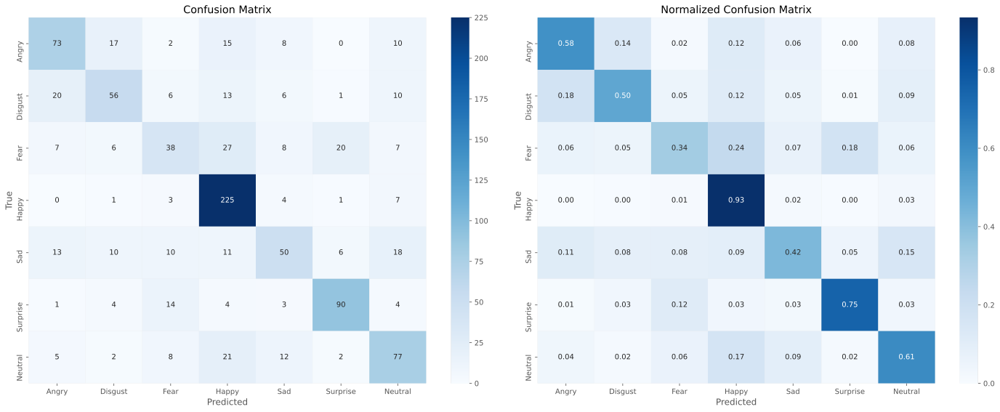

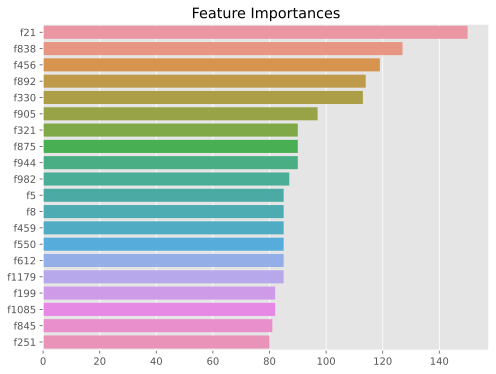

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'full', 'model_arch': 'efficientnet', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.61435	eval-mlogloss:1.66779
[1]	train-mlogloss:1.36721	eval-mlogloss:1.46011
[2]	train-mlogloss:1.17941	eval-mlogloss:1.30074
[3]	train-mlogloss:1.03117	eval-mlogloss:1.18105
[4]	train-mlogloss:0.90091	eval-mlogloss:1.06532
[5]	train-mlogloss:0.79875	eval-mlogloss:0.98069
[6]	train-mlogloss:0.71034	eval-mlogloss:0.91051
[7]	train-mlogloss:0.63053	eval-mlogloss:0.84717
[8]	train-mlogloss:0.56876	eval-mlogloss:0.79903
[9]	train-mlogloss:0.51072	eval-mlogloss:0.75026
[10]	train-mlogloss:0.45458	eval-mlogloss:0.70431


Test Accuracy: 0.8808
              precision    recall  f1-score   support

       Angry       0.87      0.82      0.84       125
     Disgust       0.86      0.83      0.85       112
        Fear       0.86      0.81      0.84       113
       Happy       0.90      0.98      0.94       241
         Sad       0.82      0.83      0.83       118
    Surprise       0.93      0.92      0.92       120
     Neutral       0.88      0.87      0.88       127

    accuracy                           0.88       956
   macro avg       0.88      0.87      0.87       956
weighted avg       0.88      0.88      0.88       956



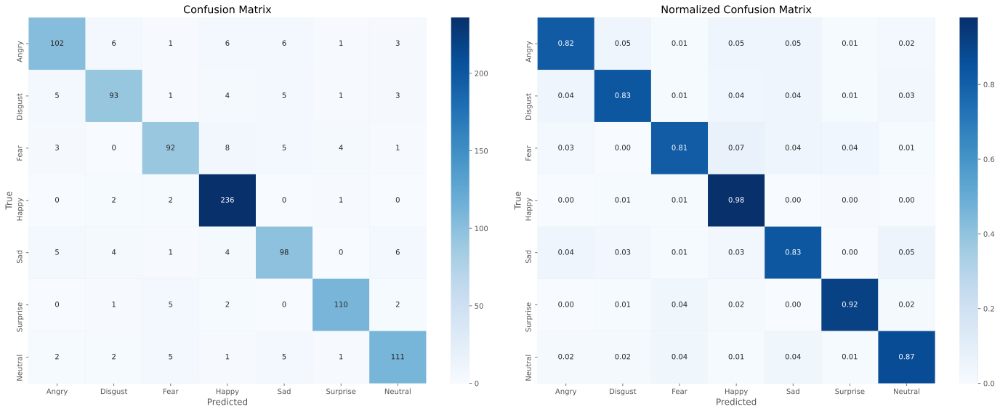

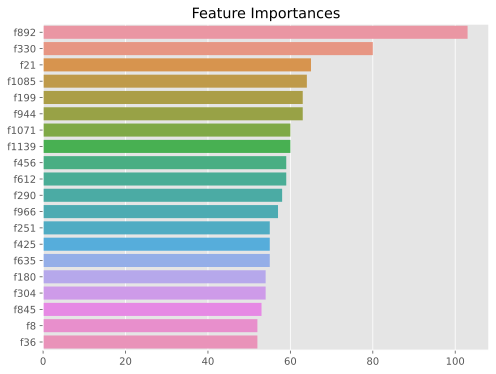

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_resnet_partial_train_augmented_embeddings.npy and data/dartmouth/dartmouth_resnet_partial_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_resnet_partial_val_original_embeddings.npy and data/dartmouth/dartmouth_resnet_partial_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_resnet_partial_test_original_embeddings.npy and data/dartmouth/dartmouth_resnet_partial_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7307, Accuracy: 0.2588
Validation -

Epoch: 38/200
Training - Loss: 0.3492, Accuracy: 0.5404
Validation - Loss: 0.3717, Accuracy: 0.5283
Time taken: 1.86 seconds
--------------------------------------------------
Epoch 38: No improvement in validation loss for 3 epochs.
Epoch: 39/200
Training - Loss: 0.3488, Accuracy: 0.5403
Validation - Loss: 0.3582, Accuracy: 0.5451
Time taken: 2.05 seconds
--------------------------------------------------
Epoch: 40/200
Training - Loss: 0.3450, Accuracy: 0.5439
Validation - Loss: 0.3553, Accuracy: 0.5482
Time taken: 1.91 seconds
--------------------------------------------------
Epoch: 41/200
Training - Loss: 0.3452, Accuracy: 0.5377
Validation - Loss: 0.3713, Accuracy: 0.5220
Time taken: 1.77 seconds
--------------------------------------------------
Epoch 41: No improvement in validation loss for 1 epochs.
Epoch: 42/200
Training - Loss: 0.3441, Accuracy: 0.5441
Validation - Loss: 0.3512, Accuracy: 0.5283
Time taken: 2.07 seconds
--------------------------------------------------
Epoc

Epoch: 76/200
Training - Loss: 0.3114, Accuracy: 0.5717
Validation - Loss: 0.3339, Accuracy: 0.5681
Time taken: 1.74 seconds
--------------------------------------------------
Epoch 76: No improvement in validation loss for 1 epochs.
Epoch: 77/200
Training - Loss: 0.3114, Accuracy: 0.5683
Validation - Loss: 0.3326, Accuracy: 0.5660
Time taken: 1.48 seconds
--------------------------------------------------
Epoch: 78/200
Training - Loss: 0.3113, Accuracy: 0.5702
Validation - Loss: 0.3334, Accuracy: 0.5692
Time taken: 1.90 seconds
--------------------------------------------------
Epoch 78: No improvement in validation loss for 1 epochs.
Epoch: 79/200
Training - Loss: 0.3111, Accuracy: 0.5695
Validation - Loss: 0.3336, Accuracy: 0.5671
Time taken: 1.60 seconds
--------------------------------------------------
Epoch 79: No improvement in validation loss for 2 epochs.
Epoch: 80/200
Training - Loss: 0.3112, Accuracy: 0.5690
Validation - Loss: 0.3317, Accuracy: 0.5660
Time taken: 1.68 secon

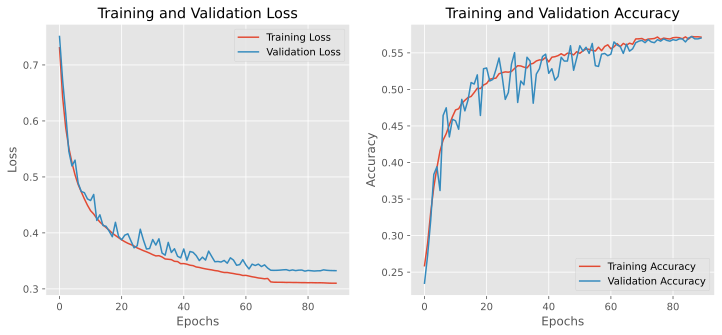

Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a SVM on the dartmouth dataset
Test Accuracy: 54.50%
              precision    recall  f1-score   support

       Angry       0.49      0.57      0.53       105
     Disgust       0.46      0.37      0.41       115
        Fear       0.37      0.36      0.36       103
       Happy       0.63      0.80      0.70       239
         Sad       0.41      0.33      0.36       129
    Surprise       0.77      0.59      0.67       128
     Neutral       0.54      0.53      0.53       137

    accuracy                           0.54       956
   macro avg       0.52      0.51      0.51       956
weighted avg       0.54      0.54      0.54       956

Precision: 0.54, Recall: 0.54, F1 Score: 0.54


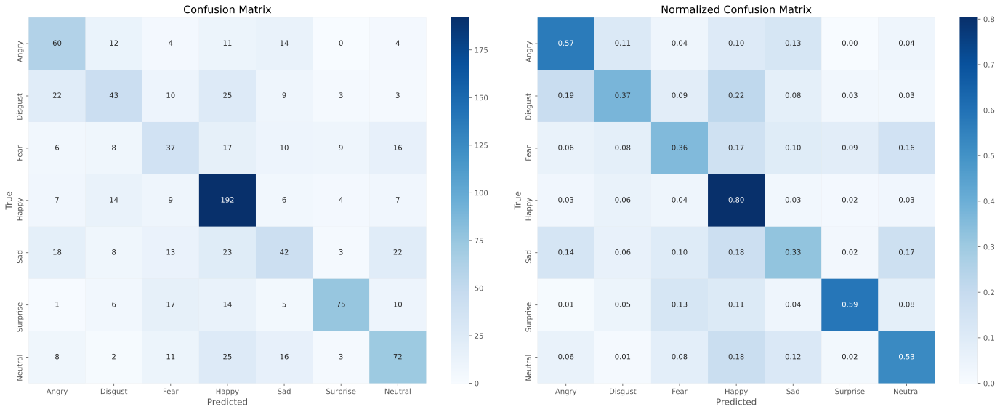

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_resnet_partial_train_original_embeddings.npy and data/dartmouth/dartmouth_resnet_partial_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7332, Accuracy: 0.2487
Validation - Loss: 0.6984, Accuracy: 0.2600
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.6579, Accuracy: 0.2832
Validation - Loss: 0.6485, Accuracy: 0.3113
Time taken: 1.36 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.

Epoch: 41/200
Training - Loss: 0.3355, Accuracy: 0.5545
Validation - Loss: 0.3323, Accuracy: 0.5681
Time taken: 1.93 seconds
--------------------------------------------------
Epoch: 42/200
Training - Loss: 0.3351, Accuracy: 0.5604
Validation - Loss: 0.3277, Accuracy: 0.5765
Time taken: 2.12 seconds
--------------------------------------------------
Epoch: 43/200
Training - Loss: 0.3336, Accuracy: 0.5615
Validation - Loss: 0.3278, Accuracy: 0.5744
Time taken: 1.80 seconds
--------------------------------------------------
Epoch 43: No improvement in validation loss for 1 epochs.
Epoch: 44/200
Training - Loss: 0.3308, Accuracy: 0.5651
Validation - Loss: 0.3242, Accuracy: 0.5786
Time taken: 1.43 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.3294, Accuracy: 0.5702
Validation - Loss: 0.3259, Accuracy: 0.5765
Time taken: 1.56 seconds
--------------------------------------------------
Epoch 45: No improvement in validation loss for 1 epochs.
Epoc

Epoch: 81/200
Training - Loss: 0.2913, Accuracy: 0.5945
Validation - Loss: 0.2956, Accuracy: 0.5912
Time taken: 1.59 seconds
--------------------------------------------------
Epoch 81: No improvement in validation loss for 2 epochs.
Epoch: 82/200
Training - Loss: 0.2901, Accuracy: 0.6050
Validation - Loss: 0.2934, Accuracy: 0.6017
Time taken: 1.63 seconds
--------------------------------------------------
Epoch 82: No improvement in validation loss for 3 epochs.
Epoch: 83/200
Training - Loss: 0.2900, Accuracy: 0.5969
Validation - Loss: 0.2881, Accuracy: 0.6080
Time taken: 1.66 seconds
--------------------------------------------------
Epoch: 84/200
Training - Loss: 0.2885, Accuracy: 0.6068
Validation - Loss: 0.2905, Accuracy: 0.5996
Time taken: 1.47 seconds
--------------------------------------------------
Epoch 84: No improvement in validation loss for 1 epochs.
Epoch: 85/200
Training - Loss: 0.2897, Accuracy: 0.6014
Validation - Loss: 0.2879, Accuracy: 0.6027
Time taken: 1.42 secon

Epoch 00119: reducing learning rate of group 0 to 1.0000e-03.
Epoch: 119/200
Training - Loss: 0.2698, Accuracy: 0.6196
Validation - Loss: 0.2728, Accuracy: 0.6195
Time taken: 1.35 seconds
--------------------------------------------------
Epoch 119: No improvement in validation loss for 6 epochs.
Epoch: 120/200
Training - Loss: 0.2658, Accuracy: 0.6261
Validation - Loss: 0.2693, Accuracy: 0.6321
Time taken: 1.39 seconds
--------------------------------------------------
Epoch: 121/200
Training - Loss: 0.2653, Accuracy: 0.6286
Validation - Loss: 0.2697, Accuracy: 0.6289
Time taken: 1.39 seconds
--------------------------------------------------
Epoch 121: No improvement in validation loss for 1 epochs.
Epoch: 122/200
Training - Loss: 0.2653, Accuracy: 0.6277
Validation - Loss: 0.2692, Accuracy: 0.6321
Time taken: 1.27 seconds
--------------------------------------------------
Epoch: 123/200
Training - Loss: 0.2652, Accuracy: 0.6290
Validation - Loss: 0.2695, Accuracy: 0.6321
Time taken:

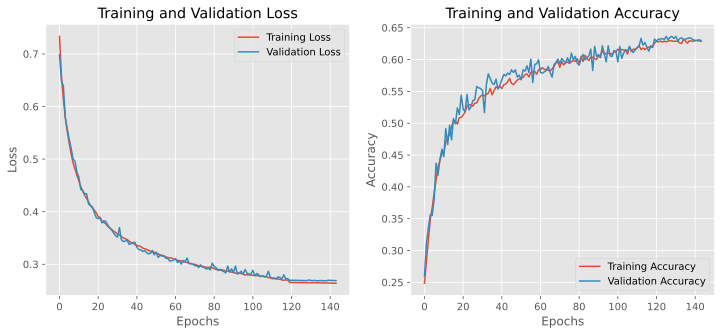

Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a SVM on the dartmouth dataset
Test Accuracy: 62.66%
              precision    recall  f1-score   support

       Angry       0.57      0.66      0.61       105
     Disgust       0.62      0.50      0.55       115
        Fear       0.47      0.48      0.47       103
       Happy       0.68      0.83      0.75       239
         Sad       0.55      0.46      0.50       129
    Surprise       0.81      0.67      0.74       128
     Neutral       0.60      0.59      0.60       137

    accuracy                           0.63       956
   macro avg       0.61      0.60      0.60       956
weighted avg       0.63      0.63      0.62       956

Precision: 0.63, Recall: 0.63, F1 Score: 0.62


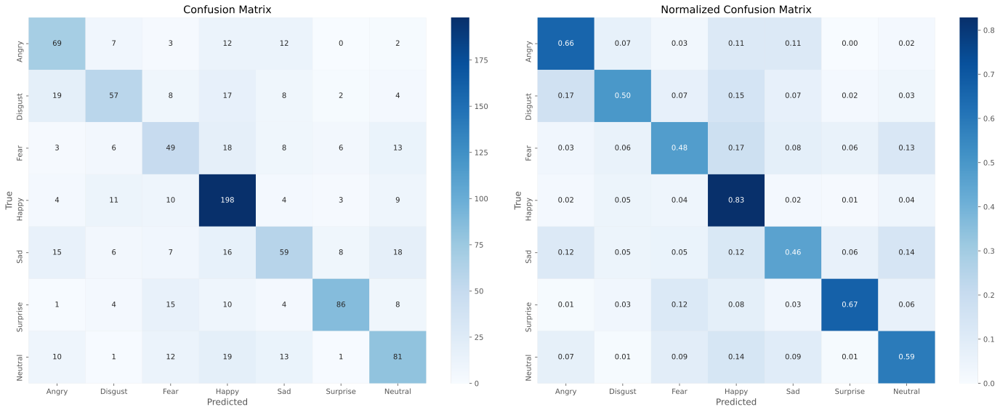

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.2100, Accuracy: 0.1545
Validation - Loss: 1.9197, Accuracy: 0.2222
Time taken: 1.66 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9757, Accuracy: 0.1660
Validation - Loss: 1.9003, Accuracy: 0.2432
Time taken: 1.61 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.9296, Accuracy: 0.1867
Validation - Loss: 1.8784, Accuracy: 0.2212
Time taken: 1.63 seconds
--------------------------------------------------
Epoch: 4/200
Traini

Epoch: 45/200
Training - Loss: 1.2779, Accuracy: 0.5286
Validation - Loss: 1.1773, Accuracy: 0.5849
Time taken: 1.60 seconds
--------------------------------------------------
Epoch 45: No improvement in validation loss for 1 epochs.
Epoch: 46/200
Training - Loss: 1.2596, Accuracy: 0.5408
Validation - Loss: 1.1811, Accuracy: 0.5786
Time taken: 2.04 seconds
--------------------------------------------------
Epoch 46: No improvement in validation loss for 2 epochs.
Epoch: 47/200
Training - Loss: 1.2493, Accuracy: 0.5482
Validation - Loss: 1.1591, Accuracy: 0.5744
Time taken: 1.70 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 1.2386, Accuracy: 0.5499
Validation - Loss: 1.1496, Accuracy: 0.5881
Time taken: 2.34 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 1.2353, Accuracy: 0.5491
Validation - Loss: 1.1525, Accuracy: 0.5954
Time taken: 2.30 seconds
--------------------------------------------------
Epoc

Epoch: 86/200
Training - Loss: 0.9906, Accuracy: 0.6391
Validation - Loss: 1.0449, Accuracy: 0.6310
Time taken: 1.73 seconds
--------------------------------------------------
Epoch: 87/200
Training - Loss: 0.9764, Accuracy: 0.6481
Validation - Loss: 1.0587, Accuracy: 0.6237
Time taken: 1.72 seconds
--------------------------------------------------
Epoch 87: No improvement in validation loss for 1 epochs.
Epoch: 88/200
Training - Loss: 0.9786, Accuracy: 0.6465
Validation - Loss: 1.0632, Accuracy: 0.6153
Time taken: 1.63 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 2 epochs.
Epoch: 89/200
Training - Loss: 0.9661, Accuracy: 0.6517
Validation - Loss: 1.0597, Accuracy: 0.6258
Time taken: 1.68 seconds
--------------------------------------------------
Epoch 89: No improvement in validation loss for 3 epochs.
Epoch: 90/200
Training - Loss: 0.9669, Accuracy: 0.6444
Validation - Loss: 1.0484, Accuracy: 0.6237
Time taken: 1.62 secon

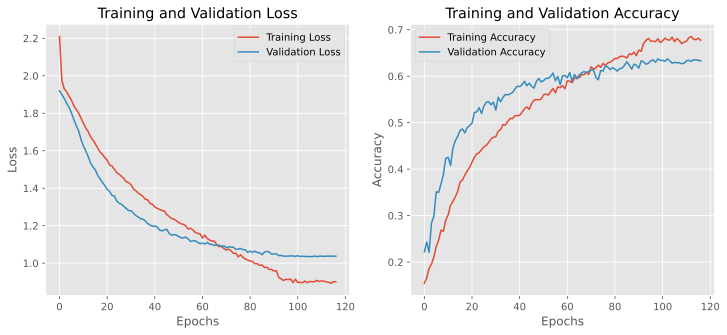

Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a NN on the dartmouth dataset
Test Accuracy: 64.33%
              precision    recall  f1-score   support

       Angry       0.56      0.70      0.62       105
     Disgust       0.57      0.55      0.56       115
        Fear       0.50      0.58      0.54       103
       Happy       0.81      0.76      0.79       239
         Sad       0.51      0.46      0.48       129
    Surprise       0.80      0.73      0.77       128
     Neutral       0.61      0.61      0.61       137

    accuracy                           0.64       956
   macro avg       0.62      0.63      0.62       956
weighted avg       0.65      0.64      0.65       956

Precision: 0.65, Recall: 0.64, F1 Score: 0.65


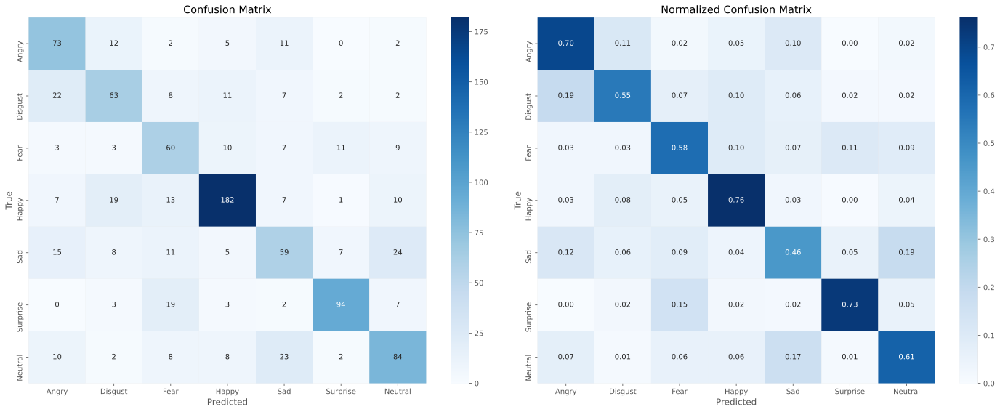

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.3575, Accuracy: 0.1533
Validation - Loss: 1.9261, Accuracy: 0.2075
Time taken: 1.31 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 2.0296, Accuracy: 0.1712
Validation - Loss: 1.9005, Accuracy: 0.2390
Time taken: 1.45 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.9500, Accuracy: 0.1946
Validation - Loss: 1.8812, Accuracy: 0.2757
Time taken: 1.53 seconds
--------------------------------------------------
Epoch: 4/200
Train

Epoch: 46/200
Training - Loss: 1.3180, Accuracy: 0.5191
Validation - Loss: 1.1562, Accuracy: 0.6038
Time taken: 1.47 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 1.3014, Accuracy: 0.5276
Validation - Loss: 1.1458, Accuracy: 0.6048
Time taken: 1.41 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 1.3071, Accuracy: 0.5229
Validation - Loss: 1.1396, Accuracy: 0.6038
Time taken: 1.34 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 1.2833, Accuracy: 0.5233
Validation - Loss: 1.1297, Accuracy: 0.6143
Time taken: 1.36 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 1.2711, Accuracy: 0.5390
Validation - Loss: 1.1130, Accuracy: 0.5943
Time taken: 1.39 seconds
--------------------------------------------------
Epoch: 51/200
Training - Loss: 1.2703, Accuracy: 0.5415
Validation - Loss: 1.1166, Accuracy: 0.6205
Time taken: 1.40 sec

Epoch: 88/200
Training - Loss: 1.0249, Accuracy: 0.6315
Validation - Loss: 0.8894, Accuracy: 0.7044
Time taken: 1.78 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 1 epochs.
Epoch: 89/200
Training - Loss: 1.0179, Accuracy: 0.6263
Validation - Loss: 0.8811, Accuracy: 0.6981
Time taken: 1.58 seconds
--------------------------------------------------
Epoch: 90/200
Training - Loss: 1.0024, Accuracy: 0.6400
Validation - Loss: 0.8770, Accuracy: 0.7044
Time taken: 1.36 seconds
--------------------------------------------------
Epoch: 91/200
Training - Loss: 1.0044, Accuracy: 0.6452
Validation - Loss: 0.8743, Accuracy: 0.7034
Time taken: 1.68 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.9903, Accuracy: 0.6472
Validation - Loss: 0.8651, Accuracy: 0.6950
Time taken: 1.83 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.9900, Accuracy: 0.6490
Valida

Epoch: 131/200
Training - Loss: 0.8086, Accuracy: 0.7069
Validation - Loss: 0.7085, Accuracy: 0.7673
Time taken: 1.91 seconds
--------------------------------------------------
Epoch: 132/200
Training - Loss: 0.8044, Accuracy: 0.7112
Validation - Loss: 0.7034, Accuracy: 0.7621
Time taken: 2.02 seconds
--------------------------------------------------
Epoch: 133/200
Training - Loss: 0.7912, Accuracy: 0.7166
Validation - Loss: 0.6977, Accuracy: 0.7788
Time taken: 1.61 seconds
--------------------------------------------------
Epoch: 134/200
Training - Loss: 0.7948, Accuracy: 0.7139
Validation - Loss: 0.6993, Accuracy: 0.7652
Time taken: 1.50 seconds
--------------------------------------------------
Epoch 134: No improvement in validation loss for 1 epochs.
Epoch: 135/200
Training - Loss: 0.7766, Accuracy: 0.7204
Validation - Loss: 0.6951, Accuracy: 0.7736
Time taken: 1.55 seconds
--------------------------------------------------
Epoch: 136/200
Training - Loss: 0.8001, Accuracy: 0.7249

Epoch: 172/200
Training - Loss: 0.6411, Accuracy: 0.7765
Validation - Loss: 0.5895, Accuracy: 0.8187
Time taken: 1.38 seconds
--------------------------------------------------
Epoch 172: No improvement in validation loss for 1 epochs.
Epoch: 173/200
Training - Loss: 0.6396, Accuracy: 0.7772
Validation - Loss: 0.5906, Accuracy: 0.8176
Time taken: 1.66 seconds
--------------------------------------------------
Epoch 173: No improvement in validation loss for 2 epochs.
Epoch: 174/200
Training - Loss: 0.6406, Accuracy: 0.7774
Validation - Loss: 0.5906, Accuracy: 0.8208
Time taken: 1.38 seconds
--------------------------------------------------
Epoch 174: No improvement in validation loss for 3 epochs.
Epoch: 175/200
Training - Loss: 0.6291, Accuracy: 0.7848
Validation - Loss: 0.5737, Accuracy: 0.8270
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 176/200
Training - Loss: 0.6298, Accuracy: 0.7828
Validation - Loss: 0.5741, Accuracy: 0.8239
Time taken: 1.

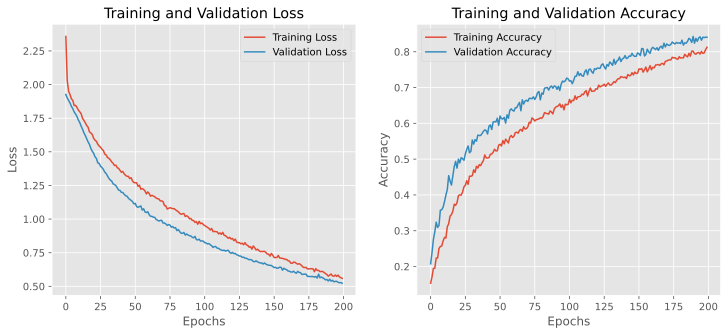

Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a NN on the dartmouth dataset
Test Accuracy: 84.31%
              precision    recall  f1-score   support

       Angry       0.80      0.86      0.83       105
     Disgust       0.81      0.87      0.84       115
        Fear       0.75      0.83      0.79       103
       Happy       0.95      0.84      0.89       239
         Sad       0.80      0.77      0.78       129
    Surprise       0.90      0.92      0.91       128
     Neutral       0.81      0.82      0.81       137

    accuracy                           0.84       956
   macro avg       0.83      0.84      0.84       956
weighted avg       0.85      0.84      0.84       956

Precision: 0.85, Recall: 0.84, F1 Score: 0.84


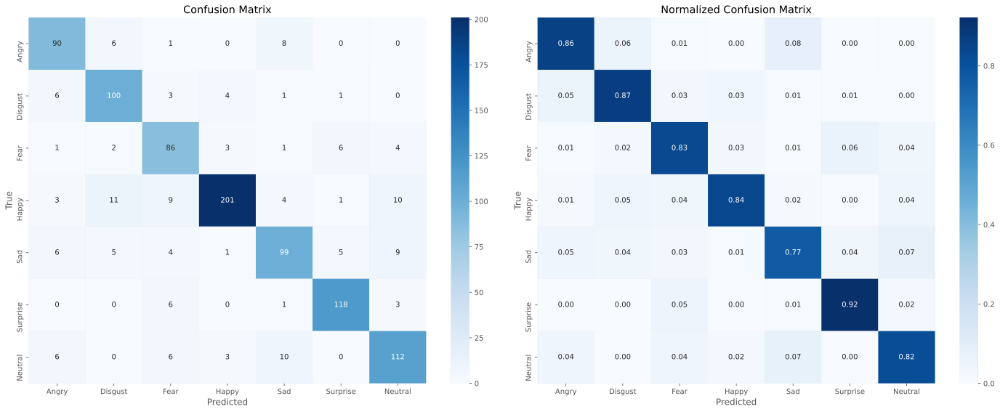

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.72633	eval-mlogloss:1.83924
[1]	train-mlogloss:1.56088	eval-mlogloss:1.76639
[2]	train-mlogloss:1.42379	eval-mlogloss:1.71147
[3]	train-mlogloss:1.31075	eval-mlogloss:1.66695
[4]	train-mlogloss:1.21981	eval-mlogloss:1.62538
[5]	train-mlogloss:1.13442	eval-mlogloss:1.59557
[6]	train-mlogloss:1.05474	eval-mlogloss:1.56541
[7]	train-mlogloss:0.98748	eval-mlogloss:1.53626
[8]	train-mlogloss:0.92475	eval-mlogloss:1.51446
[9]	train-mlogloss:0.86560	eval-mlogloss:1.50171
[10]	train-mlogloss:0.81121	eval-mlogloss:1.48236
[11]

[154]	train-mlogloss:0.00751	eval-mlogloss:1.17365
[155]	train-mlogloss:0.00741	eval-mlogloss:1.17383
[156]	train-mlogloss:0.00732	eval-mlogloss:1.17389
[157]	train-mlogloss:0.00722	eval-mlogloss:1.17385
[158]	train-mlogloss:0.00712	eval-mlogloss:1.17312
[159]	train-mlogloss:0.00703	eval-mlogloss:1.17363
[160]	train-mlogloss:0.00693	eval-mlogloss:1.17286
[161]	train-mlogloss:0.00684	eval-mlogloss:1.17205
[162]	train-mlogloss:0.00675	eval-mlogloss:1.17241
[163]	train-mlogloss:0.00667	eval-mlogloss:1.17175
[164]	train-mlogloss:0.00658	eval-mlogloss:1.17089
[165]	train-mlogloss:0.00650	eval-mlogloss:1.17144
[166]	train-mlogloss:0.00642	eval-mlogloss:1.17094
[167]	train-mlogloss:0.00634	eval-mlogloss:1.17080
[168]	train-mlogloss:0.00627	eval-mlogloss:1.17076
[169]	train-mlogloss:0.00619	eval-mlogloss:1.16969
[170]	train-mlogloss:0.00611	eval-mlogloss:1.17003
[171]	train-mlogloss:0.00604	eval-mlogloss:1.16985
[172]	train-mlogloss:0.00598	eval-mlogloss:1.16940
[173]	train-mlogloss:0.00591	ev

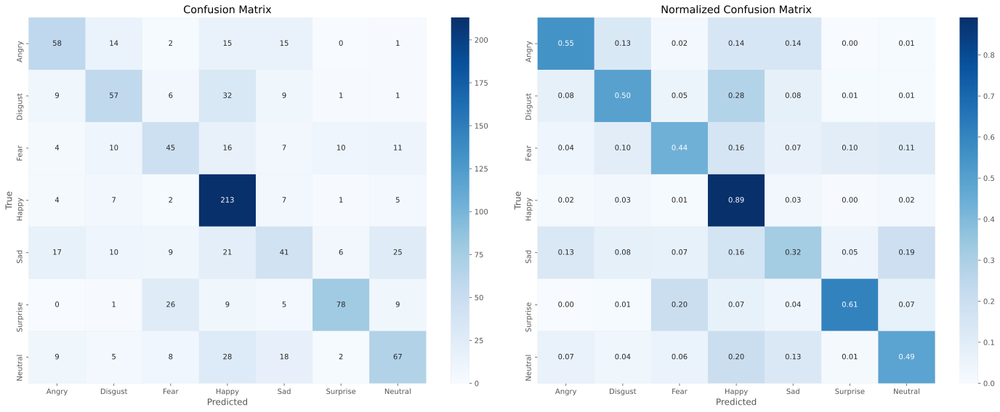

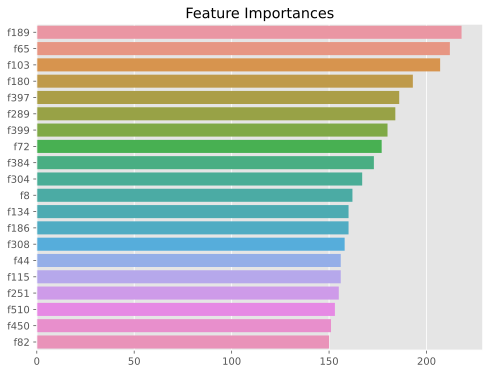

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'resnet', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.64221	eval-mlogloss:1.70505
[1]	train-mlogloss:1.41781	eval-mlogloss:1.52535
[2]	train-mlogloss:1.24831	eval-mlogloss:1.39553
[3]	train-mlogloss:1.10530	eval-mlogloss:1.28357
[4]	train-mlogloss:0.98486	eval-mlogloss:1.19453
[5]	train-mlogloss:0.87805	eval-mlogloss:1.11473
[6]	train-mlogloss:0.78573	eval-mlogloss:1.04558
[7]	train-mlogloss:0.70636	eval-mlogloss:0.97544
[8]	train-mlogloss:0.63493	eval-mlogloss:0.91993
[9]	train-mlogloss:0.57381	eval-mlogloss:0.87202
[10]	train-mlogloss:0.52355	eval-mlogloss:0.83392
[11

[154]	train-mlogloss:0.00468	eval-mlogloss:0.40153
[155]	train-mlogloss:0.00465	eval-mlogloss:0.40124
[156]	train-mlogloss:0.00462	eval-mlogloss:0.40106
[157]	train-mlogloss:0.00459	eval-mlogloss:0.40101
[158]	train-mlogloss:0.00456	eval-mlogloss:0.40057
[159]	train-mlogloss:0.00453	eval-mlogloss:0.40073
[160]	train-mlogloss:0.00450	eval-mlogloss:0.40075
[161]	train-mlogloss:0.00448	eval-mlogloss:0.40084
[162]	train-mlogloss:0.00445	eval-mlogloss:0.40064
[163]	train-mlogloss:0.00442	eval-mlogloss:0.40079
[164]	train-mlogloss:0.00440	eval-mlogloss:0.40126
[165]	train-mlogloss:0.00437	eval-mlogloss:0.40098
[166]	train-mlogloss:0.00435	eval-mlogloss:0.40128
[167]	train-mlogloss:0.00432	eval-mlogloss:0.40185
[168]	train-mlogloss:0.00429	eval-mlogloss:0.40232
[169]	train-mlogloss:0.00427	eval-mlogloss:0.40229
[170]	train-mlogloss:0.00424	eval-mlogloss:0.40211
Evaluating model on test set...
Here are results for resnet embeddings using partial layer training with a RF on the dartmouth datase

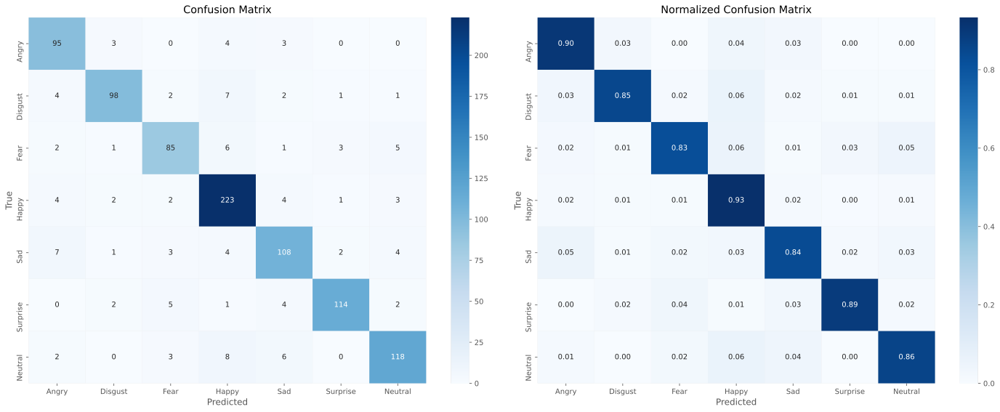

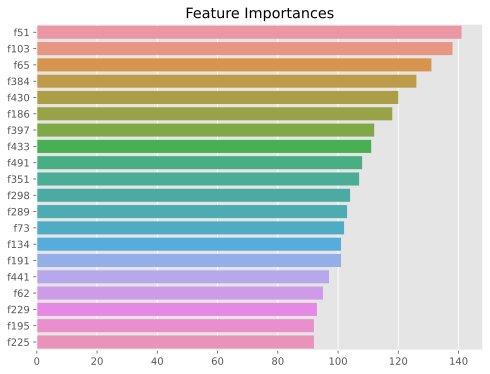

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
5,fer,resnet,full,RF,False,0.843425,0.866563,0.819766,0.839232
6,fer,vit,full,SVM,True,0.583395,0.579812,0.583395,0.573142
7,fer,vit,full,SVM,False,0.597511,0.594316,0.597511,0.586993
8,fer,vit,full,NN,True,0.592125,0.594556,0.592125,0.588450
9,fer,vit,full,NN,False,0.830423,0.830396,0.830423,0.830302


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_vit_partial_train_augmented_embeddings.npy and data/dartmouth/dartmouth_vit_partial_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_vit_partial_val_original_embeddings.npy and data/dartmouth/dartmouth_vit_partial_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_vit_partial_test_original_embeddings.npy and data/dartmouth/dartmouth_vit_partial_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7713, Accuracy: 0.2428
Validation - Loss: 0.7525, Accura

Epoch: 43/200
Training - Loss: 0.4008, Accuracy: 0.5405
Validation - Loss: 0.3952, Accuracy: 0.5283
Time taken: 1.80 seconds
--------------------------------------------------
Epoch: 44/200
Training - Loss: 0.3984, Accuracy: 0.5443
Validation - Loss: 0.3924, Accuracy: 0.5294
Time taken: 1.69 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.3961, Accuracy: 0.5452
Validation - Loss: 0.3901, Accuracy: 0.5314
Time taken: 1.94 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.3939, Accuracy: 0.5451
Validation - Loss: 0.3885, Accuracy: 0.5314
Time taken: 2.16 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.3916, Accuracy: 0.5481
Validation - Loss: 0.3860, Accuracy: 0.5314
Time taken: 1.99 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.3896, Accuracy: 0.5481
Validation - Loss: 0.3845, Accuracy: 0.5335
Time taken: 1.91 sec

Epoch: 90/200
Training - Loss: 0.3307, Accuracy: 0.5959
Validation - Loss: 0.3324, Accuracy: 0.5818
Time taken: 1.45 seconds
--------------------------------------------------
Epoch: 91/200
Training - Loss: 0.3298, Accuracy: 0.5959
Validation - Loss: 0.3314, Accuracy: 0.5755
Time taken: 1.67 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.3288, Accuracy: 0.5965
Validation - Loss: 0.3305, Accuracy: 0.5797
Time taken: 1.56 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.3279, Accuracy: 0.5982
Validation - Loss: 0.3300, Accuracy: 0.5776
Time taken: 1.44 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.3270, Accuracy: 0.5994
Validation - Loss: 0.3290, Accuracy: 0.5765
Time taken: 1.75 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.3261, Accuracy: 0.5987
Validation - Loss: 0.3283, Accuracy: 0.5818
Time taken: 1.72 sec

Epoch: 137/200
Training - Loss: 0.2963, Accuracy: 0.6289
Validation - Loss: 0.3049, Accuracy: 0.6027
Time taken: 2.00 seconds
--------------------------------------------------
Epoch: 138/200
Training - Loss: 0.2959, Accuracy: 0.6297
Validation - Loss: 0.3041, Accuracy: 0.6027
Time taken: 1.87 seconds
--------------------------------------------------
Epoch: 139/200
Training - Loss: 0.2952, Accuracy: 0.6315
Validation - Loss: 0.3041, Accuracy: 0.6048
Time taken: 1.59 seconds
--------------------------------------------------
Epoch 139: No improvement in validation loss for 1 epochs.
Epoch: 140/200
Training - Loss: 0.2947, Accuracy: 0.6314
Validation - Loss: 0.3034, Accuracy: 0.6017
Time taken: 1.80 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.2942, Accuracy: 0.6290
Validation - Loss: 0.3032, Accuracy: 0.6059
Time taken: 1.78 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.2937, Accuracy: 0.6330

Epoch: 182/200
Training - Loss: 0.2753, Accuracy: 0.6478
Validation - Loss: 0.2892, Accuracy: 0.6059
Time taken: 1.71 seconds
--------------------------------------------------
Epoch: 183/200
Training - Loss: 0.2750, Accuracy: 0.6463
Validation - Loss: 0.2885, Accuracy: 0.6048
Time taken: 1.59 seconds
--------------------------------------------------
Epoch: 184/200
Training - Loss: 0.2746, Accuracy: 0.6481
Validation - Loss: 0.2881, Accuracy: 0.6122
Time taken: 1.59 seconds
--------------------------------------------------
Epoch: 185/200
Training - Loss: 0.2742, Accuracy: 0.6485
Validation - Loss: 0.2882, Accuracy: 0.6101
Time taken: 1.71 seconds
--------------------------------------------------
Epoch 185: No improvement in validation loss for 1 epochs.
Epoch: 186/200
Training - Loss: 0.2737, Accuracy: 0.6478
Validation - Loss: 0.2881, Accuracy: 0.6059
Time taken: 1.52 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.2734, Accuracy: 0.6482

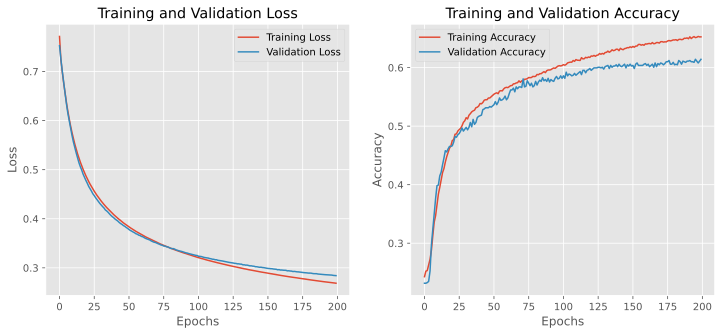

Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a SVM on the dartmouth dataset
Test Accuracy: 65.27%
              precision    recall  f1-score   support

       Angry       0.51      0.51      0.51       118
     Disgust       0.59      0.57      0.58       112
        Fear       0.54      0.42      0.47       124
       Happy       0.79      0.89      0.84       252
         Sad       0.57      0.55      0.56       121
    Surprise       0.86      0.70      0.77       115
     Neutral       0.55      0.68      0.61       114

    accuracy                           0.65       956
   macro avg       0.63      0.62      0.62       956
weighted avg       0.65      0.65      0.65       956

Precision: 0.65, Recall: 0.65, F1 Score: 0.65


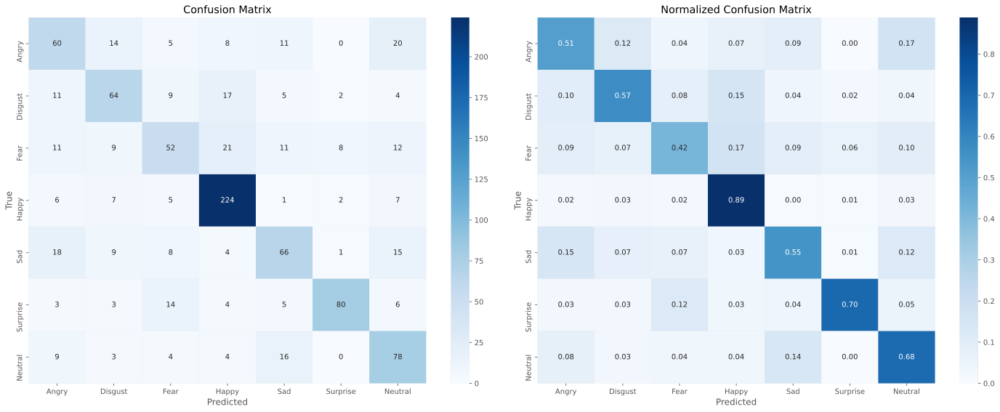

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
56,dartmouth,resnet,partial,NN,True,0.643305,0.650552,0.643305,0.645141
57,dartmouth,resnet,partial,NN,False,0.843096,0.847511,0.843096,0.843946
58,dartmouth,resnet,partial,RF,True,0.584728,0.568592,0.541771,0.549079
59,dartmouth,resnet,partial,RF,False,0.879707,0.879109,0.872054,0.874944


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_vit_partial_train_original_embeddings.npy and data/dartmouth/dartmouth_vit_partial_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.7703, Accuracy: 0.2350
Validation - Loss: 0.7567, Accuracy: 0.2317
Time taken: 1.77 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.7267, Accuracy: 0.2507
Validation - Loss: 0.7352, Accuracy: 0.2317
Time taken: 1.38 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 0.7080, Acc

Epoch: 45/200
Training - Loss: 0.4028, Accuracy: 0.5388
Validation - Loss: 0.4164, Accuracy: 0.5115
Time taken: 1.55 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.4003, Accuracy: 0.5404
Validation - Loss: 0.4140, Accuracy: 0.5105
Time taken: 1.23 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.3979, Accuracy: 0.5370
Validation - Loss: 0.4120, Accuracy: 0.5168
Time taken: 1.44 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.3956, Accuracy: 0.5451
Validation - Loss: 0.4097, Accuracy: 0.5210
Time taken: 1.67 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.3932, Accuracy: 0.5431
Validation - Loss: 0.4074, Accuracy: 0.5220
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.3911, Accuracy: 0.5476
Validation - Loss: 0.4052, Accuracy: 0.5231
Time taken: 1.91 sec

Epoch: 92/200
Training - Loss: 0.3290, Accuracy: 0.6012
Validation - Loss: 0.3454, Accuracy: 0.5713
Time taken: 1.65 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.3279, Accuracy: 0.6017
Validation - Loss: 0.3444, Accuracy: 0.5723
Time taken: 1.95 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.3269, Accuracy: 0.6023
Validation - Loss: 0.3431, Accuracy: 0.5755
Time taken: 1.44 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.3260, Accuracy: 0.6021
Validation - Loss: 0.3420, Accuracy: 0.5786
Time taken: 1.39 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.3250, Accuracy: 0.6028
Validation - Loss: 0.3413, Accuracy: 0.5755
Time taken: 1.91 seconds
--------------------------------------------------
Epoch: 97/200
Training - Loss: 0.3239, Accuracy: 0.6041
Validation - Loss: 0.3407, Accuracy: 0.5765
Time taken: 1.49 sec

Epoch: 139/200
Training - Loss: 0.2917, Accuracy: 0.6367
Validation - Loss: 0.3101, Accuracy: 0.6143
Time taken: 1.34 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.2911, Accuracy: 0.6346
Validation - Loss: 0.3095, Accuracy: 0.6226
Time taken: 1.34 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.2905, Accuracy: 0.6378
Validation - Loss: 0.3088, Accuracy: 0.6174
Time taken: 1.35 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.2898, Accuracy: 0.6360
Validation - Loss: 0.3083, Accuracy: 0.6226
Time taken: 1.81 seconds
--------------------------------------------------
Epoch: 143/200
Training - Loss: 0.2892, Accuracy: 0.6416
Validation - Loss: 0.3079, Accuracy: 0.6164
Time taken: 2.02 seconds
--------------------------------------------------
Epoch: 144/200
Training - Loss: 0.2886, Accuracy: 0.6369
Validation - Loss: 0.3072, Accuracy: 0.6216
Time taken: 1.

Epoch: 186/200
Training - Loss: 0.2671, Accuracy: 0.6580
Validation - Loss: 0.2873, Accuracy: 0.6363
Time taken: 1.47 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.2667, Accuracy: 0.6571
Validation - Loss: 0.2867, Accuracy: 0.6384
Time taken: 1.39 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.2662, Accuracy: 0.6596
Validation - Loss: 0.2863, Accuracy: 0.6384
Time taken: 1.47 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.2658, Accuracy: 0.6591
Validation - Loss: 0.2857, Accuracy: 0.6394
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 190/200
Training - Loss: 0.2655, Accuracy: 0.6596
Validation - Loss: 0.2854, Accuracy: 0.6373
Time taken: 1.29 seconds
--------------------------------------------------
Epoch: 191/200
Training - Loss: 0.2650, Accuracy: 0.6598
Validation - Loss: 0.2850, Accuracy: 0.6384
Time taken: 1.

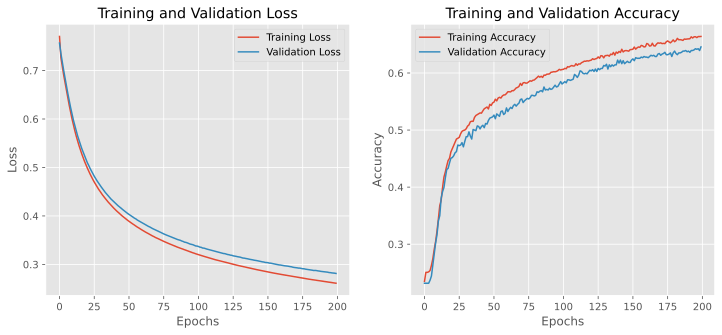

Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a SVM on the dartmouth dataset
Test Accuracy: 65.79%
              precision    recall  f1-score   support

       Angry       0.53      0.52      0.52       118
     Disgust       0.60      0.57      0.59       112
        Fear       0.60      0.45      0.51       124
       Happy       0.78      0.92      0.84       252
         Sad       0.58      0.53      0.55       121
    Surprise       0.83      0.65      0.73       115
     Neutral       0.54      0.68      0.60       114

    accuracy                           0.66       956
   macro avg       0.64      0.62      0.62       956
weighted avg       0.66      0.66      0.65       956

Precision: 0.66, Recall: 0.66, F1 Score: 0.65


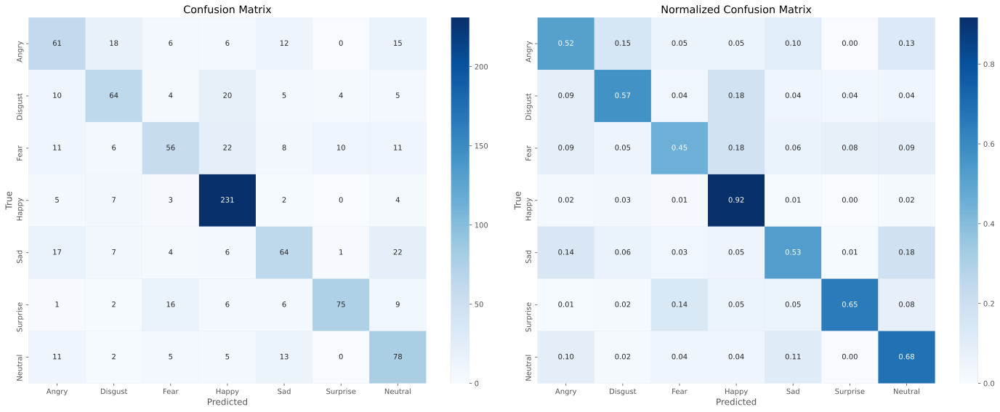

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
57,dartmouth,resnet,partial,NN,False,0.843096,0.847511,0.843096,0.843946
58,dartmouth,resnet,partial,RF,True,0.584728,0.568592,0.541771,0.549079
59,dartmouth,resnet,partial,RF,False,0.879707,0.879109,0.872054,0.874944
60,dartmouth,vit,partial,SVM,True,0.652720,0.652086,0.652720,0.648793


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9662, Accuracy: 0.1593
Validation - Loss: 1.9018, Accuracy: 0.2914
Time taken: 1.76 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9017, Accuracy: 0.2179
Validation - Loss: 1.8454, Accuracy: 0.3658
Time taken: 1.60 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8519, Accuracy: 0.2692
Validation - Loss: 1.7608, Accuracy: 0.4235
Time taken: 1.68 seconds
--------------------------------------------------
Epoch: 4/200
Training 

Epoch: 46/200
Training - Loss: 0.9023, Accuracy: 0.6931
Validation - Loss: 0.9104, Accuracy: 0.6792
Time taken: 1.92 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.8928, Accuracy: 0.6977
Validation - Loss: 0.9133, Accuracy: 0.6771
Time taken: 1.99 seconds
--------------------------------------------------
Epoch 47: No improvement in validation loss for 1 epochs.
Epoch: 48/200
Training - Loss: 0.8814, Accuracy: 0.7000
Validation - Loss: 0.9100, Accuracy: 0.6740
Time taken: 1.96 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.8631, Accuracy: 0.7080
Validation - Loss: 0.9198, Accuracy: 0.6740
Time taken: 1.59 seconds
--------------------------------------------------
Epoch 49: No improvement in validation loss for 1 epochs.
Epoch: 50/200
Training - Loss: 0.8585, Accuracy: 0.7079
Validation - Loss: 0.9009, Accuracy: 0.6803
Time taken: 1.91 seconds
--------------------------------------------------
Epoc

Epoch: 86/200
Training - Loss: 0.5939, Accuracy: 0.8032
Validation - Loss: 0.8439, Accuracy: 0.7055
Time taken: 2.13 seconds
--------------------------------------------------
Epoch 86: No improvement in validation loss for 3 epochs.
Epoch: 87/200
Training - Loss: 0.5823, Accuracy: 0.8018
Validation - Loss: 0.8227, Accuracy: 0.7055
Time taken: 2.36 seconds
--------------------------------------------------
Epoch: 88/200
Training - Loss: 0.5776, Accuracy: 0.8076
Validation - Loss: 0.8265, Accuracy: 0.7086
Time taken: 2.11 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 1 epochs.
Epoch: 89/200
Training - Loss: 0.5656, Accuracy: 0.8150
Validation - Loss: 0.8262, Accuracy: 0.7055
Time taken: 1.70 seconds
--------------------------------------------------
Epoch 89: No improvement in validation loss for 2 epochs.
Epoch: 90/200
Training - Loss: 0.5611, Accuracy: 0.8143
Validation - Loss: 0.8346, Accuracy: 0.7075
Time taken: 1.55 secon

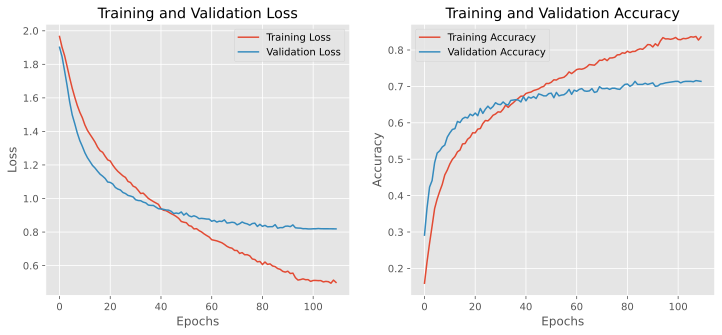

Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a NN on the dartmouth dataset
Test Accuracy: 72.91%
              precision    recall  f1-score   support

       Angry       0.63      0.64      0.64       118
     Disgust       0.69      0.74      0.72       112
        Fear       0.59      0.55      0.57       124
       Happy       0.88      0.89      0.88       252
         Sad       0.66      0.64      0.65       121
    Surprise       0.81      0.77      0.79       115
     Neutral       0.67      0.68      0.68       114

    accuracy                           0.73       956
   macro avg       0.70      0.70      0.70       956
weighted avg       0.73      0.73      0.73       956

Precision: 0.73, Recall: 0.73, F1 Score: 0.73


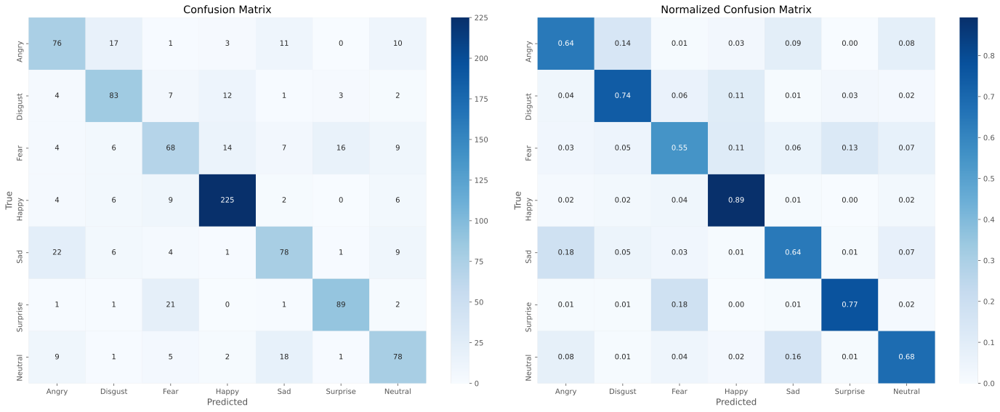

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
58,dartmouth,resnet,partial,RF,True,0.584728,0.568592,0.541771,0.549079
59,dartmouth,resnet,partial,RF,False,0.879707,0.879109,0.872054,0.874944
60,dartmouth,vit,partial,SVM,True,0.652720,0.652086,0.652720,0.648793
61,dartmouth,vit,partial,SVM,False,0.657950,0.657105,0.657950,0.652266


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 1.9608, Accuracy: 0.1560
Validation - Loss: 1.9155, Accuracy: 0.2222
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9165, Accuracy: 0.2049
Validation - Loss: 1.8752, Accuracy: 0.3470
Time taken: 1.32 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8791, Accuracy: 0.2538
Validation - Loss: 1.8214, Accuracy: 0.4046
Time taken: 1.37 seconds
--------------------------------------------------
Epoch: 4/200
Training

Epoch: 46/200
Training - Loss: 0.9430, Accuracy: 0.6807
Validation - Loss: 0.8489, Accuracy: 0.7212
Time taken: 2.08 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.9212, Accuracy: 0.6921
Validation - Loss: 0.8356, Accuracy: 0.7170
Time taken: 1.81 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.9225, Accuracy: 0.6816
Validation - Loss: 0.8266, Accuracy: 0.7159
Time taken: 1.61 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.9135, Accuracy: 0.6858
Validation - Loss: 0.8371, Accuracy: 0.7212
Time taken: 1.59 seconds
--------------------------------------------------
Epoch 49: No improvement in validation loss for 1 epochs.
Epoch: 50/200
Training - Loss: 0.8965, Accuracy: 0.6874
Validation - Loss: 0.8210, Accuracy: 0.7201
Time taken: 1.50 seconds
--------------------------------------------------
Epoch: 51/200
Training - Loss: 0.8910, Accuracy: 0.6968
Valida

Epoch: 91/200
Training - Loss: 0.6336, Accuracy: 0.7886
Validation - Loss: 0.5864, Accuracy: 0.8145
Time taken: 2.21 seconds
--------------------------------------------------
Epoch 91: No improvement in validation loss for 1 epochs.
Epoch: 92/200
Training - Loss: 0.6301, Accuracy: 0.7877
Validation - Loss: 0.5768, Accuracy: 0.8187
Time taken: 1.45 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.5980, Accuracy: 0.8025
Validation - Loss: 0.5643, Accuracy: 0.8145
Time taken: 1.69 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.6058, Accuracy: 0.8005
Validation - Loss: 0.5610, Accuracy: 0.8249
Time taken: 1.59 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.6006, Accuracy: 0.7956
Validation - Loss: 0.5567, Accuracy: 0.8249
Time taken: 1.75 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.5990, Accuracy: 0.8012
Valida

Epoch: 134/200
Training - Loss: 0.4252, Accuracy: 0.8642
Validation - Loss: 0.4252, Accuracy: 0.8742
Time taken: 1.45 seconds
--------------------------------------------------
Epoch: 135/200
Training - Loss: 0.4214, Accuracy: 0.8600
Validation - Loss: 0.4254, Accuracy: 0.8784
Time taken: 1.47 seconds
--------------------------------------------------
Epoch 135: No improvement in validation loss for 1 epochs.
Epoch: 136/200
Training - Loss: 0.4271, Accuracy: 0.8633
Validation - Loss: 0.4224, Accuracy: 0.8753
Time taken: 1.42 seconds
--------------------------------------------------
Epoch: 137/200
Training - Loss: 0.4070, Accuracy: 0.8728
Validation - Loss: 0.4267, Accuracy: 0.8721
Time taken: 1.30 seconds
--------------------------------------------------
Epoch 137: No improvement in validation loss for 1 epochs.
Epoch: 138/200
Training - Loss: 0.4306, Accuracy: 0.8553
Validation - Loss: 0.4159, Accuracy: 0.8847
Time taken: 1.43 seconds
------------------------------------------------

Epoch: 173/200
Training - Loss: 0.2937, Accuracy: 0.9064
Validation - Loss: 0.3488, Accuracy: 0.8952
Time taken: 1.71 seconds
--------------------------------------------------
Epoch: 174/200
Training - Loss: 0.3110, Accuracy: 0.9006
Validation - Loss: 0.3418, Accuracy: 0.9036
Time taken: 1.89 seconds
--------------------------------------------------
Epoch: 175/200
Training - Loss: 0.2937, Accuracy: 0.9060
Validation - Loss: 0.3533, Accuracy: 0.8973
Time taken: 1.70 seconds
--------------------------------------------------
Epoch 175: No improvement in validation loss for 1 epochs.
Epoch: 176/200
Training - Loss: 0.3034, Accuracy: 0.8995
Validation - Loss: 0.3434, Accuracy: 0.9046
Time taken: 1.56 seconds
--------------------------------------------------
Epoch 176: No improvement in validation loss for 2 epochs.
Epoch: 177/200
Training - Loss: 0.2968, Accuracy: 0.9048
Validation - Loss: 0.3549, Accuracy: 0.9004
Time taken: 1.48 seconds
------------------------------------------------

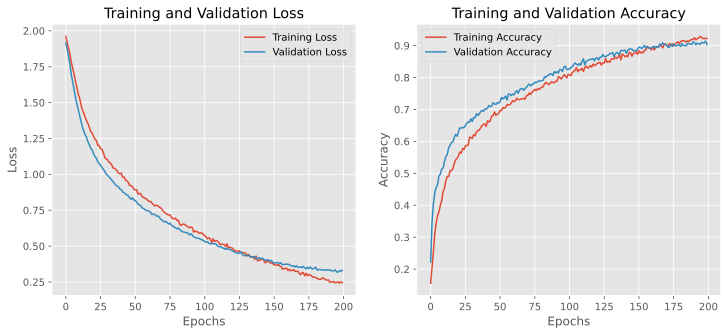

Evaluating model on test set...
Here are results for vit embeddings using partial layer training with a NN on the dartmouth dataset
Test Accuracy: 90.79%
              precision    recall  f1-score   support

       Angry       0.88      0.87      0.88       118
     Disgust       0.90      0.90      0.90       112
        Fear       0.89      0.90      0.90       124
       Happy       0.95      0.96      0.95       252
         Sad       0.95      0.79      0.86       121
    Surprise       0.96      0.92      0.94       115
     Neutral       0.80      0.96      0.88       114

    accuracy                           0.91       956
   macro avg       0.91      0.90      0.90       956
weighted avg       0.91      0.91      0.91       956

Precision: 0.91, Recall: 0.91, F1 Score: 0.91


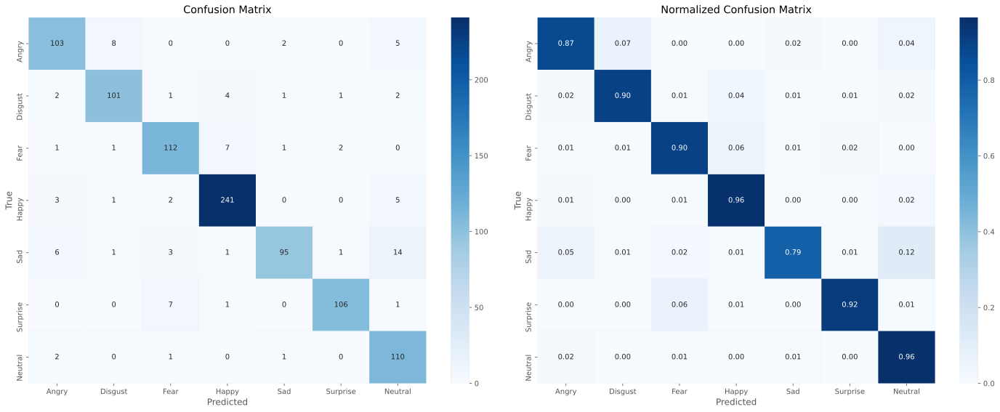

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
59,dartmouth,resnet,partial,RF,False,0.879707,0.879109,0.872054,0.874944
60,dartmouth,vit,partial,SVM,True,0.652720,0.652086,0.652720,0.648793
61,dartmouth,vit,partial,SVM,False,0.657950,0.657105,0.657950,0.652266
62,dartmouth,vit,partial,NN,True,0.729079,0.727854,0.729079,0.728168


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.72100	eval-mlogloss:1.80350
[1]	train-mlogloss:1.54775	eval-mlogloss:1.72023
[2]	train-mlogloss:1.40882	eval-mlogloss:1.66745
[3]	train-mlogloss:1.29252	eval-mlogloss:1.62250
[4]	train-mlogloss:1.19379	eval-mlogloss:1.58799
[5]	train-mlogloss:1.10627	eval-mlogloss:1.55340
[6]	train-mlogloss:1.02848	eval-mlogloss:1.52918
[7]	train-mlogloss:0.95972	eval-mlogloss:1.50502
[8]	train-mlogloss:0.89767	eval-mlogloss:1.48288
[9]	train-mlogloss:0.83612	eval-mlogloss:1.46338
[10]	train-mlogloss:0.78387	eval-mlogloss:1.44554
[11]	tr

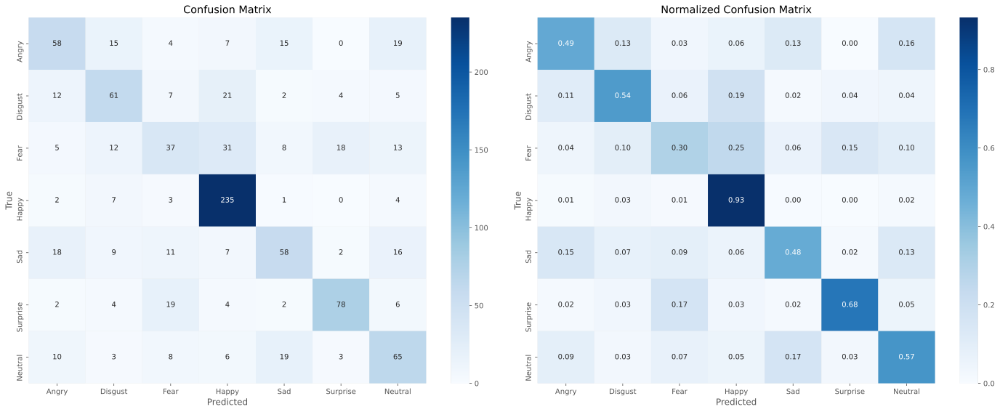

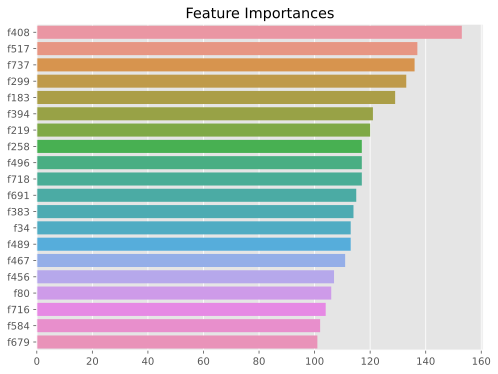

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
60,dartmouth,vit,partial,SVM,True,0.652720,0.652086,0.652720,0.648793
61,dartmouth,vit,partial,SVM,False,0.657950,0.657105,0.657950,0.652266
62,dartmouth,vit,partial,NN,True,0.729079,0.727854,0.729079,0.728168
63,dartmouth,vit,partial,NN,False,0.907950,0.911617,0.907950,0.907838


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'vit', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.59108	eval-mlogloss:1.67244
[1]	train-mlogloss:1.36543	eval-mlogloss:1.48900
[2]	train-mlogloss:1.18392	eval-mlogloss:1.33931
[3]	train-mlogloss:1.03635	eval-mlogloss:1.21958
[4]	train-mlogloss:0.91284	eval-mlogloss:1.11626
[5]	train-mlogloss:0.80575	eval-mlogloss:1.03065
[6]	train-mlogloss:0.72170	eval-mlogloss:0.96183
[7]	train-mlogloss:0.64271	eval-mlogloss:0.90267
[8]	train-mlogloss:0.58069	eval-mlogloss:0.85203
[9]	train-mlogloss:0.52386	eval-mlogloss:0.80532
[10]	train-mlogloss:0.47229	eval-mlogloss:0.76687
[11]	t

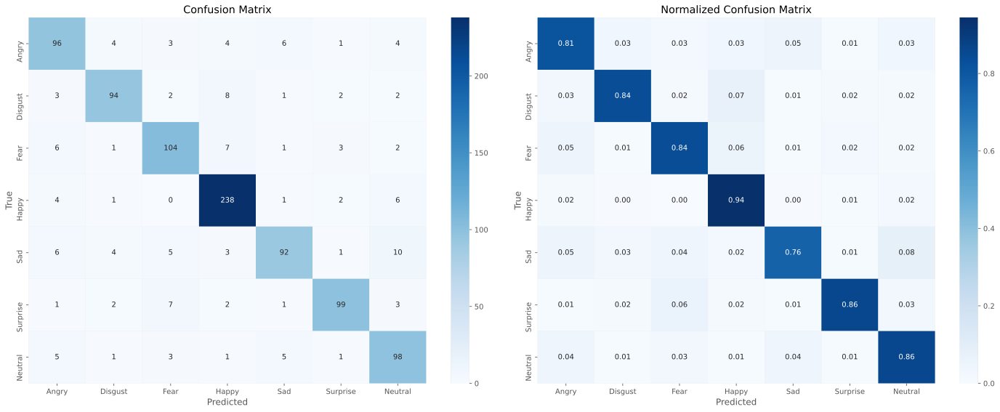

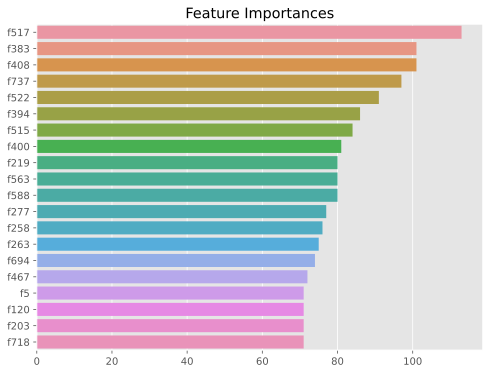

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
61,dartmouth,vit,partial,SVM,False,0.657950,0.657105,0.657950,0.652266
62,dartmouth,vit,partial,NN,True,0.729079,0.727854,0.729079,0.728168
63,dartmouth,vit,partial,NN,False,0.907950,0.911617,0.907950,0.907838
64,dartmouth,vit,partial,RF,True,0.619247,0.580859,0.570696,0.572061


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'SVM', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_efficientnet_partial_train_augmented_embeddings.npy and data/dartmouth/dartmouth_efficientnet_partial_train_augmented_labels.npy
Embeddings for val not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_efficientnet_partial_val_original_embeddings.npy and data/dartmouth/dartmouth_efficientnet_partial_val_original_labels.npy
Embeddings for test not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_efficientnet_partial_test_original_embeddings.npy and data/dartmouth/dartmouth_efficientnet_partial_test_original_labels.npy
Starting training and validation...
Epoch: 1/200
Training - L

Epoch: 43/200
Training - Loss: 0.7341, Accuracy: 0.2513
Validation - Loss: 0.7442, Accuracy: 0.2411
Time taken: 1.62 seconds
--------------------------------------------------
Epoch: 44/200
Training - Loss: 0.7336, Accuracy: 0.2513
Validation - Loss: 0.7437, Accuracy: 0.2411
Time taken: 2.09 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.7331, Accuracy: 0.2513
Validation - Loss: 0.7431, Accuracy: 0.2411
Time taken: 1.93 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.7326, Accuracy: 0.2513
Validation - Loss: 0.7426, Accuracy: 0.2411
Time taken: 1.68 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.7322, Accuracy: 0.2513
Validation - Loss: 0.7421, Accuracy: 0.2411
Time taken: 1.52 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.7317, Accuracy: 0.2513
Validation - Loss: 0.7416, Accuracy: 0.2411
Time taken: 1.45 sec

Epoch: 90/200
Training - Loss: 0.7135, Accuracy: 0.2515
Validation - Loss: 0.7210, Accuracy: 0.2411
Time taken: 1.48 seconds
--------------------------------------------------
Epoch: 91/200
Training - Loss: 0.7131, Accuracy: 0.2515
Validation - Loss: 0.7205, Accuracy: 0.2411
Time taken: 1.65 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.7127, Accuracy: 0.2515
Validation - Loss: 0.7200, Accuracy: 0.2411
Time taken: 1.63 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.7123, Accuracy: 0.2515
Validation - Loss: 0.7196, Accuracy: 0.2411
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.7119, Accuracy: 0.2515
Validation - Loss: 0.7191, Accuracy: 0.2411
Time taken: 1.96 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.7115, Accuracy: 0.2515
Validation - Loss: 0.7186, Accuracy: 0.2411
Time taken: 1.81 sec

Epoch: 137/200
Training - Loss: 0.6951, Accuracy: 0.2529
Validation - Loss: 0.6994, Accuracy: 0.2432
Time taken: 2.29 seconds
--------------------------------------------------
Epoch: 138/200
Training - Loss: 0.6947, Accuracy: 0.2529
Validation - Loss: 0.6990, Accuracy: 0.2432
Time taken: 1.88 seconds
--------------------------------------------------
Epoch: 139/200
Training - Loss: 0.6943, Accuracy: 0.2529
Validation - Loss: 0.6986, Accuracy: 0.2432
Time taken: 1.86 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.6940, Accuracy: 0.2530
Validation - Loss: 0.6981, Accuracy: 0.2432
Time taken: 1.38 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.6936, Accuracy: 0.2530
Validation - Loss: 0.6977, Accuracy: 0.2432
Time taken: 1.46 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.6932, Accuracy: 0.2531
Validation - Loss: 0.6972, Accuracy: 0.2432
Time taken: 1.

Epoch: 184/200
Training - Loss: 0.6781, Accuracy: 0.2571
Validation - Loss: 0.6793, Accuracy: 0.2537
Time taken: 1.68 seconds
--------------------------------------------------
Epoch: 185/200
Training - Loss: 0.6778, Accuracy: 0.2572
Validation - Loss: 0.6789, Accuracy: 0.2537
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 186/200
Training - Loss: 0.6774, Accuracy: 0.2574
Validation - Loss: 0.6785, Accuracy: 0.2537
Time taken: 1.83 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.6771, Accuracy: 0.2574
Validation - Loss: 0.6781, Accuracy: 0.2537
Time taken: 1.45 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.6767, Accuracy: 0.2576
Validation - Loss: 0.6776, Accuracy: 0.2537
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.6764, Accuracy: 0.2576
Validation - Loss: 0.6772, Accuracy: 0.2537
Time taken: 1.

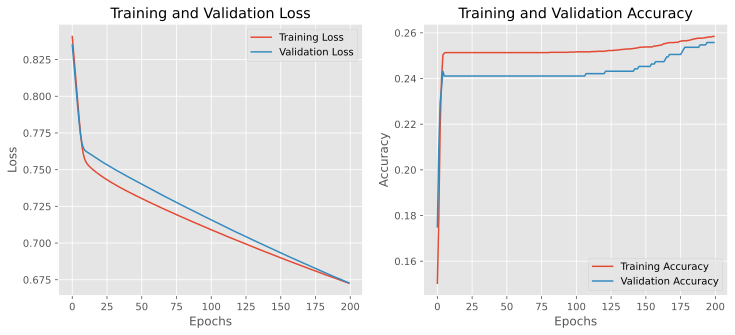

Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a SVM on the dartmouth dataset
Test Accuracy: 26.88%
              precision    recall  f1-score   support

       Angry       0.00      0.00      0.00       126
     Disgust       0.00      0.00      0.00       113
        Fear       0.50      0.02      0.03       129
       Happy       0.26      1.00      0.41       247
         Sad       0.00      0.00      0.00       117
    Surprise       0.90      0.08      0.15       113
     Neutral       0.00      0.00      0.00       111

    accuracy                           0.27       956
   macro avg       0.24      0.16      0.08       956
weighted avg       0.24      0.27      0.13       956

Precision: 0.24, Recall: 0.27, F1 Score: 0.13


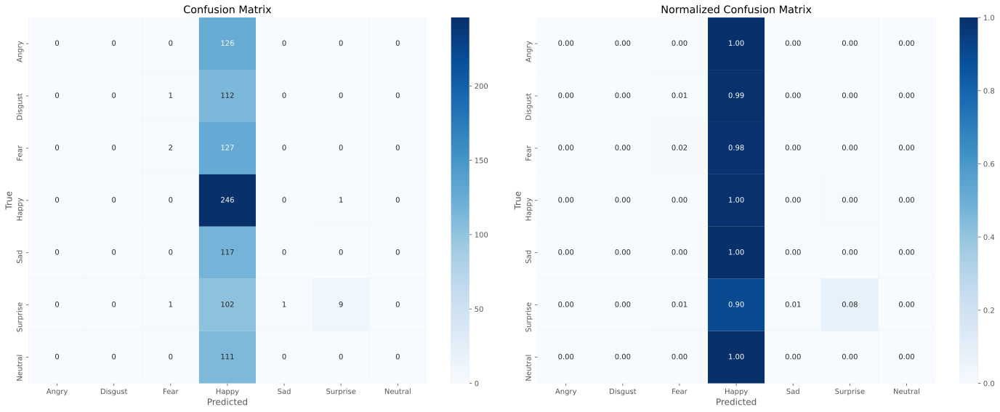

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
62,dartmouth,vit,partial,NN,True,0.729079,0.727854,0.729079,0.728168
63,dartmouth,vit,partial,NN,False,0.907950,0.911617,0.907950,0.907838
64,dartmouth,vit,partial,RF,True,0.619247,0.580859,0.570696,0.572061
65,dartmouth,vit,partial,RF,False,0.858787,0.852517,0.845264,0.847972


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'SVM', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train not found. Extracting embeddings...
Embeddings and labels saved to data/dartmouth/dartmouth_efficientnet_partial_train_original_embeddings.npy and data/dartmouth/dartmouth_efficientnet_partial_train_original_labels.npy
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 0.8168, Accuracy: 0.2264
Validation - Loss: 0.8134, Accuracy: 0.2180
Time taken: 1.26 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 0.8101, Accuracy: 0.2395
Validation - Loss: 0.8073, Accuracy: 0.2233
Time taken: 1.27 seconds
--------------------------------------------------
Epoch: 3/200
T

Epoch: 44/200
Training - Loss: 0.7397, Accuracy: 0.2509
Validation - Loss: 0.7473, Accuracy: 0.2411
Time taken: 1.33 seconds
--------------------------------------------------
Epoch: 45/200
Training - Loss: 0.7392, Accuracy: 0.2509
Validation - Loss: 0.7469, Accuracy: 0.2411
Time taken: 1.45 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.7387, Accuracy: 0.2509
Validation - Loss: 0.7465, Accuracy: 0.2411
Time taken: 2.04 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.7383, Accuracy: 0.2509
Validation - Loss: 0.7460, Accuracy: 0.2411
Time taken: 1.55 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.7378, Accuracy: 0.2509
Validation - Loss: 0.7456, Accuracy: 0.2411
Time taken: 1.21 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.7374, Accuracy: 0.2509
Validation - Loss: 0.7452, Accuracy: 0.2411
Time taken: 1.28 sec

Epoch: 91/200
Training - Loss: 0.7203, Accuracy: 0.2509
Validation - Loss: 0.7285, Accuracy: 0.2411
Time taken: 1.92 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.7199, Accuracy: 0.2509
Validation - Loss: 0.7282, Accuracy: 0.2411
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 93/200
Training - Loss: 0.7195, Accuracy: 0.2509
Validation - Loss: 0.7278, Accuracy: 0.2411
Time taken: 1.27 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.7191, Accuracy: 0.2509
Validation - Loss: 0.7274, Accuracy: 0.2411
Time taken: 1.24 seconds
--------------------------------------------------
Epoch: 95/200
Training - Loss: 0.7188, Accuracy: 0.2509
Validation - Loss: 0.7271, Accuracy: 0.2411
Time taken: 1.31 seconds
--------------------------------------------------
Epoch: 96/200
Training - Loss: 0.7184, Accuracy: 0.2509
Validation - Loss: 0.7267, Accuracy: 0.2411
Time taken: 1.72 sec

Epoch: 138/200
Training - Loss: 0.7033, Accuracy: 0.2509
Validation - Loss: 0.7120, Accuracy: 0.2411
Time taken: 1.38 seconds
--------------------------------------------------
Epoch: 139/200
Training - Loss: 0.7030, Accuracy: 0.2509
Validation - Loss: 0.7117, Accuracy: 0.2411
Time taken: 1.48 seconds
--------------------------------------------------
Epoch: 140/200
Training - Loss: 0.7026, Accuracy: 0.2509
Validation - Loss: 0.7113, Accuracy: 0.2411
Time taken: 1.62 seconds
--------------------------------------------------
Epoch: 141/200
Training - Loss: 0.7023, Accuracy: 0.2509
Validation - Loss: 0.7110, Accuracy: 0.2411
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 142/200
Training - Loss: 0.7019, Accuracy: 0.2509
Validation - Loss: 0.7107, Accuracy: 0.2411
Time taken: 1.39 seconds
--------------------------------------------------
Epoch: 143/200
Training - Loss: 0.7016, Accuracy: 0.2509
Validation - Loss: 0.7103, Accuracy: 0.2411
Time taken: 1.

Epoch: 185/200
Training - Loss: 0.6874, Accuracy: 0.2511
Validation - Loss: 0.6963, Accuracy: 0.2411
Time taken: 1.74 seconds
--------------------------------------------------
Epoch: 186/200
Training - Loss: 0.6871, Accuracy: 0.2511
Validation - Loss: 0.6960, Accuracy: 0.2411
Time taken: 1.48 seconds
--------------------------------------------------
Epoch: 187/200
Training - Loss: 0.6868, Accuracy: 0.2511
Validation - Loss: 0.6957, Accuracy: 0.2411
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 188/200
Training - Loss: 0.6864, Accuracy: 0.2511
Validation - Loss: 0.6954, Accuracy: 0.2411
Time taken: 1.31 seconds
--------------------------------------------------
Epoch: 189/200
Training - Loss: 0.6861, Accuracy: 0.2511
Validation - Loss: 0.6950, Accuracy: 0.2411
Time taken: 1.51 seconds
--------------------------------------------------
Epoch: 190/200
Training - Loss: 0.6858, Accuracy: 0.2511
Validation - Loss: 0.6947, Accuracy: 0.2411
Time taken: 1.

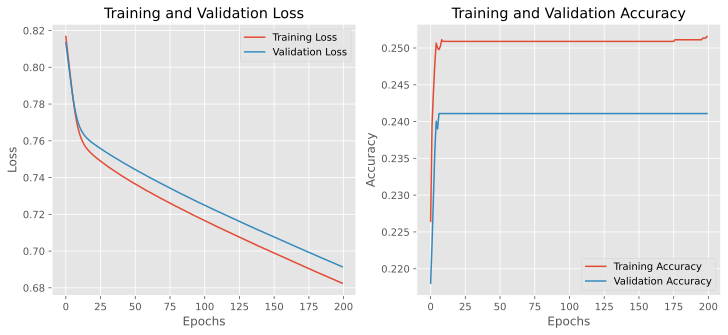

Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a SVM on the dartmouth dataset
Test Accuracy: 25.94%
              precision    recall  f1-score   support

       Angry       0.00      0.00      0.00       126
     Disgust       0.00      0.00      0.00       113
        Fear       0.00      0.00      0.00       129
       Happy       0.26      1.00      0.41       247
         Sad       0.00      0.00      0.00       117
    Surprise       1.00      0.01      0.02       113
     Neutral       0.00      0.00      0.00       111

    accuracy                           0.26       956
   macro avg       0.18      0.14      0.06       956
weighted avg       0.19      0.26      0.11       956

Precision: 0.19, Recall: 0.26, F1 Score: 0.11


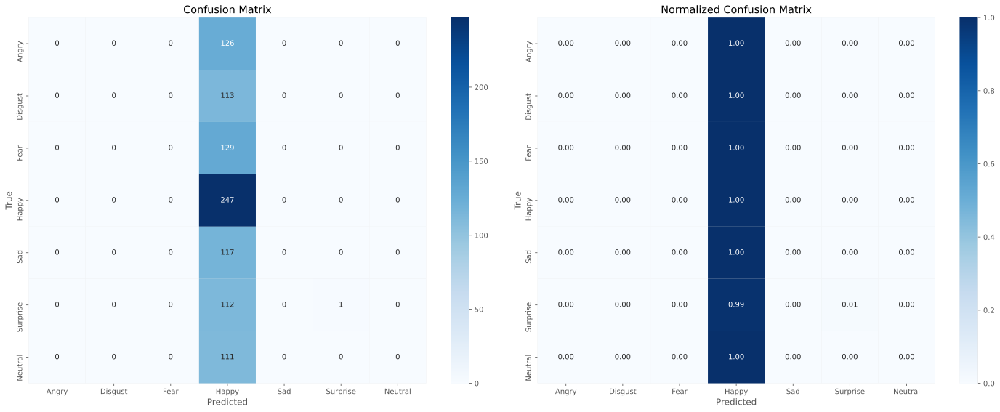

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
63,dartmouth,vit,partial,NN,False,0.907950,0.911617,0.907950,0.907838
64,dartmouth,vit,partial,RF,True,0.619247,0.580859,0.570696,0.572061
65,dartmouth,vit,partial,RF,False,0.858787,0.852517,0.845264,0.847972
66,dartmouth,efficientnet,partial,SVM,True,0.268828,0.241393,0.268828,0.128357


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'NN', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.0037, Accuracy: 0.1700
Validation - Loss: 1.8888, Accuracy: 0.3103
Time taken: 1.93 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9140, Accuracy: 0.2126
Validation - Loss: 1.8326, Accuracy: 0.3574
Time taken: 1.85 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.8678, Accuracy: 0.2461
Validation - Loss: 1.7649, Accuracy: 0.4214
Time taken: 1.79 seconds
--------------------------------------------------
Epoch: 4/200


Epoch: 44/200
Training - Loss: 0.9769, Accuracy: 0.6611
Validation - Loss: 0.9759, Accuracy: 0.6551
Time taken: 2.37 seconds
--------------------------------------------------
Epoch 44: No improvement in validation loss for 1 epochs.
Epoch: 45/200
Training - Loss: 0.9567, Accuracy: 0.6652
Validation - Loss: 0.9642, Accuracy: 0.6625
Time taken: 2.21 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.9422, Accuracy: 0.6785
Validation - Loss: 0.9640, Accuracy: 0.6719
Time taken: 2.04 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.9372, Accuracy: 0.6758
Validation - Loss: 0.9587, Accuracy: 0.6646
Time taken: 1.95 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.9267, Accuracy: 0.6763
Validation - Loss: 0.9582, Accuracy: 0.6625
Time taken: 1.87 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.9221, Accuracy: 0.6804
Valida

Epoch: 85/200
Training - Loss: 0.6687, Accuracy: 0.7741
Validation - Loss: 0.8675, Accuracy: 0.7159
Time taken: 2.30 seconds
--------------------------------------------------
Epoch 85: No improvement in validation loss for 3 epochs.
Epoch: 86/200
Training - Loss: 0.6681, Accuracy: 0.7709
Validation - Loss: 0.8744, Accuracy: 0.7044
Time taken: 1.77 seconds
--------------------------------------------------
Epoch 86: No improvement in validation loss for 4 epochs.
Epoch: 87/200
Training - Loss: 0.6736, Accuracy: 0.7689
Validation - Loss: 0.8573, Accuracy: 0.7159
Time taken: 1.74 seconds
--------------------------------------------------
Epoch: 88/200
Training - Loss: 0.6696, Accuracy: 0.7739
Validation - Loss: 0.8653, Accuracy: 0.7075
Time taken: 2.19 seconds
--------------------------------------------------
Epoch 88: No improvement in validation loss for 1 epochs.
Epoch: 89/200
Training - Loss: 0.6563, Accuracy: 0.7789
Validation - Loss: 0.8527, Accuracy: 0.7180
Time taken: 1.67 secon

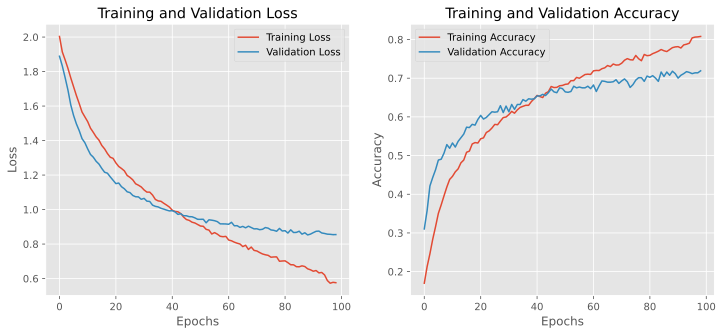

Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a NN on the dartmouth dataset
Test Accuracy: 75.73%
              precision    recall  f1-score   support

       Angry       0.79      0.70      0.74       126
     Disgust       0.70      0.75      0.73       113
        Fear       0.66      0.55      0.60       129
       Happy       0.87      0.90      0.89       247
         Sad       0.68      0.62      0.65       117
    Surprise       0.78      0.82      0.80       113
     Neutral       0.68      0.82      0.75       111

    accuracy                           0.76       956
   macro avg       0.74      0.74      0.74       956
weighted avg       0.76      0.76      0.75       956

Precision: 0.76, Recall: 0.76, F1 Score: 0.75


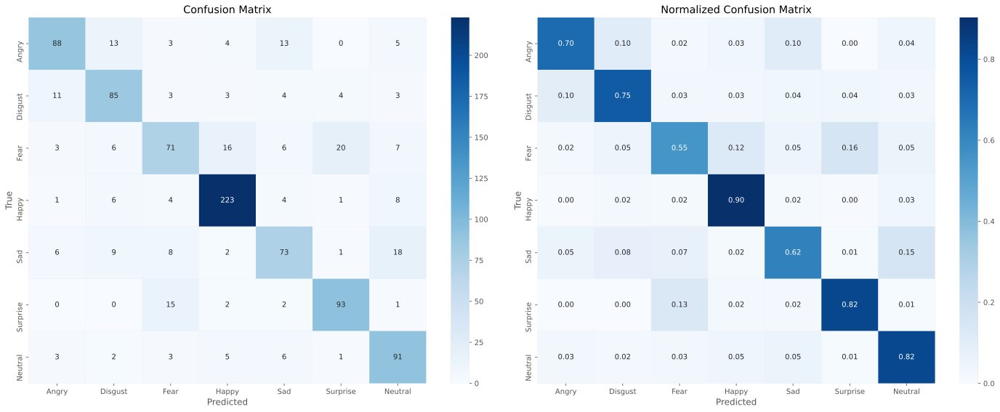

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
64,dartmouth,vit,partial,RF,True,0.619247,0.580859,0.570696,0.572061
65,dartmouth,vit,partial,RF,False,0.858787,0.852517,0.845264,0.847972
66,dartmouth,efficientnet,partial,SVM,True,0.268828,0.241393,0.268828,0.128357
67,dartmouth,efficientnet,partial,SVM,False,0.259414,0.185025,0.259414,0.108258


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'NN', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
Epoch: 1/200
Training - Loss: 2.0279, Accuracy: 0.1616
Validation - Loss: 1.9097, Accuracy: 0.2495
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 2/200
Training - Loss: 1.9385, Accuracy: 0.1872
Validation - Loss: 1.8719, Accuracy: 0.3428
Time taken: 1.50 seconds
--------------------------------------------------
Epoch: 3/200
Training - Loss: 1.9025, Accuracy: 0.2222
Validation - Loss: 1.8371, Accuracy: 0.3878
Time taken: 1.55 seconds
--------------------------------------------------
Epoch: 4/200

Epoch: 45/200
Training - Loss: 0.9369, Accuracy: 0.6789
Validation - Loss: 0.8287, Accuracy: 0.7317
Time taken: 1.62 seconds
--------------------------------------------------
Epoch: 46/200
Training - Loss: 0.9303, Accuracy: 0.6775
Validation - Loss: 0.8189, Accuracy: 0.7275
Time taken: 1.49 seconds
--------------------------------------------------
Epoch: 47/200
Training - Loss: 0.9037, Accuracy: 0.6885
Validation - Loss: 0.8013, Accuracy: 0.7180
Time taken: 1.57 seconds
--------------------------------------------------
Epoch: 48/200
Training - Loss: 0.9006, Accuracy: 0.6867
Validation - Loss: 0.7905, Accuracy: 0.7327
Time taken: 1.53 seconds
--------------------------------------------------
Epoch: 49/200
Training - Loss: 0.8737, Accuracy: 0.7047
Validation - Loss: 0.7866, Accuracy: 0.7400
Time taken: 1.43 seconds
--------------------------------------------------
Epoch: 50/200
Training - Loss: 0.8591, Accuracy: 0.7069
Validation - Loss: 0.7651, Accuracy: 0.7474
Time taken: 1.38 sec

Epoch: 90/200
Training - Loss: 0.5655, Accuracy: 0.8092
Validation - Loss: 0.5248, Accuracy: 0.8407
Time taken: 1.54 seconds
--------------------------------------------------
Epoch 90: No improvement in validation loss for 1 epochs.
Epoch: 91/200
Training - Loss: 0.5557, Accuracy: 0.8164
Validation - Loss: 0.5116, Accuracy: 0.8365
Time taken: 1.58 seconds
--------------------------------------------------
Epoch: 92/200
Training - Loss: 0.5573, Accuracy: 0.8153
Validation - Loss: 0.5139, Accuracy: 0.8291
Time taken: 1.46 seconds
--------------------------------------------------
Epoch 92: No improvement in validation loss for 1 epochs.
Epoch: 93/200
Training - Loss: 0.5343, Accuracy: 0.8261
Validation - Loss: 0.5039, Accuracy: 0.8470
Time taken: 1.44 seconds
--------------------------------------------------
Epoch: 94/200
Training - Loss: 0.5378, Accuracy: 0.8225
Validation - Loss: 0.4960, Accuracy: 0.8407
Time taken: 1.94 seconds
--------------------------------------------------
Epoc

Epoch: 132/200
Training - Loss: 0.3573, Accuracy: 0.8918
Validation - Loss: 0.3744, Accuracy: 0.8816
Time taken: 1.62 seconds
--------------------------------------------------
Epoch: 133/200
Training - Loss: 0.3671, Accuracy: 0.8822
Validation - Loss: 0.3685, Accuracy: 0.8878
Time taken: 1.71 seconds
--------------------------------------------------
Epoch: 134/200
Training - Loss: 0.3445, Accuracy: 0.8961
Validation - Loss: 0.3667, Accuracy: 0.8931
Time taken: 1.87 seconds
--------------------------------------------------
Epoch: 135/200
Training - Loss: 0.3409, Accuracy: 0.8972
Validation - Loss: 0.3702, Accuracy: 0.8868
Time taken: 1.73 seconds
--------------------------------------------------
Epoch 135: No improvement in validation loss for 1 epochs.
Epoch: 136/200
Training - Loss: 0.3558, Accuracy: 0.8829
Validation - Loss: 0.3667, Accuracy: 0.8910
Time taken: 1.56 seconds
--------------------------------------------------
Epoch 136: No improvement in validation loss for 2 epoch

Epoch: 171/200
Training - Loss: 0.2560, Accuracy: 0.9228
Validation - Loss: 0.3052, Accuracy: 0.9119
Time taken: 2.08 seconds
--------------------------------------------------
Epoch 171: No improvement in validation loss for 2 epochs.
Epoch: 172/200
Training - Loss: 0.2554, Accuracy: 0.9192
Validation - Loss: 0.3108, Accuracy: 0.9067
Time taken: 1.68 seconds
--------------------------------------------------
Epoch 172: No improvement in validation loss for 3 epochs.
Epoch: 173/200
Training - Loss: 0.2526, Accuracy: 0.9201
Validation - Loss: 0.3097, Accuracy: 0.9109
Time taken: 1.35 seconds
--------------------------------------------------
Epoch 173: No improvement in validation loss for 4 epochs.
Epoch: 174/200
Training - Loss: 0.2486, Accuracy: 0.9199
Validation - Loss: 0.3054, Accuracy: 0.9119
Time taken: 1.43 seconds
--------------------------------------------------
Epoch 174: No improvement in validation loss for 5 epochs.
Epoch: 175/200
Training - Loss: 0.2546, Accuracy: 0.9259

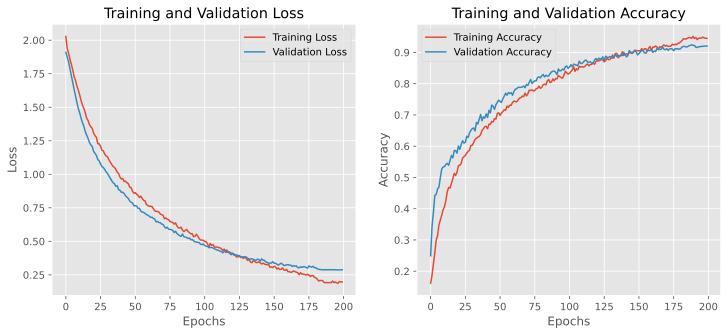

Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a NN on the dartmouth dataset
Test Accuracy: 91.74%
              precision    recall  f1-score   support

       Angry       0.90      0.93      0.91       126
     Disgust       0.87      0.88      0.87       113
        Fear       0.92      0.84      0.88       129
       Happy       0.96      0.97      0.96       247
         Sad       0.88      0.91      0.89       117
    Surprise       0.95      0.95      0.95       113
     Neutral       0.89      0.91      0.90       111

    accuracy                           0.92       956
   macro avg       0.91      0.91      0.91       956
weighted avg       0.92      0.92      0.92       956

Precision: 0.92, Recall: 0.92, F1 Score: 0.92


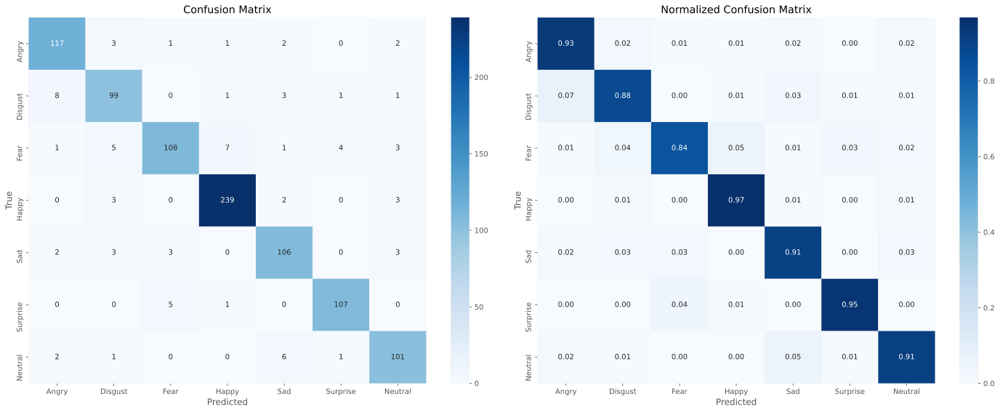

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
65,dartmouth,vit,partial,RF,False,0.858787,0.852517,0.845264,0.847972
66,dartmouth,efficientnet,partial,SVM,True,0.268828,0.241393,0.268828,0.128357
67,dartmouth,efficientnet,partial,SVM,False,0.259414,0.185025,0.259414,0.108258
68,dartmouth,efficientnet,partial,NN,True,0.757322,0.755845,0.757322,0.754452


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'RF', 'augment_data': True}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.70056	eval-mlogloss:1.81589
[1]	train-mlogloss:1.52600	eval-mlogloss:1.73380
[2]	train-mlogloss:1.38322	eval-mlogloss:1.67370
[3]	train-mlogloss:1.26317	eval-mlogloss:1.62619
[4]	train-mlogloss:1.16276	eval-mlogloss:1.58183
[5]	train-mlogloss:1.07104	eval-mlogloss:1.54490
[6]	train-mlogloss:0.98870	eval-mlogloss:1.50503
[7]	train-mlogloss:0.92076	eval-mlogloss:1.47404
[8]	train-mlogloss:0.85798	eval-mlogloss:1.44914
[9]	train-mlogloss:0.80180	eval-mlogloss:1.43046
[10]	train-mlogloss:0.74799	eval-mlogloss:1.4080

[154]	train-mlogloss:0.00583	eval-mlogloss:1.11411
[155]	train-mlogloss:0.00576	eval-mlogloss:1.11350
[156]	train-mlogloss:0.00569	eval-mlogloss:1.11427
[157]	train-mlogloss:0.00562	eval-mlogloss:1.11488
[158]	train-mlogloss:0.00556	eval-mlogloss:1.11453
[159]	train-mlogloss:0.00549	eval-mlogloss:1.11410
[160]	train-mlogloss:0.00543	eval-mlogloss:1.11430
[161]	train-mlogloss:0.00537	eval-mlogloss:1.11357
[162]	train-mlogloss:0.00531	eval-mlogloss:1.11387
[163]	train-mlogloss:0.00525	eval-mlogloss:1.11323
[164]	train-mlogloss:0.00519	eval-mlogloss:1.11289
[165]	train-mlogloss:0.00513	eval-mlogloss:1.11241
[166]	train-mlogloss:0.00508	eval-mlogloss:1.11176
[167]	train-mlogloss:0.00502	eval-mlogloss:1.11335
Evaluating model on test set...
Here are results for efficientnet embeddings using partial layer training with a RF on the dartmouth dataset
Test Accuracy: 0.6496
              precision    recall  f1-score   support

       Angry       0.74      0.61      0.67       126
     Disgust  

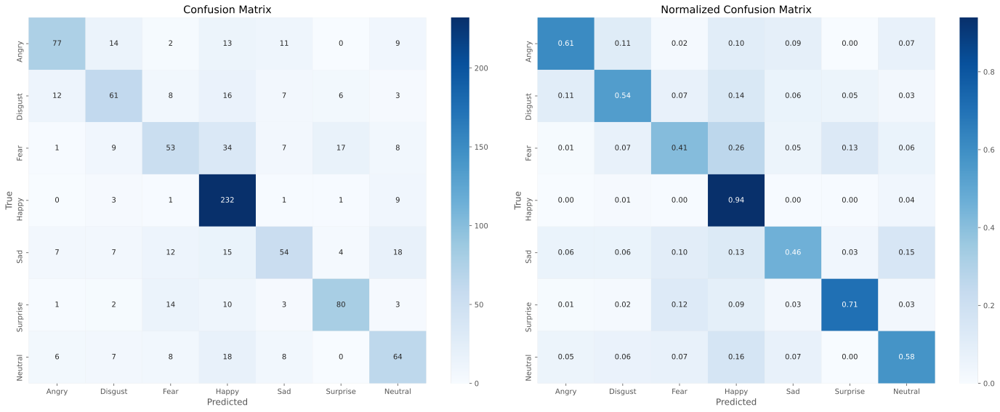

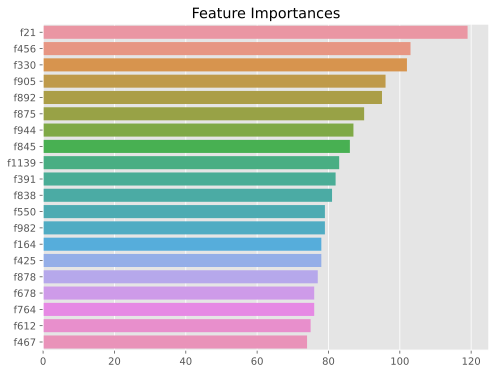

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
66,dartmouth,efficientnet,partial,SVM,True,0.268828,0.241393,0.268828,0.128357
67,dartmouth,efficientnet,partial,SVM,False,0.259414,0.185025,0.259414,0.108258
68,dartmouth,efficientnet,partial,NN,True,0.757322,0.755845,0.757322,0.754452
69,dartmouth,efficientnet,partial,NN,False,0.917364,0.917627,0.917364,0.917151


Running experiment with args: {'dataset_name': 'dartmouth', 'training_type': 'partial', 'model_arch': 'efficientnet', 'classifier': 'RF', 'augment_data': False}
Loading dataset from data/dartmouth/dartmouth_preprocessed.h5...
Embeddings for train found. Loaded previously extracted embeddings.
Embeddings for val found. Loaded previously extracted embeddings.
Embeddings for test found. Loaded previously extracted embeddings.
Starting training and validation...
[0]	train-mlogloss:1.61134	eval-mlogloss:1.67729
[1]	train-mlogloss:1.37379	eval-mlogloss:1.48308
[2]	train-mlogloss:1.18263	eval-mlogloss:1.33006
[3]	train-mlogloss:1.03595	eval-mlogloss:1.21014
[4]	train-mlogloss:0.91034	eval-mlogloss:1.10561
[5]	train-mlogloss:0.80614	eval-mlogloss:1.01976
[6]	train-mlogloss:0.72186	eval-mlogloss:0.95352
[7]	train-mlogloss:0.64106	eval-mlogloss:0.88596
[8]	train-mlogloss:0.57146	eval-mlogloss:0.82541
[9]	train-mlogloss:0.51810	eval-mlogloss:0.78556
[10]	train-mlogloss:0.46468	eval-mlogloss:0.742

[154]	train-mlogloss:0.00397	eval-mlogloss:0.30805
[155]	train-mlogloss:0.00394	eval-mlogloss:0.30805
[156]	train-mlogloss:0.00392	eval-mlogloss:0.30762
[157]	train-mlogloss:0.00390	eval-mlogloss:0.30759
[158]	train-mlogloss:0.00387	eval-mlogloss:0.30751
[159]	train-mlogloss:0.00385	eval-mlogloss:0.30753
[160]	train-mlogloss:0.00383	eval-mlogloss:0.30753
[161]	train-mlogloss:0.00381	eval-mlogloss:0.30722
[162]	train-mlogloss:0.00379	eval-mlogloss:0.30725
[163]	train-mlogloss:0.00377	eval-mlogloss:0.30723
[164]	train-mlogloss:0.00375	eval-mlogloss:0.30674
[165]	train-mlogloss:0.00373	eval-mlogloss:0.30706
[166]	train-mlogloss:0.00371	eval-mlogloss:0.30703
[167]	train-mlogloss:0.00369	eval-mlogloss:0.30683
[168]	train-mlogloss:0.00367	eval-mlogloss:0.30684
[169]	train-mlogloss:0.00365	eval-mlogloss:0.30694
[170]	train-mlogloss:0.00363	eval-mlogloss:0.30694
[171]	train-mlogloss:0.00361	eval-mlogloss:0.30728
[172]	train-mlogloss:0.00359	eval-mlogloss:0.30768
[173]	train-mlogloss:0.00357	ev

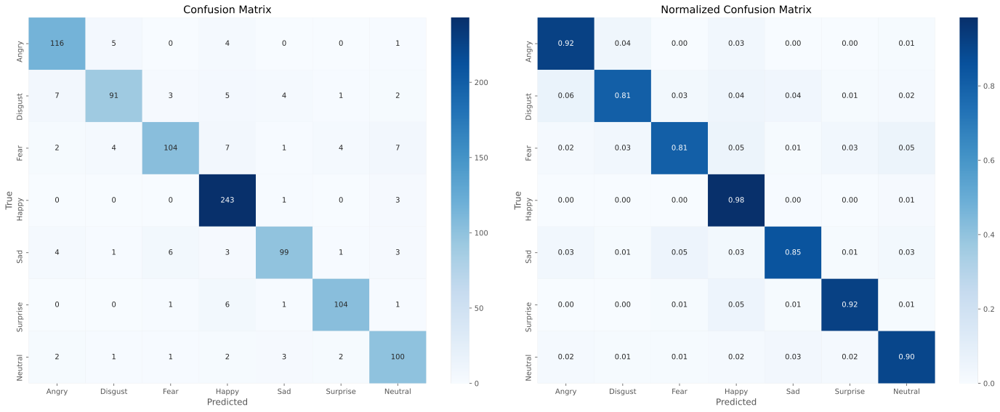

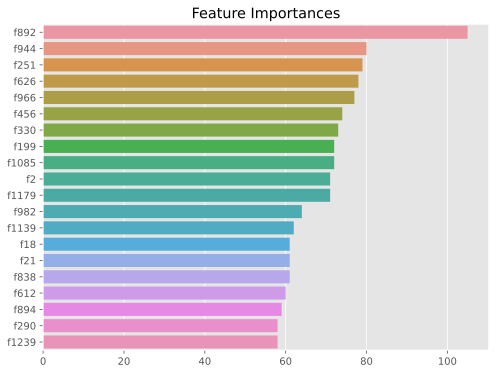

,Dataset,Model Architecture,Training Type,Classifier Type,Augment Data,Accuracy,Precision,Recall,F1 Score
0,fer,resnet,full,SVM,True,0.462110,0.444964,0.462110,0.447514
1,fer,resnet,full,SVM,False,0.478640,0.464013,0.478640,0.463323
2,fer,resnet,full,NN,True,0.480869,0.484888,0.480869,0.476634
3,fer,resnet,full,NN,False,0.548105,0.546196,0.548105,0.541592
4,fer,resnet,full,RF,True,0.520059,0.568874,0.472492,0.493434
...,...,...,...,...,...,...,...,...,...
67,dartmouth,efficientnet,partial,SVM,False,0.259414,0.185025,0.259414,0.108258
68,dartmouth,efficientnet,partial,NN,True,0.757322,0.755845,0.757322,0.754452
69,dartmouth,efficientnet,partial,NN,False,0.917364,0.917627,0.917364,0.917151
70,dartmouth,efficientnet,partial,RF,True,0.649582,0.636482,0.606734,0.615229


In [552]:
datasets = ["fer", "dartmouth"]
training_types = ["full", "partial"]
model_archs = ["resnet", "vit", "efficientnet"]
classifiers = ["SVM", "NN", "RF"]
augmentations = [True, False]
df = pd.DataFrame({})

# Initialize a list to collect results
results_list = []

# Loop over each combination of parameters
for dataset_name in datasets:
    for training_type in training_types:
        for model_arch in model_archs:
            for classifier in classifiers:
                for augment_data in augmentations:
                    # Define args for this combination
                    args = {
                        "dataset_name": dataset_name,
                        "training_type": training_type,
                        "model_arch": model_arch,
                        "classifier": classifier,
                        "augment_data": augment_data,
                    }
                    # Run the experiment
                    print(f"Running experiment with args: {args}")
                    try:
                        # Assuming run function now returns test_metrics or similar results
                        metrics = run(args, config)
                        df = append_results(df,dataset_name, model_arch, training_type, classifier, augment_data,
                                            *metrics)
                    except Exception as e:
                        print(f"An error occurred: {e}")
                        # Optionally, record the failed attempt or handle the error as needed
                        results_list.append({**args, "error": str(e)})
                        
                    display(df)

In [557]:
df.to_csv("results.csv")

In [ ]:
# dataset = datasets["val"]
# random_indices = random.sample(range(dataset.__len__()), 5)

# plt.figure(figsize=(15, 3))  
# for i, idx in enumerate(random_indices, 1):
#     img, label = dataset.__getitem__(idx)
#     img = np.array(img).transpose((1, 2, 0))
#     img = np.clip(img, 0, 1)
#     print(label)
    
#     plt.subplot(1, 5, i)  
#     plt.imshow(img)
#     plt.title(f"Index: {idx}")
#     plt.axis('off')

# plt.show()